In [251]:
import numpy as np
np.set_printoptions(precision=4, suppress=True)
import matplotlib.pyplot as plt
# import random
import sys
""" 
Observation:
    Type: Box(4)
    Num     Observation               Min                     Max
    0       Cart Position             -4.8                    4.8
    1       Cart Velocity             -Inf                    Inf
    2       Pole Angle                -0.418 rad (-24 deg)    0.418 rad (24 deg)
    3       Pole Angular Velocity     -Inf                    Inf
Actions:
    Type: Discrete(2)
    Num   Action
    0     Push cart to the left
    1     Push cart to the right
    Note: The amount the velocity that is reduced or increased is not
    fixed; it depends on the angle the pole is pointing. This is because
    the center of gravity of the pole increases the amount of energy needed
    to move the cart underneath it
Reward:
    Reward is 1 for every step taken, including the termination step
Starting State:
    All observations are assigned a uniform random value in [-0.05..0.05]
Episode Termination:
    Pole Angle is more than 12 degrees.
    Cart Position is more than 2.4 (center of the cart reaches the edge of
    the display).
    Episode length is greater than 200.
    Solved Requirements:
    Considered solved when the average return is greater than or equal to
    195.0 over 100 consecutive trials.
"""

X_range = [-4.8, 4.8]
v_range = [-100, 100]#[-100000, 100000] #[float('-inf'), float('inf')]
theta_range = [-24, 24]
anglev_range = [-10, 10] #[-100000, 100000]#[float('-inf'), float('inf')]
start_range = [-0.05, 0.05]

terminating_cond =[2.4, 12, 200]

action_set = [0,1] #left, right

M = 3 # dimensionality of the fourier transform
softmax_sigma = 0.1
# gamma = 1

In [252]:
def in_radian(ang):
    return ang*np.pi/180

In [253]:
def transition(action, x, x_dot, theta, theta_dot):
    gravity = 9.8
    masscart = 1.0
    masspole = 0.1
    total_mass = masspole + masscart
    length = 0.5  # actually half the pole's length
    polemass_length = masspole * length
    force_mag = 10.0
    tau = 0.02

    force = force_mag if action == 1 else -force_mag
    costheta = np.cos(theta) # theta in radians
    sintheta = np.sin(theta)

    # from gym https://github.com/openai/gym/blob/master/gym/envs/classic_control/cartpole.py
    temp = (force + polemass_length * theta_dot ** 2 * sintheta) / total_mass
    thetaacc = (gravity * sintheta - costheta * temp) / (length * (4.0 / 3.0 - masspole * costheta ** 2 / total_mass))
    xacc = temp - polemass_length * thetaacc * costheta / total_mass
    
    #euler
    x = x + tau * x_dot
    x_dot = x_dot + tau * xacc
    theta = theta + tau * theta_dot
    theta_dot = theta_dot + tau * thetaacc
    
    #semi euler
    # x_dot = x_dot + tau * xacc
    # x = x + tau * x_dot
    # theta_dot = theta_dot + tau * thetaacc
    # theta = theta + tau * theta_dot

    return x, x_dot, theta, theta_dot

In [254]:
def is_terminating(x, x_dot, theta, theta_dot, step):
    if x <= -terminating_cond[0] or x >= terminating_cond[0] or theta <= -in_radian(terminating_cond[1]) or theta >= in_radian(terminating_cond[1]) or step>=terminating_cond[2]:
        return True
    return False

In [255]:
def reward(x, x_dot, theta, theta_dot, step):
    if is_terminating(x, x_dot, theta, theta_dot, step):
        return 0
    return 1

In [256]:
def normalize(x, x_dot, theta, theta_dot, cosineflag=True):
    if cosineflag:
        x = (x-X_range[0])/(X_range[1]-X_range[0])
        theta = (theta-theta_range[0])/(theta_range[1]-theta_range[0])
        x_dot = (x_dot - v_range[0])/(v_range[1] - v_range[0])
        theta_dot = (theta_dot - anglev_range[0])/(anglev_range[1] - anglev_range[0])
        
    else:
        x = 2*(x-X_range[0])/(X_range[1]-X_range[0]) -1
        theta = 2*(theta-theta_range[0])/(theta_range[1]-theta_range[0]) -1
        x_dot = 2*(x_dot - v_range[0])/(v_range[1] - v_range[0]) -1
        theta_dot = 2*(theta_dot - anglev_range[0])/(anglev_range[1] - anglev_range[0]) -1

    return  x, x_dot, theta, theta_dot

In [257]:
def fourier(x, x_dot, theta, theta_dot, cosineflag=True): #4M+1 features
    #normalize
    x, x_dot, theta, theta_dot = normalize(x, x_dot, theta, theta_dot, cosineflag)
    phi = [1]
    if cosineflag:
        for i in range(1, M+1):
            phi.append(np.cos(i*np.pi*x))
        for i in range(1, M+1):
            phi.append(np.cos(i*np.pi*x_dot))
        for i in range(1, M+1):
            phi.append(np.cos(i*np.pi*theta))
        for i in range(1, M+1):
            phi.append(np.cos(i*np.pi*theta_dot))
    else:
        for i in range(1, M+1):
            phi.append(np.sin(i*np.pi*x))
        for i in range(1, M+1):
            phi.append(np.sin(i*np.pi*x_dot))
        for i in range(1, M+1):
            phi.append(np.sin(i*np.pi*theta))
        for i in range(1, M+1):
            phi.append(np.sin(i*np.pi*theta_dot))
    return np.array(phi)

In [258]:
def softmax_action(policy_params, x, x_dot, theta, theta_dot):
    
    phi_s = fourier(x, x_dot, theta, theta_dot, False) # (4M+1, )
    # print(policy_params.shape, phi_s.shape)
    policy_val = np.dot(policy_params.T, phi_s) #(4M,1) (4M+1, 2)
#     if np.sum(policy_val)< np.sum([-6064.8965 -6317.6113]):
#         print("Policy val: ",policy_val)
    policy_exp = np.exp(softmax_sigma*policy_val)
    
    iter_count = 0
    while(np.sum(policy_exp)==0):
        print("Adding softmax terms.")
        iter_count += 1
        policy_exp = np.exp(np.power(softmax_sigma, iter_count)*policy_val)
    
    policy_exp /= np.sum(policy_exp)
    
#     for i in range(len(policy_exp)):
#         if np.isnan(policy_exp[i]):
#             policy_exp[i] = 0.0
#     if True in np.isnan(policy_exp):
#         print(policy_exp)
#         for i in range(len(policy_exp)):
#             if np.isnan(policy_exp[i]):
#                 policy_exp[i] = 0.0
#             else:
#                 policy_exp[i] = 1.0
#     policy_exp /= np.sum(policy_exp)
#     print(policy_exp, x, x_dot, theta, theta_dot)

    return policy_exp #(2, )

In [259]:
def REINFORCE(alpha_w, alpha_theta, algo_type='without_baseline', gamma=1.0):
    policy_params = np.random.normal(0, 0.1, (4*M+1,len(action_set))) #np.ones((4*M+1,len(action_set)))*(-0.01)
    value_params = np.ones(4*M+1)*0.01
    episode_length = []

    for iter in range(3000):
        policy_params_temp = policy_params.copy()
        #run episode
        #initial state
        x = np.random.uniform(start_range[0], start_range[1])
        theta = np.random.uniform(start_range[0], start_range[1])
        x_dot  = np.random.uniform(start_range[0], start_range[1])
        theta_dot = np.random.uniform(start_range[0], start_range[1])
        step = 1
        state_list, action_list, reward_list = [], [], []

        #run epsidoe
        while not is_terminating(x, x_dot, theta, theta_dot, step):
            #choose action
            curr_action = np.random.choice([0,1], p=list(softmax_action(policy_params, x, x_dot, theta, theta_dot)))
            # np.argmax(softmax_action(policy_params, x, x_dot, theta, theta_dot))
            # 
            #
            
            #next state
            next_x, next_x_dot, next_theta, mext_theta_dot = transition(curr_action, x, x_dot, theta, theta_dot)
            #reward
            curr_reward = reward(next_x, next_x_dot, next_theta, mext_theta_dot, step)
            step += 1

            state_list.append([x, x_dot, theta, theta_dot])
            action_list.append(curr_action)
            reward_list.append(curr_reward)
            x, x_dot, theta, theta_dot = next_x, next_x_dot, next_theta, mext_theta_dot
        print(np.array(state_list))
        print(action_list)
        print("\n EPISODE LENGTH: ",len(reward_list), "CURR ITER: ", iter)
        
        #n step return
        return_list = np.zeros(len(reward_list))
        return_list[-1] = reward_list[-1]
        T = len(reward_list)
        for i in range(T-2, -1, -1):
            return_list[i] = reward_list[i] + gamma*return_list[i+1]
        episode_length.append(return_list[0]) #to plot avg return ~= episode length

        #loop through episode
        for t in range(T):
            x, x_dot, theta, theta_dot = state_list[t]
            curr_action = action_list[t]
            phi_s = fourier(x, x_dot, theta, theta_dot, False) #state feature representation

            if algo_type =='without_baseline':
                delta = return_list[t]
#                 print("Delta: ", delta)
            elif algo_type == 'with_baseline':
                val_w_s = np.dot(value_params,phi_s)
                delta = return_list[t] - val_w_s

            #policy params update
            policy = softmax_action(policy_params, x, x_dot, theta, theta_dot)
            if curr_action == 0:
                policy_params[:,0] += alpha_theta*delta*(1-policy[0])*phi_s
                policy_params[:,1] += alpha_theta*delta*(-1*policy[0])*phi_s
                # print(curr_action, delta, policy)
            if curr_action == 1:
                policy_params[:,0] += alpha_theta*delta*(-policy[1])*phi_s
                policy_params[:,1] += alpha_theta*delta*(1-policy[1])*phi_s
                # print(curr_action, delta, policy)

            #value params update
            if algo_type == 'with_baseline':
                value_params += alpha_w*delta*phi_s
        print("Mean episode length: ",np.mean(episode_length[max(0, iter-100): iter+1]))
        if np.mean(episode_length[max(0, iter-100): iter+1]) > 195.0:
            print("Hooray... solved")
            break
        max_diff = np.max(np.abs(policy_params_temp - policy_params))
        print(" Max diff: ",max_diff)
        if max_diff/alpha_theta < 0.1: # 0.001 works with 1e-6 policy_step
            break
    print("Episode: ",episode_length)
    print("Mean episode length: ",np.mean(episode_length[max(0, iter-100): iter+1]))
    plt.figure()
    plt.plot(np.arange(len(episode_length)), episode_length)
    plt.xlabel('Iterations')
    plt.ylabel('Avg. return')
    # plt.ylim([-100, 1000])
    plt.savefig('graph_cartpole_reinforce_'+str(algo_type))



[[-0.0266  0.0178  0.0145 -0.0118]
 [-0.0263  0.2127  0.0143 -0.2998]
 [-0.022   0.4076  0.0083 -0.588 ]
 [-0.0138  0.6026 -0.0034 -0.878 ]
 [-0.0018  0.4076 -0.021  -0.5864]
 [ 0.0064  0.603  -0.0327 -0.8856]
 [ 0.0184  0.7985 -0.0504 -1.1884]
 [ 0.0344  0.9943 -0.0742 -1.4965]
 [ 0.0543  1.1902 -0.1041 -1.8114]
 [ 0.0781  1.3863 -0.1404 -2.1345]
 [ 0.1058  1.1928 -0.1831 -1.8883]]
[1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]

 EPISODE LENGTH:  11 CURR ITER:  0
Mean episode length:  10.0
 Max diff:  0.011775790378662082
[[ 0.0094  0.0158  0.0155  0.0183]
 [ 0.0097 -0.1796  0.0159  0.3159]
 [ 0.0061 -0.3749  0.0222  0.6135]
 [-0.0014 -0.5704  0.0345  0.9131]
 [-0.0128 -0.7659  0.0527  1.2164]
 [-0.0281 -0.9617  0.077   1.5251]
 [-0.0473 -1.1577  0.1075  1.8408]
 [-0.0705 -0.9639  0.1444  1.5834]
 [-0.0898 -1.1604  0.176   1.9174]]
[0, 0, 0, 0, 0, 0, 1, 0, 0]

 EPISODE LENGTH:  9 CURR ITER:  1
Mean episode length:  9.0
 Max diff:  0.00965129140407786
[[-0.027   0.0489 -0.0191 -0.0147]
 [-0.026   0

Mean episode length:  19.555555555555557
 Max diff:  0.04878203918422053
[[-0.0145  0.0056 -0.0026 -0.0462]
 [-0.0144  0.2007 -0.0035 -0.3397]
 [-0.0104  0.0057 -0.0103 -0.0481]
 [-0.0103  0.2009 -0.0113 -0.344 ]
 [-0.0063  0.3962 -0.0182 -0.6403]
 [ 0.0017  0.5916 -0.031  -0.9386]
 [ 0.0135  0.3969 -0.0497 -0.6558]
 [ 0.0214  0.5927 -0.0629 -0.9637]
 [ 0.0333  0.3984 -0.0821 -0.6914]
 [ 0.0413  0.5946 -0.096  -1.0088]
 [ 0.0532  0.7909 -0.1161 -1.33  ]
 [ 0.069   0.5974 -0.1427 -1.0758]
 [ 0.0809  0.4044 -0.1642 -0.8311]
 [ 0.089   0.6013 -0.1809 -1.1706]
 [ 0.101   0.409  -0.2043 -0.9397]]
[1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1]

 EPISODE LENGTH:  15 CURR ITER:  27
Mean episode length:  19.357142857142858
 Max diff:  0.00937094479508288
[[-0.0471  0.0395 -0.0295  0.0346]
 [-0.0463 -0.1552 -0.0288  0.3178]
 [-0.0494 -0.3499 -0.0225  0.6013]
 [-0.0564 -0.1544 -0.0104  0.3016]
 [-0.0595 -0.3494 -0.0044  0.591 ]
 [-0.0664 -0.5445  0.0074  0.8823]
 [-0.0773 -0.3495  0.0251  0.592 ]


[[-0.0279  0.0294 -0.0217  0.0038]
 [-0.0274  0.2248 -0.0216 -0.2956]
 [-0.0229  0.4202 -0.0275 -0.595 ]
 [-0.0145  0.2255 -0.0394 -0.3111]
 [-0.0099  0.031  -0.0456 -0.0311]
 [-0.0093  0.2267 -0.0462 -0.3379]
 [-0.0048  0.0323 -0.053  -0.0601]
 [-0.0041  0.2281 -0.0542 -0.369 ]
 [ 0.0004  0.424  -0.0616 -0.6783]
 [ 0.0089  0.2298 -0.0751 -0.4056]
 [ 0.0135  0.4259 -0.0833 -0.721 ]
 [ 0.022   0.232  -0.0977 -0.4557]
 [ 0.0266  0.4283 -0.1068 -0.7775]
 [ 0.0352  0.6248 -0.1223 -1.1017]
 [ 0.0477  0.4314 -0.1444 -0.8498]
 [ 0.0563  0.6282 -0.1614 -1.1842]
 [ 0.0689  0.825  -0.1851 -1.5228]]
[1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0]

 EPISODE LENGTH:  17 CURR ITER:  50
Mean episode length:  18.19607843137255
 Max diff:  0.007885520547361913
[[-0.0393 -0.0018 -0.0446  0.0263]
 [-0.0393 -0.1963 -0.0441  0.3045]
 [-0.0432 -0.0006 -0.038  -0.0017]
 [-0.0432 -0.1951 -0.038   0.2787]
 [-0.0471  0.0005 -0.0325 -0.0257]
 [-0.0471 -0.1941 -0.033   0.2566]
 [-0.051  -0.3888 -0.0279  0.538

Mean episode length:  18.98701298701299
 Max diff:  0.012010291522357885
[[-0.0185  0.0134  0.0338  0.0307]
 [-0.0183 -0.1822  0.0344  0.3338]
 [-0.0219  0.0125  0.0411  0.0522]
 [-0.0217  0.207   0.0421 -0.2273]
 [-0.0175  0.0113  0.0376  0.0784]
 [-0.0173  0.2058  0.0392 -0.2022]
 [-0.0132  0.4004  0.0351 -0.4823]
 [-0.0052  0.2048  0.0255 -0.1787]
 [-0.0011  0.3995  0.0219 -0.4633]
 [ 0.0069  0.5943  0.0126 -0.749 ]
 [ 0.0188  0.399  -0.0023 -0.4523]
 [ 0.0268  0.2039 -0.0114 -0.1604]
 [ 0.0309  0.3992 -0.0146 -0.4566]
 [ 0.0388  0.5945 -0.0237 -0.7539]
 [ 0.0507  0.79   -0.0388 -1.0539]
 [ 0.0665  0.9856 -0.0599 -1.3586]
 [ 0.0863  1.1814 -0.0871 -1.6694]
 [ 0.1099  1.3774 -0.1204 -1.9878]
 [ 0.1374  1.5736 -0.1602 -2.3153]
 [ 0.1689  1.7698 -0.2065 -2.6527]]
[0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]

 EPISODE LENGTH:  20 CURR ITER:  77
Mean episode length:  18.987179487179485
 Max diff:  0.01692271840943957
[[ 0.0398  0.027   0.0325 -0.0028]
 [ 0.0403 -0.1685  0

[[-0.0343 -0.0236 -0.0107  0.0017]
 [-0.0348  0.1716 -0.0107 -0.2943]
 [-0.0314 -0.0233 -0.0165 -0.005 ]
 [-0.0318  0.172  -0.0166 -0.3029]
 [-0.0284 -0.0228 -0.0227 -0.0155]
 [-0.0288  0.1726 -0.023  -0.3153]
 [-0.0254  0.368  -0.0293 -0.6151]
 [-0.018   0.1733 -0.0416 -0.3318]
 [-0.0146  0.369  -0.0482 -0.6373]
 [-0.0072  0.1746 -0.061  -0.3602]
 [-0.0037  0.3705 -0.0682 -0.6715]
 [ 0.0037  0.5665 -0.0816 -0.9848]
 [ 0.015   0.7627 -0.1013 -1.302 ]
 [ 0.0303  0.569  -0.1274 -1.0427]
 [ 0.0417  0.7655 -0.1482 -1.3725]
 [ 0.057   0.9621 -0.1757 -1.7076]]
[1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1]

 EPISODE LENGTH:  16 CURR ITER:  104
Mean episode length:  19.504950495049506
 Max diff:  0.009241617928026802
[[ 0.039   0.0457  0.0485  0.0118]
 [ 0.0399  0.2401  0.0487 -0.2652]
 [ 0.0447  0.0443  0.0434  0.0424]
 [ 0.0456 -0.1514  0.0442  0.3485]
 [ 0.0425  0.043   0.0512  0.0701]
 [ 0.0434 -0.1528  0.0526  0.3785]
 [ 0.0403 -0.3486  0.0602  0.6873]
 [ 0.0334 -0.1544  0.0739  0.4141

[[ 0.0336 -0.0092  0.0012  0.0348]
 [ 0.0334 -0.2043  0.0019  0.3279]
 [ 0.0293 -0.3995  0.0084  0.6212]
 [ 0.0213 -0.5947  0.0209  0.9165]
 [ 0.0094 -0.3999  0.0392  0.6304]
 [ 0.0015 -0.5955  0.0518  0.9352]
 [-0.0105 -0.7913  0.0705  1.2437]
 [-0.0263 -0.9872  0.0954  1.5576]
 [-0.046  -1.1834  0.1265  1.8784]
 [-0.0697 -0.9898  0.1641  1.6276]
 [-0.0895 -0.797   0.1966  1.3902]]
[0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0]

 EPISODE LENGTH:  11 CURR ITER:  131
Mean episode length:  19.465346534653467
 Max diff:  0.011141486726547245
[[-0.0098  0.008   0.0264 -0.0292]
 [-0.0097  0.2027  0.0258 -0.3135]
 [-0.0056  0.3974  0.0195 -0.5979]
 [ 0.0023  0.202   0.0076 -0.2991]
 [ 0.0064  0.3971  0.0016 -0.5894]
 [ 0.0143  0.2019 -0.0102 -0.2962]
 [ 0.0184  0.3972 -0.0161 -0.5921]
 [ 0.0263  0.5925 -0.028  -0.8898]
 [ 0.0382  0.3978 -0.0457 -0.6061]
 [ 0.0461  0.2033 -0.0579 -0.3281]
 [ 0.0502  0.3992 -0.0644 -0.6385]
 [ 0.0582  0.5952 -0.0772 -0.9507]
 [ 0.0701  0.4012 -0.0962 -0.6833]
 [ 0.0781  0.

 [ 0.0764  0.8425 -0.1825 -1.4995]]
[1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1]

 EPISODE LENGTH:  13 CURR ITER:  159
Mean episode length:  21.18811881188119
 Max diff:  0.006816559458592941
[[-0.0272  0.0101 -0.0052 -0.0345]
 [-0.027  -0.1849 -0.0058  0.2565]
 [-0.0307 -0.38   -0.0007  0.5474]
 [-0.0383 -0.1849  0.0102  0.2545]
 [-0.042   0.0101  0.0153 -0.035 ]
 [-0.0418 -0.1852  0.0146  0.2625]
 [-0.0455 -0.3805  0.0199  0.5598]
 [-0.0531 -0.1857  0.0311  0.2734]
 [-0.0568  0.009   0.0365 -0.0093]
 [-0.0567  0.2035  0.0363 -0.2902]
 [-0.0526  0.0079  0.0305  0.0137]
 [-0.0524 -0.1876  0.0308  0.3158]
 [-0.0562 -0.3832  0.0371  0.6181]
 [-0.0638 -0.1886  0.0495  0.3373]
 [-0.0676  0.0058  0.0562  0.0606]
 [-0.0675  0.2001  0.0575 -0.2138]
 [-0.0635  0.0042  0.0532  0.0965]
 [-0.0634 -0.1917  0.0551  0.4054]
 [-0.0672  0.0026  0.0632  0.1306]
 [-0.0672 -0.1933  0.0658  0.4426]
 [-0.0711  0.0008  0.0747  0.1713]
 [-0.071  -0.1953  0.0781  0.4866]
 [-0.0749 -0.0014  0.0878  0.2195]
 [-0.075

[[ 0.0068  0.0067 -0.0437 -0.0295]
 [ 0.0069 -0.1877 -0.0443  0.2491]
 [ 0.0032 -0.3822 -0.0393  0.5275]
 [-0.0045 -0.5767 -0.0287  0.8075]
 [-0.016  -0.7715 -0.0126  1.091 ]
 [-0.0314 -0.9664  0.0092  1.3797]
 [-0.0508 -1.1617  0.0368  1.6753]
 [-0.074  -0.967   0.0703  1.3943]
 [-0.0933 -0.7728  0.0982  1.1244]
 [-0.1088 -0.5791  0.1207  0.8641]
 [-0.1204 -0.7756  0.138   1.1922]
 [-0.1359 -0.9722  0.1618  1.5247]
 [-0.1553 -0.7794  0.1923  1.2866]]
[0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0]

 EPISODE LENGTH:  13 CURR ITER:  181
Mean episode length:  22.18811881188119
 Max diff:  0.015075799916233534
[[ 0.0165  0.0369  0.0296 -0.0235]
 [ 0.0173  0.2316  0.0291 -0.3067]
 [ 0.0219  0.4263  0.023  -0.59  ]
 [ 0.0304  0.2309  0.0112 -0.2902]
 [ 0.035   0.0356  0.0054  0.006 ]
 [ 0.0357  0.2306  0.0055 -0.285 ]
 [ 0.0404  0.4257 -0.0002 -0.5759]
 [ 0.0489  0.6208 -0.0117 -0.8687]
 [ 0.0613  0.4258 -0.0291 -0.5797]
 [ 0.0698  0.6213 -0.0407 -0.8814]
 [ 0.0822  0.4268 -0.0583 -0.6017]
 [ 0.090

Mean episode length:  22.15841584158416
 Max diff:  0.016150573695172143
[[ 0.0479  0.0052  0.0029 -0.0241]
 [ 0.048  -0.1899  0.0024  0.2695]
 [ 0.0442  0.0052  0.0078 -0.0225]
 [ 0.0443 -0.1901  0.0073  0.2726]
 [ 0.0405  0.0049  0.0128 -0.0177]
 [ 0.0406  0.1999  0.0124 -0.3063]
 [ 0.0446  0.3948  0.0063 -0.5951]
 [ 0.0525  0.5899 -0.0056 -0.8858]
 [ 0.0643  0.3948 -0.0233 -0.5949]
 [ 0.0722  0.2    -0.0352 -0.3096]
 [ 0.0762  0.3956 -0.0414 -0.6132]
 [ 0.0841  0.5913 -0.0537 -0.9186]
 [ 0.0959  0.397  -0.072  -0.6433]
 [ 0.1039  0.593  -0.0849 -0.9578]
 [ 0.1157  0.7892 -0.1041 -1.2759]
 [ 0.1315  0.5955 -0.1296 -1.0175]
 [ 0.1434  0.4023 -0.1499 -0.7682]
 [ 0.1515  0.2095 -0.1653 -0.5261]
 [ 0.1557  0.4066 -0.1758 -0.866 ]
 [ 0.1638  0.2142 -0.1931 -0.6334]
 [ 0.1681  0.4114 -0.2058 -0.9801]]
[0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1]

 EPISODE LENGTH:  21 CURR ITER:  207
Mean episode length:  22.059405940594058
 Max diff:  0.01082747050023014
[[ 0.0166  0.029

 [ 0.1267  0.9332 -0.1811 -1.6011]]
[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]

 EPISODE LENGTH:  14 CURR ITER:  231
Mean episode length:  23.405940594059405
 Max diff:  0.011119343545777038
[[ 0.0318 -0.0259  0.016   0.0227]
 [ 0.0313 -0.2212  0.0165  0.3204]
 [ 0.0269 -0.4166  0.0229  0.6182]
 [ 0.0185 -0.612   0.0352  0.918 ]
 [ 0.0063 -0.8076  0.0536  1.2216]
 [-0.0099 -1.0034  0.078   1.5305]
 [-0.0299 -0.8093  0.1086  1.2632]
 [-0.0461 -0.6157  0.1339  1.0064]
 [-0.0584 -0.8123  0.154   1.338 ]
 [-0.0747 -1.009   0.1808  1.6746]]
[0, 0, 0, 0, 0, 1, 1, 0, 0, 0]

 EPISODE LENGTH:  10 CURR ITER:  232
Mean episode length:  23.396039603960396
 Max diff:  0.010418257594079994
[[ 0.0122 -0.0385  0.0201 -0.0264]
 [ 0.0114 -0.234   0.0195  0.2725]
 [ 0.0068 -0.4293  0.025   0.5713]
 [-0.0018 -0.2346  0.0364  0.2866]
 [-0.0065 -0.4302  0.0422  0.5905]
 [-0.0151 -0.6259  0.054   0.8962]
 [-0.0276 -0.4315  0.0719  0.6209]
 [-0.0363 -0.2375  0.0843  0.3517]
 [-0.041  -0.0437  0.0913  0.0868]


[[-0.0047  0.0294  0.0131  0.0358]
 [-0.0041 -0.166   0.0138  0.3326]
 [-0.0075  0.029   0.0204  0.0443]
 [-0.0069 -0.1664  0.0213  0.3434]
 [-0.0102 -0.3619  0.0282  0.6427]
 [-0.0174 -0.1671  0.041   0.359 ]
 [-0.0208 -0.3628  0.0482  0.6644]
 [-0.028  -0.1684  0.0615  0.3872]
 [-0.0314  0.0258  0.0693  0.1146]
 [-0.0309  0.2199  0.0716 -0.1555]
 [-0.0265  0.4139  0.0684 -0.4248]
 [-0.0182  0.608   0.0599 -0.6951]
 [-0.0061  0.4121  0.046  -0.3842]
 [ 0.0022  0.2163  0.0384 -0.0773]
 [ 0.0065  0.4109  0.0368 -0.3577]
 [ 0.0147  0.2153  0.0297 -0.0536]
 [ 0.019   0.4099  0.0286 -0.3368]
 [ 0.0272  0.2144  0.0219 -0.0352]
 [ 0.0315  0.019   0.0211  0.2643]
 [ 0.0319 -0.1764  0.0264  0.5635]
 [ 0.0284  0.0183  0.0377  0.2793]
 [ 0.0287  0.2129  0.0433 -0.0013]
 [ 0.033   0.4074  0.0433 -0.28  ]
 [ 0.0411  0.6018  0.0377 -0.5587]
 [ 0.0532  0.4062  0.0265 -0.2544]
 [ 0.0613  0.6009  0.0214 -0.5386]
 [ 0.0733  0.7958  0.0106 -0.8245]
 [ 0.0892  0.6005 -0.0059 -0.5285]
 [ 0.1012  0.4055 -0

Mean episode length:  24.643564356435643
 Max diff:  0.14860345543440046
[[ 0.0402  0.0065  0.0248 -0.0451]
 [ 0.0403 -0.189   0.0239  0.2553]
 [ 0.0365  0.0058  0.029  -0.0298]
 [ 0.0366  0.2005  0.0284 -0.3131]
 [ 0.0406  0.005   0.0222 -0.0116]
 [ 0.0407 -0.1904  0.0219  0.288 ]
 [ 0.0369  0.0044  0.0277  0.0023]
 [ 0.037   0.1991  0.0277 -0.2816]
 [ 0.041   0.0036  0.0221  0.0197]
 [ 0.0411 -0.1919  0.0225  0.3193]
 [ 0.0372  0.0029  0.0289  0.0338]
 [ 0.0373  0.1976  0.0296 -0.2496]
 [ 0.0412  0.3923  0.0246 -0.5328]
 [ 0.0491  0.5871  0.0139 -0.8177]
 [ 0.0608  0.3918 -0.0024 -0.5206]
 [ 0.0687  0.5869 -0.0129 -0.8141]
 [ 0.0804  0.7822 -0.0291 -1.1108]
 [ 0.0961  0.9777 -0.0514 -1.4125]
 [ 0.1156  0.7833 -0.0796 -1.1363]
 [ 0.1313  0.5893 -0.1023 -0.8696]
 [ 0.1431  0.3957 -0.1197 -0.6107]
 [ 0.151   0.5923 -0.1319 -0.9386]
 [ 0.1628  0.3991 -0.1507 -0.6901]
 [ 0.1708  0.2064 -0.1645 -0.4484]
 [ 0.1749  0.0139 -0.1735 -0.2118]
 [ 0.1752 -0.1783 -0.1777  0.0216]
 [ 0.1716  0.0188

 [ 0.2082  0.6074 -0.1955 -1.081 ]]
[1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1]

 EPISODE LENGTH:  32 CURR ITER:  300
Mean episode length:  27.92079207920792
 Max diff:  0.022908642464620765
[[ 0.0456 -0.0496  0.0275 -0.0054]
 [ 0.0446 -0.2451  0.0274  0.2958]
 [ 0.0397 -0.0504  0.0333  0.0119]
 [ 0.0387  0.1443  0.0335 -0.2701]
 [ 0.0416  0.3389  0.0281 -0.5521]
 [ 0.0484  0.1434  0.0171 -0.2507]
 [ 0.0512 -0.052   0.0121  0.0474]
 [ 0.0502 -0.2473  0.013   0.3438]
 [ 0.0453 -0.0523  0.0199  0.0553]
 [ 0.0442 -0.2477  0.021   0.3542]
 [ 0.0393 -0.0529  0.0281  0.0682]
 [ 0.0382 -0.2484  0.0294  0.3696]
 [ 0.0332 -0.4439  0.0368  0.6714]
 [ 0.0244 -0.6396  0.0503  0.9755]
 [ 0.0116 -0.4451  0.0698  0.699 ]
 [ 0.0027 -0.6412  0.0837  1.0128]
 [-0.0102 -0.4473  0.104   0.7475]
 [-0.0191 -0.2537  0.119   0.4893]
 [-0.0242 -0.0604  0.1287  0.2363]
 [-0.0254  0.1326  0.1335 -0.0131]
 [-0.0227  0.3256  0.1332 -0.2609]
 [-0.0162  0.1289  0.

Mean episode length:  30.22772277227723
 Max diff:  0.037375199020629246
[[-0.0032 -0.0039  0.0202  0.0178]
 [-0.0033  0.1909  0.0206 -0.2684]
 [ 0.0005 -0.0045  0.0152  0.0307]
 [ 0.0004  0.1904  0.0158 -0.2572]
 [ 0.0042  0.3853  0.0107 -0.5448]
 [ 0.0119  0.5803 -0.0002 -0.8341]
 [ 0.0235  0.7754 -0.0169 -1.1269]
 [ 0.039   0.9708 -0.0394 -1.4248]
 [ 0.0585  0.7761 -0.0679 -1.1447]
 [ 0.074   0.582  -0.0908 -0.8741]
 [ 0.0856  0.3882 -0.1083 -0.6113]
 [ 0.0934  0.1947 -0.1205 -0.3546]
 [ 0.0973  0.3914 -0.1276 -0.6827]
 [ 0.1051  0.588  -0.1413 -1.0127]
 [ 0.1169  0.395  -0.1615 -0.7675]
 [ 0.1248  0.2024 -0.1769 -0.5297]
 [ 0.1288  0.3996 -0.1875 -0.8725]
 [ 0.1368  0.2074 -0.2049 -0.6441]]
[1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0]

 EPISODE LENGTH:  18 CURR ITER:  321
Mean episode length:  30.257425742574256
 Max diff:  0.013251441942573106
[[-0.0234  0.0178  0.0057  0.0442]
 [-0.023   0.2128  0.0066 -0.2467]
 [-0.0188  0.0176  0.0017  0.0481]
 [-0.0184  0.2127  0.002

Mean episode length:  30.455445544554454
 Max diff:  0.03579832217455681
[[ 0.0101 -0.0444  0.0152  0.0399]
 [ 0.0092  0.1505  0.016  -0.248 ]
 [ 0.0122 -0.0449  0.011   0.0497]
 [ 0.0114 -0.2402  0.012   0.3458]
 [ 0.0065 -0.0452  0.0189  0.0569]
 [ 0.0056  0.1496  0.02   -0.2297]
 [ 0.0086 -0.0458  0.0154  0.0692]
 [ 0.0077  0.1491  0.0168 -0.2186]
 [ 0.0107 -0.0462  0.0125  0.0794]
 [ 0.0098  0.1487  0.014  -0.2094]
 [ 0.0128  0.3436  0.0099 -0.4976]
 [ 0.0196  0.1484 -0.0001 -0.2018]
 [ 0.0226  0.3435 -0.0041 -0.4945]
 [ 0.0295  0.5387 -0.014  -0.7885]
 [ 0.0402  0.3437 -0.0298 -0.5003]
 [ 0.0471  0.5393 -0.0398 -0.8022]
 [ 0.0579  0.3447 -0.0558 -0.5223]
 [ 0.0648  0.1504 -0.0663 -0.2477]
 [ 0.0678 -0.0437 -0.0712  0.0234]
 [ 0.0669  0.1524 -0.0708 -0.2909]
 [ 0.07   -0.0417 -0.0766 -0.0214]
 [ 0.0691  0.1545 -0.077  -0.3372]
 [ 0.0722  0.3506 -0.0838 -0.6531]
 [ 0.0792  0.5468 -0.0968 -0.971 ]
 [ 0.0902  0.3531 -0.1162 -0.7102]
 [ 0.0972  0.1597 -0.1304 -0.4563]
 [ 0.1004 -0.0333

 [ 0.1254  0.1776 -0.2038 -0.4727]]
[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0]

 EPISODE LENGTH:  34 CURR ITER:  363
Mean episode length:  31.722772277227723
 Max diff:  0.027123299983486504
[[-0.0378 -0.0298  0.0328  0.0126]
 [-0.0384 -0.2254  0.033   0.3154]
 [-0.0429 -0.0308  0.0393  0.0333]
 [-0.0436 -0.2264  0.04    0.3382]
 [-0.0481 -0.0319  0.0468  0.0583]
 [-0.0487  0.1625  0.0479 -0.2192]
 [-0.0455  0.3569  0.0435 -0.4964]
 [-0.0383  0.1612  0.0336 -0.1903]
 [-0.0351  0.3558  0.0298 -0.4722]
 [-0.028   0.5505  0.0204 -0.7554]
 [-0.017   0.3551  0.0053 -0.4563]
 [-0.0099  0.1599 -0.0039 -0.162 ]
 [-0.0067  0.3551 -0.0071 -0.4559]
 [ 0.0004  0.1601 -0.0162 -0.1655]
 [ 0.0036  0.3554 -0.0195 -0.4632]
 [ 0.0107  0.5508 -0.0288 -0.762 ]
 [ 0.0217  0.3561 -0.044  -0.4785]
 [ 0.0289  0.5518 -0.0536 -0.7847]
 [ 0.0399  0.3575 -0.0693 -0.5094]
 [ 0.047   0.5535 -0.0795 -0.8231]
 [ 0.0581  0.7496 -0.096  -1.1397]
 [ 0.0731  0.5

[[-0.0334 -0.0251 -0.0169 -0.0276]
 [-0.0339  0.1703 -0.0175 -0.3256]
 [-0.0305  0.3657 -0.024  -0.6237]
 [-0.0232  0.1709 -0.0364 -0.3387]
 [-0.0198  0.3665 -0.0432 -0.6426]
 [-0.0124  0.172  -0.0561 -0.3639]
 [-0.009  -0.0223 -0.0634 -0.0894]
 [-0.0094 -0.2164 -0.0651  0.1827]
 [-0.0138 -0.4106 -0.0615  0.4541]
 [-0.022  -0.2146 -0.0524  0.1427]
 [-0.0263 -0.409  -0.0496  0.4184]
 [-0.0344 -0.2132 -0.0412  0.1105]
 [-0.0387 -0.4077 -0.039   0.3899]
 [-0.0469 -0.212  -0.0312  0.0852]
 [-0.0511 -0.0165 -0.0295 -0.2172]
 [-0.0514 -0.2112 -0.0338  0.0661]
 [-0.0557 -0.4058 -0.0325  0.3479]
 [-0.0638 -0.2102 -0.0255  0.0452]
 [-0.068  -0.405  -0.0246  0.3297]
 [-0.0761 -0.5997 -0.018   0.6145]
 [-0.0881 -0.7946 -0.0057  0.9014]
 [-0.104  -0.5994  0.0123  0.607 ]
 [-0.1159 -0.4045  0.0244  0.3182]
 [-0.124  -0.2097  0.0308  0.0333]
 [-0.1282 -0.015   0.0315 -0.2495]
 [-0.1285 -0.2106  0.0265  0.0529]
 [-0.1327 -0.0158  0.0275 -0.2313]
 [-0.1331 -0.2113  0.0229  0.0699]
 [-0.1373 -0.4068  0

Mean episode length:  35.64356435643565
 Max diff:  0.037700291739560576
[[ 0.0185  0.0168  0.0248 -0.0427]
 [ 0.0188  0.2116  0.024  -0.3275]
 [ 0.0231  0.0161  0.0174 -0.0273]
 [ 0.0234 -0.1792  0.0169  0.2708]
 [ 0.0198  0.0156  0.0223 -0.0165]
 [ 0.0201 -0.1798  0.022   0.2831]
 [ 0.0165  0.015   0.0276 -0.0025]
 [ 0.0168 -0.1805  0.0276  0.2987]
 [ 0.0132 -0.376   0.0336  0.6   ]
 [ 0.0057 -0.1814  0.0456  0.3181]
 [ 0.0021  0.0131  0.0519  0.0401]
 [ 0.0023 -0.1828  0.0527  0.3487]
 [-0.0013 -0.3786  0.0597  0.6575]
 [-0.0089 -0.1843  0.0728  0.3842]
 [-0.0126  0.0097  0.0805  0.1154]
 [-0.0124 -0.1865  0.0828  0.4323]
 [-0.0161  0.0074  0.0915  0.1669]
 [-0.016   0.2011  0.0948 -0.0956]
 [-0.012   0.0047  0.0929  0.2254]
 [-0.0119  0.1984  0.0974 -0.0366]
 [-0.0079  0.002   0.0967  0.2852]
 [-0.0078 -0.1943  0.1024  0.6067]
 [-0.0117 -0.0008  0.1145  0.348 ]
 [-0.0118  0.1925  0.1215  0.0935]
 [-0.0079 -0.0041  0.1234  0.4219]
 [-0.008   0.1891  0.1318  0.1705]
 [-0.0042  0.3821

[[-0.0236  0.0077  0.0303  0.0348]
 [-0.0235  0.2024  0.031  -0.2482]
 [-0.0194  0.3971  0.026  -0.5309]
 [-0.0115  0.2016  0.0154 -0.2302]
 [-0.0075  0.3965  0.0108 -0.5179]
 [ 0.0005  0.2012  0.0005 -0.2219]
 [ 0.0045  0.3964 -0.004  -0.5144]
 [ 0.0124  0.2013 -0.0143 -0.223 ]
 [ 0.0164  0.3966 -0.0187 -0.5201]
 [ 0.0244  0.2018 -0.0291 -0.2334]
 [ 0.0284  0.3973 -0.0338 -0.5351]
 [ 0.0364  0.2026 -0.0445 -0.2533]
 [ 0.0404  0.3984 -0.0496 -0.5596]
 [ 0.0484  0.204  -0.0607 -0.283 ]
 [ 0.0525  0.3999 -0.0664 -0.5942]
 [ 0.0605  0.2058 -0.0783 -0.3231]
 [ 0.0646  0.0119 -0.0848 -0.0561]
 [ 0.0648  0.2081 -0.0859 -0.3743]
 [ 0.069   0.4043 -0.0934 -0.6928]
 [ 0.0771  0.2106 -0.1072 -0.4309]
 [ 0.0813  0.0172 -0.1158 -0.1738]
 [ 0.0816  0.2137 -0.1193 -0.5007]
 [ 0.0859  0.4103 -0.1293 -0.8285]
 [ 0.0941  0.2172 -0.1459 -0.5791]
 [ 0.0984  0.0244 -0.1575 -0.3357]
 [ 0.0989 -0.1682 -0.1642 -0.0965]
 [ 0.0956 -0.3606 -0.1661  0.1402]
 [ 0.0884 -0.1636 -0.1633 -0.1999]
 [ 0.0851  0.0335 -0

Mean episode length:  36.21782178217822
 Max diff:  0.01400587041842627
[[ 0.0468  0.0402  0.0032 -0.0421]
 [ 0.0476 -0.1549  0.0024  0.2516]
 [ 0.0445  0.0402  0.0074 -0.0403]
 [ 0.0453  0.2352  0.0066 -0.3307]
 [ 0.05    0.04   -0.     -0.0359]
 [ 0.0508  0.2351 -0.0007 -0.3286]
 [ 0.0555  0.04   -0.0073 -0.0361]
 [ 0.0563 -0.155  -0.008   0.2542]
 [ 0.0532  0.0402 -0.0029 -0.041 ]
 [ 0.054   0.2354 -0.0038 -0.3346]
 [ 0.0587  0.0403 -0.0105 -0.0431]
 [ 0.0595 -0.1547 -0.0113  0.2463]
 [ 0.0564  0.0406 -0.0064 -0.05  ]
 [ 0.0573  0.2358 -0.0074 -0.3447]
 [ 0.062   0.0408 -0.0143 -0.0543]
 [ 0.0628  0.2361 -0.0154 -0.3515]
 [ 0.0675  0.0412 -0.0224 -0.0637]
 [ 0.0683  0.2367 -0.0237 -0.3633]
 [ 0.0731  0.4321 -0.0309 -0.6634]
 [ 0.0817  0.2374 -0.0442 -0.3806]
 [ 0.0865  0.4331 -0.0518 -0.6869]
 [ 0.0951  0.2388 -0.0656 -0.411 ]
 [ 0.0999  0.0446 -0.0738 -0.1397]
 [ 0.1008  0.2407 -0.0766 -0.4547]
 [ 0.1056  0.0468 -0.0857 -0.1871]
 [ 0.1065  0.243  -0.0894 -0.5055]
 [ 0.1114  0.0493 

[[ 0.0314  0.0371 -0.0278  0.0153]
 [ 0.0321  0.2326 -0.0275 -0.286 ]
 [ 0.0368  0.4281 -0.0333 -0.5872]
 [ 0.0453  0.2335 -0.045  -0.3052]
 [ 0.05    0.039  -0.0511 -0.0271]
 [ 0.0508 -0.1553 -0.0516  0.2491]
 [ 0.0477  0.0405 -0.0467 -0.0594]
 [ 0.0485  0.2363 -0.0479 -0.3665]
 [ 0.0532  0.0419 -0.0552 -0.0893]
 [ 0.054   0.2377 -0.057  -0.3988]
 [ 0.0588  0.4336 -0.0649 -0.7089]
 [ 0.0675  0.2394 -0.0791 -0.4374]
 [ 0.0723  0.0455 -0.0879 -0.1706]
 [ 0.0732  0.2418 -0.0913 -0.4897]
 [ 0.078   0.0481 -0.1011 -0.2271]
 [ 0.079   0.2445 -0.1056 -0.5499]
 [ 0.0839  0.051  -0.1166 -0.2923]
 [ 0.0849 -0.1423 -0.1225 -0.0385]
 [ 0.082   0.0543 -0.1232 -0.3672]
 [ 0.0831 -0.1388 -0.1306 -0.1158]
 [ 0.0803 -0.3319 -0.1329  0.133 ]
 [ 0.0737 -0.5249 -0.1302  0.381 ]
 [ 0.0632 -0.3281 -0.1226  0.0503]
 [ 0.0566 -0.1315 -0.1216 -0.2784]
 [ 0.054  -0.3247 -0.1272 -0.0265]
 [ 0.0475 -0.128  -0.1277 -0.3564]
 [ 0.045  -0.3211 -0.1348 -0.1066]
 [ 0.0385 -0.5141 -0.137   0.1407]
 [ 0.0283 -0.3173 -0

Mean episode length:  41.801980198019805
 Max diff:  0.012556191065610456
[[ 0.0263  0.0386  0.0049 -0.0444]
 [ 0.027   0.2336  0.004  -0.3355]
 [ 0.0317  0.4287 -0.0027 -0.627 ]
 [ 0.0403  0.2336 -0.0153 -0.3352]
 [ 0.0449  0.0387 -0.022  -0.0473]
 [ 0.0457 -0.1561 -0.0229  0.2383]
 [ 0.0426  0.0394 -0.0182 -0.0615]
 [ 0.0434  0.2347 -0.0194 -0.3598]
 [ 0.0481  0.4301 -0.0266 -0.6586]
 [ 0.0567  0.2354 -0.0398 -0.3744]
 [ 0.0614  0.4311 -0.0472 -0.6793]
 [ 0.07    0.2366 -0.0608 -0.4019]
 [ 0.0747  0.0424 -0.0689 -0.129 ]
 [ 0.0756  0.2385 -0.0715 -0.4426]
 [ 0.0804  0.0444 -0.0803 -0.1733]
 [ 0.0813 -0.1495 -0.0838  0.0931]
 [ 0.0783  0.0467 -0.0819 -0.2248]
 [ 0.0792  0.2429 -0.0864 -0.5422]
 [ 0.0841  0.4392 -0.0973 -0.8608]
 [ 0.0928  0.2455 -0.1145 -0.6002]
 [ 0.0978  0.0521 -0.1265 -0.3457]
 [ 0.0988  0.2488 -0.1334 -0.6754]
 [ 0.1038  0.0558 -0.1469 -0.4275]
 [ 0.1049 -0.137  -0.1554 -0.1845]
 [ 0.1021  0.06   -0.1591 -0.5219]
 [ 0.1033 -0.1326 -0.1696 -0.2833]
 [ 0.1007  0.064

[[ 0.0395 -0.0223 -0.008  -0.0013]
 [ 0.0391 -0.2173 -0.008   0.2888]
 [ 0.0347 -0.022  -0.0023 -0.0064]
 [ 0.0343  0.1731 -0.0024 -0.2998]
 [ 0.0378 -0.022  -0.0084 -0.0079]
 [ 0.0373  0.1733 -0.0085 -0.3032]
 [ 0.0408 -0.0217 -0.0146 -0.0132]
 [ 0.0403 -0.2166 -0.0149  0.2748]
 [ 0.036  -0.4115 -0.0094  0.5628]
 [ 0.0278 -0.2163  0.0019  0.2672]
 [ 0.0235 -0.0212  0.0072 -0.0249]
 [ 0.023   0.1738  0.0067 -0.3153]
 [ 0.0265 -0.0214  0.0004 -0.0205]
 [ 0.0261 -0.2165  0.      0.2723]
 [ 0.0218 -0.0214  0.0055 -0.0204]
 [ 0.0213  0.1736  0.0051 -0.3113]
 [ 0.0248  0.3687 -0.0012 -0.6024]
 [ 0.0322  0.1736 -0.0132 -0.3101]
 [ 0.0356 -0.0213 -0.0194 -0.0216]
 [ 0.0352 -0.2162 -0.0199  0.2649]
 [ 0.0309 -0.0208 -0.0146 -0.034 ]
 [ 0.0305 -0.2157 -0.0152  0.254 ]
 [ 0.0262 -0.0204 -0.0102 -0.0434]
 [ 0.0258 -0.2153 -0.011   0.2461]
 [ 0.0215 -0.0201 -0.0061 -0.0501]
 [ 0.021   0.1752 -0.0071 -0.3447]
 [ 0.0246 -0.0199 -0.014  -0.0543]
 [ 0.0242 -0.2148 -0.0151  0.234 ]
 [ 0.0199 -0.0194 -0

[[ 0.0235  0.0127  0.0207 -0.0186]
 [ 0.0238  0.2075  0.0204 -0.3047]
 [ 0.0279  0.0121  0.0143 -0.0057]
 [ 0.0282 -0.1832  0.0141  0.2915]
 [ 0.0245  0.0117  0.02    0.0033]
 [ 0.0247 -0.1837  0.02    0.3022]
 [ 0.0211  0.0111  0.0261  0.0159]
 [ 0.0213 -0.1844  0.0264  0.3167]
 [ 0.0176  0.0103  0.0327  0.0325]
 [ 0.0178  0.205   0.0334 -0.2497]
 [ 0.0219  0.3996  0.0284 -0.5317]
 [ 0.0299  0.2041  0.0178 -0.2302]
 [ 0.034   0.0087  0.0132  0.0681]
 [ 0.0342 -0.1866  0.0145  0.3649]
 [ 0.0304  0.0083  0.0218  0.0768]
 [ 0.0306 -0.1871  0.0234  0.3763]
 [ 0.0268  0.0077  0.0309  0.091 ]
 [ 0.027   0.2024  0.0327 -0.1917]
 [ 0.031   0.397   0.0289 -0.4739]
 [ 0.039   0.2015  0.0194 -0.1723]
 [ 0.043   0.0061  0.0159  0.1264]
 [ 0.0431  0.201   0.0185 -0.1612]
 [ 0.0472  0.3958  0.0152 -0.448 ]
 [ 0.0551  0.2005  0.0063 -0.1505]
 [ 0.0591  0.3955  0.0033 -0.4412]
 [ 0.067   0.2004 -0.0055 -0.1475]
 [ 0.071   0.0053 -0.0085  0.1434]
 [ 0.0711  0.2006 -0.0056 -0.1519]
 [ 0.0751  0.3958 -0

[[ 0.0144 -0.047   0.0377 -0.0461]
 [ 0.0135 -0.2426  0.0368  0.2583]
 [ 0.0086 -0.048   0.0419 -0.0226]
 [ 0.0077 -0.2437  0.0415  0.283 ]
 [ 0.0028 -0.4394  0.0471  0.5885]
 [-0.006  -0.245   0.0589  0.311 ]
 [-0.0109 -0.0507  0.0651  0.0375]
 [-0.0119 -0.2467  0.0659  0.3499]
 [-0.0169 -0.0526  0.0729  0.0787]
 [-0.0179  0.1414  0.0744 -0.1901]
 [-0.0151  0.3354  0.0706 -0.4584]
 [-0.0084  0.1393  0.0615 -0.1443]
 [-0.0056  0.3335  0.0586 -0.417 ]
 [ 0.0011  0.1376  0.0502 -0.1064]
 [ 0.0038  0.332   0.0481 -0.3828]
 [ 0.0105  0.1362  0.0405 -0.0754]
 [ 0.0132 -0.0595  0.039   0.2298]
 [ 0.012   0.1351  0.0436 -0.0504]
 [ 0.0147 -0.0606  0.0425  0.2557]
 [ 0.0135  0.1339  0.0477 -0.0232]
 [ 0.0162 -0.0619  0.0472  0.2841]
 [ 0.0149  0.1325  0.0529  0.0067]
 [ 0.0176  0.3268  0.053  -0.2689]
 [ 0.0241  0.5212  0.0476 -0.5444]
 [ 0.0345  0.3254  0.0367 -0.2371]
 [ 0.0411  0.1298  0.032   0.067 ]
 [ 0.0436 -0.0658  0.0333  0.3696]
 [ 0.0423  0.1288  0.0407  0.0876]
 [ 0.0449 -0.0668  0

[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]

 EPISODE LENGTH:  44 CURR ITER:  519
Mean episode length:  47.613861386138616
 Max diff:  0.07431928086674233
[[ 0.018  -0.0211  0.0175 -0.0455]
 [ 0.0176  0.1738  0.0166 -0.3326]
 [ 0.0211  0.3687  0.01   -0.62  ]
 [ 0.0285  0.5636 -0.0024 -0.9095]
 [ 0.0397  0.3686 -0.0206 -0.6176]
 [ 0.0471  0.1737 -0.033  -0.3315]
 [ 0.0506 -0.0209 -0.0396 -0.0494]
 [ 0.0502  0.1748 -0.0406 -0.3543]
 [ 0.0537  0.3704 -0.0477 -0.6595]
 [ 0.0611  0.176  -0.0609 -0.3822]
 [ 0.0646 -0.0182 -0.0685 -0.1093]
 [ 0.0642 -0.2123 -0.0707  0.161 ]
 [ 0.06   -0.4063 -0.0675  0.4306]
 [ 0.0519 -0.6004 -0.0589  0.7013]
 [ 0.0399 -0.4045 -0.0448  0.3906]
 [ 0.0318 -0.2088 -0.037   0.0842]
 [ 0.0276 -0.4034 -0.0353  0.3649]
 [ 0.0195 -0.598  -0.028   0.6463]
 [ 0.0076 -0.4025 -0.0151  0.3449]
 [-0.0005 -0.2071 -0.0082  0.0475]
 [-0.0046 -0.4022 -0.0073  0.3376]
 [-0.0127 -0.2069 -0.

[[-0.0282 -0.0475  0.0095  0.0394]
 [-0.0291  0.1475  0.0103 -0.2503]
 [-0.0262 -0.0477  0.0052  0.0456]
 [-0.0271 -0.2429  0.0062  0.34  ]
 [-0.032  -0.0479  0.013   0.0492]
 [-0.033  -0.2432  0.0139  0.346 ]
 [-0.0378 -0.0483  0.0209  0.0577]
 [-0.0388  0.1465  0.022  -0.2283]
 [-0.0359  0.3413  0.0175 -0.514 ]
 [-0.029   0.146   0.0072 -0.2158]
 [-0.0261 -0.0493  0.0029  0.0791]
 [-0.0271 -0.2444  0.0044  0.3727]
 [-0.032  -0.4396  0.0119  0.6668]
 [-0.0408 -0.2447  0.0252  0.3779]
 [-0.0457 -0.0499  0.0328  0.0932]
 [-0.0467 -0.2455  0.0347  0.3961]
 [-0.0516 -0.0509  0.0426  0.1145]
 [-0.0526  0.1436  0.0449 -0.1644]
 [-0.0497 -0.0521  0.0416  0.1421]
 [-0.0508  0.1424  0.0444 -0.1372]
 [-0.0479  0.3369  0.0417 -0.4156]
 [-0.0412  0.1412  0.0334 -0.11  ]
 [-0.0384 -0.0544  0.0312  0.193 ]
 [-0.0395  0.1402  0.035  -0.0897]
 [-0.0366 -0.0554  0.0332  0.2138]
 [-0.0378  0.1393  0.0375 -0.0682]
 [-0.035   0.3338  0.0361 -0.3488]
 [-0.0283  0.5284  0.0292 -0.6299]
 [-0.0177  0.3329  0

[[ 0.0462  0.0242 -0.0235  0.0273]
 [ 0.0466  0.2196 -0.023  -0.2727]
 [ 0.051   0.0248 -0.0285  0.0126]
 [ 0.0515  0.2203 -0.0282 -0.2889]
 [ 0.0559  0.0256 -0.034  -0.0052]
 [ 0.0564  0.2212 -0.0341 -0.3085]
 [ 0.0609  0.0266 -0.0403 -0.0267]
 [ 0.0614  0.2223 -0.0408 -0.3318]
 [ 0.0658  0.0278 -0.0474 -0.0523]
 [ 0.0664 -0.1666 -0.0485  0.2251]
 [ 0.0631 -0.361  -0.044   0.5021]
 [ 0.0558 -0.1653 -0.0339  0.1959]
 [ 0.0525  0.0303 -0.03   -0.1073]
 [ 0.0531 -0.1644 -0.0322  0.1757]
 [ 0.0499  0.0312 -0.0286 -0.1269]
 [ 0.0505 -0.1635 -0.0312  0.1566]
 [ 0.0472  0.032  -0.028  -0.1457]
 [ 0.0479 -0.1627 -0.031   0.138 ]
 [ 0.0446  0.0328 -0.0282 -0.1643]
 [ 0.0453 -0.1619 -0.0315  0.1193]
 [ 0.042  -0.3565 -0.0291  0.4019]
 [ 0.0349 -0.161  -0.0211  0.1002]
 [ 0.0317  0.0344 -0.0191 -0.1991]
 [ 0.0324 -0.1604 -0.023   0.0875]
 [ 0.0291  0.035  -0.0213 -0.2123]
 [ 0.0298 -0.1598 -0.0255  0.0736]
 [ 0.0267 -0.3545 -0.0241  0.3581]
 [ 0.0196 -0.5493 -0.0169  0.6431]
 [ 0.0086 -0.354  -0

Mean episode length:  56.57425742574257
 Max diff:  0.5309701619444382
[[-0.0423  0.0392  0.012   0.0375]
 [-0.0415  0.2342  0.0127 -0.2514]
 [-0.0368  0.4291  0.0077 -0.54  ]
 [-0.0282  0.2339 -0.0031 -0.2449]
 [-0.0235  0.0388 -0.008   0.0468]
 [-0.0228 -0.1562 -0.007   0.3369]
 [-0.0259  0.039  -0.0003  0.042 ]
 [-0.0251  0.2342  0.0005 -0.2507]
 [-0.0204  0.4293 -0.0045 -0.5433]
 [-0.0118  0.6245 -0.0154 -0.8374]
 [ 0.0006  0.4296 -0.0321 -0.5495]
 [ 0.0092  0.2349 -0.0431 -0.2671]
 [ 0.0139  0.0404 -0.0484  0.0117]
 [ 0.0147 -0.154  -0.0482  0.2887]
 [ 0.0117  0.0418 -0.0424 -0.0188]
 [ 0.0125 -0.1527 -0.0428  0.2602]
 [ 0.0094  0.043  -0.0376 -0.0457]
 [ 0.0103  0.2387 -0.0385 -0.35  ]
 [ 0.0151  0.0441 -0.0455 -0.0697]
 [ 0.016   0.2398 -0.0469 -0.3764]
 [ 0.0208  0.0454 -0.0544 -0.0989]
 [ 0.0217  0.2413 -0.0564 -0.4082]
 [ 0.0265  0.047  -0.0646 -0.1338]
 [ 0.0274 -0.1471 -0.0672  0.1378]
 [ 0.0245  0.0489 -0.0645 -0.1753]
 [ 0.0255 -0.1453 -0.068   0.0964]
 [ 0.0226  0.0508 -

[[-0.0437 -0.0147  0.0485 -0.0343]
 [-0.044  -0.2105  0.0478  0.2733]
 [-0.0482 -0.0161  0.0533 -0.0039]
 [-0.0485  0.1783  0.0532 -0.2793]
 [-0.045  -0.0176  0.0476  0.0297]
 [-0.0453  0.1768  0.0482 -0.2476]
 [-0.0418 -0.019   0.0433  0.0599]
 [-0.0422  0.1755  0.0445 -0.2188]
 [-0.0386 -0.0202  0.0401  0.0876]
 [-0.039   0.1743  0.0419 -0.1922]
 [-0.0356  0.3688  0.038  -0.4714]
 [-0.0282  0.1732  0.0286 -0.167 ]
 [-0.0247 -0.0223  0.0252  0.1346]
 [-0.0252  0.1724  0.0279 -0.15  ]
 [-0.0217  0.3671  0.0249 -0.4338]
 [-0.0144  0.1717  0.0163 -0.1333]
 [-0.0109  0.3665  0.0136 -0.4209]
 [-0.0036  0.1712  0.0052 -0.1239]
 [-0.0002 -0.024   0.0027  0.1704]
 [-0.0007  0.1711  0.0061 -0.1214]
 [ 0.0028  0.3662  0.0037 -0.4122]
 [ 0.0101  0.171  -0.0046 -0.1183]
 [ 0.0135 -0.0241 -0.0069  0.1729]
 [ 0.013   0.1711 -0.0035 -0.122 ]
 [ 0.0164 -0.0239 -0.0059  0.1696]
 [ 0.016   0.1713 -0.0025 -0.1249]
 [ 0.0194  0.3664 -0.005  -0.4184]
 [ 0.0267  0.1714 -0.0134 -0.1273]
 [ 0.0301 -0.0235 -0

Mean episode length:  62.2970297029703
 Max diff:  0.2758566730806038
[[ 0.0061 -0.0299  0.034  -0.0108]
 [ 0.0055  0.1647  0.0338 -0.2926]
 [ 0.0088 -0.0309  0.028   0.0106]
 [ 0.0081  0.1638  0.0282 -0.2731]
 [ 0.0114 -0.0317  0.0227  0.0283]
 [ 0.0108 -0.2271  0.0233  0.3281]
 [ 0.0062 -0.0323  0.0299  0.0428]
 [ 0.0056  0.1623  0.0307 -0.2403]
 [ 0.0088 -0.0332  0.0259  0.0619]
 [ 0.0082  0.1615  0.0271 -0.2225]
 [ 0.0114 -0.034   0.0227  0.0786]
 [ 0.0107 -0.2294  0.0243  0.3784]
 [ 0.0061 -0.0346  0.0318  0.0934]
 [ 0.0054  0.16    0.0337 -0.189 ]
 [ 0.0086  0.3546  0.0299 -0.4709]
 [ 0.0157  0.1591  0.0205 -0.1689]
 [ 0.0189  0.3539  0.0171 -0.4551]
 [ 0.026   0.1586  0.008  -0.157 ]
 [ 0.0292  0.3536  0.0049 -0.4472]
 [ 0.0362  0.1584 -0.0041 -0.153 ]
 [ 0.0394  0.3536 -0.0071 -0.4469]
 [ 0.0465  0.1585 -0.0161 -0.1565]
 [ 0.0497 -0.0363 -0.0192  0.1311]
 [ 0.0489  0.1591 -0.0166 -0.1676]
 [ 0.0521 -0.0358 -0.0199  0.1198]
 [ 0.0514  0.1596 -0.0175 -0.1791]
 [ 0.0546  0.3549 -0

[[-0.011  -0.0241 -0.0241  0.0298]
 [-0.0115  0.1713 -0.0235 -0.2704]
 [-0.0081 -0.0234 -0.0289  0.0148]
 [-0.0086 -0.2181 -0.0286  0.2982]
 [-0.0129 -0.4128 -0.0226  0.5817]
 [-0.0212 -0.2174 -0.011   0.282 ]
 [-0.0255 -0.4124 -0.0054  0.5712]
 [-0.0338 -0.2172  0.0061  0.2768]
 [-0.0381 -0.0221  0.0116 -0.0139]
 [-0.0386  0.1728  0.0113 -0.3029]
 [-0.0351 -0.0225  0.0053 -0.0067]
 [-0.0356 -0.2177  0.0051  0.2877]
 [-0.0399 -0.0226  0.0109 -0.0034]
 [-0.0404  0.1723  0.0108 -0.2926]
 [-0.0369 -0.0229  0.005   0.0035]
 [-0.0374 -0.2181  0.005   0.2977]
 [-0.0417 -0.0231  0.011   0.0066]
 [-0.0422 -0.2184  0.0111  0.3027]
 [-0.0466 -0.0234  0.0172  0.0136]
 [-0.047  -0.2188  0.0175  0.3116]
 [-0.0514 -0.0239  0.0237  0.0245]
 [-0.0519  0.1709  0.0242 -0.2606]
 [-0.0485 -0.0246  0.019   0.0396]
 [-0.049  -0.22    0.0198  0.3382]
 [-0.0534 -0.0251  0.0265  0.0518]
 [-0.0539  0.1696  0.0276 -0.2324]
 [-0.0505  0.3643  0.0229 -0.5162]
 [-0.0432  0.1689  0.0126 -0.2164]
 [-0.0398  0.3638  0

Mean episode length:  68.83168316831683
 Max diff:  0.24666581739582227
[[-0.0498 -0.0306  0.0183 -0.0146]
 [-0.0504  0.1642  0.018  -0.3015]
 [-0.0471 -0.0312  0.012  -0.0032]
 [-0.0478 -0.2265  0.0119  0.2932]
 [-0.0523 -0.0315  0.0178  0.0043]
 [-0.0529  0.1634  0.0178 -0.2827]
 [-0.0497 -0.032   0.0122  0.0156]
 [-0.0503  0.1629  0.0125 -0.2732]
 [-0.047  -0.0324  0.007   0.0234]
 [-0.0477  0.1627  0.0075 -0.2671]
 [-0.0444 -0.0326  0.0022  0.0279]
 [-0.0451  0.1625  0.0027 -0.2641]
 [-0.0418 -0.0326 -0.0026  0.0295]
 [-0.0425 -0.2277 -0.002   0.3213]
 [-0.047  -0.0326  0.0045  0.028 ]
 [-0.0477  0.1625  0.005  -0.2632]
 [-0.0445 -0.0327 -0.0003  0.031 ]
 [-0.0451 -0.2278  0.0004  0.3236]
 [-0.0497 -0.0327  0.0068  0.0311]
 [-0.0503  0.1623  0.0075 -0.2595]
 [-0.0471 -0.0329  0.0023  0.0356]
 [-0.0477  0.1622  0.003  -0.2564]
 [-0.0445  0.3573 -0.0021 -0.5481]
 [-0.0373  0.1622 -0.0131 -0.2561]
 [-0.0341  0.3575 -0.0182 -0.5529]
 [-0.0269  0.1626 -0.0293 -0.266 ]
 [-0.0237  0.3581 

Mean episode length:  72.96039603960396
 Max diff:  0.2729293715345804
[[-0.0132  0.0292 -0.0441  0.0162]
 [-0.0126 -0.1652 -0.0438  0.2947]
 [-0.0159  0.0305 -0.0379 -0.0115]
 [-0.0153 -0.1641 -0.0382  0.269 ]
 [-0.0186  0.0316 -0.0328 -0.0355]
 [-0.018   0.2272 -0.0335 -0.3383]
 [-0.0134  0.0325 -0.0402 -0.0564]
 [-0.0128 -0.162  -0.0414  0.2233]
 [-0.016   0.0337 -0.0369 -0.0821]
 [-0.0153 -0.1609 -0.0386  0.1987]
 [-0.0186  0.0348 -0.0346 -0.1059]
 [-0.0179 -0.1598 -0.0367  0.1757]
 [-0.0211  0.0358 -0.0332 -0.1283]
 [-0.0203 -0.1588 -0.0357  0.1537]
 [-0.0235  0.0368 -0.0327 -0.15  ]
 [-0.0228 -0.1579 -0.0357  0.1322]
 [-0.0259 -0.3524 -0.033   0.4134]
 [-0.033  -0.1569 -0.0248  0.1105]
 [-0.0361  0.0386 -0.0226 -0.1899]
 [-0.0354 -0.1562 -0.0264  0.0956]
 [-0.0385  0.0393 -0.0244 -0.2053]
 [-0.0377 -0.1555 -0.0285  0.0795]
 [-0.0408  0.04   -0.027  -0.222 ]
 [-0.04    0.2355 -0.0314 -0.5231]
 [-0.0353  0.0409 -0.0419 -0.2404]
 [-0.0345 -0.1536 -0.0467  0.0387]
 [-0.0376 -0.348  -

Mean episode length:  76.57425742574257
 Max diff:  0.9799777396156699
[[-0.0233  0.0135 -0.019  -0.0294]
 [-0.0231  0.2089 -0.0196 -0.328 ]
 [-0.0189  0.0141 -0.0262 -0.0416]
 [-0.0186  0.2096 -0.027  -0.3424]
 [-0.0144  0.0149 -0.0339 -0.0584]
 [-0.0141 -0.1798 -0.035   0.2234]
 [-0.0177 -0.3744 -0.0306  0.5048]
 [-0.0252 -0.1788 -0.0205  0.2027]
 [-0.0288  0.0166 -0.0164 -0.0964]
 [-0.0284  0.2119 -0.0184 -0.3942]
 [-0.0242  0.0171 -0.0262 -0.1074]
 [-0.0239 -0.1777 -0.0284  0.1769]
 [-0.0274  0.0179 -0.0248 -0.1246]
 [-0.0271 -0.1769 -0.0273  0.1602]
 [-0.0306  0.0186 -0.0241 -0.141 ]
 [-0.0302 -0.1762 -0.027   0.144 ]
 [-0.0338  0.0193 -0.0241 -0.1571]
 [-0.0334  0.2148 -0.0272 -0.4573]
 [-0.0291  0.0201 -0.0364 -0.1733]
 [-0.0287 -0.1745 -0.0398  0.1077]
 [-0.0322  0.0211 -0.0377 -0.1973]
 [-0.0317 -0.1734 -0.0416  0.0833]
 [-0.0352  0.0223 -0.04   -0.2222]
 [-0.0348 -0.1723 -0.0444  0.0576]
 [-0.0382  0.0235 -0.0433 -0.2488]
 [-0.0377  0.2192 -0.0482 -0.5548]
 [-0.0334  0.0248 -

Mean episode length:  81.58415841584159
 Max diff:  1.8836255912006834
[[ 0.0115 -0.0232  0.0036 -0.0167]
 [ 0.011   0.1719  0.0033 -0.3082]
 [ 0.0144 -0.0233 -0.0029 -0.0145]
 [ 0.014   0.1719 -0.0031 -0.308 ]
 [ 0.0174 -0.0232 -0.0093 -0.0164]
 [ 0.017  -0.2182 -0.0096  0.2734]
 [ 0.0126 -0.023  -0.0042 -0.0223]
 [ 0.0121  0.1722 -0.0046 -0.3163]
 [ 0.0156 -0.0228 -0.0109 -0.0251]
 [ 0.0151  0.1724 -0.0114 -0.3212]
 [ 0.0186 -0.0225 -0.0179 -0.0322]
 [ 0.0181 -0.2174 -0.0185  0.2548]
 [ 0.0138 -0.022  -0.0134 -0.0436]
 [ 0.0133  0.1733 -0.0143 -0.3405]
 [ 0.0168 -0.0216 -0.0211 -0.0524]
 [ 0.0164  0.1738 -0.0221 -0.3516]
 [ 0.0198 -0.021  -0.0292 -0.066 ]
 [ 0.0194  0.1746 -0.0305 -0.3678]
 [ 0.0229 -0.0201 -0.0379 -0.0848]
 [ 0.0225  0.1755 -0.0395 -0.3892]
 [ 0.026  -0.019  -0.0473 -0.1093]
 [ 0.0256 -0.2134 -0.0495  0.1681]
 [ 0.0214 -0.0176 -0.0462 -0.1398]
 [ 0.021  -0.2121 -0.049   0.138 ]
 [ 0.0168 -0.0163 -0.0462 -0.1697]
 [ 0.0165 -0.2107 -0.0496  0.108 ]
 [ 0.0122 -0.0149 -

[[-0.0002 -0.0032 -0.0022 -0.0486]
 [-0.0003  0.1919 -0.0032 -0.342 ]
 [ 0.0035 -0.0032 -0.01   -0.0503]
 [ 0.0035 -0.1981 -0.011   0.2392]
 [-0.0005 -0.0029 -0.0062 -0.057 ]
 [-0.0005 -0.1979 -0.0074  0.2338]
 [-0.0045 -0.3929 -0.0027  0.5241]
 [-0.0124 -0.1977  0.0078  0.2306]
 [-0.0163 -0.393   0.0124  0.5257]
 [-0.0242 -0.198   0.0229  0.2369]
 [-0.0281 -0.0032  0.0276 -0.0484]
 [-0.0282  0.1915  0.0267 -0.3323]
 [-0.0244 -0.004   0.02   -0.0313]
 [-0.0245  0.1908  0.0194 -0.3176]
 [-0.0206 -0.0046  0.0131 -0.0189]
 [-0.0207 -0.1999  0.0127  0.2779]
 [-0.0247 -0.0049  0.0182 -0.0107]
 [-0.0248  0.1899  0.018  -0.2976]
 [-0.021  -0.0055  0.0121  0.0007]
 [-0.0211  0.1895  0.0121 -0.2882]
 [-0.0173 -0.0058  0.0063  0.0083]
 [-0.0175 -0.201   0.0065  0.303 ]
 [-0.0215 -0.006   0.0125  0.0123]
 [-0.0216 -0.2013  0.0128  0.309 ]
 [-0.0256 -0.0064  0.019   0.0203]
 [-0.0258 -0.2017  0.0194  0.3189]
 [-0.0298 -0.3971  0.0258  0.6177]
 [-0.0377 -0.2024  0.0381  0.3332]
 [-0.0418 -0.0078  0

[[-0.031  -0.0456  0.0058 -0.0138]
 [-0.0319 -0.2408  0.0055  0.2807]
 [-0.0367 -0.0458  0.0112 -0.0103]
 [-0.0376 -0.2411  0.011   0.2859]
 [-0.0424 -0.0461  0.0167 -0.0033]
 [-0.0434 -0.2414  0.0166  0.2946]
 [-0.0482 -0.0466  0.0225  0.0072]
 [-0.0491 -0.242   0.0226  0.3069]
 [-0.054  -0.0472  0.0288  0.0215]
 [-0.0549 -0.2427  0.0292  0.3231]
 [-0.0598 -0.048   0.0357  0.0398]
 [-0.0607 -0.2437  0.0365  0.3435]
 [-0.0656 -0.0491  0.0433  0.0625]
 [-0.0666 -0.2448  0.0446  0.3686]
 [-0.0715 -0.0503  0.052   0.0903]
 [-0.0725 -0.2461  0.0538  0.3989]
 [-0.0774 -0.0518  0.0617  0.1236]
 [-0.0784  0.1424  0.0642 -0.149 ]
 [-0.0756 -0.0536  0.0612  0.1633]
 [-0.0767  0.1406  0.0645 -0.1095]
 [-0.0739 -0.0554  0.0623  0.2028]
 [-0.075   0.1388  0.0664 -0.0696]
 [-0.0722  0.3329  0.065  -0.3406]
 [-0.0655  0.1369  0.0582 -0.0282]
 [-0.0628 -0.059   0.0576  0.2823]
 [-0.064   0.1352  0.0632  0.0083]
 [-0.0613 -0.0607  0.0634  0.3203]
 [-0.0625  0.1334  0.0698  0.0482]
 [-0.0598 -0.0626  0

[[-0.0163  0.0493 -0.0307 -0.011 ]
 [-0.0153 -0.1454 -0.0309  0.2719]
 [-0.0182  0.0502 -0.0254 -0.0304]
 [-0.0172  0.2457 -0.026  -0.331 ]
 [-0.0123  0.4411 -0.0327 -0.6318]
 [-0.0035  0.2465 -0.0453 -0.3495]
 [ 0.0014  0.052  -0.0523 -0.0715]
 [ 0.0025 -0.1423 -0.0537  0.2043]
 [-0.0004  0.0536 -0.0496 -0.1049]
 [ 0.0007 -0.1408 -0.0517  0.1717]
 [-0.0021  0.055  -0.0483 -0.1368]
 [-0.001  -0.1394 -0.051   0.1403]
 [-0.0038  0.0564 -0.0482 -0.1681]
 [-0.0027 -0.138  -0.0516  0.109 ]
 [-0.0054  0.0578 -0.0494 -0.1995]
 [-0.0043 -0.1365 -0.0534  0.0772]
 [-0.007   0.0593 -0.0519 -0.2318]
 [-0.0058  0.2551 -0.0565 -0.5404]
 [-0.0007  0.0608 -0.0673 -0.266 ]
 [ 0.0005 -0.1333 -0.0726  0.0047]
 [-0.0022 -0.3273 -0.0725  0.2736]
 [-0.0087 -0.1312 -0.0671 -0.0411]
 [-0.0113  0.0648 -0.0679 -0.3541]
 [-0.01   -0.1293 -0.075  -0.0836]
 [-0.0126  0.0668 -0.0766 -0.399 ]
 [-0.0113 -0.1271 -0.0846 -0.1314]
 [-0.0138 -0.3209 -0.0872  0.1335]
 [-0.0203 -0.1247 -0.0846 -0.1854]
 [-0.0227 -0.3185 -0

Mean episode length:  102.25742574257426
 Max diff:  2.887990338052063
[[-0.0164 -0.0373 -0.023  -0.0232]
 [-0.0171 -0.232  -0.0235  0.2621]
 [-0.0217 -0.0366 -0.0183 -0.0379]
 [-0.0225  0.1588 -0.019  -0.3363]
 [-0.0193 -0.0361 -0.0257 -0.0496]
 [-0.02   -0.2308 -0.0267  0.2348]
 [-0.0246 -0.0353 -0.022  -0.0662]
 [-0.0253  0.1601 -0.0234 -0.3657]
 [-0.0221 -0.0347 -0.0307 -0.0805]
 [-0.0228 -0.2293 -0.0323  0.2023]
 [-0.0274 -0.0338 -0.0282 -0.1004]
 [-0.0281 -0.2285 -0.0302  0.1833]
 [-0.0327 -0.0329 -0.0266 -0.1188]
 [-0.0333  0.1626 -0.029  -0.4197]
 [-0.0301 -0.0321 -0.0373 -0.1363]
 [-0.0307  0.1635 -0.0401 -0.4405]
 [-0.0274 -0.031  -0.0489 -0.1607]
 [-0.0281 -0.2254 -0.0521  0.1161]
 [-0.0326 -0.4198 -0.0498  0.3919]
 [-0.041  -0.224  -0.0419  0.084 ]
 [-0.0455 -0.0283 -0.0403 -0.2216]
 [-0.046  -0.2228 -0.0447  0.0581]
 [-0.0505 -0.0271 -0.0435 -0.2484]
 [-0.051  -0.2215 -0.0485  0.0303]
 [-0.0554 -0.4159 -0.0479  0.3073]
 [-0.0638 -0.2202 -0.0417 -0.0001]
 [-0.0682 -0.4147 -

Mean episode length:  106.7128712871287
 Max diff:  1.7562649052902515
[[-0.0339 -0.0242 -0.0115 -0.0438]
 [-0.0344 -0.2192 -0.0124  0.2453]
 [-0.0388 -0.0239 -0.0074 -0.0513]
 [-0.0392 -0.2189 -0.0085  0.2391]
 [-0.0436 -0.0236 -0.0037 -0.0563]
 [-0.0441 -0.2187 -0.0048  0.2352]
 [-0.0485 -0.0235 -0.0001 -0.059 ]
 [-0.0489  0.1716 -0.0013 -0.3517]
 [-0.0455 -0.0235 -0.0083 -0.0594]
 [-0.046  -0.2185 -0.0095  0.2306]
 [-0.0503 -0.0232 -0.0049 -0.065 ]
 [-0.0508 -0.2183 -0.0062  0.2261]
 [-0.0552 -0.0231 -0.0017 -0.0685]
 [-0.0556 -0.2182 -0.003   0.2236]
 [-0.06   -0.023   0.0014 -0.07  ]
 [-0.0604 -0.2182  0.      0.2231]
 [-0.0648 -0.023   0.0045 -0.0696]
 [-0.0653 -0.2182  0.0031  0.2245]
 [-0.0696 -0.0231  0.0076 -0.0672]
 [-0.0701 -0.2184  0.0062  0.2279]
 [-0.0745 -0.0233  0.0108 -0.0628]
 [-0.0749 -0.2186  0.0095  0.2333]
 [-0.0793 -0.0236  0.0142 -0.0564]
 [-0.0798  0.1713  0.0131 -0.3446]
 [-0.0763 -0.024   0.0062 -0.0478]
 [-0.0768 -0.2192  0.0052  0.2468]
 [-0.0812 -0.0242  

[[ 0.0028 -0.0165  0.0164  0.0187]
 [ 0.0024 -0.2119  0.0167  0.3165]
 [-0.0018 -0.017   0.0231  0.0291]
 [-0.0021  0.1778  0.0237 -0.2562]
 [ 0.0014 -0.0177  0.0185  0.0438]
 [ 0.0011 -0.213   0.0194  0.3423]
 [-0.0032 -0.0182  0.0263  0.0558]
 [-0.0036 -0.2137  0.0274  0.3567]
 [-0.0078 -0.019   0.0345  0.0727]
 [-0.0082  0.1757  0.036  -0.2089]
 [-0.0047 -0.02    0.0318  0.0949]
 [-0.0051  0.1747  0.0337 -0.1875]
 [-0.0016 -0.0209  0.0299  0.1156]
 [-0.002   0.1738  0.0322 -0.1675]
 [ 0.0015 -0.0218  0.0289  0.1352]
 [ 0.001   0.1729  0.0316 -0.1483]
 [ 0.0045 -0.0227  0.0286  0.1542]
 [ 0.004   0.172   0.0317 -0.1293]
 [ 0.0075 -0.0235  0.0291  0.1732]
 [ 0.007   0.1712  0.0326 -0.1101]
 [ 0.0104 -0.0244  0.0304  0.1926]
 [ 0.0099  0.1703  0.0342 -0.0903]
 [ 0.0133 -0.0253  0.0324  0.213 ]
 [ 0.0128  0.1693  0.0367 -0.0693]
 [ 0.0162 -0.0263  0.0353  0.2347]
 [ 0.0157  0.1683  0.04   -0.0466]
 [ 0.0191  0.3628  0.0391 -0.3264]
 [ 0.0263  0.1672  0.0325 -0.0216]
 [ 0.0297 -0.0284  0

Mean episode length:  117.63366336633663
 Max diff:  1.8284929108021828
[[-0.0011  0.0473  0.0188  0.0278]
 [-0.0002 -0.148   0.0194  0.3264]
 [-0.0032  0.0468  0.0259  0.0399]
 [-0.0022 -0.1487  0.0267  0.3406]
 [-0.0052  0.046   0.0335  0.0565]
 [-0.0043 -0.1495  0.0347  0.3595]
 [-0.0073  0.0451  0.0419  0.078 ]
 [-0.0064  0.2396  0.0434 -0.2012]
 [-0.0016  0.0439  0.0394  0.1049]
 [-0.0007  0.2384  0.0415 -0.1751]
 [ 0.0041  0.0427  0.038   0.1303]
 [ 0.0049  0.2373  0.0406 -0.1501]
 [ 0.0097  0.0416  0.0376  0.1551]
 [ 0.0105  0.2361  0.0407 -0.1255]
 [ 0.0152  0.0405  0.0382  0.1797]
 [ 0.016   0.235   0.0418 -0.1007]
 [ 0.0207  0.0393  0.0398  0.2049]
 [ 0.0215  0.2339  0.0439 -0.075 ]
 [ 0.0262  0.0381  0.0424  0.2312]
 [ 0.027   0.2326  0.047  -0.0478]
 [ 0.0316  0.427   0.046  -0.3253]
 [ 0.0401  0.2313  0.0395 -0.0185]
 [ 0.0448  0.4258  0.0391 -0.2985]
 [ 0.0533  0.2302  0.0332  0.0063]
 [ 0.0579  0.0346  0.0333  0.3093]
 [ 0.0586  0.2292  0.0395  0.0273]
 [ 0.0632  0.0336 

Mean episode length:  122.02970297029702
 Max diff:  3.2162427681231236
[[ 0.0445 -0.0211 -0.0384 -0.034 ]
 [ 0.0441  0.1745 -0.039  -0.3386]
 [ 0.0476 -0.02   -0.0458 -0.0584]
 [ 0.0472  0.1757 -0.047  -0.3652]
 [ 0.0507 -0.0187 -0.0543 -0.0877]
 [ 0.0504 -0.213  -0.056   0.1874]
 [ 0.0461 -0.0171 -0.0523 -0.1225]
 [ 0.0458 -0.2114 -0.0547  0.1533]
 [ 0.0415 -0.0156 -0.0517 -0.1562]
 [ 0.0412 -0.2099 -0.0548  0.1198]
 [ 0.037  -0.0141 -0.0524 -0.1897]
 [ 0.0367 -0.2084 -0.0562  0.086 ]
 [ 0.0326 -0.0125 -0.0545 -0.2239]
 [ 0.0323 -0.2068 -0.059   0.0512]
 [ 0.0282 -0.0109 -0.0579 -0.2595]
 [ 0.028  -0.2052 -0.0631  0.0143]
 [ 0.0239 -0.0092 -0.0628 -0.2976]
 [ 0.0237 -0.2034 -0.0688 -0.0254]
 [ 0.0196 -0.0073 -0.0693 -0.3389]
 [ 0.0195 -0.2014 -0.0761 -0.0689]
 [ 0.0154 -0.3953 -0.0775  0.1989]
 [ 0.0075 -0.1992 -0.0735 -0.1172]
 [ 0.0035 -0.3932 -0.0758  0.1514]
 [-0.0043 -0.1971 -0.0728 -0.1642]
 [-0.0083 -0.3911 -0.0761  0.1047]
 [-0.0161 -0.195  -0.074  -0.211 ]
 [-0.02   -0.389  

Mean episode length:  126.1980198019802
 Max diff:  3.4765210751425712
[[-0.0002  0.0417  0.0165 -0.0141]
 [ 0.0006  0.2365  0.0162 -0.3015]
 [ 0.0054  0.0412  0.0102 -0.0038]
 [ 0.0062  0.2362  0.0101 -0.2932]
 [ 0.0109  0.0409  0.0042  0.0026]
 [ 0.0117  0.236   0.0043 -0.2887]
 [ 0.0165  0.0408 -0.0015  0.0053]
 [ 0.0173 -0.1543 -0.0014  0.2975]
 [ 0.0142  0.0408  0.0046  0.0044]
 [ 0.015  -0.1544  0.0046  0.2985]
 [ 0.0119  0.0407  0.0106  0.0073]
 [ 0.0127 -0.1546  0.0108  0.3033]
 [ 0.0096  0.0404  0.0168  0.014 ]
 [ 0.0104 -0.155   0.0171  0.312 ]
 [ 0.0073  0.0399  0.0233  0.0248]
 [ 0.0081  0.2347  0.0238 -0.2605]
 [ 0.0128  0.0392  0.0186  0.0396]
 [ 0.0136  0.2341  0.0194 -0.2471]
 [ 0.0183  0.0387  0.0145  0.0516]
 [ 0.0191  0.2336  0.0155 -0.2364]
 [ 0.0237  0.0382  0.0108  0.0611]
 [ 0.0245 -0.157   0.012   0.3572]
 [ 0.0214  0.0379  0.0192  0.0683]
 [ 0.0221 -0.1575  0.0205  0.367 ]
 [ 0.019   0.0374  0.0279  0.0808]
 [ 0.0197  0.2321  0.0295 -0.203 ]
 [ 0.0244  0.0365  

[[ 0.0472 -0.0066 -0.0464 -0.0425]
 [ 0.0471  0.1891 -0.0472 -0.3494]
 [ 0.0509 -0.0053 -0.0542 -0.072 ]
 [ 0.0507  0.1905 -0.0557 -0.3813]
 [ 0.0546 -0.0037 -0.0633 -0.1067]
 [ 0.0545 -0.1979 -0.0654  0.1654]
 [ 0.0505 -0.0019 -0.0621 -0.1472]
 [ 0.0505 -0.1961 -0.0651  0.1253]
 [ 0.0466 -0.0001 -0.0626 -0.1872]
 [ 0.0466 -0.1943 -0.0663  0.0851]
 [ 0.0427  0.0017 -0.0646 -0.2278]
 [ 0.0427 -0.1924 -0.0692  0.0439]
 [ 0.0389  0.0036 -0.0683 -0.2698]
 [ 0.0389 -0.1905 -0.0737  0.0006]
 [ 0.0351  0.0056 -0.0737 -0.3144]
 [ 0.0352 -0.1884 -0.08   -0.0458]
 [ 0.0315 -0.3822 -0.0809  0.2206]
 [ 0.0238 -0.1861 -0.0765 -0.0965]
 [ 0.0201 -0.38   -0.0784  0.1711]
 [ 0.0125 -0.1839 -0.075  -0.1452]
 [ 0.0088 -0.3778 -0.0779  0.1229]
 [ 0.0013 -0.1817 -0.0754 -0.1933]
 [-0.0024 -0.3757 -0.0793  0.0747]
 [-0.0099 -0.1795 -0.0778 -0.2419]
 [-0.0135 -0.3734 -0.0826  0.0253]
 [-0.0209 -0.1772 -0.0821 -0.2923]
 [-0.0245 -0.3711 -0.088  -0.0266]
 [-0.0319 -0.5648 -0.0885  0.2371]
 [-0.0432 -0.3686 -0

[[-0.0119  0.0394 -0.0045 -0.0095]
 [-0.0111  0.2345 -0.0047 -0.3036]
 [-0.0064  0.0395 -0.0108 -0.0125]
 [-0.0056 -0.1555 -0.0111  0.2768]
 [-0.0087  0.0398 -0.0055 -0.0194]
 [-0.0079  0.235  -0.0059 -0.3138]
 [-0.0032  0.04   -0.0122 -0.023 ]
 [-0.0024 -0.155  -0.0126  0.2658]
 [-0.0055  0.0403 -0.0073 -0.0308]
 [-0.0047 -0.1547 -0.0079  0.2596]
 [-0.0078  0.0405 -0.0028 -0.0356]
 [-0.007  -0.1545 -0.0035  0.2562]
 [-0.0101  0.0406  0.0017 -0.0376]
 [-0.0093  0.2357  0.0009 -0.3297]
 [-0.0046  0.0406 -0.0057 -0.0368]
 [-0.0038  0.2358 -0.0064 -0.3312]
 [ 0.001   0.0408 -0.013  -0.0406]
 [ 0.0018 -0.1542 -0.0139  0.2479]
 [-0.0013  0.0411 -0.0089 -0.0491]
 [-0.0005  0.2364 -0.0099 -0.3446]
 [ 0.0042  0.0414 -0.0168 -0.055 ]
 [ 0.0051 -0.1535 -0.0179  0.2323]
 [ 0.002   0.0419 -0.0132 -0.0659]
 [ 0.0028 -0.153  -0.0145  0.2226]
 [-0.0002  0.0423 -0.0101 -0.0747]
 [ 0.0006 -0.1527 -0.0116  0.2148]
 [-0.0024  0.0426 -0.0073 -0.0815]
 [-0.0016 -0.1524 -0.0089  0.2089]
 [-0.0046  0.0429 -0

[[-0.0435  0.0487  0.0169 -0.0149]
 [-0.0425 -0.1467  0.0166  0.283 ]
 [-0.0454  0.0482  0.0223 -0.0044]
 [-0.0445 -0.1472  0.0222  0.2953]
 [-0.0474  0.0476  0.0281  0.0097]
 [-0.0465 -0.1479  0.0283  0.3111]
 [-0.0494  0.0468  0.0345  0.0274]
 [-0.0485  0.2414  0.035  -0.2542]
 [-0.0437  0.0458  0.03    0.0494]
 [-0.0428  0.2405  0.031  -0.2337]
 [-0.0379  0.0449  0.0263  0.0686]
 [-0.037   0.2397  0.0276 -0.2157]
 [-0.0323  0.0442  0.0233  0.0856]
 [-0.0314 -0.1513  0.025   0.3855]
 [-0.0344  0.0435  0.0328  0.1008]
 [-0.0335  0.2381  0.0348 -0.1813]
 [-0.0288  0.0425  0.0311  0.1221]
 [-0.0279  0.2372  0.0336 -0.1606]
 [-0.0232  0.0416  0.0304  0.1425]
 [-0.0223  0.2362  0.0332 -0.1404]
 [-0.0176  0.0407  0.0304  0.1625]
 [-0.0168  0.2353  0.0337 -0.1204]
 [-0.0121  0.0398  0.0313  0.1827]
 [-0.0113  0.2344  0.0349 -0.1   ]
 [-0.0066  0.429   0.0329 -0.3814]
 [ 0.002   0.2334  0.0253 -0.0785]
 [ 0.0066  0.038   0.0237  0.222 ]
 [ 0.0074  0.2327  0.0282 -0.0631]
 [ 0.012   0.0372  0

Mean episode length:  137.78217821782178
 Max diff:  3.670138241312486
[[ 0.0367 -0.0099 -0.0216  0.0096]
 [ 0.0365  0.1855 -0.0214 -0.2898]
 [ 0.0402 -0.0093 -0.0272 -0.0039]
 [ 0.04    0.1862 -0.0272 -0.305 ]
 [ 0.0438 -0.0085 -0.0333 -0.0211]
 [ 0.0436 -0.2031 -0.0338  0.2609]
 [ 0.0395 -0.0075 -0.0285 -0.0422]
 [ 0.0394 -0.2022 -0.0294  0.2413]
 [ 0.0353 -0.0067 -0.0246 -0.0605]
 [ 0.0352 -0.2015 -0.0258  0.2243]
 [ 0.0312 -0.006  -0.0213 -0.0764]
 [ 0.031   0.1894 -0.0228 -0.3757]
 [ 0.0348 -0.0054 -0.0303 -0.0903]
 [ 0.0347  0.1902 -0.0321 -0.3924]
 [ 0.0385 -0.0045 -0.04   -0.11  ]
 [ 0.0384 -0.199  -0.0422  0.1698]
 [ 0.0345 -0.0033 -0.0388 -0.1359]
 [ 0.0344  0.1924 -0.0415 -0.4406]
 [ 0.0382 -0.0021 -0.0503 -0.1612]
 [ 0.0382 -0.1965 -0.0535  0.1152]
 [ 0.0343 -0.0007 -0.0512 -0.1939]
 [ 0.0343 -0.195  -0.0551  0.0822]
 [ 0.0304  0.0008 -0.0535 -0.2274]
 [ 0.0304 -0.1935 -0.058   0.048 ]
 [ 0.0265  0.0024 -0.0571 -0.2625]
 [ 0.0266 -0.1918 -0.0623  0.0117]
 [ 0.0227 -0.386  -

Mean episode length:  141.5742574257426
 Max diff:  3.8217718092264192
[[-0.0065 -0.0148 -0.0218 -0.0197]
 [-0.0068  0.1806 -0.0222 -0.3192]
 [-0.0032 -0.0142 -0.0286 -0.0336]
 [-0.0035 -0.2089 -0.0293  0.25  ]
 [-0.0077 -0.0134 -0.0243 -0.0518]
 [-0.008  -0.2082 -0.0253  0.2331]
 [-0.0121 -0.0127 -0.0206 -0.0674]
 [-0.0124 -0.2075 -0.022   0.2187]
 [-0.0165 -0.0121 -0.0176 -0.0809]
 [-0.0168 -0.2069 -0.0192  0.2062]
 [-0.0209 -0.0115 -0.0151 -0.0925]
 [-0.0211 -0.2064 -0.017   0.1954]
 [-0.0253 -0.0111 -0.0131 -0.1026]
 [-0.0255 -0.206  -0.0151  0.1859]
 [-0.0296 -0.0107 -0.0114 -0.1115]
 [-0.0298 -0.2056 -0.0136  0.1776]
 [-0.0339 -0.0103 -0.0101 -0.1194]
 [-0.0341 -0.2053 -0.0125  0.1701]
 [-0.0382 -0.01   -0.0091 -0.1265]
 [-0.0384 -0.205  -0.0116  0.1633]
 [-0.0425 -0.0097 -0.0083 -0.133 ]
 [-0.0427  0.1855 -0.011  -0.4283]
 [-0.039  -0.0094 -0.0195 -0.1391]
 [-0.0392 -0.2043 -0.0223  0.1474]
 [-0.0433 -0.0088 -0.0194 -0.1522]
 [-0.0435 -0.2037 -0.0224  0.1343]
 [-0.0476 -0.0082 -

Mean episode length:  145.6138613861386
 Max diff:  4.002745693833134
[[-0.0335 -0.0021  0.0378  0.0454]
 [-0.0336  0.1925  0.0387 -0.2351]
 [-0.0297 -0.0032  0.034   0.0696]
 [-0.0298  0.1914  0.0354 -0.2122]
 [-0.0259 -0.0042  0.0312  0.0915]
 [-0.026  -0.1997  0.033   0.3938]
 [-0.03   -0.0051  0.0409  0.1118]
 [-0.0301  0.1894  0.0431 -0.1678]
 [-0.0263 -0.0063  0.0398  0.1382]
 [-0.0265  0.1882  0.0425 -0.1417]
 [-0.0227 -0.0075  0.0397  0.1641]
 [-0.0228  0.1871  0.043  -0.1158]
 [-0.0191 -0.0086  0.0407  0.1902]
 [-0.0193  0.1859  0.0445 -0.0894]
 [-0.0156 -0.0099  0.0427  0.217 ]
 [-0.0158  0.1846  0.047  -0.0619]
 [-0.0121  0.3791  0.0458 -0.3394]
 [-0.0045  0.1833  0.039  -0.0327]
 [-0.0008 -0.0123  0.0384  0.2721]
 [-0.0011  0.1822  0.0438 -0.0083]
 [ 0.0026  0.3767  0.0436 -0.2868]
 [ 0.0101  0.181   0.0379  0.0193]
 [ 0.0137  0.3755  0.0383 -0.2612]
 [ 0.0212  0.1799  0.0331  0.0433]
 [ 0.0248  0.3745  0.0339 -0.2388]
 [ 0.0323  0.1789  0.0291  0.0644]
 [ 0.0359  0.3736  0

[[ 0.0002  0.0046 -0.0416 -0.0387]
 [ 0.0003  0.2003 -0.0423 -0.3442]
 [ 0.0043  0.0058 -0.0492 -0.0651]
 [ 0.0044 -0.1886 -0.0505  0.2116]
 [ 0.0006  0.0072 -0.0463 -0.0966]
 [ 0.0007 -0.1872 -0.0482  0.1812]
 [-0.003   0.0086 -0.0446 -0.1263]
 [-0.0028 -0.1859 -0.0471  0.1519]
 [-0.0065  0.0099 -0.0441 -0.1552]
 [-0.0063 -0.1846 -0.0472  0.1232]
 [-0.01   -0.379  -0.0447  0.4006]
 [-0.0176 -0.1833 -0.0367  0.0942]
 [-0.0213  0.0124 -0.0348 -0.2098]
 [-0.021  -0.1822 -0.039   0.0716]
 [-0.0247  0.0134 -0.0376 -0.2331]
 [-0.0244 -0.1811 -0.0423  0.0475]
 [-0.028   0.0146 -0.0413 -0.2582]
 [-0.0277 -0.18   -0.0465  0.0211]
 [-0.0313  0.0158 -0.0461 -0.2858]
 [-0.031  -0.1786 -0.0518 -0.008 ]
 [-0.0346 -0.373  -0.0519  0.2679]
 [-0.0421 -0.1772 -0.0466 -0.0407]
 [-0.0456  0.0186 -0.0474 -0.3477]
 [-0.0452 -0.1758 -0.0543 -0.0704]
 [-0.0487 -0.3701 -0.0558  0.2047]
 [-0.0561 -0.1742 -0.0517 -0.105 ]
 [-0.0596 -0.3686 -0.0538  0.1709]
 [-0.067  -0.1727 -0.0503 -0.1382]
 [-0.0705 -0.3671 -0

Mean episode length:  154.4851485148515
 Max diff:  2.6428328204506215
[[ 0.0127 -0.042  -0.0181  0.0496]
 [ 0.0119  0.1534 -0.0171 -0.2487]
 [ 0.0149 -0.0415 -0.0221  0.0385]
 [ 0.0141  0.1539 -0.0213 -0.261 ]
 [ 0.0172 -0.0409 -0.0265  0.0249]
 [ 0.0164  0.1546 -0.026  -0.2761]
 [ 0.0195 -0.0401 -0.0315  0.0083]
 [ 0.0187 -0.2348 -0.0314  0.2909]
 [ 0.014  -0.0392 -0.0255 -0.0115]
 [ 0.0132 -0.234  -0.0258  0.273 ]
 [ 0.0085 -0.0385 -0.0203 -0.0277]
 [ 0.0077  0.1569 -0.0209 -0.3267]
 [ 0.0109 -0.0379 -0.0274 -0.0407]
 [ 0.0101  0.1576 -0.0282 -0.3419]
 [ 0.0133 -0.0371 -0.0351 -0.0583]
 [ 0.0125  0.1585 -0.0362 -0.3618]
 [ 0.0157 -0.0361 -0.0435 -0.0807]
 [ 0.015  -0.2306 -0.0451  0.1979]
 [ 0.0104 -0.0348 -0.0411 -0.1086]
 [ 0.0097 -0.2294 -0.0433  0.1708]
 [ 0.0051 -0.0336 -0.0399 -0.1352]
 [ 0.0044 -0.2282 -0.0426  0.1446]
 [-0.0002 -0.0325 -0.0397 -0.1612]
 [-0.0008 -0.227  -0.0429  0.1187]
 [-0.0054 -0.0313 -0.0405 -0.1872]
 [-0.006  -0.2258 -0.0443  0.0924]
 [-0.0105 -0.0301 -

[[ 0.0338 -0.0479 -0.0242 -0.0148]
 [ 0.0329  0.1476 -0.0245 -0.315 ]
 [ 0.0358 -0.0472 -0.0308 -0.0302]
 [ 0.0349 -0.2418 -0.0314  0.2526]
 [ 0.0301 -0.0463 -0.0263 -0.0498]
 [ 0.0291 -0.241  -0.0273  0.2345]
 [ 0.0243 -0.0455 -0.0226 -0.0667]
 [ 0.0234 -0.2403 -0.024   0.2188]
 [ 0.0186 -0.0448 -0.0196 -0.0814]
 [ 0.0177 -0.2397 -0.0212  0.205 ]
 [ 0.0129 -0.0443 -0.0171 -0.0943]
 [ 0.012  -0.2391 -0.019   0.193 ]
 [ 0.0072 -0.434  -0.0152  0.4796]
 [-0.0014 -0.2386 -0.0056  0.1822]
 [-0.0062 -0.0434 -0.0019 -0.1123]
 [-0.0071 -0.2385 -0.0042  0.1798]
 [-0.0119 -0.0434 -0.0006 -0.1142]
 [-0.0127 -0.2385 -0.0029  0.1783]
 [-0.0175 -0.0433  0.0007 -0.1153]
 [-0.0184  0.1518 -0.0016 -0.4077]
 [-0.0153 -0.0433 -0.0097 -0.1155]
 [-0.0162 -0.2383 -0.0121  0.174 ]
 [-0.021  -0.043  -0.0086 -0.1224]
 [-0.0218 -0.238  -0.011   0.1675]
 [-0.0266 -0.0427 -0.0077 -0.1286]
 [-0.0274 -0.2377 -0.0102  0.1617]
 [-0.0322 -0.0424 -0.007  -0.1342]
 [-0.033  -0.2375 -0.0097  0.1562]
 [-0.0378 -0.0422 -0

Mean episode length:  161.72277227722773
 Max diff:  4.354236228701751
[[-0.0006  0.0119  0.006   0.0037]
 [-0.0004  0.2069  0.0061 -0.2871]
 [ 0.0037  0.0117  0.0003  0.0075]
 [ 0.004  -0.1834  0.0005  0.3003]
 [ 0.0003  0.0117  0.0065  0.0078]
 [ 0.0005 -0.1835  0.0066  0.3025]
 [-0.0031  0.0115  0.0127  0.0119]
 [-0.0029 -0.1838  0.0129  0.3085]
 [-0.0066  0.0112  0.0191  0.02  ]
 [-0.0064 -0.1842  0.0195  0.3186]
 [-0.01    0.0106  0.0258  0.0321]
 [-0.0098 -0.1849  0.0265  0.3328]
 [-0.0135  0.0099  0.0331  0.0486]
 [-0.0133  0.2045  0.0341 -0.2334]
 [-0.0092  0.0089  0.0295  0.0698]
 [-0.0091  0.2036  0.0308 -0.2134]
 [-0.005   0.008   0.0266  0.0888]
 [-0.0048  0.2028  0.0284 -0.1953]
 [-0.0008  0.0073  0.0245  0.1062]
 [-0.0006  0.202   0.0266 -0.1787]
 [ 0.0034  0.0065  0.023   0.1222]
 [ 0.0035  0.2013  0.0254 -0.1631]
 [ 0.0076  0.0058  0.0222  0.1375]
 [ 0.0077  0.2006  0.0249 -0.1481]
 [ 0.0117  0.0052  0.022   0.1523]
 [ 0.0118  0.2     0.025  -0.1333]
 [ 0.0158  0.0045  

[[ 0.0079  0.0431  0.0031  0.0448]
 [ 0.0088 -0.1521  0.004   0.3385]
 [ 0.0057  0.043   0.0108  0.047 ]
 [ 0.0066  0.238   0.0117 -0.2422]
 [ 0.0114  0.0427  0.0069  0.0541]
 [ 0.0122 -0.1525  0.0079  0.349 ]
 [ 0.0092  0.0425  0.0149  0.0588]
 [ 0.01    0.2374  0.0161 -0.2292]
 [ 0.0148  0.042   0.0115  0.0686]
 [ 0.0156  0.237   0.0129 -0.2205]
 [ 0.0203  0.0417  0.0085  0.0762]
 [ 0.0212  0.2367  0.01   -0.2138]
 [ 0.0259  0.0414  0.0057  0.0821]
 [ 0.0267  0.2365  0.0074 -0.2088]
 [ 0.0315  0.0412  0.0032  0.0862]
 [ 0.0323  0.2363  0.0049 -0.2055]
 [ 0.037   0.0411  0.0008  0.0887]
 [ 0.0378  0.2362  0.0026 -0.2037]
 [ 0.0426  0.0411 -0.0015  0.0898]
 [ 0.0434  0.2362  0.0003 -0.2034]
 [ 0.0481  0.0411 -0.0038  0.0894]
 [ 0.0489  0.2363 -0.002  -0.2045]
 [ 0.0536  0.0412 -0.0061  0.0876]
 [ 0.0545 -0.1539 -0.0043  0.3783]
 [ 0.0514  0.0413  0.0032  0.0843]
 [ 0.0522  0.2364  0.0049 -0.2074]
 [ 0.0569  0.0412  0.0008  0.0869]
 [ 0.0578  0.2363  0.0025 -0.2056]
 [ 0.0625  0.4314 -0

[[-0.0264 -0.0076 -0.049   0.0035]
 [-0.0266  0.1882 -0.0489 -0.3042]
 [-0.0228 -0.0062 -0.055  -0.0274]
 [-0.0229  0.1896 -0.0555 -0.3369]
 [-0.0191 -0.0047 -0.0623 -0.0622]
 [-0.0192 -0.1988 -0.0635  0.2102]
 [-0.0232 -0.0029 -0.0593 -0.1019]
 [-0.0233 -0.1971 -0.0614  0.1715]
 [-0.0272 -0.0011 -0.0579 -0.1398]
 [-0.0272 -0.1954 -0.0607  0.134 ]
 [-0.0311  0.0005 -0.058  -0.1772]
 [-0.0311 -0.1937 -0.0616  0.0966]
 [-0.035   0.0022 -0.0596 -0.2148]
 [-0.035  -0.192  -0.0639  0.0585]
 [-0.0388  0.004  -0.0628 -0.2537]
 [-0.0387 -0.1902 -0.0679  0.0186]
 [-0.0425  0.0059 -0.0675 -0.2947]
 [-0.0424 -0.1882 -0.0734 -0.0241]
 [-0.0462 -0.3822 -0.0739  0.2446]
 [-0.0538 -0.1861 -0.069  -0.0705]
 [-0.0575 -0.3802 -0.0704  0.1997]
 [-0.0651 -0.1842 -0.0664 -0.1143]
 [-0.0688 -0.3783 -0.0687  0.1567]
 [-0.0764 -0.1822 -0.0655 -0.1568]
 [-0.08   -0.3764 -0.0687  0.1145]
 [-0.0876 -0.1803 -0.0664 -0.1991]
 [-0.0912 -0.3744 -0.0704  0.072 ]
 [-0.0987 -0.1784 -0.0689 -0.2421]
 [-0.1022 -0.3725 -0

[[ 0.0083 -0.0396 -0.0176 -0.0331]
 [ 0.0075 -0.2345 -0.0183  0.2539]
 [ 0.0028 -0.0391 -0.0132 -0.0445]
 [ 0.0021 -0.2341 -0.0141  0.244 ]
 [-0.0026 -0.0387 -0.0092 -0.0531]
 [-0.0034 -0.2337 -0.0103  0.2367]
 [-0.0081 -0.0385 -0.0056 -0.0593]
 [-0.0088 -0.2335 -0.0068  0.2317]
 [-0.0135 -0.0383 -0.0021 -0.0631]
 [-0.0143  0.1569 -0.0034 -0.3565]
 [-0.0111 -0.0382 -0.0105 -0.0649]
 [-0.0119 -0.2332 -0.0118  0.2245]
 [-0.0166 -0.0379 -0.0073 -0.0719]
 [-0.0173 -0.2329 -0.0088  0.2185]
 [-0.022  -0.0377 -0.0044 -0.077 ]
 [-0.0227 -0.2327 -0.0059  0.2143]
 [-0.0274 -0.0375 -0.0016 -0.0802]
 [-0.0281 -0.2326 -0.0032  0.2119]
 [-0.0328 -0.0374  0.001  -0.0818]
 [-0.0335 -0.2326 -0.0006  0.2112]
 [-0.0382 -0.0374  0.0036 -0.0817]
 [-0.0389 -0.2326  0.002   0.2122]
 [-0.0436 -0.0375  0.0062 -0.0799]
 [-0.0443  0.1575  0.0046 -0.3706]
 [-0.0412 -0.0377 -0.0028 -0.0765]
 [-0.0419 -0.2328 -0.0043  0.2153]
 [-0.0466 -0.0376 -0.     -0.0788]
 [-0.0474 -0.2327 -0.0016  0.2139]
 [-0.052  -0.0376  0

Mean episode length:  171.92079207920793
 Max diff:  4.585766425803001
[[ 0.0381  0.0225  0.0194 -0.0412]
 [ 0.0385 -0.1729  0.0185  0.2575]
 [ 0.0351  0.0219  0.0237 -0.0292]
 [ 0.0355 -0.1735  0.0231  0.2708]
 [ 0.032   0.0212  0.0285 -0.0145]
 [ 0.0325 -0.1743  0.0282  0.2871]
 [ 0.029   0.0204  0.034   0.0034]
 [ 0.0294  0.2151  0.034  -0.2783]
 [ 0.0337  0.0195  0.0285  0.0249]
 [ 0.0341  0.2142  0.029  -0.2587]
 [ 0.0384  0.0186  0.0238  0.043 ]
 [ 0.0387 -0.1768  0.0247  0.3431]
 [ 0.0352  0.018   0.0315  0.0583]
 [ 0.0356  0.2126  0.0327 -0.2243]
 [ 0.0398  0.017   0.0282  0.0785]
 [ 0.0401  0.2117  0.0298 -0.2051]
 [ 0.0444  0.0162  0.0257  0.0968]
 [ 0.0447  0.2109  0.0276 -0.1877]
 [ 0.0489  0.0154  0.0239  0.1136]
 [ 0.0492  0.2102  0.0261 -0.1715]
 [ 0.0534  0.0147  0.0227  0.1294]
 [ 0.0537  0.2095  0.0253 -0.1561]
 [ 0.0579  0.014   0.0222  0.1445]
 [ 0.0582  0.2088  0.0251 -0.1411]
 [ 0.0624  0.0134  0.0222  0.1593]
 [ 0.0626  0.2082  0.0254 -0.1262]
 [ 0.0668  0.0127  

[[-0.0268 -0.0274 -0.0161  0.0368]
 [-0.0274 -0.2223 -0.0154  0.3243]
 [-0.0318 -0.0269 -0.0089  0.0268]
 [-0.0323  0.1683 -0.0084 -0.2686]
 [-0.029  -0.0267 -0.0137  0.0214]
 [-0.0295 -0.2216 -0.0133  0.3097]
 [-0.0339 -0.0263 -0.0071  0.0129]
 [-0.0345  0.1689 -0.0068 -0.282 ]
 [-0.0311 -0.0261 -0.0125  0.0085]
 [-0.0316 -0.2211 -0.0123  0.2972]
 [-0.036  -0.0258 -0.0064  0.0007]
 [-0.0365  0.1695 -0.0064 -0.294 ]
 [-0.0332 -0.0256 -0.0122 -0.0034]
 [-0.0337 -0.2205 -0.0123  0.2854]
 [-0.0381 -0.0252 -0.0066 -0.0111]
 [-0.0386  0.17   -0.0068 -0.3059]
 [-0.0352 -0.025  -0.0129 -0.0153]
 [-0.0357  0.1703 -0.0132 -0.3121]
 [-0.0323 -0.0247 -0.0195 -0.0236]
 [-0.0328  0.1707 -0.02   -0.3224]
 [-0.0294 -0.0241 -0.0264 -0.036 ]
 [-0.0298 -0.2188 -0.0271  0.2482]
 [-0.0342 -0.0233 -0.0222 -0.0529]
 [-0.0347  0.1721 -0.0232 -0.3525]
 [-0.0312 -0.0227 -0.0303 -0.0673]
 [-0.0317 -0.2174 -0.0316  0.2157]
 [-0.036  -0.0218 -0.0273 -0.0868]
 [-0.0365 -0.2165 -0.029   0.1972]
 [-0.0408 -0.021  -0

Mean episode length:  173.52475247524754
 Max diff:  4.87886208812904
[[-0.0457 -0.0402  0.0236 -0.0305]
 [-0.0465 -0.2357  0.023   0.2695]
 [-0.0512 -0.0409  0.0284 -0.0158]
 [-0.052   0.1538  0.0281 -0.2994]
 [-0.0489 -0.0417  0.0221  0.002 ]
 [-0.0498  0.1531  0.0221 -0.2836]
 [-0.0467 -0.0423  0.0165  0.0159]
 [-0.0476  0.1525  0.0168 -0.2715]
 [-0.0445 -0.0428  0.0113  0.0264]
 [-0.0454  0.1521  0.0119 -0.2627]
 [-0.0423 -0.0432  0.0066  0.0337]
 [-0.0432  0.1519  0.0073 -0.2568]
 [-0.0401 -0.0433  0.0022  0.0381]
 [-0.041   0.1517  0.0029 -0.2539]
 [-0.038  -0.0434 -0.0022  0.0397]
 [-0.0388 -0.2385 -0.0014  0.3317]
 [-0.0436 -0.0434  0.0053  0.0386]
 [-0.0445  0.1517  0.006  -0.2524]
 [-0.0414 -0.0435  0.001   0.0422]
 [-0.0423  0.1516  0.0018 -0.2502]
 [-0.0393 -0.0436 -0.0032  0.0431]
 [-0.0402 -0.2387 -0.0023  0.3348]
 [-0.0449 -0.0435  0.0044  0.0414]
 [-0.0458  0.1516  0.0052 -0.2499]
 [-0.0428 -0.0436  0.0002  0.0444]
 [-0.0436  0.1515  0.0011 -0.2482]
 [-0.0406 -0.0437 -0

[[ 0.0217 -0.0494  0.0271  0.0098]
 [ 0.0207 -0.2449  0.0273  0.3109]
 [ 0.0158 -0.0502  0.0335  0.0269]
 [ 0.0148 -0.2458  0.034   0.33  ]
 [ 0.0099 -0.0512  0.0406  0.0482]
 [ 0.0089 -0.2469  0.0416  0.3534]
 [ 0.0039 -0.0524  0.0486  0.0742]
 [ 0.0029  0.142   0.0501 -0.2028]
 [ 0.0057 -0.0538  0.0461  0.1053]
 [ 0.0046  0.1407  0.0482 -0.1725]
 [ 0.0074 -0.0551  0.0447  0.135 ]
 [ 0.0063  0.1393  0.0474 -0.1433]
 [ 0.0091 -0.0564  0.0446  0.164 ]
 [ 0.008   0.138   0.0478 -0.1143]
 [ 0.0108 -0.0577  0.0456  0.1931]
 [ 0.0096  0.1367  0.0494 -0.0849]
 [ 0.0123 -0.0591  0.0477  0.2229]
 [ 0.0112  0.1353  0.0522 -0.0543]
 [ 0.0139 -0.0605  0.0511  0.2544]
 [ 0.0127  0.1338  0.0562 -0.0218]
 [ 0.0153  0.3281  0.0557 -0.2962]
 [ 0.0219  0.1322  0.0498  0.0135]
 [ 0.0245 -0.0636  0.0501  0.3215]
 [ 0.0233  0.1308  0.0565  0.045 ]
 [ 0.0259  0.3251  0.0574 -0.2293]
 [ 0.0324  0.1292  0.0528  0.0809]
 [ 0.035   0.3235  0.0544 -0.1947]
 [ 0.0414  0.1277  0.0505  0.1147]
 [ 0.044   0.322   0

[[ 0.0422  0.02    0.037   0.0206]
 [ 0.0426  0.2146  0.0374 -0.2602]
 [ 0.0469  0.019   0.0322  0.044 ]
 [ 0.0473  0.2136  0.0331 -0.2383]
 [ 0.0516  0.018   0.0283  0.0646]
 [ 0.0519  0.2127  0.0296 -0.219 ]
 [ 0.0562  0.0172  0.0252  0.0829]
 [ 0.0565  0.212   0.0269 -0.2017]
 [ 0.0608  0.0165  0.0229  0.0993]
 [ 0.0611  0.2113  0.0249 -0.1861]
 [ 0.0653  0.0158  0.0211  0.1144]
 [ 0.0656  0.2106  0.0234 -0.1716]
 [ 0.0699  0.0152  0.02    0.1284]
 [ 0.0702  0.21    0.0226 -0.1579]
 [ 0.0744  0.0145  0.0194  0.1418]
 [ 0.0746  0.2094  0.0222 -0.1447]
 [ 0.0788  0.014   0.0193  0.1549]
 [ 0.0791  0.2088  0.0224 -0.1316]
 [ 0.0833  0.0134  0.0198  0.1681]
 [ 0.0836  0.2082  0.0232 -0.1183]
 [ 0.0877  0.0127  0.0208  0.1816]
 [ 0.088   0.2076  0.0244 -0.1045]
 [ 0.0921  0.0121  0.0223  0.1958]
 [ 0.0924  0.2069  0.0263 -0.0897]
 [ 0.0965  0.0114  0.0245  0.2111]
 [ 0.0967  0.2062  0.0287 -0.0737]
 [ 0.1009  0.0106  0.0272  0.2279]
 [ 0.1011  0.2054  0.0318 -0.0561]
 [ 0.1052  0.4     0

[[-0.0086  0.0129 -0.0088  0.0461]
 [-0.0083  0.2081 -0.0079 -0.2494]
 [-0.0042  0.0131 -0.0129  0.0408]
 [-0.0039  0.2084 -0.012  -0.2559]
 [ 0.0003  0.0135 -0.0172  0.033 ]
 [ 0.0005  0.2089 -0.0165 -0.2651]
 [ 0.0047  0.014  -0.0218  0.0224]
 [ 0.005   0.2094 -0.0213 -0.2771]
 [ 0.0092  0.0146 -0.0269  0.0088]
 [ 0.0095 -0.1801 -0.0267  0.2928]
 [ 0.0059  0.0154 -0.0209 -0.0081]
 [ 0.0062 -0.1795 -0.021   0.2779]
 [ 0.0026  0.016  -0.0155 -0.0213]
 [ 0.0029  0.2113 -0.0159 -0.3189]
 [ 0.0071  0.0164 -0.0223 -0.0312]
 [ 0.0075 -0.1784 -0.0229  0.2543]
 [ 0.0039  0.0171 -0.0178 -0.0455]
 [ 0.0042 -0.1778 -0.0187  0.2415]
 [ 0.0007  0.0176 -0.0139 -0.057 ]
 [ 0.001  -0.1773 -0.015   0.2313]
 [-0.0025  0.018  -0.0104 -0.0661]
 [-0.0022 -0.177  -0.0117  0.2233]
 [-0.0057  0.0183 -0.0073 -0.0731]
 [-0.0053 -0.1767 -0.0087  0.2173]
 [-0.0089  0.0185 -0.0044 -0.0781]
 [-0.0085 -0.1765 -0.0059  0.2132]
 [-0.012   0.0187 -0.0017 -0.0814]
 [-0.0117  0.2138 -0.0033 -0.3746]
 [-0.0074  0.0187 -0

[[ 0.0235  0.0354  0.0208  0.0178]
 [ 0.0242  0.2302  0.0211 -0.2683]
 [ 0.0288  0.0348  0.0158  0.031 ]
 [ 0.0295  0.2297  0.0164 -0.2567]
 [ 0.0341  0.0344  0.0112  0.0411]
 [ 0.0348  0.2293  0.0121 -0.248 ]
 [ 0.0394  0.034   0.0071  0.0485]
 [ 0.0401  0.2291  0.0081 -0.242 ]
 [ 0.0447  0.0338  0.0032  0.0533]
 [ 0.0453 -0.1613  0.0043  0.347 ]
 [ 0.0421  0.0337  0.0112  0.0556]
 [ 0.0428  0.2287  0.0123 -0.2335]
 [ 0.0474  0.0334  0.0077  0.0631]
 [ 0.048   0.2284  0.0089 -0.2272]
 [ 0.0526  0.0331  0.0044  0.0683]
 [ 0.0533  0.2282  0.0058 -0.223 ]
 [ 0.0578  0.033   0.0013  0.0715]
 [ 0.0585  0.2281  0.0027 -0.2208]
 [ 0.063   0.0329 -0.0017  0.0728]
 [ 0.0637  0.2281 -0.0002 -0.2204]
 [ 0.0683  0.033  -0.0046  0.0722]
 [ 0.0689  0.2282 -0.0032 -0.222 ]
 [ 0.0735  0.0331 -0.0076  0.0697]
 [ 0.0742  0.2283 -0.0062 -0.2254]
 [ 0.0787  0.0333 -0.0107  0.0653]
 [ 0.0794  0.2285 -0.0094 -0.2307]
 [ 0.084   0.0336 -0.0141  0.059 ]
 [ 0.0846  0.2289 -0.0129 -0.2381]
 [ 0.0892  0.0339 -0

[[ 0.0442  0.0386 -0.0174  0.0456]
 [ 0.0449  0.234  -0.0165 -0.2526]
 [ 0.0496  0.0391 -0.0216  0.0349]
 [ 0.0504  0.2346 -0.0209 -0.2645]
 [ 0.0551  0.0397 -0.0262  0.0215]
 [ 0.0559  0.2352 -0.0257 -0.2793]
 [ 0.0606  0.0405 -0.0313  0.0051]
 [ 0.0614  0.236  -0.0312 -0.2973]
 [ 0.0661  0.0414 -0.0372 -0.0146]
 [ 0.067   0.237  -0.0375 -0.3188]
 [ 0.0717  0.0424 -0.0438 -0.0381]
 [ 0.0725 -0.152  -0.0446  0.2404]
 [ 0.0695  0.0437 -0.0398 -0.066 ]
 [ 0.0704 -0.1508 -0.0411  0.2139]
 [ 0.0674  0.0449 -0.0368 -0.0915]
 [ 0.0683 -0.1497 -0.0387  0.1893]
 [ 0.0653  0.0459 -0.0349 -0.1153]
 [ 0.0662 -0.1487 -0.0372  0.1662]
 [ 0.0632  0.047  -0.0339 -0.138 ]
 [ 0.0641 -0.1477 -0.0366  0.1438]
 [ 0.0612  0.048  -0.0337 -0.1602]
 [ 0.0621 -0.1467 -0.0369  0.1217]
 [ 0.0592  0.049  -0.0345 -0.1824]
 [ 0.0602 -0.1456 -0.0382  0.0992]
 [ 0.0573  0.05   -0.0362 -0.2053]
 [ 0.0583 -0.1446 -0.0403  0.0758]
 [ 0.0554  0.0511 -0.0388 -0.2294]
 [ 0.0564 -0.1434 -0.0434  0.0509]
 [ 0.0535  0.0523 -0

Mean episode length:  179.27722772277227
 Max diff:  4.505079490432024
[[ 0.0182  0.0189  0.0348  0.0278]
 [ 0.0185  0.2135  0.0354 -0.2537]
 [ 0.0228  0.0179  0.0303  0.0499]
 [ 0.0232  0.2126  0.0313 -0.233 ]
 [ 0.0274  0.017   0.0266  0.0694]
 [ 0.0278  0.2118  0.028  -0.2148]
 [ 0.032   0.0163  0.0237  0.0866]
 [ 0.0323  0.211   0.0255 -0.1985]
 [ 0.0365  0.0156  0.0215  0.1021]
 [ 0.0369  0.2104  0.0235 -0.1837]
 [ 0.0411  0.0149  0.0199  0.1163]
 [ 0.0414  0.2097  0.0222 -0.1701]
 [ 0.0456  0.0143  0.0188  0.1295]
 [ 0.0458  0.2092  0.0214 -0.1572]
 [ 0.05    0.0137  0.0182  0.1422]
 [ 0.0503  0.2086  0.0211 -0.1447]
 [ 0.0545  0.0132  0.0182  0.1546]
 [ 0.0547  0.208   0.0213 -0.1323]
 [ 0.0589  0.0126  0.0186  0.167 ]
 [ 0.0591  0.2075  0.022  -0.1198]
 [ 0.0633  0.012   0.0196  0.1798]
 [ 0.0635  0.2069  0.0232 -0.1067]
 [ 0.0677  0.0114  0.021   0.1932]
 [ 0.0679  0.2062  0.0249 -0.0927]
 [ 0.072   0.0108  0.023   0.2077]
 [ 0.0722  0.2056  0.0272 -0.0776]
 [ 0.0764  0.0101  

[[-0.0169  0.0027  0.0018  0.0473]
 [-0.0168  0.1978  0.0027 -0.2448]
 [-0.0128  0.0026 -0.0021  0.0487]
 [-0.0128  0.1978 -0.0012 -0.2446]
 [-0.0088  0.0027 -0.0061  0.0477]
 [-0.0088  0.1979 -0.0051 -0.2469]
 [-0.0048  0.0028 -0.0101  0.0442]
 [-0.0048 -0.1922 -0.0092  0.3337]
 [-0.0086  0.0031 -0.0025  0.0381]
 [-0.0086  0.1983 -0.0017 -0.2554]
 [-0.0046  0.0032 -0.0068  0.0368]
 [-0.0045  0.1984 -0.0061 -0.2581]
 [-0.0006  0.0033 -0.0113  0.0327]
 [-0.0005  0.1986 -0.0106 -0.2635]
 [ 0.0035  0.0037 -0.0159  0.0258]
 [ 0.0036  0.199  -0.0154 -0.2719]
 [ 0.0075  0.0041 -0.0208  0.0159]
 [ 0.0076  0.1995 -0.0205 -0.2832]
 [ 0.0116  0.0047 -0.0261  0.0029]
 [ 0.0117  0.2002 -0.0261 -0.2979]
 [ 0.0157  0.0054 -0.032  -0.0136]
 [ 0.0158 -0.1892 -0.0323  0.2688]
 [ 0.012   0.0064 -0.0269 -0.0338]
 [ 0.0122 -0.1884 -0.0276  0.2502]
 [ 0.0084  0.0071 -0.0226 -0.0511]
 [ 0.0085 -0.1877 -0.0236  0.2344]
 [ 0.0048  0.0078 -0.0189 -0.0656]
 [ 0.0049  0.2032 -0.0203 -0.3642]
 [ 0.009   0.0084 -0

[[ 0.0396 -0.0496 -0.0336 -0.0353]
 [ 0.0386  0.146  -0.0343 -0.3384]
 [ 0.0415 -0.0486 -0.0411 -0.0567]
 [ 0.0405 -0.2431 -0.0422  0.2227]
 [ 0.0357 -0.0474 -0.0377 -0.083 ]
 [ 0.0347  0.1482 -0.0394 -0.3873]
 [ 0.0377 -0.0463 -0.0471 -0.1073]
 [ 0.0367 -0.2407 -0.0493  0.1701]
 [ 0.0319 -0.0449 -0.0459 -0.1377]
 [ 0.031  -0.2394 -0.0486  0.1402]
 [ 0.0262 -0.0436 -0.0458 -0.1674]
 [ 0.0254 -0.238  -0.0492  0.1104]
 [ 0.0206 -0.0422 -0.047  -0.1973]
 [ 0.0198 -0.2367 -0.0509  0.0802]
 [ 0.015  -0.0408 -0.0493 -0.2282]
 [ 0.0142 -0.2352 -0.0539  0.0486]
 [ 0.0095 -0.0394 -0.0529 -0.2606]
 [ 0.0087 -0.2337 -0.0581  0.0149]
 [ 0.004  -0.428  -0.0578  0.2887]
 [-0.0045 -0.2321 -0.0521 -0.0216]
 [-0.0092 -0.4264 -0.0525  0.2542]
 [-0.0177 -0.2306 -0.0474 -0.0546]
 [-0.0223 -0.425  -0.0485  0.2228]
 [-0.0308 -0.2292 -0.044  -0.0848]
 [-0.0354 -0.4237 -0.0457  0.1937]
 [-0.0439 -0.2279 -0.0419 -0.1131]
 [-0.0484 -0.4224 -0.0441  0.1661]
 [-0.0569 -0.2267 -0.0408 -0.1402]
 [-0.0614 -0.4212 -0

[[-0.0402 -0.0283 -0.0305  0.0269]
 [-0.0407 -0.223  -0.03    0.3098]
 [-0.0452 -0.0274 -0.0238  0.0078]
 [-0.0457 -0.2222 -0.0236  0.2928]
 [-0.0502 -0.0268 -0.0178 -0.0072]
 [-0.0507  0.1686 -0.0179 -0.3054]
 [-0.0473 -0.0263 -0.024  -0.0185]
 [-0.0479  0.1692 -0.0244 -0.3186]
 [-0.0445 -0.0256 -0.0308 -0.0337]
 [-0.045   0.17   -0.0315 -0.336 ]
 [-0.0416 -0.0247 -0.0382 -0.0534]
 [-0.0421 -0.2192 -0.0392  0.227 ]
 [-0.0465 -0.0236 -0.0347 -0.0778]
 [-0.0469 -0.2182 -0.0363  0.2038]
 [-0.0513 -0.0226 -0.0322 -0.1001]
 [-0.0518 -0.2172 -0.0342  0.1822]
 [-0.0561 -0.0216 -0.0305 -0.121 ]
 [-0.0565 -0.2163 -0.033   0.1619]
 [-0.0609 -0.0207 -0.0297 -0.141 ]
 [-0.0613 -0.2154 -0.0325  0.1421]
 [-0.0656 -0.0198 -0.0297 -0.1606]
 [-0.066  -0.2145 -0.0329  0.1225]
 [-0.0703 -0.0189 -0.0305 -0.1804]
 [-0.0707 -0.2136 -0.0341  0.1026]
 [-0.0749 -0.018  -0.032  -0.2007]
 [-0.0753 -0.2126 -0.036   0.0817]
 [-0.0795 -0.017  -0.0344 -0.2221]
 [-0.0799 -0.2116 -0.0388  0.0595]
 [-0.0841 -0.016  -0

Mean episode length:  181.35643564356437
 Max diff:  3.020404975303677
[[-0.0467  0.0123  0.0167  0.0376]
 [-0.0465  0.2072  0.0175 -0.2497]
 [-0.0423  0.0118  0.0125  0.0484]
 [-0.0421  0.2068  0.0135 -0.2403]
 [-0.0379  0.0114  0.0087  0.0566]
 [-0.0377  0.2064  0.0098 -0.2333]
 [-0.0336  0.0112  0.0051  0.0624]
 [-0.0334  0.2062  0.0064 -0.2286]
 [-0.0292  0.011   0.0018  0.0661]
 [-0.029   0.2061  0.0031 -0.2261]
 [-0.0249  0.0109 -0.0014  0.0676]
 [-0.0247  0.2061 -0.     -0.2255]
 [-0.0206  0.011  -0.0045  0.0672]
 [-0.0203  0.2061 -0.0032 -0.227 ]
 [-0.0162  0.0111 -0.0077  0.0647]
 [-0.016   0.2063 -0.0064 -0.2304]
 [-0.0119  0.0113 -0.0111  0.0602]
 [-0.0116  0.2066 -0.0099 -0.2359]
 [-0.0075  0.0116 -0.0146  0.0536]
 [-0.0073  0.2069 -0.0135 -0.2436]
 [-0.0031  0.012  -0.0184  0.0448]
 [-0.0029  0.2074 -0.0175 -0.2536]
 [ 0.0012  0.0125 -0.0225  0.0335]
 [ 0.0015  0.2079 -0.0219 -0.2662]
 [ 0.0057  0.0131 -0.0272  0.0195]
 [ 0.0059  0.2086 -0.0268 -0.2816]
 [ 0.0101  0.0139 -

[[ 0.045   0.0328 -0.0411  0.0371]
 [ 0.0457 -0.1617 -0.0404  0.3166]
 [ 0.0425  0.0339 -0.034   0.0114]
 [ 0.0431  0.2295 -0.0338 -0.2918]
 [ 0.0477  0.0349 -0.0396 -0.01  ]
 [ 0.0484  0.2306 -0.0398 -0.3149]
 [ 0.053   0.036  -0.0461 -0.035 ]
 [ 0.0538  0.2318 -0.0468 -0.3419]
 [ 0.0584  0.0374 -0.0537 -0.0643]
 [ 0.0591 -0.1569 -0.055   0.2109]
 [ 0.056   0.0389 -0.0507 -0.0986]
 [ 0.0568 -0.1554 -0.0527  0.1777]
 [ 0.0537  0.0404 -0.0492 -0.1312]
 [ 0.0545 -0.154  -0.0518  0.1456]
 [ 0.0514  0.0418 -0.0489 -0.1629]
 [ 0.0522 -0.1525 -0.0521  0.1139]
 [ 0.0492  0.0433 -0.0499 -0.1947]
 [ 0.0501 -0.1511 -0.0537  0.0818]
 [ 0.047   0.0448 -0.0521 -0.2273]
 [ 0.0479 -0.1496 -0.0567  0.0485]
 [ 0.0449  0.0463 -0.0557 -0.2615]
 [ 0.0459 -0.148  -0.0609  0.0131]
 [ 0.0429  0.048  -0.0607 -0.2982]
 [ 0.0439 -0.1462 -0.0666 -0.0252]
 [ 0.0409 -0.3404 -0.0671  0.2457]
 [ 0.0341 -0.1443 -0.0622 -0.0674]
 [ 0.0312 -0.3385 -0.0636  0.2051]
 [ 0.0245 -0.1425 -0.0595 -0.107 ]
 [ 0.0216 -0.3368 -0

Mean episode length:  182.30693069306932
 Max diff:  3.958396507409361
[[-0.0255  0.007   0.0466  0.0391]
 [-0.0253  0.2014  0.0474 -0.2385]
 [-0.0213  0.0057  0.0426  0.0687]
 [-0.0212  0.2001  0.044  -0.2102]
 [-0.0172  0.0044  0.0398  0.096 ]
 [-0.0171  0.1989  0.0417 -0.1838]
 [-0.0131  0.0033  0.0381  0.1217]
 [-0.013   0.1978  0.0405 -0.1587]
 [-0.0091  0.0021  0.0373  0.1465]
 [-0.009   0.1967  0.0403 -0.1342]
 [-0.0051  0.001   0.0376  0.1709]
 [-0.0051  0.1956  0.041  -0.1097]
 [-0.0012 -0.0001  0.0388  0.1956]
 [-0.0012  0.1945  0.0427 -0.0846]
 [ 0.0027 -0.0013  0.041   0.2213]
 [ 0.0027  0.1933  0.0454 -0.0582]
 [ 0.0065 -0.0025  0.0443  0.2485]
 [ 0.0065  0.192   0.0492 -0.0299]
 [ 0.0103 -0.0038  0.0486  0.2779]
 [ 0.0103  0.1906  0.0542  0.0009]
 [ 0.0141  0.3849  0.0542 -0.2742]
 [ 0.0218  0.189   0.0487  0.0351]
 [ 0.0255  0.3834  0.0494 -0.2418]
 [ 0.0332  0.1876  0.0446  0.066 ]
 [ 0.037  -0.0081  0.0459  0.3724]
 [ 0.0368  0.1863  0.0534  0.0946]
 [ 0.0405  0.3807  

Mean episode length:  183.04950495049505
 Max diff:  4.67940596544679
[[-0.0465  0.0445 -0.044   0.0481]
 [-0.0456  0.2402 -0.043  -0.2582]
 [-0.0408  0.0457 -0.0482  0.0207]
 [-0.0398 -0.1487 -0.0478  0.2977]
 [-0.0428  0.0471 -0.0418 -0.0096]
 [-0.0419 -0.1474 -0.042   0.2696]
 [-0.0448  0.0483 -0.0366 -0.036 ]
 [-0.0439 -0.1463 -0.0373  0.2449]
 [-0.0468  0.0493 -0.0324 -0.0594]
 [-0.0458 -0.1453 -0.0336  0.2229]
 [-0.0487  0.0503 -0.0292 -0.0802]
 [-0.0477 -0.1444 -0.0308  0.2031]
 [-0.0506  0.0511 -0.0267 -0.0991]
 [-0.0496 -0.1436 -0.0287  0.185 ]
 [-0.0524  0.0519 -0.025  -0.1166]
 [-0.0514 -0.1428 -0.0273  0.1681]
 [-0.0543  0.0527 -0.024  -0.133 ]
 [-0.0532 -0.1421 -0.0266  0.152 ]
 [-0.056   0.0534 -0.0236 -0.149 ]
 [-0.055  -0.1414 -0.0266  0.1362]
 [-0.0578  0.0541 -0.0238 -0.1648]
 [-0.0567 -0.1407 -0.0271  0.1203]
 [-0.0595  0.0548 -0.0247 -0.1808]
 [-0.0584 -0.1399 -0.0284  0.1039]
 [-0.0612  0.0556 -0.0263 -0.1975]
 [-0.0601 -0.1392 -0.0302  0.0867]
 [-0.0629  0.0564 -0

[[-0.0235 -0.0374  0.0385 -0.036 ]
 [-0.0242 -0.2331  0.0378  0.2686]
 [-0.0289 -0.0385  0.0432 -0.012 ]
 [-0.0297 -0.2342  0.0429  0.294 ]
 [-0.0343 -0.0397  0.0488  0.0152]
 [-0.0351 -0.2355  0.0491  0.3229]
 [-0.0399 -0.0411  0.0556  0.0461]
 [-0.0407  0.1532  0.0565 -0.2286]
 [-0.0376 -0.0427  0.0519  0.0814]
 [-0.0385  0.1516  0.0535 -0.1945]
 [-0.0354 -0.0442  0.0497  0.1146]
 [-0.0363  0.1501  0.0519 -0.162 ]
 [-0.0333 -0.0457  0.0487  0.1466]
 [-0.0342  0.1487  0.0516 -0.1304]
 [-0.0313 -0.0471  0.049   0.1782]
 [-0.0322  0.1473  0.0526 -0.0987]
 [-0.0293 -0.0486  0.0506  0.2101]
 [-0.0302  0.1458  0.0548 -0.0662]
 [-0.0273 -0.0501  0.0535  0.2433]
 [-0.0283  0.1443  0.0584 -0.032 ]
 [-0.0254 -0.0517  0.0577  0.2785]
 [-0.0265  0.1426  0.0633  0.0045]
 [-0.0236  0.3368  0.0634 -0.2675]
 [-0.0169  0.1408  0.058   0.0445]
 [-0.0141  0.335   0.0589 -0.2294]
 [-0.0074  0.1391  0.0543  0.0813]
 [-0.0046  0.3334  0.056  -0.1937]
 [ 0.0021  0.1376  0.0521  0.1161]
 [ 0.0048  0.3319  0

Mean episode length:  183.02970297029702
 Max diff:  4.900697723986696
[[-0.0004  0.0044  0.0402 -0.0249]
 [-0.0003 -0.1913  0.0397  0.2802]
 [-0.0041  0.0032  0.0453  0.0003]
 [-0.004   0.1977  0.0453 -0.2777]
 [-0.0001  0.002   0.0398  0.0289]
 [-0.      0.1965  0.0404 -0.251 ]
 [ 0.0039  0.0008  0.0354  0.0542]
 [ 0.0039  0.1954  0.0364 -0.2272]
 [ 0.0078 -0.0002  0.0319  0.0768]
 [ 0.0078  0.1944  0.0334 -0.2057]
 [ 0.0117 -0.0011  0.0293  0.0974]
 [ 0.0117  0.1935  0.0313 -0.1859]
 [ 0.0155 -0.002   0.0275  0.1165]
 [ 0.0155  0.1927  0.0299 -0.1674]
 [ 0.0194 -0.0028  0.0265  0.1345]
 [ 0.0193  0.1919  0.0292 -0.1497]
 [ 0.0231 -0.0036  0.0262  0.1521]
 [ 0.0231  0.1911  0.0293 -0.1322]
 [ 0.0269 -0.0044  0.0266  0.1696]
 [ 0.0268  0.1903  0.03   -0.1146]
 [ 0.0306 -0.0052  0.0277  0.1874]
 [ 0.0305  0.1895  0.0315 -0.0964]
 [ 0.0343 -0.0061  0.0295  0.206 ]
 [ 0.0342  0.1886  0.0337 -0.0772]
 [ 0.0379 -0.007   0.0321  0.2259]
 [ 0.0378  0.1877  0.0366 -0.0565]
 [ 0.0415 -0.008   

Mean episode length:  184.05940594059405
 Max diff:  4.866040285270969
[[ 0.0368  0.0136 -0.0036  0.0467]
 [ 0.037   0.2088 -0.0026 -0.2472]
 [ 0.0412  0.0137 -0.0076  0.0447]
 [ 0.0415  0.2089 -0.0067 -0.2504]
 [ 0.0457  0.0139 -0.0117  0.0402]
 [ 0.0459 -0.1811 -0.0109  0.3292]
 [ 0.0423  0.0142 -0.0043  0.0331]
 [ 0.0426 -0.1809 -0.0036  0.3244]
 [ 0.039   0.0143  0.0028  0.0306]
 [ 0.0393  0.2094  0.0035 -0.2612]
 [ 0.0435  0.0142 -0.0018  0.0325]
 [ 0.0438  0.2094 -0.0011 -0.2607]
 [ 0.0479  0.0143 -0.0063  0.0316]
 [ 0.0482  0.2095 -0.0057 -0.263 ]
 [ 0.0524  0.0144 -0.011   0.0278]
 [ 0.0527  0.2097 -0.0104 -0.2683]
 [ 0.0569  0.0147 -0.0158  0.0211]
 [ 0.0572 -0.1801 -0.0154  0.3088]
 [ 0.0536  0.0152 -0.0092  0.0113]
 [ 0.0539 -0.1798 -0.009   0.301 ]
 [ 0.0503  0.0155 -0.0029  0.0056]
 [ 0.0506  0.2106 -0.0028 -0.2881]
 [ 0.0548  0.0155 -0.0086  0.0037]
 [ 0.0551 -0.1795 -0.0085  0.2937]
 [ 0.0515  0.0158 -0.0026 -0.0016]
 [ 0.0519 -0.1793 -0.0027  0.2902]
 [ 0.0483  0.0159  

[[ 0.0327  0.0474  0.0477  0.0363]
 [ 0.0337  0.2418  0.0485 -0.2409]
 [ 0.0385  0.046   0.0436  0.0666]
 [ 0.0395  0.2405  0.045  -0.212 ]
 [ 0.0443  0.0447  0.0407  0.0946]
 [ 0.0452  0.2393  0.0426 -0.185 ]
 [ 0.0499  0.0436  0.0389  0.1208]
 [ 0.0508  0.2381  0.0413 -0.1593]
 [ 0.0556  0.0424  0.0381  0.1461]
 [ 0.0564  0.237   0.0411 -0.1343]
 [ 0.0612  0.0413  0.0384  0.171 ]
 [ 0.062   0.2358  0.0418 -0.1093]
 [ 0.0667  0.0401  0.0396  0.1963]
 [ 0.0675  0.2347  0.0435 -0.0837]
 [ 0.0722  0.0389  0.0419  0.2224]
 [ 0.073   0.2334  0.0463 -0.0567]
 [ 0.0776  0.0377  0.0452  0.2502]
 [ 0.0784  0.2321  0.0502 -0.0279]
 [ 0.083   0.4265  0.0496 -0.3043]
 [ 0.0916  0.2307  0.0435  0.0036]
 [ 0.0962  0.4252  0.0436 -0.2751]
 [ 0.1047  0.2295  0.0381  0.0311]
 [ 0.1093  0.424   0.0387 -0.2494]
 [ 0.1178  0.2284  0.0337  0.0553]
 [ 0.1223  0.423   0.0349 -0.2266]
 [ 0.1308  0.2274  0.0303  0.0769]
 [ 0.1353  0.4221  0.0319 -0.2061]
 [ 0.1438  0.2265  0.0277  0.0965]
 [ 0.1483  0.4212  0

Mean episode length:  183.64356435643563
 Max diff:  4.945167903907645
[[-0.0283 -0.0355  0.0191 -0.021 ]
 [-0.029  -0.2309  0.0187  0.2777]
 [-0.0336 -0.0361  0.0243 -0.0091]
 [-0.0343 -0.2315  0.0241  0.2912]
 [-0.039  -0.0368  0.0299  0.0062]
 [-0.0397 -0.2323  0.03    0.3082]
 [-0.0444 -0.0376  0.0362  0.0251]
 [-0.0451  0.157   0.0367 -0.2559]
 [-0.042  -0.0387  0.0316  0.0481]
 [-0.0427  0.156   0.0325 -0.2345]
 [-0.0396 -0.0396  0.0279  0.0683]
 [-0.0404  0.1551  0.0292 -0.2155]
 [-0.0373 -0.0404  0.0249  0.0863]
 [-0.0381  0.1544  0.0266 -0.1984]
 [-0.035  -0.0411  0.0227  0.1025]
 [-0.0359  0.1537  0.0247 -0.1829]
 [-0.0328 -0.0418  0.0211  0.1175]
 [-0.0336  0.153   0.0234 -0.1685]
 [-0.0306 -0.0425  0.02    0.1315]
 [-0.0314  0.1524  0.0227 -0.1548]
 [-0.0284 -0.0431  0.0196  0.1449]
 [-0.0292  0.1518  0.0225 -0.1415]
 [-0.0262 -0.0437  0.0196  0.1582]
 [-0.0271  0.1512  0.0228 -0.1283]
 [-0.024  -0.0443  0.0202  0.1715]
 [-0.0249  0.1506  0.0237 -0.1147]
 [-0.0219 -0.0449  

Mean episode length:  183.06930693069307
 Max diff:  5.171518282850116
[[ 0.0292  0.0017  0.024   0.0196]
 [ 0.0292 -0.1938  0.0244  0.3197]
 [ 0.0254  0.001   0.0308  0.0348]
 [ 0.0254  0.1956  0.0315 -0.248 ]
 [ 0.0293  0.0001  0.0265  0.0545]
 [ 0.0293  0.1948  0.0276 -0.2297]
 [ 0.0332 -0.0007  0.023   0.0715]
 [ 0.0332  0.1941  0.0244 -0.2138]
 [ 0.0371 -0.0014  0.0202  0.0865]
 [ 0.037   0.1935  0.0219 -0.1998]
 [ 0.0409 -0.002   0.0179  0.0997]
 [ 0.0409  0.1929  0.0199 -0.1872]
 [ 0.0447 -0.0025  0.0162  0.1117]
 [ 0.0447  0.1924  0.0184 -0.1759]
 [ 0.0485 -0.003   0.0149  0.1225]
 [ 0.0485  0.1919  0.0173 -0.1654]
 [ 0.0523 -0.0035  0.014   0.1327]
 [ 0.0522  0.1915  0.0167 -0.1556]
 [ 0.0561 -0.0039  0.0136  0.1423]
 [ 0.056   0.191   0.0164 -0.146 ]
 [ 0.0598 -0.0043  0.0135  0.1518]
 [ 0.0597  0.1906  0.0165 -0.1366]
 [ 0.0635 -0.0048  0.0138  0.1612]
 [ 0.0634  0.1902  0.017  -0.1271]
 [ 0.0672 -0.0052  0.0145  0.1709]
 [ 0.0671  0.1897  0.0179 -0.1172]
 [ 0.0709 -0.0057  

Mean episode length:  183.66336633663366
 Max diff:  4.8985040206988515
[[ 0.0498  0.013   0.0224  0.0101]
 [ 0.0501 -0.1824  0.0226  0.3098]
 [ 0.0464  0.0123  0.0288  0.0243]
 [ 0.0467  0.207   0.0292 -0.2592]
 [ 0.0508  0.0115  0.0241  0.0426]
 [ 0.051  -0.1839  0.0249  0.3427]
 [ 0.0474  0.0108  0.0318  0.058 ]
 [ 0.0476  0.2055  0.0329 -0.2245]
 [ 0.0517  0.0099  0.0284  0.0784]
 [ 0.0519  0.2046  0.03   -0.2052]
 [ 0.056   0.0091  0.0259  0.0968]
 [ 0.0562  0.2038  0.0278 -0.1876]
 [ 0.0602  0.0083  0.0241  0.1138]
 [ 0.0604  0.2031  0.0264 -0.1712]
 [ 0.0645  0.0076  0.0229  0.1297]
 [ 0.0646  0.2024  0.0255 -0.1557]
 [ 0.0687  0.0069  0.0224  0.1449]
 [ 0.0688  0.2017  0.0253 -0.1406]
 [ 0.0728  0.0062  0.0225  0.16  ]
 [ 0.073   0.201   0.0257 -0.1255]
 [ 0.077   0.0055  0.0232  0.1751]
 [ 0.0771  0.2003  0.0267 -0.1101]
 [ 0.0811  0.0048  0.0245  0.1909]
 [ 0.0812  0.1996  0.0283 -0.094 ]
 [ 0.0852  0.004   0.0264  0.2075]
 [ 0.0853  0.1988  0.0306 -0.0768]
 [ 0.0892  0.0032 

Mean episode length:  184.9009900990099
 Max diff:  4.109153806169843
[[ 0.0045  0.0059  0.0067 -0.0226]
 [ 0.0046 -0.1893  0.0062  0.2722]
 [ 0.0008  0.0057  0.0117 -0.0185]
 [ 0.0009 -0.1895  0.0113  0.2778]
 [-0.0029  0.0054  0.0168 -0.0113]
 [-0.0028 -0.1899  0.0166  0.2866]
 [-0.0066  0.0049  0.0224 -0.0007]
 [-0.0065 -0.1905  0.0223  0.2989]
 [-0.0103  0.0043  0.0283  0.0133]
 [-0.0102 -0.1912  0.0286  0.3148]
 [-0.014   0.0035  0.0349  0.0313]
 [-0.0139  0.1981  0.0355 -0.2502]
 [-0.01    0.0025  0.0305  0.0535]
 [-0.0099  0.1971  0.0316 -0.2294]
 [-0.006   0.0016  0.027   0.073 ]
 [-0.006   0.1963  0.0284 -0.211 ]
 [-0.002   0.0008  0.0242  0.0905]
 [-0.002   0.1956  0.026  -0.1944]
 [ 0.0019  0.0001  0.0221  0.1063]
 [ 0.0019  0.1949  0.0243 -0.1793]
 [ 0.0058 -0.0006  0.0207  0.121 ]
 [ 0.0058  0.1942  0.0231 -0.1651]
 [ 0.0097 -0.0012  0.0198  0.1348]
 [ 0.0096  0.1936  0.0225 -0.1516]
 [ 0.0135 -0.0018  0.0195  0.1481]
 [ 0.0135  0.193   0.0224 -0.1384]
 [ 0.0173 -0.0024  0

[[-0.0286 -0.0358 -0.0467  0.0218]
 [-0.0293  0.16   -0.0463 -0.2853]
 [-0.0261 -0.0344 -0.052  -0.0076]
 [-0.0268  0.1614 -0.0521 -0.3162]
 [-0.0236 -0.033  -0.0585 -0.0404]
 [-0.0242 -0.2272 -0.0593  0.2333]
 [-0.0288 -0.0313 -0.0546 -0.0775]
 [-0.0294 -0.2256 -0.0562  0.1975]
 [-0.0339 -0.0297 -0.0522 -0.1124]
 [-0.0345 -0.224  -0.0545  0.1634]
 [-0.039  -0.0282 -0.0512 -0.146 ]
 [-0.0395 -0.2225 -0.0541  0.1301]
 [-0.044  -0.0267 -0.0515 -0.1791]
 [-0.0445 -0.221  -0.0551  0.0969]
 [-0.0489 -0.0252 -0.0532 -0.2127]
 [-0.0494 -0.2195 -0.0574  0.0628]
 [-0.0538 -0.0236 -0.0561 -0.2474]
 [-0.0543 -0.2179 -0.0611  0.027 ]
 [-0.0587 -0.4121 -0.0606  0.2998]
 [-0.0669 -0.2161 -0.0546 -0.0113]
 [-0.0712 -0.0203 -0.0548 -0.3207]
 [-0.0716 -0.2146 -0.0612 -0.0458]
 [-0.0759 -0.4088 -0.0621  0.227 ]
 [-0.0841 -0.2128 -0.0576 -0.0847]
 [-0.0884 -0.4071 -0.0593  0.1893]
 [-0.0965 -0.2111 -0.0555 -0.1215]
 [-0.1007 -0.4054 -0.0579  0.1532]
 [-0.1088 -0.2095 -0.0549 -0.1572]
 [-0.113  -0.4038 -0

[[-0.0242 -0.045   0.0372 -0.0343]
 [-0.0251 -0.2406  0.0365  0.2699]
 [-0.0299 -0.0461  0.0419 -0.011 ]
 [-0.0309 -0.2418  0.0417  0.2946]
 [-0.0357 -0.0473  0.0476  0.0153]
 [-0.0366 -0.243   0.0479  0.3227]
 [-0.0415 -0.0486  0.0544  0.0455]
 [-0.0425  0.1457  0.0553 -0.2296]
 [-0.0396 -0.0502  0.0507  0.08  ]
 [-0.0406  0.1442  0.0523 -0.1963]
 [-0.0377 -0.0516  0.0484  0.1125]
 [-0.0387  0.1427  0.0506 -0.1646]
 [-0.0359 -0.0531  0.0473  0.1436]
 [-0.0369  0.1414  0.0502 -0.1338]
 [-0.0341 -0.0545  0.0475  0.1743]
 [-0.0352  0.14    0.051  -0.103 ]
 [-0.0324 -0.0559  0.0489  0.2053]
 [-0.0335  0.1385  0.053  -0.0715]
 [-0.0307 -0.0573  0.0516  0.2374]
 [-0.0319  0.137   0.0564 -0.0386]
 [-0.0291 -0.0588  0.0556  0.2714]
 [-0.0303  0.1354  0.061  -0.0033]
 [-0.0276 -0.0605  0.061   0.308 ]
 [-0.0288  0.1337  0.0671  0.0352]
 [-0.0261  0.3278  0.0678 -0.2356]
 [-0.0196  0.1318  0.0631  0.0777]
 [-0.0169  0.3259  0.0647 -0.1945]
 [-0.0104  0.13    0.0608  0.1179]
 [-0.0078  0.3242  0

[[ 0.0339  0.0274 -0.0148  0.0392]
 [ 0.0345  0.2227 -0.014  -0.2581]
 [ 0.0389  0.0278 -0.0192  0.0302]
 [ 0.0395 -0.167  -0.0186  0.3167]
 [ 0.0361  0.0283 -0.0122  0.0183]
 [ 0.0367  0.2236 -0.0119 -0.2783]
 [ 0.0412  0.0287 -0.0174  0.0107]
 [ 0.0418  0.224  -0.0172 -0.2875]
 [ 0.0462  0.0292 -0.023  -0.0003]
 [ 0.0468  0.2246 -0.023  -0.3001]
 [ 0.0513  0.0298 -0.029  -0.0148]
 [ 0.0519  0.2254 -0.0293 -0.3165]
 [ 0.0564  0.0307 -0.0356 -0.0331]
 [ 0.057  -0.1639 -0.0363  0.2481]
 [ 0.0537  0.0317 -0.0313 -0.0558]
 [ 0.0544 -0.163  -0.0324  0.2268]
 [ 0.0511  0.0326 -0.0279 -0.0759]
 [ 0.0518 -0.1621 -0.0294  0.2079]
 [ 0.0485  0.0334 -0.0252 -0.0939]
 [ 0.0492 -0.1613 -0.0271  0.1907]
 [ 0.046   0.0342 -0.0233 -0.1104]
 [ 0.0467 -0.1606 -0.0255  0.1748]
 [ 0.0434  0.0349 -0.022  -0.1258]
 [ 0.0441 -0.1599 -0.0245  0.1598]
 [ 0.0409  0.0355 -0.0213 -0.1405]
 [ 0.0417 -0.1593 -0.0242  0.1454]
 [ 0.0385  0.0362 -0.0212 -0.1548]
 [ 0.0392 -0.1586 -0.0243  0.1311]
 [ 0.036   0.0368 -0

[[-0.0295  0.0454 -0.0465  0.0418]
 [-0.0285  0.2412 -0.0457 -0.2652]
 [-0.0237  0.0467 -0.051   0.0127]
 [-0.0228 -0.1476 -0.0507  0.2889]
 [-0.0257  0.0482 -0.0449 -0.0194]
 [-0.0248  0.2439 -0.0453 -0.3259]
 [-0.0199  0.0495 -0.0519 -0.0478]
 [-0.0189 -0.1449 -0.0528  0.2281]
 [-0.0218  0.0509 -0.0482 -0.0808]
 [-0.0208 -0.1435 -0.0499  0.1963]
 [-0.0237  0.0523 -0.0459 -0.1117]
 [-0.0226 -0.1421 -0.0482  0.1661]
 [-0.0255  0.0537 -0.0448 -0.1414]
 [-0.0244 -0.1408 -0.0477  0.1369]
 [-0.0272  0.055  -0.0449 -0.1705]
 [-0.0261 -0.1394 -0.0483  0.1077]
 [-0.0289  0.0563 -0.0462 -0.1998]
 [-0.0278 -0.1381 -0.0502  0.0779]
 [-0.0305  0.0577 -0.0486 -0.2302]
 [-0.0294 -0.1367 -0.0532  0.0468]
 [-0.0321  0.0592 -0.0523 -0.2622]
 [-0.0309 -0.1352 -0.0575  0.0135]
 [-0.0336  0.0607 -0.0573 -0.2967]
 [-0.0324 -0.1335 -0.0632 -0.0227]
 [-0.0351 -0.3277 -0.0637  0.2494]
 [-0.0416 -0.1317 -0.0587 -0.0626]
 [-0.0443 -0.326  -0.0599  0.211 ]
 [-0.0508 -0.13   -0.0557 -0.1   ]
 [-0.0534 -0.3243 -0

Mean episode length:  185.4851485148515
 Max diff:  5.122119090624437
[[ 0.0196 -0.0317 -0.0244 -0.0432]
 [ 0.0189 -0.2265 -0.0253  0.2417]
 [ 0.0144 -0.031  -0.0204 -0.0588]
 [ 0.0138 -0.2258 -0.0216  0.2273]
 [ 0.0093 -0.0304 -0.0171 -0.0721]
 [ 0.0086 -0.2253 -0.0185  0.2152]
 [ 0.0041 -0.0299 -0.0142 -0.0833]
 [ 0.0035 -0.2248 -0.0159  0.2049]
 [-0.001  -0.0295 -0.0118 -0.0928]
 [-0.0015 -0.2244 -0.0136  0.1962]
 [-0.006  -0.0291 -0.0097 -0.1007]
 [-0.0066 -0.2241 -0.0117  0.1889]
 [-0.0111 -0.0288 -0.0079 -0.1075]
 [-0.0117 -0.2238 -0.0101  0.1827]
 [-0.0161 -0.0285 -0.0064 -0.1132]
 [-0.0167 -0.2236 -0.0087  0.1775]
 [-0.0212 -0.0283 -0.0051 -0.1179]
 [-0.0218 -0.2234 -0.0075  0.1731]
 [-0.0262 -0.0282 -0.004  -0.1219]
 [-0.0268 -0.2232 -0.0065  0.1695]
 [-0.0313 -0.028  -0.0031 -0.1252]
 [-0.0318 -0.2231 -0.0056  0.1665]
 [-0.0363 -0.0279 -0.0023 -0.128 ]
 [-0.0368 -0.223  -0.0048  0.164 ]
 [-0.0413 -0.0278 -0.0015 -0.1302]
 [-0.0418 -0.2229 -0.0041  0.162 ]
 [-0.0463 -0.0277 -0

[[ 0.0115 -0.0306 -0.0197 -0.0295]
 [ 0.0109 -0.2255 -0.0203  0.2569]
 [ 0.0064 -0.0301 -0.0151 -0.0421]
 [ 0.0058 -0.225  -0.016   0.2458]
 [ 0.0013 -0.0296 -0.011  -0.0519]
 [ 0.0007 -0.2246 -0.0121  0.2373]
 [-0.0038 -0.0293 -0.0073 -0.0592]
 [-0.0044 -0.2243 -0.0085  0.2312]
 [-0.0089 -0.0291 -0.0039 -0.0642]
 [-0.0094 -0.2241 -0.0052  0.2272]
 [-0.0139 -0.0289 -0.0006 -0.0671]
 [-0.0145 -0.224  -0.002   0.2254]
 [-0.019  -0.0289  0.0025 -0.0679]
 [-0.0196 -0.224   0.0012  0.2256]
 [-0.024  -0.0289  0.0057 -0.0667]
 [-0.0246 -0.2241  0.0043  0.2277]
 [-0.0291 -0.0291  0.0089 -0.0636]
 [-0.0297 -0.2243  0.0076  0.2319]
 [-0.0342 -0.0293  0.0123 -0.0584]
 [-0.0348 -0.2246  0.0111  0.2382]
 [-0.0392 -0.0297  0.0159 -0.051 ]
 [-0.0398 -0.225   0.0148  0.2466]
 [-0.0443 -0.0301  0.0198 -0.0413]
 [-0.0449 -0.2255  0.0189  0.2575]
 [-0.0495 -0.0306  0.0241 -0.0291]
 [-0.0501 -0.2261  0.0235  0.2711]
 [-0.0546 -0.0313  0.0289 -0.0141]
 [-0.0552  0.1634  0.0287 -0.2975]
 [-0.0519 -0.0322  0

[[-0.0018  0.0144 -0.0083 -0.0041]
 [-0.0015 -0.1806 -0.0084  0.286 ]
 [-0.0052  0.0147 -0.0027 -0.0094]
 [-0.0049 -0.1804 -0.0029  0.2825]
 [-0.0085  0.0147  0.0028 -0.0111]
 [-0.0082 -0.1804  0.0026  0.2825]
 [-0.0118  0.0147  0.0082 -0.0094]
 [-0.0115 -0.1806  0.008   0.2859]
 [-0.0151  0.0144  0.0137 -0.0043]
 [-0.0148 -0.1809  0.0137  0.2927]
 [-0.0184  0.014   0.0195  0.0044]
 [-0.0181 -0.1814  0.0196  0.3031]
 [-0.0218  0.0135  0.0257  0.0167]
 [-0.0215 -0.182   0.026   0.3174]
 [-0.0251  0.0127  0.0324  0.033 ]
 [-0.0249 -0.1828  0.033   0.3357]
 [-0.0285  0.0118  0.0397  0.0536]
 [-0.0283  0.2063  0.0408 -0.2263]
 [-0.0242  0.0107  0.0363  0.079 ]
 [-0.024   0.2052  0.0379 -0.202 ]
 [-0.0199  0.0096  0.0338  0.1024]
 [-0.0197  0.2042  0.0359 -0.1795]
 [-0.0156  0.0086  0.0323  0.1243]
 [-0.0154  0.2033  0.0348 -0.158 ]
 [-0.0114  0.0077  0.0316  0.1454]
 [-0.0112  0.2023  0.0345 -0.1371]
 [-0.0072  0.0067  0.0318  0.1662]
 [-0.007   0.2014  0.0351 -0.1163]
 [-0.003   0.0058  0

Mean episode length:  185.37623762376236
 Max diff:  5.103713817358425
[[-0.0001  0.0468  0.032  -0.0352]
 [ 0.0008 -0.1488  0.0313  0.2674]
 [-0.0022  0.0459  0.0367 -0.0152]
 [-0.0012  0.2405  0.0364 -0.2961]
 [ 0.0036  0.0448  0.0305  0.0079]
 [ 0.0045 -0.1507  0.0306  0.31  ]
 [ 0.0015  0.044   0.0368  0.0271]
 [ 0.0023  0.2385  0.0374 -0.2537]
 [ 0.0071  0.0429  0.0323  0.0505]
 [ 0.008   0.2376  0.0333 -0.2318]
 [ 0.0127  0.042   0.0287  0.0712]
 [ 0.0136  0.2367  0.0301 -0.2123]
 [ 0.0183  0.0411  0.0258  0.0897]
 [ 0.0191  0.2359  0.0276 -0.1947]
 [ 0.0238  0.0404  0.0237  0.1066]
 [ 0.0246  0.2351  0.0259 -0.1785]
 [ 0.0293  0.0397  0.0223  0.1222]
 [ 0.0301  0.2345  0.0248 -0.1633]
 [ 0.0348  0.039   0.0215  0.137 ]
 [ 0.0356  0.2338  0.0242 -0.1488]
 [ 0.0403  0.0383  0.0213  0.1514]
 [ 0.041   0.2331  0.0243 -0.1345]
 [ 0.0457  0.0377  0.0216  0.1658]
 [ 0.0465  0.2325  0.0249 -0.12  ]
 [ 0.0511  0.037   0.0225  0.1804]
 [ 0.0519  0.2318  0.0261 -0.1051]
 [ 0.0565  0.0363  

Mean episode length:  186.27722772277227
 Max diff:  3.8613447806163776
[[-0.0454 -0.0491  0.0491  0.0365]
 [-0.0464 -0.2449  0.0499  0.3443]
 [-0.0513 -0.0505  0.0567  0.0677]
 [-0.0523  0.1438  0.0581 -0.2065]
 [-0.0494 -0.0521  0.054   0.1039]
 [-0.0504  0.1422  0.056  -0.1713]
 [-0.0476 -0.0537  0.0526  0.1385]
 [-0.0487  0.1406  0.0554 -0.1371]
 [-0.0458 -0.0552  0.0526  0.1725]
 [-0.0469  0.1391  0.0561 -0.1031]
 [-0.0442 -0.0568  0.054   0.2068]
 [-0.0453  0.1375  0.0582 -0.0684]
 [-0.0426 -0.0584  0.0568  0.2421]
 [-0.0437  0.1359  0.0616 -0.0322]
 [-0.041  -0.0601  0.061   0.2793]
 [-0.0422  0.1341  0.0666  0.0065]
 [-0.0395 -0.0619  0.0667  0.3194]
 [-0.0408  0.1322  0.0731  0.0485]
 [-0.0381  0.3262  0.0741 -0.2203]
 [-0.0316  0.1301  0.0697  0.0948]
 [-0.029   0.3242  0.0716 -0.1751]
 [-0.0225  0.1281  0.0681  0.1393]
 [-0.0199  0.3222  0.0708 -0.1312]
 [-0.0135  0.1262  0.0682  0.183 ]
 [-0.011   0.3202  0.0719 -0.0874]
 [-0.0046  0.1242  0.0701  0.227 ]
 [-0.0021  0.3182 

Mean episode length:  185.0
 Max diff:  4.890811797277024
[[-0.0181 -0.0497  0.0227  0.0232]
 [-0.0191  0.1451  0.0232 -0.2622]
 [-0.0162 -0.0503  0.0179  0.0377]
 [-0.0172  0.1445  0.0187 -0.2493]
 [-0.0144 -0.0509  0.0137  0.0492]
 [-0.0154  0.1441  0.0147 -0.2391]
 [-0.0125 -0.0513  0.0099  0.0582]
 [-0.0135  0.1437  0.011  -0.2314]
 [-0.0106 -0.0516  0.0064  0.0648]
 [-0.0117  0.1435  0.0077 -0.2259]
 [-0.0088 -0.0518  0.0032  0.0692]
 [-0.0098 -0.2469  0.0046  0.3629]
 [-0.0148 -0.0519  0.0118  0.0717]
 [-0.0158  0.1431  0.0133 -0.2173]
 [-0.013  -0.0522  0.0089  0.0796]
 [-0.014   0.1427  0.0105 -0.2103]
 [-0.0111 -0.0525  0.0063  0.0857]
 [-0.0122  0.1425  0.008  -0.205 ]
 [-0.0093 -0.0527  0.0039  0.0902]
 [-0.0104  0.1423  0.0057 -0.2012]
 [-0.0076 -0.0529  0.0017  0.0933]
 [-0.0086  0.1422  0.0036 -0.1989]
 [-0.0058 -0.0529 -0.0004  0.0949]
 [-0.0068  0.1422  0.0015 -0.1979]
 [-0.004  -0.053  -0.0025  0.0953]
 [-0.005   0.1422 -0.0006 -0.1982]
 [-0.0022 -0.0529 -0.0045  0.094

Mean episode length:  184.94059405940595
 Max diff:  4.005138635854223
[[-0.0022  0.0431  0.0486 -0.0003]
 [-0.0013  0.2375  0.0486 -0.2772]
 [ 0.0034  0.0417  0.0431  0.0304]
 [ 0.0043  0.2362  0.0437 -0.2484]
 [ 0.009   0.0405  0.0387  0.0577]
 [ 0.0098  0.235   0.0399 -0.2225]
 [ 0.0145  0.0393  0.0354  0.0825]
 [ 0.0153  0.2339  0.0371 -0.1988]
 [ 0.02    0.0383  0.0331  0.1053]
 [ 0.0207  0.2329  0.0352 -0.1767]
 [ 0.0254  0.0373  0.0317  0.1268]
 [ 0.0261  0.232   0.0342 -0.1557]
 [ 0.0308  0.0364  0.0311  0.1476]
 [ 0.0315  0.2311  0.034  -0.1351]
 [ 0.0361  0.0355  0.0313  0.1681]
 [ 0.0368  0.2301  0.0347 -0.1145]
 [ 0.0414  0.0345  0.0324  0.1889]
 [ 0.0421  0.2292  0.0362 -0.0934]
 [ 0.0467  0.0335  0.0343  0.2105]
 [ 0.0474  0.2282  0.0385 -0.0712]
 [ 0.0519  0.0325  0.0371  0.2334]
 [ 0.0526  0.2271  0.0418 -0.0474]
 [ 0.0571  0.0314  0.0408  0.2582]
 [ 0.0577  0.2259  0.046  -0.0213]
 [ 0.0623  0.0301  0.0456  0.2855]
 [ 0.0629  0.2246  0.0513  0.0075]
 [ 0.0674  0.0288  

[[ 0.0443 -0.0323  0.0216  0.0375]
 [ 0.0436  0.1625  0.0224 -0.2483]
 [ 0.0469 -0.0329  0.0174  0.0513]
 [ 0.0462  0.1619  0.0184 -0.2358]
 [ 0.0494 -0.0334  0.0137  0.0626]
 [ 0.0488  0.1615  0.015  -0.2257]
 [ 0.052  -0.0339  0.0105  0.0717]
 [ 0.0513  0.1611  0.0119 -0.2177]
 [ 0.0545 -0.0342  0.0075  0.0787]
 [ 0.0539  0.1608  0.0091 -0.2116]
 [ 0.0571 -0.0344  0.0049  0.084 ]
 [ 0.0564  0.1606  0.0066 -0.2071]
 [ 0.0596 -0.0346  0.0024  0.0876]
 [ 0.0589  0.1605  0.0042 -0.2043]
 [ 0.0621 -0.0347  0.0001  0.0897]
 [ 0.0614  0.1604  0.0019 -0.203 ]
 [ 0.0646 -0.0347 -0.0022  0.0903]
 [ 0.0639  0.1605 -0.0004 -0.2031]
 [ 0.0672 -0.0347 -0.0044  0.0895]
 [ 0.0665  0.1605 -0.0026 -0.2046]
 [ 0.0697 -0.0346 -0.0067  0.0873]
 [ 0.069   0.1607 -0.005  -0.2075]
 [ 0.0722 -0.0344 -0.0091  0.0836]
 [ 0.0715  0.1609 -0.0075 -0.212 ]
 [ 0.0747 -0.0342 -0.0117  0.0783]
 [ 0.074   0.1611 -0.0101 -0.218 ]
 [ 0.0773 -0.0338 -0.0145  0.0714]
 [ 0.0766  0.1615 -0.0131 -0.2258]
 [ 0.0798 -0.0335 -0

[[ 0.0489  0.0326 -0.021  -0.0437]
 [ 0.0495 -0.1623 -0.0219  0.2423]
 [ 0.0463  0.0332 -0.017  -0.0572]
 [ 0.0469 -0.1617 -0.0182  0.2301]
 [ 0.0437  0.0337 -0.0136 -0.0683]
 [ 0.0444  0.229  -0.0149 -0.3652]
 [ 0.049   0.0341 -0.0222 -0.0773]
 [ 0.0496 -0.1607 -0.0238  0.2083]
 [ 0.0464  0.0347 -0.0196 -0.0918]
 [ 0.0471 -0.1601 -0.0214  0.1947]
 [ 0.0439  0.0353 -0.0175 -0.1047]
 [ 0.0446 -0.1595 -0.0196  0.1824]
 [ 0.0414  0.0359 -0.016  -0.1164]
 [ 0.0421 -0.159  -0.0183  0.1712]
 [ 0.039   0.0363 -0.0149 -0.1272]
 [ 0.0397 -0.1586 -0.0174  0.1607]
 [ 0.0365  0.0368 -0.0142 -0.1374]
 [ 0.0373 -0.1581 -0.017   0.1507]
 [ 0.0341  0.0373 -0.014  -0.1472]
 [ 0.0348 -0.1577 -0.0169  0.141 ]
 [ 0.0317  0.0377 -0.0141 -0.157 ]
 [ 0.0324 -0.1572 -0.0172  0.1312]
 [ 0.0293  0.0381 -0.0146 -0.1668]
 [ 0.0301 -0.1568 -0.0179  0.1212]
 [ 0.0269  0.0386 -0.0155 -0.1771]
 [ 0.0277 -0.1563 -0.0191  0.1107]
 [ 0.0246  0.0391 -0.0168 -0.1879]
 [ 0.0254 -0.1558 -0.0206  0.0994]
 [ 0.0222  0.0396 -0

[[ 0.0219 -0.018  -0.0071  0.0066]
 [ 0.0216  0.1772 -0.0069 -0.2883]
 [ 0.0251 -0.0178 -0.0127  0.0022]
 [ 0.0248  0.1775 -0.0127 -0.2945]
 [ 0.0283 -0.0174 -0.0185 -0.0058]
 [ 0.028  -0.2123 -0.0187  0.2809]
 [ 0.0237 -0.0169 -0.013  -0.0176]
 [ 0.0234  0.1784 -0.0134 -0.3143]
 [ 0.0269 -0.0165 -0.0197 -0.0259]
 [ 0.0266 -0.2114 -0.0202  0.2605]
 [ 0.0224 -0.0159 -0.015  -0.0385]
 [ 0.0221 -0.2108 -0.0158  0.2494]
 [ 0.0178 -0.0155 -0.0108 -0.0482]
 [ 0.0175 -0.2105 -0.0117  0.2411]
 [ 0.0133 -0.0152 -0.0069 -0.0553]
 [ 0.013  -0.2102 -0.008   0.2352]
 [ 0.0088 -0.015  -0.0033 -0.06  ]
 [ 0.0085 -0.21   -0.0045  0.2317]
 [ 0.0043 -0.0149  0.0001 -0.0624]
 [ 0.004  -0.21   -0.0011  0.2303]
 [-0.0002 -0.0148  0.0035 -0.0628]
 [-0.0005 -0.21    0.0022  0.231 ]
 [-0.0047 -0.0149  0.0068 -0.061 ]
 [-0.005  -0.2101  0.0056  0.2339]
 [-0.0092 -0.0151  0.0103 -0.057 ]
 [-0.0095 -0.2104  0.0092  0.2389]
 [-0.0137 -0.0154  0.0139 -0.0509]
 [-0.014  -0.2107  0.0129  0.2462]
 [-0.0182 -0.0158  0

Mean episode length:  184.85148514851485
 Max diff:  2.7846869351003534
[[ 0.0263  0.0126 -0.0071  0.0428]
 [ 0.0266  0.2078 -0.0063 -0.2521]
 [ 0.0307  0.0128 -0.0113  0.0386]
 [ 0.031   0.2081 -0.0105 -0.2576]
 [ 0.0351  0.0131 -0.0157  0.0317]
 [ 0.0354  0.2085 -0.015  -0.2659]
 [ 0.0396  0.0136 -0.0204  0.022 ]
 [ 0.0398 -0.1813 -0.0199  0.3082]
 [ 0.0362  0.0141 -0.0138  0.0093]
 [ 0.0365  0.2095 -0.0136 -0.2877]
 [ 0.0407  0.0145 -0.0193  0.0007]
 [ 0.041  -0.1803 -0.0193  0.2872]
 [ 0.0374  0.0151 -0.0136 -0.0115]
 [ 0.0377 -0.1798 -0.0138  0.2769]
 [ 0.0341  0.0155 -0.0083 -0.0201]
 [ 0.0344  0.2107 -0.0087 -0.3154]
 [ 0.0386  0.0157 -0.015  -0.0254]
 [ 0.0389 -0.1792 -0.0155  0.2625]
 [ 0.0353  0.0162 -0.0102 -0.035 ]
 [ 0.0356 -0.1788 -0.0109  0.2544]
 [ 0.0321  0.0165 -0.0058 -0.0417]
 [ 0.0324  0.2117 -0.0067 -0.3362]
 [ 0.0366  0.0166 -0.0134 -0.0457]
 [ 0.037  -0.1783 -0.0143  0.2428]
 [ 0.0334  0.017  -0.0095 -0.0544]
 [ 0.0337 -0.178  -0.0105  0.2353]
 [ 0.0302  0.0173 

Mean episode length:  184.62376237623764
 Max diff:  4.914949370985937
[[-0.0245  0.0102  0.0229  0.0344]
 [-0.0243 -0.1853  0.0236  0.3342]
 [-0.028   0.0095  0.0303  0.0491]
 [-0.0278  0.2042  0.0313 -0.2339]
 [-0.0237  0.0086  0.0266  0.0685]
 [-0.0235  0.2034  0.028  -0.2157]
 [-0.0194  0.0079  0.0236  0.0857]
 [-0.0193  0.2026  0.0254 -0.1995]
 [-0.0152  0.0072  0.0214  0.1011]
 [-0.0151  0.202   0.0234 -0.1847]
 [-0.0111  0.0065  0.0197  0.1152]
 [-0.0109  0.2014  0.022  -0.1712]
 [-0.0069  0.0059  0.0186  0.1284]
 [-0.0068  0.2008  0.0211 -0.1584]
 [-0.0028  0.0054  0.018   0.1409]
 [-0.0027  0.2002  0.0208 -0.1461]
 [ 0.0014  0.0048  0.0179  0.1531]
 [ 0.0014  0.1997  0.0209 -0.1339]
 [ 0.0054  0.0042  0.0183  0.1653]
 [ 0.0055  0.1991  0.0216 -0.1216]
 [ 0.0095  0.0037  0.0191  0.1778]
 [ 0.0096  0.1985  0.0227 -0.1088]
 [ 0.0136  0.0031  0.0205  0.191 ]
 [ 0.0136  0.1979  0.0243 -0.0951]
 [ 0.0176  0.0024  0.0224  0.2051]
 [ 0.0176  0.1972  0.0265 -0.0804]
 [ 0.0216  0.0017  

Mean episode length:  184.97029702970298
 Max diff:  5.216077595421325
[[ 0.031  -0.0124  0.0131 -0.0145]
 [ 0.0308 -0.2077  0.0128  0.2822]
 [ 0.0266 -0.0128  0.0184 -0.0064]
 [ 0.0264  0.1821  0.0183 -0.2932]
 [ 0.03   -0.0133  0.0124  0.0052]
 [ 0.0297  0.1816  0.0125 -0.2836]
 [ 0.0334 -0.0137  0.0069  0.0131]
 [ 0.0331  0.1814  0.0071 -0.2775]
 [ 0.0367 -0.0139  0.0016  0.0175]
 [ 0.0364 -0.209   0.0019  0.3106]
 [ 0.0323 -0.0139  0.0081  0.0186]
 [ 0.032   0.1811  0.0085 -0.2715]
 [ 0.0356 -0.0141  0.0031  0.0238]
 [ 0.0353  0.1809  0.0035 -0.2679]
 [ 0.0389 -0.0142 -0.0018  0.0259]
 [ 0.0387  0.1809 -0.0013 -0.2674]
 [ 0.0423 -0.0142 -0.0066  0.0249]
 [ 0.042   0.181  -0.0061 -0.2699]
 [ 0.0456 -0.014  -0.0115  0.0209]
 [ 0.0453  0.1813 -0.0111 -0.2754]
 [ 0.049  -0.0137 -0.0166  0.0137]
 [ 0.0487  0.1817 -0.0164 -0.2841]
 [ 0.0523 -0.0132 -0.022   0.0033]
 [ 0.0521  0.1822 -0.022  -0.2962]
 [ 0.0557 -0.0126 -0.0279 -0.0105]
 [ 0.0554 -0.2073 -0.0281  0.2732]
 [ 0.0513 -0.0118 -

[[ 0.0385  0.0424 -0.0149 -0.0102]
 [ 0.0393 -0.1525 -0.0151  0.2778]
 [ 0.0362  0.0429 -0.0095 -0.0196]
 [ 0.0371 -0.1521 -0.0099  0.27  ]
 [ 0.0341  0.0431 -0.0045 -0.0257]
 [ 0.0349 -0.1519 -0.005   0.2655]
 [ 0.0319  0.0433  0.0003 -0.0287]
 [ 0.0328 -0.1519 -0.0003  0.264 ]
 [ 0.0297  0.0433  0.005  -0.0287]
 [ 0.0306 -0.1519  0.0044  0.2655]
 [ 0.0275  0.0431  0.0097 -0.0258]
 [ 0.0284 -0.1521  0.0092  0.27  ]
 [ 0.0254  0.0429  0.0146 -0.0198]
 [ 0.0262 -0.1525  0.0142  0.2775]
 [ 0.0232  0.0424  0.0198 -0.0107]
 [ 0.024   0.2373  0.0196 -0.2971]
 [ 0.0288  0.0419  0.0136  0.0017]
 [ 0.0296 -0.1534  0.0137  0.2987]
 [ 0.0265  0.0415  0.0196  0.0103]
 [ 0.0274  0.2363  0.0198 -0.2761]
 [ 0.0321  0.0409  0.0143  0.0228]
 [ 0.0329  0.2358  0.0148 -0.2654]
 [ 0.0376  0.0405  0.0095  0.0319]
 [ 0.0384  0.2355  0.0101 -0.2577]
 [ 0.0431  0.0402  0.0049  0.0381]
 [ 0.044  -0.155   0.0057  0.3323]
 [ 0.0409  0.0401  0.0124  0.0415]
 [ 0.0417 -0.1552  0.0132  0.338 ]
 [ 0.0385  0.0397  0

Mean episode length:  183.82178217821783
 Max diff:  4.269895541603546
[[ 0.0491 -0.0469 -0.0157 -0.0136]
 [ 0.0482 -0.2418 -0.016   0.2741]
 [ 0.0433 -0.0465 -0.0105 -0.0236]
 [ 0.0424 -0.2415 -0.011   0.2658]
 [ 0.0376 -0.0462 -0.0057 -0.0304]
 [ 0.0367 -0.2412 -0.0063  0.2605]
 [ 0.0318 -0.046  -0.0011 -0.0341]
 [ 0.0309 -0.2411 -0.0017  0.2582]
 [ 0.0261 -0.046   0.0034 -0.035 ]
 [ 0.0252 -0.2411  0.0027  0.2587]
 [ 0.0204 -0.0461  0.0079 -0.0331]
 [ 0.0194 -0.2413  0.0072  0.2621]
 [ 0.0146 -0.0463  0.0125 -0.0283]
 [ 0.0137 -0.2416  0.0119  0.2683]
 [ 0.0088 -0.0466  0.0173 -0.0206]
 [ 0.0079  0.1483  0.0169 -0.3078]
 [ 0.0109 -0.0471  0.0107 -0.0099]
 [ 0.0099 -0.2424  0.0105  0.2862]
 [ 0.0051 -0.0474  0.0162 -0.0032]
 [ 0.0041  0.1475  0.0162 -0.2907]
 [ 0.0071 -0.0479  0.0104  0.0071]
 [ 0.0061 -0.2431  0.0105  0.303 ]
 [ 0.0013 -0.0482  0.0166  0.0136]
 [ 0.0003  0.1467  0.0168 -0.2738]
 [ 0.0032 -0.0486  0.0114  0.0242]
 [ 0.0023  0.1463  0.0118 -0.2649]
 [ 0.0052 -0.049   


 EPISODE LENGTH:  199 CURR ITER:  870
Mean episode length:  185.03960396039605
 Max diff:  5.022957018164334
[[-0.0078  0.0129 -0.0142 -0.0263]
 [-0.0076 -0.1821 -0.0147  0.2619]
 [-0.0112  0.0133 -0.0095 -0.0354]
 [-0.0109  0.2085 -0.0102 -0.331 ]
 [-0.0068  0.0136 -0.0168 -0.0416]
 [-0.0065 -0.1813 -0.0176  0.2458]
 [-0.0101  0.014  -0.0127 -0.0524]
 [-0.0098 -0.1809 -0.0137  0.2363]
 [-0.0134  0.0144 -0.009  -0.0607]
 [-0.0132 -0.1806 -0.0102  0.2291]
 [-0.0168  0.0147 -0.0057 -0.0668]
 [-0.0165 -0.1803 -0.007   0.2241]
 [-0.0201  0.0149 -0.0025 -0.0708]
 [-0.0198 -0.1802 -0.0039  0.2211]
 [-0.0234  0.015   0.0005 -0.0728]
 [-0.0231 -0.1802 -0.001   0.22  ]
 [-0.0267  0.015   0.0034 -0.073 ]
 [-0.0264 -0.1802  0.002   0.2208]
 [-0.03    0.0149  0.0064 -0.0713]
 [-0.0297 -0.1803  0.005   0.2234]
 [-0.0333  0.0147  0.0094 -0.0677]
 [-0.033  -0.1805  0.0081  0.228 ]
 [-0.0366  0.0145  0.0127 -0.0621]
 [-0.0363 -0.1808  0.0114  0.2345]
 [-0.0399  0.0141  0.0161 -0.0546]
 [-0.0397 -0.18

Mean episode length:  185.46534653465346
 Max diff:  2.7715875520927966
[[-0.0397  0.0246  0.0038 -0.0254]
 [-0.0392 -0.1706  0.0033  0.2685]
 [-0.0426  0.0245  0.0087 -0.0232]
 [-0.0421 -0.1707  0.0082  0.2722]
 [-0.0455  0.0243  0.0136 -0.0179]
 [-0.045  -0.171   0.0133  0.2791]
 [-0.0484  0.0239  0.0189 -0.0094]
 [-0.048   0.2187  0.0187 -0.2961]
 [-0.0436  0.0234  0.0127  0.0024]
 [-0.0431  0.2183  0.0128 -0.2862]
 [-0.0387  0.023   0.0071  0.0105]
 [-0.0383  0.218   0.0073 -0.2799]
 [-0.0339  0.0228  0.0017  0.015 ]
 [-0.0335  0.2179  0.002  -0.2771]
 [-0.0291  0.0227 -0.0036  0.0162]
 [-0.0287 -0.1723 -0.0032  0.3077]
 [-0.0321  0.0228  0.0029  0.014 ]
 [-0.0316  0.2179  0.0032 -0.2777]
 [-0.0273  0.0227 -0.0024  0.016 ]
 [-0.0268  0.2179 -0.002  -0.2774]
 [-0.0225  0.0228 -0.0076  0.0146]
 [-0.022   0.218  -0.0073 -0.2805]
 [-0.0177  0.023  -0.0129  0.0099]
 [-0.0172  0.2183 -0.0127 -0.2868]
 [-0.0128  0.0234 -0.0184  0.0018]
 [-0.0124  0.2188 -0.0184 -0.2966]
 [-0.008   0.0239 

[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]

 EPISODE LENGTH:  136 CURR ITER:  877
Mean episode length:  185.25742574257427
 Max diff:  2.406415452782767
[[ 0.0209  0.0124  0.024  -0.0059]
 [ 0.0212  0.2072  0.0238 -0.2909]
 [ 0.0253  0.0117  0.018   0.0092]
 [ 0.0256  0.2066  0.0182 -0.2778]
 [ 0.0297  0.0112  0.0126  0.0206]
 [ 0.0299  0.2061  0.0131 -0.2681]
 [ 0.034   0.0108  0.0077  0.0287]
 [ 0.0343  0.2059  0.0083 -0.2615]
 [ 0.0384  0.0106  0.003   0.0337]
 [ 0.0386  0.2057  0.0037 -0.258 ]
 [ 0.0427  0.0105 -0.0014  0.0359]
 [ 0.0429  0.2057 -0.0007 -0.2573]
 [ 0.047   0.0105 -0.0059  0.0352]
 [ 0.0472  0.2058 -0.0052 

Mean episode length:  185.25742574257427
 Max diff:  5.114002988183756
[[ 0.0269 -0.0107  0.0249  0.0012]
 [ 0.0266 -0.2061  0.0249  0.3016]
 [ 0.0225 -0.0114  0.031   0.0169]
 [ 0.0223 -0.2069  0.0313  0.3192]
 [ 0.0182 -0.0123  0.0377  0.0365]
 [ 0.0179  0.1823  0.0384 -0.244 ]
 [ 0.0216 -0.0134  0.0335  0.0605]
 [ 0.0213  0.1813  0.0347 -0.2214]
 [ 0.0249 -0.0143  0.0303  0.082 ]
 [ 0.0246  0.1803  0.0319 -0.2009]
 [ 0.0282 -0.0152  0.0279  0.1017]
 [ 0.0279  0.1795  0.03   -0.1821]
 [ 0.0315 -0.0161  0.0263  0.1199]
 [ 0.0312  0.1787  0.0287 -0.1644]
 [ 0.0348 -0.0168  0.0254  0.1372]
 [ 0.0344  0.1779  0.0282 -0.1473]
 [ 0.038  -0.0176  0.0252  0.1541]
 [ 0.0376  0.1771  0.0283 -0.1305]
 [ 0.0412 -0.0184  0.0257  0.171 ]
 [ 0.0408  0.1764  0.0291 -0.1135]
 [ 0.0443 -0.0192  0.0269  0.1883]
 [ 0.044   0.1756  0.0306 -0.0958]
 [ 0.0475 -0.02    0.0287  0.2064]
 [ 0.0471  0.1747  0.0328 -0.0771]
 [ 0.0506 -0.0208  0.0313  0.2257]
 [ 0.0501  0.1738  0.0358 -0.0569]
 [ 0.0536 -0.0218  

[[ 0.0033  0.0117  0.0495  0.0324]
 [ 0.0036 -0.1841  0.0501  0.3402]
 [-0.0001  0.0102  0.057   0.0638]
 [ 0.0001  0.2045  0.0582 -0.2104]
 [ 0.0042  0.0086  0.054   0.1001]
 [ 0.0043  0.2029  0.056  -0.1751]
 [ 0.0084  0.007   0.0525  0.1347]
 [ 0.0085  0.2014  0.0552 -0.1409]
 [ 0.0126  0.0055  0.0524  0.1686]
 [ 0.0127  0.1998  0.0558 -0.1071]
 [ 0.0167  0.004   0.0536  0.2027]
 [ 0.0168  0.1983  0.0577 -0.0726]
 [ 0.0207  0.0024  0.0562  0.2377]
 [ 0.0208  0.1966  0.061  -0.0367]
 [ 0.0247  0.0007  0.0602  0.2745]
 [ 0.0247  0.1949  0.0657  0.0014]
 [ 0.0286  0.389   0.0658 -0.2698]
 [ 0.0364  0.193   0.0604  0.0429]
 [ 0.0403  0.3872  0.0612 -0.2302]
 [ 0.048   0.1913  0.0566  0.0812]
 [ 0.0518  0.3856  0.0582 -0.1931]
 [ 0.0595  0.1897  0.0544  0.1174]
 [ 0.0633  0.384   0.0567 -0.1577]
 [ 0.071   0.1881  0.0536  0.1524]
 [ 0.0748  0.3824  0.0566 -0.123 ]
 [ 0.0824  0.1865  0.0542  0.187 ]
 [ 0.0862  0.3808  0.0579 -0.0881]
 [ 0.0938  0.1849  0.0561  0.2223]
 [ 0.0975  0.3792  0

[[-0.0356 -0.0373 -0.0453 -0.0375]
 [-0.0363 -0.2318 -0.046   0.2406]
 [-0.041  -0.036  -0.0412 -0.0663]
 [-0.0417 -0.2305 -0.0425  0.2131]
 [-0.0463 -0.0348 -0.0383 -0.0927]
 [-0.047  -0.2294 -0.0401  0.1877]
 [-0.0516 -0.0337 -0.0364 -0.1173]
 [-0.0523 -0.2283 -0.0387  0.1636]
 [-0.0568 -0.0326 -0.0354 -0.141 ]
 [-0.0575 -0.2272 -0.0383  0.1403]
 [-0.062  -0.0316 -0.0355 -0.1642]
 [-0.0627 -0.2262 -0.0387  0.1171]
 [-0.0672 -0.0305 -0.0364 -0.1876]
 [-0.0678 -0.2251 -0.0401  0.0934]
 [-0.0723 -0.0294 -0.0383 -0.2117]
 [-0.0729 -0.224  -0.0425  0.0687]
 [-0.0774 -0.0283 -0.0411 -0.2371]
 [-0.0779 -0.2228 -0.0459  0.0424]
 [-0.0824 -0.4172 -0.045   0.3202]
 [-0.0907 -0.2215 -0.0386  0.0137]
 [-0.0952 -0.416  -0.0384  0.2939]
 [-0.1035 -0.2204 -0.0325 -0.0106]
 [-0.1079 -0.415  -0.0327  0.2717]
 [-0.1162 -0.2195 -0.0273 -0.0312]
 [-0.1206 -0.4142 -0.0279  0.2528]
 [-0.1289 -0.2187 -0.0228 -0.0485]
 [-0.1332 -0.4135 -0.0238  0.2369]
 [-0.1415 -0.218  -0.0191 -0.0632]
 [-0.1459 -0.4129 -0

[[ 0.0036  0.0448 -0.036  -0.0317]
 [ 0.0045 -0.1498 -0.0367  0.2494]
 [ 0.0015  0.0458 -0.0317 -0.0546]
 [ 0.0024 -0.1488 -0.0328  0.2279]
 [-0.0006  0.0468 -0.0282 -0.0749]
 [ 0.0004 -0.148  -0.0297  0.2087]
 [-0.0026  0.0476 -0.0255 -0.0932]
 [-0.0017 -0.1472 -0.0274  0.1913]
 [-0.0046  0.0483 -0.0236 -0.1099]
 [-0.0036 -0.1464 -0.0258  0.1753]
 [-0.0066  0.049  -0.0223 -0.1254]
 [-0.0056 -0.1458 -0.0248  0.1602]
 [-0.0085  0.0497 -0.0216 -0.1402]
 [-0.0075 -0.1451 -0.0244  0.1456]
 [-0.0104  0.0504 -0.0215 -0.1547]
 [-0.0094 -0.1444 -0.0245  0.1312]
 [-0.0123  0.051  -0.0219 -0.1692]
 [-0.0113 -0.1438 -0.0253  0.1165]
 [-0.0141  0.0517 -0.023  -0.184 ]
 [-0.0131 -0.1431 -0.0267  0.1013]
 [-0.016   0.0524 -0.0246 -0.1997]
 [-0.0149 -0.1424 -0.0286  0.0851]
 [-0.0178  0.0532 -0.0269 -0.2164]
 [-0.0167 -0.1416 -0.0313  0.0676]
 [-0.0195  0.054  -0.0299 -0.2347]
 [-0.0185 -0.1407 -0.0346  0.0484]
 [-0.0213  0.0549 -0.0336 -0.255 ]
 [-0.0202 -0.1397 -0.0387  0.0269]
 [-0.023   0.0559 -0

Mean episode length:  185.1980198019802
 Max diff:  3.8537905755308657
[[ 0.0467  0.0313  0.038   0.0253]
 [ 0.0473  0.2258  0.0385 -0.2551]
 [ 0.0518  0.0302  0.0334  0.0495]
 [ 0.0524  0.2248  0.0344 -0.2325]
 [ 0.0569  0.0292  0.0298  0.0709]
 [ 0.0575  0.2239  0.0312 -0.2123]
 [ 0.062   0.0283  0.027   0.0901]
 [ 0.0626  0.2231  0.0288 -0.194 ]
 [ 0.067   0.0275  0.0249  0.1077]
 [ 0.0676  0.2223  0.027  -0.1771]
 [ 0.072   0.0268  0.0235  0.124 ]
 [ 0.0726  0.2216  0.026  -0.1612]
 [ 0.077   0.0261  0.0227  0.1396]
 [ 0.0775  0.2209  0.0255 -0.1458]
 [ 0.0819  0.0254  0.0226  0.1548]
 [ 0.0824  0.2202  0.0257 -0.1307]
 [ 0.0868  0.0247  0.0231  0.17  ]
 [ 0.0873  0.2195  0.0265 -0.1153]
 [ 0.0917  0.024   0.0242  0.1857]
 [ 0.0922  0.2188  0.0279 -0.0993]
 [ 0.0966  0.0233  0.0259  0.2021]
 [ 0.0971  0.218   0.03   -0.0823]
 [ 0.1014  0.0225  0.0283  0.2197]
 [ 0.1019  0.2172  0.0327 -0.064 ]
 [ 0.1062  0.0216  0.0314  0.2389]
 [ 0.1066  0.2163  0.0362 -0.0437]
 [ 0.111   0.0206  

Mean episode length:  185.47524752475246
 Max diff:  4.7917993298594865
[[ 0.0433  0.0344  0.0394  0.0393]
 [ 0.044   0.229   0.0402 -0.2407]
 [ 0.0485  0.0333  0.0354  0.0644]
 [ 0.0492  0.2279  0.0367 -0.2169]
 [ 0.0538  0.0323  0.0323  0.0871]
 [ 0.0544  0.2269  0.0341 -0.1952]
 [ 0.0589  0.0313  0.0301  0.108 ]
 [ 0.0596  0.226   0.0323 -0.175 ]
 [ 0.0641  0.0304  0.0288  0.1277]
 [ 0.0647  0.2251  0.0314 -0.1558]
 [ 0.0692  0.0296  0.0282  0.1466]
 [ 0.0698  0.2243  0.0312 -0.137 ]
 [ 0.0743  0.0287  0.0284  0.1653]
 [ 0.0749  0.2234  0.0317 -0.1182]
 [ 0.0793  0.0279  0.0294  0.1843]
 [ 0.0799  0.2226  0.0331 -0.099 ]
 [ 0.0843  0.027   0.0311  0.2039]
 [ 0.0849  0.2216  0.0352 -0.0788]
 [ 0.0893  0.026   0.0336  0.2248]
 [ 0.0898  0.2207  0.0381 -0.0571]
 [ 0.0942  0.025   0.0369  0.2474]
 [ 0.0947  0.2196  0.0419 -0.0335]
 [ 0.0991  0.4141  0.0412 -0.3126]
 [ 0.1074  0.2184  0.035  -0.0072]
 [ 0.1118  0.0228  0.0348  0.2963]
 [ 0.1122  0.2174  0.0408  0.0148]
 [ 0.1166  0.0217 

[[ 0.0232 -0.0482  0.0417 -0.047 ]
 [ 0.0222 -0.2439  0.0408  0.2585]
 [ 0.0173 -0.0494  0.046  -0.021 ]
 [ 0.0163 -0.2451  0.0455  0.2858]
 [ 0.0114 -0.0507  0.0513  0.0078]
 [ 0.0104 -0.2465  0.0514  0.3162]
 [ 0.0055 -0.0522  0.0577  0.0402]
 [ 0.0044  0.1421  0.0585 -0.2338]
 [ 0.0073 -0.0538  0.0539  0.0768]
 [ 0.0062  0.1405  0.0554 -0.1984]
 [ 0.009  -0.0554  0.0514  0.1112]
 [ 0.0079  0.139   0.0537 -0.1648]
 [ 0.0107 -0.0569  0.0504  0.1443]
 [ 0.0095  0.1375  0.0532 -0.1321]
 [ 0.0123 -0.0584  0.0506  0.1769]
 [ 0.0111  0.136   0.0541 -0.0994]
 [ 0.0138 -0.0598  0.0522  0.2099]
 [ 0.0126  0.1345  0.0563 -0.0659]
 [ 0.0153 -0.0614  0.055   0.244 ]
 [ 0.0141  0.1329  0.0599 -0.0308]
 [ 0.0168 -0.063   0.0593  0.2801]
 [ 0.0155  0.1312  0.0649  0.0067]
 [ 0.0181 -0.0648  0.065   0.3192]
 [ 0.0168  0.1294  0.0714  0.0477]
 [ 0.0194  0.3234  0.0724 -0.2216]
 [ 0.0259  0.1273  0.0679  0.093 ]
 [ 0.0284  0.3214  0.0698 -0.1775]
 [ 0.0349  0.1253  0.0662  0.1363]
 [ 0.0374  0.3195  0

[[-0.0381 -0.003  -0.0483  0.0009]
 [-0.0381 -0.1974 -0.0483  0.278 ]
 [-0.0421 -0.0016 -0.0427 -0.0296]
 [-0.0421 -0.1961 -0.0433  0.2494]
 [-0.046  -0.0004 -0.0383 -0.0567]
 [-0.046  -0.1949 -0.0395  0.2237]
 [-0.0499  0.0008 -0.035  -0.0812]
 [-0.0499 -0.1939 -0.0366  0.2003]
 [-0.0538  0.0018 -0.0326 -0.1037]
 [-0.0537 -0.1929 -0.0347  0.1785]
 [-0.0576  0.0027 -0.0311 -0.1249]
 [-0.0575 -0.1919 -0.0336  0.1578]
 [-0.0614  0.0037 -0.0304 -0.1453]
 [-0.0613 -0.191  -0.0334  0.1376]
 [-0.0651  0.0046 -0.0306 -0.1654]
 [-0.065  -0.1901 -0.0339  0.1175]
 [-0.0688  0.0055 -0.0316 -0.1857]
 [-0.0687 -0.1892 -0.0353  0.0969]
 [-0.0725  0.0064 -0.0333 -0.2067]
 [-0.0724 -0.1882 -0.0375  0.0752]
 [-0.0761  0.0074 -0.036  -0.229 ]
 [-0.076  -0.1871 -0.0405  0.0521]
 [-0.0797  0.0085 -0.0395 -0.2531]
 [-0.0796 -0.186  -0.0446  0.0269]
 [-0.0833 -0.3805 -0.044   0.3052]
 [-0.0909 -0.1847 -0.0379 -0.0011]
 [-0.0946  0.0109 -0.0379 -0.3055]
 [-0.0944 -0.1836 -0.0441 -0.025 ]
 [-0.0981  0.0121 -0

[[ 0.0452 -0.0321 -0.0248 -0.0357]
 [ 0.0446 -0.2269 -0.0255  0.2491]
 [ 0.0401 -0.0314 -0.0205 -0.0515]
 [ 0.0394 -0.2262 -0.0215  0.2346]
 [ 0.0349 -0.0308 -0.0168 -0.0648]
 [ 0.0343 -0.2257 -0.0181  0.2225]
 [ 0.0298 -0.0303 -0.0137 -0.0758]
 [ 0.0292 -0.2252 -0.0152  0.2125]
 [ 0.0247 -0.0299 -0.0109 -0.0849]
 [ 0.0241 -0.2249 -0.0126  0.2043]
 [ 0.0196 -0.0296 -0.0086 -0.0923]
 [ 0.019  -0.2246 -0.0104  0.1976]
 [ 0.0145 -0.0293 -0.0065 -0.0983]
 [ 0.0139 -0.2243 -0.0084  0.1923]
 [ 0.0094 -0.0291 -0.0046 -0.103 ]
 [ 0.0088 -0.2241 -0.0066  0.1882]
 [ 0.0043 -0.0289 -0.0029 -0.1065]
 [ 0.0038 -0.224  -0.005   0.1852]
 [-0.0007 -0.0288 -0.0013 -0.109 ]
 [-0.0013 -0.2239 -0.0035  0.1832]
 [-0.0058 -0.0288  0.0002 -0.1105]
 [-0.0063 -0.2239 -0.002   0.1822]
 [-0.0108 -0.0287  0.0016 -0.1111]
 [-0.0114 -0.2239 -0.0006  0.1821]
 [-0.0159 -0.0287  0.003  -0.1108]
 [-0.0165 -0.2239  0.0008  0.1828]
 [-0.0209 -0.0288  0.0045 -0.1096]
 [-0.0215 -0.224   0.0023  0.1845]
 [-0.026  -0.0289  0

Mean episode length:  186.47524752475246
 Max diff:  5.315623136201111
[[ 0.0382 -0.0299  0.0048  0.0133]
 [ 0.0376  0.1652  0.0051 -0.2778]
 [ 0.0409 -0.03   -0.0005  0.0165]
 [ 0.0403  0.1651 -0.0001 -0.2764]
 [ 0.0436 -0.03   -0.0057  0.0163]
 [ 0.043   0.1652 -0.0053 -0.2782]
 [ 0.0463 -0.0299 -0.0109  0.0128]
 [ 0.0457  0.1654 -0.0106 -0.2833]
 [ 0.049  -0.0296 -0.0163  0.006 ]
 [ 0.0484  0.1658 -0.0162 -0.2918]
 [ 0.0517 -0.0291 -0.022  -0.0042]
 [ 0.0512 -0.2239 -0.0221  0.2814]
 [ 0.0467 -0.0285 -0.0165 -0.0181]
 [ 0.0461 -0.2234 -0.0168  0.2693]
 [ 0.0416 -0.028  -0.0115 -0.0286]
 [ 0.0411 -0.223  -0.012   0.2604]
 [ 0.0366 -0.0277 -0.0068 -0.036 ]
 [ 0.0361  0.1676 -0.0075 -0.3309]
 [ 0.0394 -0.0275 -0.0142 -0.0406]
 [ 0.0389 -0.2224 -0.015   0.2476]
 [ 0.0344 -0.027  -0.01   -0.0498]
 [ 0.0339 -0.222  -0.011   0.2398]
 [ 0.0294 -0.0267 -0.0062 -0.0564]
 [ 0.0289 -0.2218 -0.0073  0.2343]
 [ 0.0245 -0.0265 -0.0027 -0.0607]
 [ 0.0239 -0.2216 -0.0039  0.2312]
 [ 0.0195 -0.0265  

[[ 0.0013  0.0026 -0.0455 -0.0071]
 [ 0.0013  0.1984 -0.0456 -0.3137]
 [ 0.0053  0.0039 -0.0519 -0.0358]
 [ 0.0054 -0.1904 -0.0526  0.2401]
 [ 0.0016  0.0054 -0.0478 -0.0687]
 [ 0.0017 -0.189  -0.0492  0.2085]
 [-0.0021  0.0068 -0.045  -0.0993]
 [-0.002  -0.1877 -0.047   0.1789]
 [-0.0057  0.0081 -0.0434 -0.1283]
 [-0.0056 -0.1864 -0.046   0.1504]
 [-0.0093  0.0094 -0.043  -0.1564]
 [-0.0091 -0.1851 -0.0461  0.1224]
 [-0.0128  0.0106 -0.0437 -0.1845]
 [-0.0126 -0.1838 -0.0474  0.0941]
 [-0.0163  0.0119 -0.0455 -0.2131]
 [-0.016  -0.1825 -0.0497  0.0649]
 [-0.0197  0.0133 -0.0484 -0.2431]
 [-0.0194 -0.1811 -0.0533  0.0339]
 [-0.023   0.0147 -0.0526 -0.2751]
 [-0.0228 -0.1796 -0.0581  0.0005]
 [-0.0263  0.0163 -0.0581 -0.3099]
 [-0.026  -0.1779 -0.0643 -0.0361]
 [-0.0296 -0.3721 -0.065   0.2356]
 [-0.037  -0.1761 -0.0603 -0.0769]
 [-0.0405 -0.3703 -0.0619  0.1962]
 [-0.0479 -0.1743 -0.0579 -0.1153]
 [-0.0514 -0.3686 -0.0602  0.1585]
 [-0.0588 -0.1727 -0.0571 -0.1525]
 [-0.0623 -0.3669 -0

Mean episode length:  186.05940594059405
 Max diff:  5.397031819084759
[[ 0.0388  0.0254  0.0155  0.0386]
 [ 0.0393  0.2203  0.0163 -0.2491]
 [ 0.0437  0.0249  0.0113  0.0486]
 [ 0.0442  0.2199  0.0122 -0.2405]
 [ 0.0486  0.0246  0.0074  0.056 ]
 [ 0.0491  0.2196  0.0086 -0.2343]
 [ 0.0535  0.0244  0.0039  0.0611]
 [ 0.0539  0.2194  0.0051 -0.2304]
 [ 0.0583  0.0242  0.0005  0.0639]
 [ 0.0588  0.2193  0.0018 -0.2286]
 [ 0.0632  0.0242 -0.0028  0.0646]
 [ 0.0637  0.2194 -0.0015 -0.2289]
 [ 0.0681  0.0243 -0.0061  0.0633]
 [ 0.0686  0.2195 -0.0048 -0.2313]
 [ 0.0729  0.0244 -0.0095  0.0598]
 [ 0.0734  0.2197 -0.0083 -0.2358]
 [ 0.0778  0.0247 -0.013   0.0542]
 [ 0.0783  0.22   -0.0119 -0.2425]
 [ 0.0827  0.025  -0.0167  0.0464]
 [ 0.0832  0.2204 -0.0158 -0.2515]
 [ 0.0876  0.0255 -0.0208  0.0361]
 [ 0.0881  0.2209 -0.0201 -0.2631]
 [ 0.0926  0.0261 -0.0254  0.0232]
 [ 0.0931  0.2215 -0.0249 -0.2774]
 [ 0.0975  0.0268 -0.0305  0.0073]
 [ 0.098   0.2223 -0.0303 -0.2948]
 [ 0.1025  0.0277 -

[[ 0.0072  0.0229  0.0369  0.0374]
 [ 0.0077  0.2174  0.0376 -0.2434]
 [ 0.012   0.0218  0.0328  0.0609]
 [ 0.0125  0.2164  0.034  -0.2212]
 [ 0.0168  0.0208  0.0296  0.082 ]
 [ 0.0172  0.2155  0.0312 -0.2012]
 [ 0.0215  0.02    0.0272  0.1011]
 [ 0.0219  0.2147  0.0292 -0.1829]
 [ 0.0262  0.0192  0.0256  0.1189]
 [ 0.0266  0.2139  0.0279 -0.1656]
 [ 0.0309  0.0184  0.0246  0.1357]
 [ 0.0312  0.2132  0.0273 -0.1491]
 [ 0.0355  0.0177  0.0244  0.1521]
 [ 0.0359  0.2124  0.0274 -0.1328]
 [ 0.0401  0.0169  0.0247  0.1684]
 [ 0.0404  0.2117  0.0281 -0.1164]
 [ 0.0447  0.0162  0.0258  0.185 ]
 [ 0.045   0.2109  0.0295 -0.0994]
 [ 0.0492  0.0154  0.0275  0.2024]
 [ 0.0495  0.2101  0.0315 -0.0814]
 [ 0.0537  0.0145  0.0299  0.221 ]
 [ 0.054   0.2092  0.0343 -0.0621]
 [ 0.0582  0.0136  0.0331  0.2412]
 [ 0.0585  0.2083  0.0379 -0.0408]
 [ 0.0626  0.0126  0.0371  0.2636]
 [ 0.0629  0.2072  0.0424 -0.0172]
 [ 0.067   0.4017  0.042  -0.2962]
 [ 0.0751  0.206   0.0361  0.0094]
 [ 0.0792  0.4006  0

Mean episode length:  186.35643564356437
 Max diff:  3.5196163214634453
[[ 0.0195 -0.0461 -0.002   0.0186]
 [ 0.0185  0.1491 -0.0016 -0.2747]
 [ 0.0215 -0.046  -0.0071  0.0175]
 [ 0.0206  0.1492 -0.0068 -0.2774]
 [ 0.0236 -0.0458 -0.0123  0.0131]
 [ 0.0227  0.1495 -0.0121 -0.2834]
 [ 0.0257 -0.0455 -0.0177  0.0054]
 [ 0.0247  0.1499 -0.0176 -0.2928]
 [ 0.0277 -0.045  -0.0235 -0.0057]
 [ 0.0268 -0.2398 -0.0236  0.2795]
 [ 0.022  -0.0443 -0.018  -0.0206]
 [ 0.0212 -0.2392 -0.0184  0.2664]
 [ 0.0164 -0.0438 -0.0131 -0.032 ]
 [ 0.0155 -0.2387 -0.0137  0.2565]
 [ 0.0107 -0.0434 -0.0086 -0.0405]
 [ 0.0099 -0.2384 -0.0094  0.2495]
 [ 0.0051 -0.0432 -0.0044 -0.0462]
 [ 0.0042 -0.2382 -0.0053  0.2451]
 [-0.0005 -0.043  -0.0004 -0.0492]
 [-0.0014 -0.2381 -0.0014  0.2433]
 [-0.0062 -0.043   0.0035 -0.0498]
 [-0.007  -0.2382  0.0025  0.244 ]
 [-0.0118 -0.0431  0.0073 -0.0479]
 [-0.0126 -0.2383  0.0064  0.247 ]
 [-0.0174 -0.0433  0.0113 -0.0436]
 [-0.0183 -0.2385  0.0104  0.2526]
 [-0.023  -0.0436 

Mean episode length:  186.8910891089109
 Max diff:  5.256623804660876
[[-0.0365  0.0026  0.0316 -0.002 ]
 [-0.0364 -0.1929  0.0316  0.3005]
 [-0.0403  0.0017  0.0376  0.0179]
 [-0.0402  0.1963  0.038  -0.2627]
 [-0.0363  0.0007  0.0327  0.0417]
 [-0.0363  0.1953  0.0335 -0.2404]
 [-0.0324 -0.0003  0.0287  0.0626]
 [-0.0324  0.1944  0.03   -0.2208]
 [-0.0285 -0.0011  0.0256  0.0811]
 [-0.0285  0.1936  0.0272 -0.2034]
 [-0.0247 -0.0019  0.0231  0.0978]
 [-0.0247  0.1929  0.0251 -0.1875]
 [-0.0208 -0.0026  0.0213  0.113 ]
 [-0.0209  0.1922  0.0236 -0.1729]
 [-0.0171 -0.0032  0.0201  0.1271]
 [-0.0171  0.1916  0.0227 -0.1591]
 [-0.0133 -0.0038  0.0195  0.1406]
 [-0.0134  0.191   0.0223 -0.1459]
 [-0.0095 -0.0044  0.0194  0.1538]
 [-0.0096  0.1904  0.0225 -0.1327]
 [-0.0058 -0.005   0.0198  0.167 ]
 [-0.0059  0.1898  0.0232 -0.1194]
 [-0.0021 -0.0056  0.0208  0.1805]
 [-0.0022  0.1892  0.0244 -0.1056]
 [ 0.0015 -0.0063  0.0223  0.1947]
 [ 0.0014  0.1885  0.0262 -0.0909]
 [ 0.0052 -0.007   0

[[-0.013   0.0016  0.0183  0.0436]
 [-0.013  -0.1938  0.0191  0.3419]
 [-0.0169  0.001   0.026   0.0554]
 [-0.0168  0.1958  0.0271 -0.229 ]
 [-0.0129  0.0003  0.0225  0.0721]
 [-0.0129  0.1951  0.0239 -0.2134]
 [-0.009  -0.0004  0.0197  0.0867]
 [-0.009   0.1944  0.0214 -0.1997]
 [-0.0051 -0.001   0.0174  0.0997]
 [-0.0052  0.1939  0.0194 -0.1875]
 [-0.0013 -0.0015  0.0156  0.1112]
 [-0.0013  0.1934  0.0179 -0.1765]
 [ 0.0026 -0.002   0.0143  0.1218]
 [ 0.0025  0.1929  0.0168 -0.1663]
 [ 0.0064 -0.0024  0.0135  0.1316]
 [ 0.0063  0.1925  0.0161 -0.1568]
 [ 0.0102 -0.0029  0.013   0.1409]
 [ 0.0101  0.1921  0.0158 -0.1476]
 [ 0.014  -0.0033  0.0128  0.15  ]
 [ 0.0139  0.1917  0.0158 -0.1386]
 [ 0.0177 -0.0037  0.013   0.159 ]
 [ 0.0177  0.1913  0.0162 -0.1296]
 [ 0.0215 -0.0041  0.0136  0.1682]
 [ 0.0214  0.1908  0.017  -0.1201]
 [ 0.0252 -0.0045  0.0146  0.1779]
 [ 0.0251  0.1904  0.0182 -0.1102]
 [ 0.0289 -0.005   0.0159  0.1882]
 [ 0.0288  0.1899  0.0197 -0.0994]
 [ 0.0326 -0.0055  0

[[-0.0151 -0.0198 -0.0391 -0.0327]
 [-0.0155 -0.2143 -0.0397  0.2474]
 [-0.0198 -0.0186 -0.0348 -0.0576]
 [-0.0201 -0.2133 -0.0359  0.2239]
 [-0.0244 -0.0176 -0.0315 -0.0799]
 [-0.0248 -0.2123 -0.0331  0.2027]
 [-0.029  -0.0167 -0.029  -0.1002]
 [-0.0293 -0.2114 -0.031   0.1832]
 [-0.0336 -0.0159 -0.0273 -0.1191]
 [-0.0339 -0.2106 -0.0297  0.1648]
 [-0.0381 -0.015  -0.0264 -0.1371]
 [-0.0384 -0.2098 -0.0292  0.1471]
 [-0.0426 -0.0143 -0.0262 -0.1546]
 [-0.0429 -0.209  -0.0293  0.1297]
 [-0.0471 -0.0135 -0.0267 -0.1721]
 [-0.0473 -0.2082 -0.0302  0.112 ]
 [-0.0515 -0.0126 -0.0279 -0.19  ]
 [-0.0517 -0.2074 -0.0317  0.0937]
 [-0.0559 -0.0118 -0.0299 -0.2088]
 [-0.0561 -0.2065 -0.034   0.0743]
 [-0.0603 -0.0109 -0.0325 -0.2289]
 [-0.0605 -0.2055 -0.0371  0.0534]
 [-0.0646 -0.0099 -0.0361 -0.2508]
 [-0.0648 -0.2045 -0.0411  0.0303]
 [-0.0689 -0.0088 -0.0405 -0.2751]
 [-0.0691 -0.2033 -0.046   0.0046]
 [-0.0731 -0.3978 -0.0459  0.2824]
 [-0.0811 -0.202  -0.0402 -0.0244]
 [-0.0851 -0.3965 -0

Mean episode length:  188.98019801980197
 Max diff:  5.225734388619685
[[-0.0069 -0.0011 -0.0493 -0.0188]
 [-0.0069 -0.1955 -0.0497  0.2579]
 [-0.0108  0.0003 -0.0445 -0.05  ]
 [-0.0108 -0.1942 -0.0455  0.2283]
 [-0.0147  0.0015 -0.0409 -0.0783]
 [-0.0147 -0.193  -0.0425  0.2011]
 [-0.0185  0.0027 -0.0385 -0.1046]
 [-0.0185 -0.1918 -0.0406  0.1757]
 [-0.0223  0.0039 -0.0371 -0.1295]
 [-0.0222 -0.1907 -0.0396  0.1512]
 [-0.0261  0.005  -0.0366 -0.1537]
 [-0.026  -0.1896 -0.0397  0.1272]
 [-0.0298  0.0061 -0.0371 -0.1777]
 [-0.0296 -0.1885 -0.0407  0.103 ]
 [-0.0334  0.0072 -0.0386 -0.2022]
 [-0.0333 -0.1874 -0.0427  0.078 ]
 [-0.037   0.0083 -0.0411 -0.2278]
 [-0.0368 -0.1862 -0.0457  0.0516]
 [-0.0406  0.0096 -0.0446 -0.2551]
 [-0.0404 -0.1849 -0.0498  0.0232]
 [-0.0441  0.0109 -0.0493 -0.2848]
 [-0.0439 -0.1835 -0.055  -0.0081]
 [-0.0475 -0.3778 -0.0551  0.2668]
 [-0.0551 -0.1819 -0.0498 -0.0428]
 [-0.0587 -0.3763 -0.0507  0.2338]
 [-0.0662 -0.1805 -0.046  -0.0744]
 [-0.0699 -0.3749 -

[[-0.0064  0.0105 -0.0431  0.05  ]
 [-0.0062  0.2062 -0.0421 -0.256 ]
 [-0.0021  0.0117 -0.0472  0.0231]
 [-0.0018  0.2075 -0.0467 -0.2841]
 [ 0.0023  0.0131 -0.0524 -0.0065]
 [ 0.0026  0.2089 -0.0525 -0.3152]
 [ 0.0067  0.0146 -0.0588 -0.0395]
 [ 0.007  -0.1797 -0.0596  0.234 ]
 [ 0.0034  0.0163 -0.0549 -0.0769]
 [ 0.0038 -0.178  -0.0565  0.198 ]
 [ 0.0002  0.0179 -0.0525 -0.112 ]
 [ 0.0006 -0.1765 -0.0548  0.1637]
 [-0.003   0.0194 -0.0515 -0.1457]
 [-0.0026 -0.175  -0.0544  0.1303]
 [-0.0061  0.0209 -0.0518 -0.1791]
 [-0.0057 -0.1734 -0.0554  0.0968]
 [-0.0091  0.0224 -0.0534 -0.2128]
 [-0.0087 -0.1719 -0.0577  0.0626]
 [-0.0121  0.024  -0.0564 -0.2477]
 [-0.0116 -0.1703 -0.0614  0.0266]
 [-0.015   0.0257 -0.0609 -0.2848]
 [-0.0145 -0.1685 -0.0666 -0.0119]
 [-0.0179  0.0275 -0.0668 -0.3248]
 [-0.0174 -0.1666 -0.0733 -0.0539]
 [-0.0207 -0.3606 -0.0744  0.2148]
 [-0.0279 -0.1645 -0.0701 -0.1004]
 [-0.0312 -0.3586 -0.0721  0.1693]
 [-0.0384 -0.1625 -0.0687 -0.1452]
 [-0.0416 -0.3566 -0

[[-0.048   0.0083 -0.0363 -0.0273]
 [-0.0479 -0.1863 -0.0368  0.2537]
 [-0.0516  0.0093 -0.0318 -0.0504]
 [-0.0514 -0.1853 -0.0328  0.2321]
 [-0.0551  0.0102 -0.0281 -0.0708]
 [-0.0549 -0.1845 -0.0296  0.2129]
 [-0.0586  0.0111 -0.0253 -0.0889]
 [-0.0584 -0.1837 -0.0271  0.1957]
 [-0.0621  0.0118 -0.0232 -0.1054]
 [-0.0618 -0.183  -0.0253  0.1799]
 [-0.0655  0.0125 -0.0217 -0.1207]
 [-0.0652 -0.1823 -0.0241  0.1651]
 [-0.0689  0.0131 -0.0208 -0.1351]
 [-0.0686 -0.1817 -0.0235  0.1509]
 [-0.0723  0.0138 -0.0205 -0.1491]
 [-0.072  -0.181  -0.0234  0.1371]
 [-0.0756  0.0144 -0.0207 -0.1629]
 [-0.0753 -0.1804 -0.024   0.1232]
 [-0.0789  0.015  -0.0215 -0.1769]
 [-0.0786 -0.1798 -0.025   0.1089]
 [-0.0822  0.0157 -0.0229 -0.1916]
 [-0.0819 -0.1791 -0.0267  0.0938]
 [-0.0855  0.0164 -0.0248 -0.2072]
 [-0.0852 -0.1783 -0.029   0.0776]
 [-0.0887  0.0172 -0.0274 -0.2241]
 [-0.0884 -0.1775 -0.0319  0.0598]
 [-0.0919  0.018  -0.0307 -0.2428]
 [-0.0916 -0.1766 -0.0356  0.0401]
 [-0.0951 -0.3712 -0

[[ 0.0073 -0.045   0.0446 -0.0234]
 [ 0.0064 -0.2407  0.0442  0.2831]
 [ 0.0016 -0.0462  0.0498  0.0046]
 [ 0.0007  0.1481  0.0499 -0.2719]
 [ 0.0036 -0.0477  0.0445  0.0361]
 [ 0.0027  0.1468  0.0452 -0.2423]
 [ 0.0056 -0.0489  0.0403  0.0643]
 [ 0.0046  0.1456  0.0416 -0.2154]
 [ 0.0076 -0.0501  0.0373  0.0902]
 [ 0.0066  0.1444  0.0391 -0.1905]
 [ 0.0094 -0.0512  0.0353  0.1142]
 [ 0.0084  0.1434  0.0376 -0.1671]
 [ 0.0113 -0.0523  0.0343  0.1372]
 [ 0.0102  0.1424  0.037  -0.1445]
 [ 0.0131 -0.0533  0.0341  0.1597]
 [ 0.012   0.1413  0.0373 -0.1221]
 [ 0.0148 -0.0543  0.0349  0.1822]
 [ 0.0138  0.1403  0.0385 -0.0993]
 [ 0.0166 -0.0553  0.0365  0.2052]
 [ 0.0155  0.1392  0.0406 -0.0757]
 [ 0.0182 -0.0564  0.0391  0.2295]
 [ 0.0171  0.1381  0.0437 -0.0506]
 [ 0.0199 -0.0576  0.0427  0.2556]
 [ 0.0187  0.1369  0.0478 -0.0233]
 [ 0.0215  0.3313  0.0473 -0.3006]
 [ 0.0281  0.1355  0.0413  0.0067]
 [ 0.0308  0.33    0.0415 -0.2727]
 [ 0.0374  0.1343  0.036   0.0328]
 [ 0.0401  0.3289  0

Mean episode length:  189.0
 Max diff:  4.526031138224198
[[ 0.0401 -0.037   0.0076 -0.0227]
 [ 0.0393 -0.2322  0.0071  0.2724]
 [ 0.0347 -0.0372  0.0125 -0.0181]
 [ 0.0339 -0.2325  0.0122  0.2785]
 [ 0.0293 -0.0376  0.0178 -0.0103]
 [ 0.0285  0.1573  0.0176 -0.2973]
 [ 0.0317 -0.0381  0.0116  0.0009]
 [ 0.0309  0.1569  0.0116 -0.2881]
 [ 0.034  -0.0384  0.0059  0.0082]
 [ 0.0333  0.1566  0.006  -0.2826]
 [ 0.0364 -0.0386  0.0004  0.0119]
 [ 0.0356  0.1565  0.0006 -0.2806]
 [ 0.0388 -0.0386 -0.005   0.0122]
 [ 0.038   0.1566 -0.0048 -0.282 ]
 [ 0.0411 -0.0385 -0.0104  0.0092]
 [ 0.0404  0.1568 -0.0102 -0.2868]
 [ 0.0435 -0.0382 -0.016   0.0027]
 [ 0.0427  0.1572 -0.0159 -0.295 ]
 [ 0.0459 -0.0377 -0.0218 -0.0074]
 [ 0.0451 -0.2325 -0.0219  0.2783]
 [ 0.0405 -0.0371 -0.0164 -0.0212]
 [ 0.0397 -0.232  -0.0168  0.2663]
 [ 0.0351 -0.0366 -0.0115 -0.0316]
 [ 0.0344 -0.2316 -0.0121  0.2574]
 [ 0.0297 -0.0363 -0.007  -0.0391]
 [ 0.029  -0.2313 -0.0077  0.2514]
 [ 0.0244 -0.0361 -0.0027 -0.043

Mean episode length:  189.21782178217822
 Max diff:  5.311104337641382
[[ 0.0469  0.0201  0.0492 -0.0159]
 [ 0.0473  0.2144  0.0489 -0.2926]
 [ 0.0516  0.0187  0.043   0.0151]
 [ 0.052   0.2131  0.0433 -0.2637]
 [ 0.0562  0.0174  0.0381  0.0423]
 [ 0.0566  0.212   0.0389 -0.2381]
 [ 0.0608  0.0163  0.0341  0.0666]
 [ 0.0612  0.2109  0.0355 -0.2152]
 [ 0.0654  0.0153  0.0312  0.0885]
 [ 0.0657  0.21    0.0329 -0.1942]
 [ 0.0699  0.0144  0.0291  0.1087]
 [ 0.0702  0.2091  0.0312 -0.1747]
 [ 0.0744  0.0135  0.0277  0.1277]
 [ 0.0746  0.2083  0.0303 -0.1561]
 [ 0.0788  0.0127  0.0272  0.146 ]
 [ 0.079   0.2074  0.0301 -0.138 ]
 [ 0.0832  0.0119  0.0273  0.164 ]
 [ 0.0834  0.2066  0.0306 -0.1199]
 [ 0.0876  0.0111  0.0282  0.1823]
 [ 0.0878  0.2058  0.0319 -0.1014]
 [ 0.0919  0.0102  0.0298  0.2012]
 [ 0.0921  0.2049  0.0339 -0.082 ]
 [ 0.0962  0.0093  0.0322  0.2212]
 [ 0.0964  0.204   0.0366 -0.0611]
 [ 0.1005  0.0083  0.0354  0.2429]
 [ 0.1006  0.2029  0.0403 -0.0384]
 [ 0.1047  0.0073  

Mean episode length:  189.40594059405942
 Max diff:  5.025085494720315
[[-0.0438  0.0065 -0.0378  0.0432]
 [-0.0437  0.2022 -0.037  -0.2612]
 [-0.0397  0.0076 -0.0422  0.0196]
 [-0.0395  0.2033 -0.0418 -0.2861]
 [-0.0354  0.0088 -0.0475 -0.0069]
 [-0.0353 -0.1856 -0.0476  0.2705]
 [-0.039   0.0101 -0.0422 -0.0369]
 [-0.0388 -0.1843 -0.043   0.2422]
 [-0.0425  0.0114 -0.0381 -0.0637]
 [-0.0422 -0.1832 -0.0394  0.2167]
 [-0.0459  0.0125 -0.0351 -0.0882]
 [-0.0457 -0.1821 -0.0368  0.1933]
 [-0.0493  0.0135 -0.033  -0.1108]
 [-0.049  -0.1811 -0.0352  0.1713]
 [-0.0526  0.0145 -0.0318 -0.1323]
 [-0.0524 -0.1802 -0.0344  0.1502]
 [-0.056   0.0154 -0.0314 -0.1531]
 [-0.0557 -0.1792 -0.0345  0.1295]
 [-0.0592  0.0164 -0.0319 -0.1738]
 [-0.0589 -0.1783 -0.0353  0.1086]
 [-0.0625  0.0173 -0.0332 -0.195 ]
 [-0.0621 -0.1773 -0.0371  0.087 ]
 [-0.0657  0.0183 -0.0353 -0.2171]
 [-0.0653 -0.1763 -0.0397  0.0642]
 [-0.0688 -0.3708 -0.0384  0.3441]
 [-0.0763 -0.1752 -0.0315  0.0396]
 [-0.0798  0.0204 -

Mean episode length:  189.58415841584159
 Max diff:  5.315263834794905
[[ 0.0452 -0.0035  0.0385  0.0109]
 [ 0.0452  0.1911  0.0387 -0.2694]
 [ 0.049  -0.0046  0.0333  0.0352]
 [ 0.0489  0.1901  0.034  -0.2468]
 [ 0.0527 -0.0055  0.0291  0.0564]
 [ 0.0526  0.1892  0.0302 -0.2269]
 [ 0.0564 -0.0064  0.0257  0.0751]
 [ 0.0562  0.1884  0.0272 -0.2094]
 [ 0.06   -0.0071  0.023   0.0918]
 [ 0.0599  0.1877  0.0248 -0.1936]
 [ 0.0636 -0.0078  0.021   0.1068]
 [ 0.0635  0.187   0.0231 -0.1792]
 [ 0.0672 -0.0084  0.0195  0.1207]
 [ 0.067   0.1864  0.0219 -0.1657]
 [ 0.0708 -0.009   0.0186  0.1338]
 [ 0.0706  0.1858  0.0213 -0.153 ]
 [ 0.0743 -0.0096  0.0182  0.1463]
 [ 0.0741  0.1853  0.0211 -0.1405]
 [ 0.0778 -0.0102  0.0183  0.1587]
 [ 0.0776  0.1847  0.0215 -0.1281]
 [ 0.0813 -0.0107  0.019   0.1713]
 [ 0.0811  0.1841  0.0224 -0.1154]
 [ 0.0848 -0.0113  0.0201  0.1843]
 [ 0.0845  0.1835  0.0238 -0.102 ]
 [ 0.0882 -0.0119  0.0217  0.1981]
 [ 0.088   0.1829  0.0257 -0.0877]
 [ 0.0916 -0.0126  

[[ 0.0071 -0.0094  0.0382  0.0328]
 [ 0.0069  0.1851  0.0389 -0.2476]
 [ 0.0106 -0.0105  0.0339  0.0571]
 [ 0.0104  0.1841  0.0351 -0.2247]
 [ 0.0141 -0.0115  0.0306  0.0788]
 [ 0.0139  0.1832  0.0321 -0.2041]
 [ 0.0175 -0.0124  0.0281  0.0986]
 [ 0.0173  0.1823  0.03   -0.1851]
 [ 0.0209 -0.0132  0.0263  0.1169]
 [ 0.0207  0.1815  0.0287 -0.1674]
 [ 0.0243 -0.014   0.0253  0.1342]
 [ 0.024   0.1807  0.028  -0.1504]
 [ 0.0276 -0.0148  0.025   0.151 ]
 [ 0.0273  0.18    0.028  -0.1337]
 [ 0.0309 -0.0155  0.0254  0.1677]
 [ 0.0306  0.1792  0.0287 -0.1169]
 [ 0.0342 -0.0163  0.0264  0.1847]
 [ 0.0339  0.1784  0.0301 -0.0995]
 [ 0.0375 -0.0171  0.0281  0.2025]
 [ 0.0371  0.1776  0.0321 -0.0812]
 [ 0.0407 -0.018   0.0305  0.2215]
 [ 0.0403  0.1767  0.0349 -0.0615]
 [ 0.0438 -0.0189  0.0337  0.242 ]
 [ 0.0435  0.1757  0.0385 -0.0398]
 [ 0.047  -0.0199  0.0377  0.2648]
 [ 0.0466  0.1746  0.043  -0.0158]
 [ 0.0501 -0.0211  0.0427  0.2902]
 [ 0.0496  0.1734  0.0485  0.0113]
 [ 0.0531 -0.0224  0

[[-0.0253  0.0005 -0.004   0.0008]
 [-0.0253 -0.1945 -0.004   0.2922]
 [-0.0292  0.0007  0.0018 -0.0018]
 [-0.0292 -0.1945  0.0018  0.2915]
 [-0.0331  0.0006  0.0076 -0.0006]
 [-0.0331 -0.1946  0.0076  0.2945]
 [-0.037   0.0004  0.0135  0.0042]
 [-0.0369  0.1953  0.0136 -0.2842]
 [-0.033   0.      0.0079  0.0128]
 [-0.033   0.195   0.0082 -0.2774]
 [-0.0291 -0.0002  0.0026  0.0178]
 [-0.0291  0.1949  0.003  -0.274 ]
 [-0.0252 -0.0003 -0.0025  0.0196]
 [-0.0253  0.1949 -0.0021 -0.2739]
 [-0.0214 -0.0002 -0.0076  0.0182]
 [-0.0214 -0.1953 -0.0072  0.3084]
 [-0.0253 -0.     -0.001   0.0135]
 [-0.0253  0.1951 -0.0008 -0.2795]
 [-0.0214 -0.     -0.0064  0.0129]
 [-0.0214  0.1952 -0.0061 -0.2818]
 [-0.0175  0.0002 -0.0117  0.009 ]
 [-0.0175 -0.1948 -0.0116  0.2979]
 [-0.0214  0.0005 -0.0056  0.0016]
 [-0.0213  0.1957 -0.0056 -0.2928]
 [-0.0174  0.0007 -0.0114 -0.0019]
 [-0.0174 -0.1943 -0.0115  0.2871]
 [-0.0213  0.001  -0.0057 -0.0091]
 [-0.0213  0.1962 -0.0059 -0.3036]
 [-0.0174  0.0012 -0

Mean episode length:  189.8910891089109
 Max diff:  5.119716254829655
[[-0.0183  0.0384  0.008  -0.0306]
 [-0.0175 -0.1568  0.0074  0.2646]
 [-0.0207  0.0382  0.0127 -0.0257]
 [-0.0199 -0.1571  0.0122  0.271 ]
 [-0.0231  0.0379  0.0176 -0.0178]
 [-0.0223 -0.1575  0.0173  0.2803]
 [-0.0254  0.0374  0.0229 -0.0068]
 [-0.0247 -0.1581  0.0227  0.293 ]
 [-0.0279  0.0367  0.0286  0.0075]
 [-0.0271  0.2314  0.0287 -0.276 ]
 [-0.0225  0.0359  0.0232  0.0256]
 [-0.0218  0.2307  0.0237 -0.2597]
 [-0.0172  0.0352  0.0185  0.0404]
 [-0.0165  0.2301  0.0193 -0.2464]
 [-0.0119  0.0347  0.0144  0.0524]
 [-0.0112  0.2296  0.0155 -0.2357]
 [-0.0066  0.0343  0.0107  0.0618]
 [-0.0059  0.2292  0.012  -0.2275]
 [-0.0013  0.0339  0.0074  0.0689]
 [-0.0006  0.2289  0.0088 -0.2214]
 [ 0.004   0.0337  0.0044  0.0741]
 [ 0.0046  0.2288  0.0059 -0.2172]
 [ 0.0092  0.0335  0.0015  0.0773]
 [ 0.0099  0.2286  0.0031 -0.2149]
 [ 0.0144  0.0335 -0.0012  0.0787]
 [ 0.0151  0.2286  0.0003 -0.2143]
 [ 0.0197  0.0335 -0

Mean episode length:  190.83168316831683
 Max diff:  5.420765066441618
[[-0.0359  0.0108  0.0022 -0.0229]
 [-0.0356 -0.1844  0.0017  0.2705]
 [-0.0393  0.0107  0.0071 -0.0216]
 [-0.0391 -0.1845  0.0067  0.2733]
 [-0.0428  0.0105  0.0122 -0.0173]
 [-0.0426 -0.1848  0.0118  0.2792]
 [-0.0463  0.0102  0.0174 -0.0097]
 [-0.0461 -0.1852  0.0172  0.2884]
 [-0.0498  0.0097  0.023   0.0012]
 [-0.0496 -0.1858  0.023   0.301 ]
 [-0.0533  0.009   0.029   0.0157]
 [-0.0531  0.2037  0.0293 -0.2677]
 [-0.0491  0.0082  0.024   0.0341]
 [-0.0489  0.203   0.0247 -0.2509]
 [-0.0448  0.0075  0.0196  0.0494]
 [-0.0447  0.2023  0.0206 -0.237 ]
 [-0.0406  0.0069  0.0159  0.0621]
 [-0.0405  0.2018  0.0171 -0.2255]
 [-0.0365  0.0064  0.0126  0.0725]
 [-0.0363  0.2014  0.0141 -0.2161]
 [-0.0323  0.0061  0.0097  0.0809]
 [-0.0322  0.201   0.0114 -0.2086]
 [-0.0282  0.0058  0.0072  0.0876]
 [-0.028   0.2008  0.0089 -0.2028]
 [-0.024   0.0055  0.0049  0.0927]
 [-0.0239  0.2006  0.0067 -0.1984]
 [-0.0199  0.0054  

[[-0.0094  0.033  -0.0301 -0.0031]
 [-0.0087 -0.1616 -0.0301  0.2799]
 [-0.0119  0.0339 -0.0245 -0.0221]
 [-0.0113 -0.1609 -0.025   0.2627]
 [-0.0145  0.0346 -0.0197 -0.0378]
 [-0.0138 -0.1602 -0.0205  0.2486]
 [-0.017   0.0352 -0.0155 -0.0504]
 [-0.0163 -0.1597 -0.0165  0.2373]
 [-0.0195  0.0356 -0.0118 -0.0605]
 [-0.0188 -0.1593 -0.013   0.2284]
 [-0.0219  0.036  -0.0084 -0.0683]
 [-0.0212 -0.159  -0.0098  0.2217]
 [-0.0244  0.0362 -0.0054 -0.0741]
 [-0.0237 -0.1588 -0.0068  0.2169]
 [-0.0269  0.0364 -0.0025 -0.0779]
 [-0.0261 -0.1587 -0.0041  0.214 ]
 [-0.0293  0.0365  0.0002 -0.08  ]
 [-0.0286 -0.1586 -0.0014  0.2128]
 [-0.0317  0.0365  0.0029 -0.0804]
 [-0.031  -0.1586  0.0013  0.2132]
 [-0.0342  0.0365  0.0055 -0.0791]
 [-0.0335 -0.1587  0.004   0.2154]
 [-0.0366  0.0363  0.0083 -0.0761]
 [-0.0359 -0.1589  0.0067  0.2192]
 [-0.0391  0.0361  0.0111 -0.0713]
 [-0.0384 -0.1592  0.0097  0.2248]
 [-0.0415  0.0358  0.0142 -0.0648]
 [-0.0408 -0.1595  0.0129  0.2323]
 [-0.044   0.0354  0

[[-0.0002 -0.0413 -0.0375 -0.041 ]
 [-0.0011 -0.2358 -0.0384  0.2397]
 [-0.0058 -0.0402 -0.0336 -0.0649]
 [-0.0066 -0.2348 -0.0349  0.217 ]
 [-0.0113 -0.0392 -0.0305 -0.0864]
 [-0.0121 -0.2339 -0.0322  0.1965]
 [-0.0168 -0.0383 -0.0283 -0.1062]
 [-0.0175 -0.233  -0.0304  0.1774]
 [-0.0222 -0.0375 -0.0269 -0.1247]
 [-0.0229 -0.2322 -0.0294  0.1594]
 [-0.0276 -0.0367 -0.0262 -0.1424]
 [-0.0283 -0.2314 -0.029   0.1419]
 [-0.0329 -0.0359 -0.0262 -0.1598]
 [-0.0336 -0.2306 -0.0294  0.1245]
 [-0.0383 -0.0351 -0.0269 -0.1774]
 [-0.039  -0.2298 -0.0305  0.1067]
 [-0.0436 -0.0343 -0.0283 -0.1954]
 [-0.0442 -0.229  -0.0322  0.0882]
 [-0.0488 -0.0334 -0.0305 -0.2145]
 [-0.0495 -0.2281 -0.0348  0.0684]
 [-0.0541 -0.0325 -0.0334 -0.235 ]
 [-0.0547 -0.2271 -0.0381  0.047 ]
 [-0.0592 -0.0314 -0.0372 -0.2575]
 [-0.0599 -0.226  -0.0423  0.0232]
 [-0.0644 -0.0303 -0.0418 -0.2825]
 [-0.065  -0.2248 -0.0475 -0.0033]
 [-0.0695 -0.4192 -0.0476  0.274 ]
 [-0.0779 -0.2235 -0.0421 -0.0332]
 [-0.0823 -0.4179 -0

[[ 0.0335 -0.0108  0.0174  0.027 ]
 [ 0.0333  0.184   0.0179 -0.2601]
 [ 0.037  -0.0113  0.0127  0.0382]
 [ 0.0368  0.1836  0.0135 -0.2505]
 [ 0.0405 -0.0117  0.0085  0.0465]
 [ 0.0402  0.1833  0.0094 -0.2435]
 [ 0.0439 -0.012   0.0045  0.0521]
 [ 0.0437  0.1831  0.0056 -0.2391]
 [ 0.0473 -0.0121  0.0008  0.0553]
 [ 0.0471  0.183   0.0019 -0.2371]
 [ 0.0507 -0.0122 -0.0028  0.0561]
 [ 0.0505  0.183  -0.0017 -0.2374]
 [ 0.0541 -0.0121 -0.0065  0.0547]
 [ 0.0539  0.1831 -0.0054 -0.24  ]
 [ 0.0576 -0.0119 -0.0102  0.051 ]
 [ 0.0573  0.1833 -0.0091 -0.2449]
 [ 0.061  -0.0116 -0.014   0.0449]
 [ 0.0608  0.1837 -0.0131 -0.2522]
 [ 0.0644 -0.0113 -0.0182  0.0363]
 [ 0.0642  0.1841 -0.0175 -0.262 ]
 [ 0.0679 -0.0107 -0.0227  0.0251]
 [ 0.0677  0.1847 -0.0222 -0.2747]
 [ 0.0714 -0.0101 -0.0277  0.0109]
 [ 0.0712  0.1854 -0.0275 -0.2904]
 [ 0.0749 -0.0093 -0.0333 -0.0065]
 [ 0.0747 -0.2039 -0.0334  0.2755]
 [ 0.0706 -0.0084 -0.0279 -0.0275]
 [ 0.0704 -0.2031 -0.0285  0.2562]
 [ 0.0664 -0.0076 -0

Mean episode length:  192.64356435643563
 Max diff:  4.316949294202914
[[-0.0269 -0.0317  0.0164  0.0493]
 [-0.0276  0.1632  0.0174 -0.2382]
 [-0.0243 -0.0322  0.0126  0.0599]
 [-0.025   0.1627  0.0138 -0.2288]
 [-0.0217 -0.0326  0.0092  0.0682]
 [-0.0223  0.1624  0.0106 -0.2215]
 [-0.0191 -0.0329  0.0062  0.0745]
 [-0.0198  0.1622  0.0077 -0.2162]
 [-0.0165 -0.0331  0.0033  0.0788]
 [-0.0172  0.162   0.0049 -0.2128]
 [-0.0139 -0.0332  0.0007  0.0814]
 [-0.0146  0.1619  0.0023 -0.211 ]
 [-0.0114 -0.0332 -0.0019  0.0824]
 [-0.012   0.1619 -0.0003 -0.2109]
 [-0.0088 -0.0332 -0.0045  0.0817]
 [-0.0095  0.162  -0.0029 -0.2124]
 [-0.0062 -0.0331 -0.0071  0.0793]
 [-0.0069  0.1621 -0.0055 -0.2156]
 [-0.0036 -0.0329 -0.0099  0.0753]
 [-0.0043  0.1624 -0.0083 -0.2204]
 [-0.001  -0.0326 -0.0128  0.0696]
 [-0.0017  0.1627 -0.0114 -0.2271]
 [ 0.0016 -0.0323 -0.0159  0.062 ]
 [ 0.0009  0.163  -0.0147 -0.2356]
 [ 0.0042 -0.0319 -0.0194  0.0524]
 [ 0.0035  0.1635 -0.0183 -0.2464]
 [ 0.0068 -0.0313 -

[[-0.0244  0.0486 -0.0044  0.0191]
 [-0.0234 -0.1464 -0.004   0.3104]
 [-0.0264  0.0487  0.0022  0.0164]
 [-0.0254  0.2438  0.0025 -0.2756]
 [-0.0205  0.0487 -0.003   0.0179]
 [-0.0195  0.2438 -0.0026 -0.2757]
 [-0.0147  0.0487 -0.0081  0.0162]
 [-0.0137 -0.1463 -0.0078  0.3063]
 [-0.0166  0.049  -0.0017  0.0111]
 [-0.0156  0.2441 -0.0015 -0.2821]
 [-0.0107  0.049  -0.0071  0.0101]
 [-0.0098  0.2442 -0.0069 -0.2848]
 [-0.0049  0.0492 -0.0126  0.0057]
 [-0.0039  0.2445 -0.0125 -0.2909]
 [ 0.001   0.0496 -0.0183 -0.0022]
 [ 0.002  -0.1453 -0.0183  0.2847]
 [-0.0009  0.0501 -0.0126 -0.0137]
 [ 0.0001 -0.1448 -0.0129  0.2749]
 [-0.0028  0.0505 -0.0074 -0.0218]
 [-0.0018 -0.1446 -0.0079  0.2685]
 [-0.0047  0.0507 -0.0025 -0.0266]
 [-0.0037 -0.1444 -0.003   0.2653]
 [-0.0066  0.0508  0.0023 -0.0284]
 [-0.0056 -0.1444  0.0017  0.265 ]
 [-0.0084  0.0507  0.007  -0.0271]
 [-0.0074 -0.1445  0.0065  0.2678]
 [-0.0103  0.0505  0.0118 -0.0229]
 [-0.0093 -0.1448  0.0114  0.2735]
 [-0.0122  0.0502  0

Mean episode length:  192.2970297029703
 Max diff:  4.770288954682201
[[ 0.0147  0.0489  0.0004 -0.0038]
 [ 0.0157 -0.1462  0.0003  0.2891]
 [ 0.0128  0.0489  0.0061 -0.0035]
 [ 0.0138 -0.1463  0.006   0.2911]
 [ 0.0108  0.0487  0.0119  0.0003]
 [ 0.0118 -0.1466  0.0119  0.2967]
 [ 0.0089  0.0484  0.0178  0.0078]
 [ 0.0098 -0.147   0.018   0.306 ]
 [ 0.0069  0.0478  0.0241  0.0191]
 [ 0.0079  0.2426  0.0245 -0.2659]
 [ 0.0127  0.0472  0.0191  0.0344]
 [ 0.0137  0.242   0.0198 -0.2522]
 [ 0.0185  0.0466  0.0148  0.0467]
 [ 0.0194  0.2415  0.0157 -0.2413]
 [ 0.0243  0.0462  0.0109  0.0563]
 [ 0.0252  0.2411  0.012  -0.2329]
 [ 0.03    0.0458  0.0074  0.0635]
 [ 0.0309  0.2408  0.0086 -0.2269]
 [ 0.0357  0.0456  0.0041  0.0685]
 [ 0.0367  0.2407  0.0055 -0.2229]
 [ 0.0415  0.0455  0.001   0.0715]
 [ 0.0424  0.2406  0.0024 -0.2208]
 [ 0.0472  0.0454 -0.002   0.0726]
 [ 0.0481  0.2406 -0.0005 -0.2207]
 [ 0.0529  0.0455 -0.0049  0.0718]
 [ 0.0538  0.2406 -0.0035 -0.2224]
 [ 0.0586  0.0456 -0

[[-0.0333 -0.0079 -0.0006 -0.0224]
 [-0.0334 -0.203  -0.0011  0.2701]
 [-0.0375 -0.0079  0.0043 -0.0229]
 [-0.0376 -0.2031  0.0039  0.2711]
 [-0.0417 -0.008   0.0093 -0.0203]
 [-0.0419 -0.2032  0.0089  0.2753]
 [-0.0459 -0.0083  0.0144 -0.0146]
 [-0.0461 -0.2036  0.0141  0.2826]
 [-0.0502 -0.0087  0.0197 -0.0056]
 [-0.0503 -0.2041  0.0196  0.2932]
 [-0.0544 -0.0092  0.0255  0.0068]
 [-0.0546  0.1855  0.0256 -0.2777]
 [-0.0509 -0.01    0.0201  0.0229]
 [-0.0511  0.1849  0.0205 -0.2633]
 [-0.0474 -0.0105  0.0153  0.0358]
 [-0.0476  0.1844  0.016  -0.2521]
 [-0.0439 -0.011   0.0109  0.0456]
 [-0.0441  0.184   0.0119 -0.2436]
 [-0.0405 -0.0113  0.007   0.0528]
 [-0.0407  0.1837  0.008  -0.2377]
 [-0.037  -0.0115  0.0033  0.0575]
 [-0.0372  0.1835  0.0044 -0.2341]
 [-0.0336 -0.0116 -0.0002  0.06  ]
 [-0.0338  0.1835  0.001  -0.2328]
 [-0.0301 -0.0116 -0.0037  0.0602]
 [-0.0304  0.1835 -0.0025 -0.2336]
 [-0.0267 -0.0116 -0.0072  0.0583]
 [-0.0269  0.1837 -0.006  -0.2367]
 [-0.0233 -0.0114 -0

Mean episode length:  193.34653465346534
 Max diff:  5.064702084319151
[[-0.032  -0.0225 -0.0195 -0.0338]
 [-0.0324 -0.2173 -0.0201  0.2527]
 [-0.0367 -0.0219 -0.0151 -0.0462]
 [-0.0372 -0.2168 -0.016   0.2416]
 [-0.0415 -0.0215 -0.0112 -0.0561]
 [-0.042  -0.2164 -0.0123  0.2331]
 [-0.0463 -0.0211 -0.0076 -0.0635]
 [-0.0467 -0.2161 -0.0089  0.2268]
 [-0.051  -0.0209 -0.0044 -0.0687]
 [-0.0514 -0.2159 -0.0058  0.2226]
 [-0.0558 -0.0207 -0.0013 -0.0719]
 [-0.0562 -0.2158 -0.0027  0.2204]
 [-0.0605 -0.0207  0.0017 -0.0732]
 [-0.0609 -0.2158  0.0002  0.2201]
 [-0.0652 -0.0207  0.0046 -0.0726]
 [-0.0656 -0.2159  0.0032  0.2216]
 [-0.07   -0.0208  0.0076 -0.0701]
 [-0.0704 -0.2161  0.0062  0.225 ]
 [-0.0747 -0.021   0.0107 -0.0658]
 [-0.0751 -0.2163  0.0094  0.2303]
 [-0.0794 -0.0213  0.014  -0.0594]
 [-0.0799 -0.2166  0.0128  0.2376]
 [-0.0842 -0.0217  0.0175 -0.051 ]
 [-0.0846 -0.2171  0.0165  0.2472]
 [-0.089  -0.0222  0.0215 -0.0403]
 [-0.0894 -0.2176  0.0207  0.2591]
 [-0.0938 -0.0228  

Mean episode length:  193.44554455445544
 Max diff:  4.87900904484718
[[ 0.0366  0.0419 -0.0306  0.0337]
 [ 0.0375  0.2375 -0.0299 -0.2685]
 [ 0.0422  0.0428 -0.0353  0.0146]
 [ 0.0431  0.2384 -0.035  -0.289 ]
 [ 0.0478  0.0438 -0.0408 -0.0075]
 [ 0.0487  0.2395 -0.0409 -0.3128]
 [ 0.0535  0.045  -0.0472 -0.0333]
 [ 0.0544 -0.1495 -0.0478  0.2442]
 [ 0.0514  0.0463 -0.0429 -0.0632]
 [ 0.0523 -0.1482 -0.0442  0.2156]
 [ 0.0494  0.0476 -0.0399 -0.0907]
 [ 0.0503 -0.147  -0.0417  0.1892]
 [ 0.0474  0.0487 -0.0379 -0.1164]
 [ 0.0484 -0.1458 -0.0403  0.1641]
 [ 0.0454  0.0498 -0.037  -0.141 ]
 [ 0.0464 -0.1447 -0.0398  0.1398]
 [ 0.0435  0.0509 -0.037  -0.1652]
 [ 0.0446 -0.1436 -0.0403  0.1156]
 [ 0.0417  0.052  -0.038  -0.1895]
 [ 0.0427 -0.1425 -0.0418  0.091 ]
 [ 0.0399  0.0532 -0.04   -0.2146]
 [ 0.0409 -0.1414 -0.0442  0.0652]
 [ 0.0381  0.0544 -0.0429 -0.2411]
 [ 0.0392 -0.1401 -0.0478  0.0377]
 [ 0.0364  0.0557 -0.047  -0.2696]
 [ 0.0375 -0.1388 -0.0524  0.0079]
 [ 0.0347  0.0571 -0

Mean episode length:  193.43564356435644
 Max diff:  5.26878349336198
[[ 0.0379 -0.0378 -0.0071 -0.0221]
 [ 0.0372  0.1574 -0.0075 -0.317 ]
 [ 0.0403 -0.0376 -0.0138 -0.0267]
 [ 0.0396 -0.2325 -0.0144  0.2616]
 [ 0.0349 -0.0372 -0.0091 -0.0356]
 [ 0.0342 -0.2322 -0.0099  0.2542]
 [ 0.0295 -0.0369 -0.0048 -0.0416]
 [ 0.0288  0.1583 -0.0056 -0.3358]
 [ 0.032  -0.0368 -0.0123 -0.0449]
 [ 0.0312 -0.2317 -0.0132  0.2439]
 [ 0.0266 -0.0364 -0.0083 -0.0529]
 [ 0.0259 -0.2314 -0.0094  0.2371]
 [ 0.0212 -0.0362 -0.0047 -0.0585]
 [ 0.0205 -0.2312 -0.0058  0.2327]
 [ 0.0159 -0.036  -0.0012 -0.0618]
 [ 0.0152 -0.2311 -0.0024  0.2305]
 [ 0.0105 -0.036   0.0022 -0.063 ]
 [ 0.0098 -0.2311  0.0009  0.2304]
 [ 0.0052 -0.036   0.0055 -0.062 ]
 [ 0.0045 -0.2312  0.0043  0.2324]
 [-0.0001 -0.0361  0.009  -0.0589]
 [-0.0009 -0.2314  0.0078  0.2366]
 [-0.0055 -0.0364  0.0125 -0.0536]
 [-0.0062 -0.2317  0.0114  0.243 ]
 [-0.0108 -0.0367  0.0163 -0.0461]
 [-0.0116 -0.2321  0.0154  0.2517]
 [-0.0162 -0.0372  0

Mean episode length:  193.43564356435644
 Max diff:  4.768383643576044
[[ 0.0078 -0.0142 -0.0302 -0.0279]
 [ 0.0075 -0.2089 -0.0308  0.2551]
 [ 0.0034 -0.0133 -0.0257 -0.0471]
 [ 0.0031 -0.2081 -0.0266  0.2373]
 [-0.0011 -0.0126 -0.0219 -0.0636]
 [-0.0013 -0.2074 -0.0232  0.2221]
 [-0.0055 -0.0119 -0.0187 -0.0778]
 [-0.0057 -0.2068 -0.0203  0.2089]
 [-0.0099 -0.0114 -0.0161 -0.0901]
 [-0.0101 -0.2063 -0.0179  0.1974]
 [-0.0142 -0.0109 -0.0139 -0.1008]
 [-0.0144 -0.2058 -0.016   0.1874]
 [-0.0185 -0.0105 -0.0122 -0.1103]
 [-0.0187 -0.2054 -0.0144  0.1786]
 [-0.0229 -0.0101 -0.0108 -0.1186]
 [-0.0231 -0.2051 -0.0132  0.1706]
 [-0.0272 -0.0097 -0.0098 -0.1262]
 [-0.0274 -0.2047 -0.0123  0.1634]
 [-0.0314 -0.0094 -0.0091 -0.1332]
 [-0.0316 -0.2044 -0.0117  0.1566]
 [-0.0357 -0.0091 -0.0086 -0.1397]
 [-0.0359 -0.2041 -0.0114  0.1502]
 [-0.04   -0.0088 -0.0084 -0.146 ]
 [-0.0402 -0.2038 -0.0113  0.144 ]
 [-0.0442 -0.0086 -0.0084 -0.1522]
 [-0.0444 -0.2036 -0.0115  0.1378]
 [-0.0485 -0.0083 -

Mean episode length:  192.92079207920793
 Max diff:  4.683953034724482
[[-0.035   0.0081 -0.0106 -0.0281]
 [-0.0348 -0.1869 -0.0111  0.2612]
 [-0.0385  0.0084 -0.0059 -0.035 ]
 [-0.0384 -0.1866 -0.0066  0.2559]
 [-0.0421  0.0086 -0.0015 -0.0389]
 [-0.0419 -0.1865 -0.0023  0.2533]
 [-0.0457  0.0086  0.0028 -0.0401]
 [-0.0455 -0.1865  0.002   0.2535]
 [-0.0492  0.0086  0.0071 -0.0386]
 [-0.0491 -0.1867  0.0063  0.2564]
 [-0.0528  0.0084  0.0114 -0.0343]
 [-0.0526 -0.1869  0.0107  0.2619]
 [-0.0564  0.008   0.016  -0.0273]
 [-0.0562 -0.1873  0.0154  0.2703]
 [-0.06    0.0076  0.0208 -0.0174]
 [-0.0598 -0.1878  0.0205  0.2818]
 [-0.0636  0.007   0.0261 -0.0044]
 [-0.0634  0.2017  0.026  -0.2887]
 [-0.0594  0.0063  0.0203  0.0121]
 [-0.0593  0.2011  0.0205 -0.2741]
 [-0.0552  0.0057  0.015   0.0249]
 [-0.0551  0.2006  0.0155 -0.263 ]
 [-0.0511  0.0052  0.0103  0.0346]
 [-0.051   0.2002  0.011  -0.2549]
 [-0.047   0.0049  0.0059  0.0413]
 [-0.0469  0.2     0.0067 -0.2496]
 [-0.0429  0.0048  

[[-0.0299  0.0366  0.023   0.0015]
 [-0.0292 -0.1589  0.023   0.3013]
 [-0.0323  0.0359  0.0291  0.016 ]
 [-0.0316  0.2306  0.0294 -0.2674]
 [-0.027   0.0351  0.024   0.0344]
 [-0.0263  0.2299  0.0247 -0.2506]
 [-0.0217  0.0344  0.0197  0.0498]
 [-0.021   0.2292  0.0207 -0.2366]
 [-0.0164  0.0338  0.016   0.0625]
 [-0.0158  0.2287  0.0172 -0.2251]
 [-0.0112  0.0333  0.0127  0.073 ]
 [-0.0105  0.2283  0.0142 -0.2156]
 [-0.0059  0.033   0.0099  0.0815]
 [-0.0053  0.2279  0.0115 -0.2081]
 [-0.0007  0.0327  0.0073  0.0882]
 [-0.0001  0.2277  0.0091 -0.2021]
 [ 0.0045  0.0324  0.0051  0.0934]
 [ 0.0051  0.2275  0.0069 -0.1977]
 [ 0.0097  0.0322  0.003   0.0972]
 [ 0.0103  0.2273  0.0049 -0.1946]
 [ 0.0149  0.0321  0.001   0.0997]
 [ 0.0155  0.2272  0.003  -0.1927]
 [ 0.0201  0.0321 -0.0008  0.101 ]
 [ 0.0207  0.2272  0.0012 -0.192 ]
 [ 0.0252  0.0321 -0.0027  0.1011]
 [ 0.0259  0.2272 -0.0006 -0.1925]
 [ 0.0304  0.0321 -0.0045  0.1   ]
 [ 0.0311  0.2273 -0.0025 -0.1941]
 [ 0.0356  0.0322 -0

Mean episode length:  192.93069306930693
 Max diff:  5.194596351236896
[[-0.0096 -0.0012  0.0422  0.0006]
 [-0.0096 -0.1969  0.0423  0.3063]
 [-0.0135 -0.0024  0.0484  0.0272]
 [-0.0136 -0.1982  0.0489  0.3348]
 [-0.0175 -0.0038  0.0556  0.0579]
 [-0.0176  0.1905  0.0568 -0.2167]
 [-0.0138 -0.0054  0.0524  0.0933]
 [-0.0139  0.1889  0.0543 -0.1824]
 [-0.0101 -0.0069  0.0507  0.127 ]
 [-0.0103  0.1875  0.0532 -0.1493]
 [-0.0065 -0.0084  0.0502  0.1597]
 [-0.0067  0.186   0.0534 -0.1168]
 [-0.003  -0.0099  0.0511  0.1923]
 [-0.0032  0.1845  0.0549 -0.0839]
 [ 0.0005 -0.0114  0.0532  0.2256]
 [ 0.0003  0.1829  0.0578 -0.0498]
 [ 0.0039 -0.013   0.0568  0.2605]
 [ 0.0037  0.1813  0.062  -0.0137]
 [ 0.0073  0.3755  0.0617 -0.2862]
 [ 0.0148  0.1796  0.056   0.0252]
 [ 0.0184  0.3738  0.0565 -0.2493]
 [ 0.0259  0.1779  0.0515  0.0607]
 [ 0.0295  0.3723  0.0527 -0.2153]
 [ 0.0369  0.1765  0.0484  0.0935]
 [ 0.0404  0.3709  0.0503 -0.1835]
 [ 0.0478  0.1751  0.0466  0.1246]
 [ 0.0513  0.3695  

Mean episode length:  192.37623762376236
 Max diff:  4.329131564583804
[[-0.0078  0.0472  0.0175 -0.0228]
 [-0.0069 -0.1482  0.017   0.2754]
 [-0.0098  0.0467  0.0226 -0.0119]
 [-0.0089 -0.1487  0.0223  0.2878]
 [-0.0119  0.0461  0.0281  0.0023]
 [-0.011  -0.1495  0.0281  0.3037]
 [-0.0139  0.0453  0.0342  0.02  ]
 [-0.013   0.2399  0.0346 -0.2617]
 [-0.0082  0.0443  0.0294  0.0417]
 [-0.0074  0.239   0.0302 -0.2416]
 [-0.0026  0.0434  0.0254  0.0605]
 [-0.0017  0.2382  0.0266 -0.2241]
 [ 0.0031  0.0427  0.0221  0.0768]
 [ 0.0039  0.2375  0.0236 -0.2088]
 [ 0.0087  0.042   0.0194  0.0912]
 [ 0.0095  0.2369  0.0213 -0.1953]
 [ 0.0142  0.0414  0.0174  0.1041]
 [ 0.0151  0.2363  0.0194 -0.1831]
 [ 0.0198  0.0409  0.0158  0.1157]
 [ 0.0206  0.2358  0.0181 -0.172 ]
 [ 0.0253  0.0404  0.0147  0.1263]
 [ 0.0261  0.2353  0.0172 -0.1617]
 [ 0.0308  0.04    0.014   0.1364]
 [ 0.0316  0.2349  0.0167 -0.1519]
 [ 0.0363  0.0395  0.0136  0.146 ]
 [ 0.0371  0.2345  0.0166 -0.1423]
 [ 0.0418  0.0391  

[[-0.0124  0.0494 -0.0371  0.0076]
 [-0.0115 -0.1452 -0.0369  0.2884]
 [-0.0144  0.0504 -0.0312 -0.0157]
 [-0.0133 -0.1442 -0.0315  0.2669]
 [-0.0162  0.0513 -0.0262 -0.0355]
 [-0.0152 -0.1434 -0.0269  0.2488]
 [-0.0181  0.0521 -0.0219 -0.0522]
 [-0.017  -0.1427 -0.0229  0.2335]
 [-0.0199  0.0527 -0.0183 -0.0664]
 [-0.0188 -0.1421 -0.0196  0.2205]
 [-0.0217  0.0533 -0.0152 -0.0783]
 [-0.0206 -0.1416 -0.0167  0.2096]
 [-0.0234  0.0537 -0.0126 -0.0884]
 [-0.0224 -0.1412 -0.0143  0.2003]
 [-0.0252  0.0541 -0.0103 -0.0968]
 [-0.0241 -0.1409 -0.0123  0.1926]
 [-0.0269  0.0544 -0.0084 -0.1039]
 [-0.0258 -0.1406 -0.0105  0.1861]
 [-0.0286  0.0547 -0.0068 -0.1099]
 [-0.0276 -0.1403 -0.009   0.1807]
 [-0.0304  0.0549 -0.0053 -0.1148]
 [-0.0293 -0.1401 -0.0076  0.1762]
 [-0.0321  0.0551 -0.0041 -0.1189]
 [-0.031  -0.14   -0.0065  0.1725]
 [-0.0338  0.0553 -0.003  -0.1223]
 [-0.0327 -0.1398 -0.0055  0.1694]
 [-0.0355  0.0554 -0.0021 -0.125 ]
 [-0.0343 -0.1397 -0.0046  0.1671]
 [-0.0371  0.0555 -0

Mean episode length:  193.58415841584159
 Max diff:  5.381062945721624
[[-0.0459  0.0334 -0.0476 -0.0072]
 [-0.0452 -0.1611 -0.0477  0.2701]
 [-0.0485  0.0347 -0.0423 -0.0372]
 [-0.0478 -0.1598 -0.0431  0.2418]
 [-0.051   0.0359 -0.0382 -0.0642]
 [-0.0502 -0.1586 -0.0395  0.2162]
 [-0.0534  0.037  -0.0352 -0.0887]
 [-0.0527 -0.1576 -0.037   0.1927]
 [-0.0558  0.0381 -0.0331 -0.1114]
 [-0.0551 -0.1566 -0.0353  0.1707]
 [-0.0582  0.0391 -0.0319 -0.133 ]
 [-0.0574 -0.1556 -0.0346  0.1495]
 [-0.0605  0.04   -0.0316 -0.1539]
 [-0.0597 -0.1546 -0.0347  0.1286]
 [-0.0628  0.041  -0.0321 -0.1748]
 [-0.062  -0.1537 -0.0356  0.1076]
 [-0.0651  0.0419 -0.0334 -0.1961]
 [-0.0642 -0.1527 -0.0374  0.0859]
 [-0.0673  0.0429 -0.0357 -0.2184]
 [-0.0664 -0.1517 -0.04    0.0628]
 [-0.0695  0.044  -0.0388 -0.2422]
 [-0.0686 -0.1505 -0.0436  0.038 ]
 [-0.0716  0.0452 -0.0428 -0.2681]
 [-0.0707 -0.1493 -0.0482  0.0108]
 [-0.0737  0.0465 -0.048  -0.2967]
 [-0.0728 -0.1479 -0.0539 -0.0196]
 [-0.0757 -0.3422 -

Mean episode length:  194.17821782178217
 Max diff:  5.084449815402877
[[-0.0187 -0.0352 -0.0311  0.0085]
 [-0.0194  0.1603 -0.0309 -0.2939]
 [-0.0162 -0.0344 -0.0368 -0.0111]
 [-0.0169 -0.2289 -0.037   0.2698]
 [-0.0215 -0.0333 -0.0316 -0.0343]
 [-0.0221 -0.228  -0.0323  0.2482]
 [-0.0267 -0.0324 -0.0273 -0.0545]
 [-0.0273 -0.2271 -0.0284  0.2295]
 [-0.0319 -0.0316 -0.0238 -0.072 ]
 [-0.0325 -0.2264 -0.0253  0.213 ]
 [-0.037  -0.0309 -0.021  -0.0875]
 [-0.0377 -0.2257 -0.0228  0.1985]
 [-0.0422 -0.0303 -0.0188 -0.1013]
 [-0.0428 -0.2251 -0.0208  0.1854]
 [-0.0473 -0.0297 -0.0171 -0.1138]
 [-0.0479 -0.2246 -0.0194  0.1735]
 [-0.0524 -0.0292 -0.0159 -0.1253]
 [-0.053  -0.2241 -0.0184  0.1623]
 [-0.0574 -0.0287 -0.0152 -0.1361]
 [-0.058  -0.2236 -0.0179  0.1518]
 [-0.0625 -0.0282 -0.0149 -0.1465]
 [-0.063  -0.2231 -0.0178  0.1415]
 [-0.0675 -0.0278 -0.015  -0.1568]
 [-0.0681 -0.2227 -0.0181  0.1311]
 [-0.0725 -0.0273 -0.0155 -0.1672]
 [-0.0731 -0.2222 -0.0188  0.1206]
 [-0.0775 -0.0268 -

Mean episode length:  193.86138613861385
 Max diff:  2.7808744384906277
[[-0.0291  0.0111  0.0475 -0.0487]
 [-0.0289 -0.1847  0.0466  0.2586]
 [-0.0326  0.0098  0.0517 -0.0191]
 [-0.0324 -0.1861  0.0514  0.2895]
 [-0.0361  0.0083  0.0571  0.0134]
 [-0.036   0.2025  0.0574 -0.2607]
 [-0.0319  0.0066  0.0522  0.0495]
 [-0.0318  0.201   0.0532 -0.2262]
 [-0.0278  0.0051  0.0487  0.0827]
 [-0.0277  0.1995  0.0503 -0.1942]
 [-0.0237  0.0037  0.0464  0.1139]
 [-0.0236  0.1982  0.0487 -0.1637]
 [-0.0196  0.0024  0.0454  0.1439]
 [-0.0196  0.1968  0.0483 -0.1341]
 [-0.0156  0.001   0.0456  0.1734]
 [-0.0156  0.1955  0.0491 -0.1045]
 [-0.0117 -0.0003  0.047   0.2032]
 [-0.0117  0.1941  0.0511 -0.0743]
 [-0.0078 -0.0017  0.0496  0.2341]
 [-0.0079  0.1927  0.0543 -0.0425]
 [-0.004  -0.0032  0.0534  0.2668]
 [-0.0041  0.1911  0.0588 -0.0086]
 [-0.0003 -0.0048  0.0586  0.302 ]
 [-0.0004  0.1895  0.0646  0.0284]
 [ 0.0034  0.3836  0.0652 -0.2432]
 [ 0.0111  0.1876  0.0603  0.0693]
 [ 0.0149  0.3818 

Mean episode length:  193.33663366336634
 Max diff:  5.3792835622637085
[[-0.0476 -0.0031  0.0021  0.0148]
 [-0.0476 -0.1983  0.0024  0.3081]
 [-0.0516 -0.0032  0.0086  0.0162]
 [-0.0517  0.1918  0.0089 -0.2738]
 [-0.0478 -0.0034  0.0034  0.0217]
 [-0.0479  0.1916  0.0039 -0.2699]
 [-0.0441 -0.0035 -0.0015  0.024 ]
 [-0.0441  0.1916 -0.0011 -0.2692]
 [-0.0403 -0.0035 -0.0064  0.0232]
 [-0.0404  0.1917 -0.006  -0.2715]
 [-0.0366 -0.0033 -0.0114  0.0193]
 [-0.0366  0.192  -0.011  -0.277 ]
 [-0.0328 -0.003  -0.0166  0.0122]
 [-0.0328  0.1924 -0.0163 -0.2857]
 [-0.029  -0.0025 -0.022   0.0018]
 [-0.029   0.1929 -0.022  -0.2977]
 [-0.0252 -0.0019 -0.028  -0.0121]
 [-0.0252 -0.1966 -0.0282  0.2717]
 [-0.0292 -0.0011 -0.0228 -0.0298]
 [-0.0292 -0.1959 -0.0234  0.2556]
 [-0.0331 -0.0004 -0.0182 -0.0443]
 [-0.0331 -0.1953 -0.0191  0.2426]
 [-0.037   0.0001 -0.0143 -0.0561]
 [-0.037  -0.1948 -0.0154  0.232 ]
 [-0.0409  0.0005 -0.0108 -0.0655]
 [-0.0409 -0.1944 -0.0121  0.2238]
 [-0.0448  0.0008 

[[ 0.0209 -0.0033  0.0153  0.0043]
 [ 0.0208  0.1916  0.0154 -0.2835]
 [ 0.0247 -0.0037  0.0097  0.014 ]
 [ 0.0246  0.1913  0.01   -0.2756]
 [ 0.0284 -0.004   0.0045  0.0202]
 [ 0.0283  0.1911  0.0049 -0.2711]
 [ 0.0322 -0.0041 -0.0006  0.0231]
 [ 0.0321  0.191  -0.0001 -0.2697]
 [ 0.0359 -0.0041 -0.0055  0.0229]
 [ 0.0358  0.1911 -0.005  -0.2715]
 [ 0.0396 -0.004  -0.0105  0.0196]
 [ 0.0396  0.1913 -0.0101 -0.2764]
 [ 0.0434 -0.0037 -0.0156  0.0131]
 [ 0.0433  0.1917 -0.0153 -0.2845]
 [ 0.0471 -0.0032 -0.021   0.0034]
 [ 0.0471  0.1922 -0.021  -0.2959]
 [ 0.0509 -0.0026 -0.0269 -0.0099]
 [ 0.0509 -0.1974 -0.0271  0.2742]
 [ 0.0469 -0.0019 -0.0216 -0.0269]
 [ 0.0469 -0.1967 -0.0221  0.2589]
 [ 0.043  -0.0012 -0.017  -0.0407]
 [ 0.0429 -0.1961 -0.0178  0.2466]
 [ 0.039  -0.0007 -0.0128 -0.0516]
 [ 0.039  -0.1957 -0.0139  0.237 ]
 [ 0.0351 -0.0004 -0.0091 -0.0601]
 [ 0.0351 -0.1954 -0.0103  0.2297]
 [ 0.0312 -0.0001 -0.0057 -0.0662]
 [ 0.0312 -0.1951 -0.0071  0.2247]
 [ 0.0273  0.0001 -0

[[ 0.026   0.0451  0.0409 -0.0182]
 [ 0.0269 -0.1506  0.0405  0.2871]
 [ 0.0239  0.0439  0.0463  0.0075]
 [ 0.0247  0.2383  0.0464 -0.2702]
 [ 0.0295  0.0426  0.041   0.0367]
 [ 0.0304  0.2371  0.0418 -0.2427]
 [ 0.0351  0.0414  0.0369  0.0628]
 [ 0.0359  0.236   0.0382 -0.218 ]
 [ 0.0406  0.0403  0.0338  0.0865]
 [ 0.0414  0.235   0.0355 -0.1954]
 [ 0.0461  0.0393  0.0316  0.1083]
 [ 0.0469  0.234   0.0338 -0.1742]
 [ 0.0516  0.0384  0.0303  0.1289]
 [ 0.0524  0.2331  0.0329 -0.154 ]
 [ 0.057   0.0375  0.0298  0.1488]
 [ 0.0578  0.2322  0.0328 -0.1343]
 [ 0.0624  0.0366  0.0301  0.1686]
 [ 0.0632  0.2313  0.0335 -0.1145]
 [ 0.0678  0.0357  0.0312  0.1886]
 [ 0.0685  0.2304  0.035  -0.0941]
 [ 0.0731  0.0348  0.0331  0.2094]
 [ 0.0738  0.2294  0.0373 -0.0727]
 [ 0.0784  0.0338  0.0358  0.2315]
 [ 0.0791  0.2284  0.0404 -0.0497]
 [ 0.0836  0.0327  0.0394  0.2555]
 [ 0.0843  0.2272  0.0446 -0.0245]
 [ 0.0888  0.0315  0.0441  0.2819]
 [ 0.0895  0.2259  0.0497  0.0035]
 [ 0.094   0.4203  0

[[ 0.0465 -0.0448 -0.0337  0.0142]
 [ 0.0456 -0.2394 -0.0334  0.2961]
 [ 0.0409 -0.0439 -0.0275 -0.007 ]
 [ 0.04    0.1517 -0.0276 -0.3082]
 [ 0.043  -0.0431 -0.0338 -0.0243]
 [ 0.0422 -0.2377 -0.0343  0.2575]
 [ 0.0374 -0.0421 -0.0291 -0.0458]
 [ 0.0366 -0.2368 -0.03    0.2376]
 [ 0.0318 -0.0412 -0.0253 -0.0644]
 [ 0.031  -0.236  -0.0266  0.2202]
 [ 0.0263 -0.0405 -0.0222 -0.0807]
 [ 0.0255 -0.2353 -0.0238  0.2049]
 [ 0.0208 -0.0399 -0.0197 -0.0952]
 [ 0.02   -0.2347 -0.0216  0.1912]
 [ 0.0153 -0.0393 -0.0177 -0.1082]
 [ 0.0145 -0.2341 -0.0199  0.1788]
 [ 0.0098 -0.0387 -0.0163 -0.1201]
 [ 0.009  -0.2336 -0.0187  0.1674]
 [ 0.0044 -0.0382 -0.0154 -0.1311]
 [ 0.0036 -0.2331 -0.018   0.1567]
 [-0.0011 -0.0377 -0.0149 -0.1417]
 [-0.0018 -0.2327 -0.0177  0.1463]
 [-0.0065 -0.0373 -0.0148 -0.1519]
 [-0.0072 -0.2322 -0.0178  0.1361]
 [-0.0119 -0.0368 -0.0151 -0.1622]
 [-0.0126 -0.2317 -0.0183  0.1257]
 [-0.0172 -0.0363 -0.0158 -0.1727]
 [-0.018  -0.2312 -0.0193  0.1149]
 [-0.0226 -0.0358 -0

Mean episode length:  194.37623762376236
 Max diff:  5.382197848323358
[[ 0.0078  0.0318 -0.0465  0.042 ]
 [ 0.0084  0.2275 -0.0457 -0.265 ]
 [ 0.013   0.0331 -0.051   0.013 ]
 [ 0.0136  0.2289 -0.0507 -0.2953]
 [ 0.0182  0.0345 -0.0566 -0.0191]
 [ 0.0189 -0.1597 -0.057   0.2552]
 [ 0.0157  0.0362 -0.0519 -0.0549]
 [ 0.0164 -0.1582 -0.053   0.221 ]
 [ 0.0133  0.0377 -0.0486 -0.088 ]
 [ 0.014  -0.1567 -0.0503  0.189 ]
 [ 0.0109  0.0391 -0.0466 -0.1191]
 [ 0.0117 -0.1554 -0.049   0.1585]
 [ 0.0086  0.0404 -0.0458 -0.1492]
 [ 0.0094 -0.154  -0.0488  0.1287]
 [ 0.0063  0.0418 -0.0462 -0.179 ]
 [ 0.0071 -0.1527 -0.0498  0.0988]
 [ 0.0041  0.0431 -0.0478 -0.2092]
 [ 0.0049 -0.1513 -0.052   0.0681]
 [ 0.0019  0.0446 -0.0506 -0.2406]
 [ 0.0028 -0.1498 -0.0554  0.0357]
 [-0.0002  0.0461 -0.0547 -0.2739]
 [ 0.0007 -0.1482 -0.0602  0.001 ]
 [-0.0022 -0.3424 -0.0602  0.2741]
 [-0.0091 -0.1465 -0.0547 -0.0369]
 [-0.012  -0.3408 -0.0554  0.238 ]
 [-0.0188 -0.1449 -0.0507 -0.0716]
 [-0.0217 -0.3393 -

Mean episode length:  194.04950495049505
 Max diff:  5.274792424974294
[[-0.0125 -0.0394  0.0292  0.0031]
 [-0.0133  0.1553  0.0293 -0.2802]
 [-0.0102 -0.0403  0.0237  0.0215]
 [-0.011   0.1545  0.0241 -0.2636]
 [-0.0079 -0.041   0.0188  0.0366]
 [-0.0087  0.1539  0.0196 -0.2501]
 [-0.0056 -0.0415  0.0146  0.0487]
 [-0.0064  0.1534  0.0155 -0.2394]
 [-0.0034 -0.0419  0.0107  0.0582]
 [-0.0042  0.153   0.0119 -0.2311]
 [-0.0012 -0.0423  0.0073  0.0653]
 [-0.002   0.1528  0.0086 -0.225 ]
 [ 0.0011 -0.0425  0.0041  0.0703]
 [ 0.0002  0.1526  0.0055 -0.2211]
 [ 0.0033 -0.0426  0.0011  0.0734]
 [ 0.0024  0.1525  0.0025 -0.219 ]
 [ 0.0055 -0.0427 -0.0018  0.0745]
 [ 0.0046  0.1525 -0.0003 -0.2188]
 [ 0.0077 -0.0426 -0.0047  0.0738]
 [ 0.0068  0.1525 -0.0032 -0.2204]
 [ 0.0098 -0.0425 -0.0077  0.0713]
 [ 0.009   0.1527 -0.0062 -0.2238]
 [ 0.0121 -0.0423 -0.0107  0.0669]
 [ 0.0112  0.1529 -0.0094 -0.2291]
 [ 0.0143 -0.042  -0.0139  0.0606]
 [ 0.0134  0.1533 -0.0127 -0.2364]
 [ 0.0165 -0.0417 -

[[ 0.029   0.0414 -0.0407 -0.005 ]
 [ 0.0298 -0.1531 -0.0408  0.2746]
 [ 0.0267  0.0426 -0.0353 -0.0307]
 [ 0.0276 -0.152  -0.036   0.2507]
 [ 0.0245  0.0436 -0.0309 -0.0532]
 [ 0.0254 -0.1511 -0.032   0.2296]
 [ 0.0224  0.0445 -0.0274 -0.073 ]
 [ 0.0233 -0.1502 -0.0289  0.2109]
 [ 0.0203  0.0453 -0.0247 -0.0907]
 [ 0.0212 -0.1495 -0.0265  0.1941]
 [ 0.0182  0.046  -0.0226 -0.1068]
 [ 0.0191 -0.1488 -0.0247  0.1786]
 [ 0.0161  0.0467 -0.0212 -0.1218]
 [ 0.0171 -0.1481 -0.0236  0.1642]
 [ 0.0141  0.0473 -0.0203 -0.1359]
 [ 0.0151 -0.1475 -0.023   0.1504]
 [ 0.0121  0.048  -0.02   -0.1495]
 [ 0.0131 -0.1469 -0.023   0.1368]
 [ 0.0101  0.0486 -0.0203 -0.1631]
 [ 0.0111 -0.1463 -0.0235  0.1232]
 [ 0.0082  0.0492 -0.0211 -0.1768]
 [ 0.0092 -0.1456 -0.0246  0.1091]
 [ 0.0062  0.0499 -0.0224 -0.1912]
 [ 0.0072 -0.1449 -0.0262  0.0943]
 [ 0.0043  0.0505 -0.0244 -0.2065]
 [ 0.0054 -0.1442 -0.0285  0.0784]
 [ 0.0025  0.0513 -0.0269 -0.2232]
 [ 0.0035 -0.1434 -0.0314  0.0609]
 [ 0.0006  0.0521 -0

[[ 0.0158  0.0243  0.0067  0.0339]
 [ 0.0163  0.2193  0.0074 -0.2567]
 [ 0.0207  0.0241  0.0022  0.0383]
 [ 0.0212  0.2192  0.003  -0.2537]
 [ 0.0256  0.024  -0.0021  0.04  ]
 [ 0.026   0.2192 -0.0013 -0.2534]
 [ 0.0304  0.0241 -0.0064  0.0389]
 [ 0.0309  0.2193 -0.0056 -0.2558]
 [ 0.0353  0.0242 -0.0107  0.0351]
 [ 0.0358  0.2195 -0.01   -0.2609]
 [ 0.0402  0.0245 -0.0152  0.0286]
 [ 0.0407  0.2199 -0.0146 -0.2688]
 [ 0.0451  0.0249 -0.02    0.0192]
 [ 0.0456  0.2204 -0.0196 -0.2797]
 [ 0.05    0.0255 -0.0252  0.0067]
 [ 0.0505 -0.1692 -0.0251  0.2913]
 [ 0.0471  0.0262 -0.0193 -0.0092]
 [ 0.0476  0.2216 -0.0194 -0.3079]
 [ 0.0521  0.0268 -0.0256 -0.0214]
 [ 0.0526 -0.168  -0.026   0.2631]
 [ 0.0492  0.0275 -0.0208 -0.0377]
 [ 0.0498 -0.1673 -0.0215  0.2484]
 [ 0.0464  0.0281 -0.0166 -0.051 ]
 [ 0.047  -0.1668 -0.0176  0.2364]
 [ 0.0437  0.0286 -0.0128 -0.0618]
 [ 0.0442 -0.1663 -0.0141  0.2268]
 [ 0.0409  0.029  -0.0095 -0.0703]
 [ 0.0415 -0.166  -0.011   0.2194]
 [ 0.0382  0.0293 -0

[[ 0.0027 -0.037   0.0032  0.0357]
 [ 0.002   0.158   0.0039 -0.2559]
 [ 0.0052 -0.0371 -0.0012  0.038 ]
 [ 0.0044  0.158  -0.0004 -0.2551]
 [ 0.0076 -0.0371 -0.0055  0.0375]
 [ 0.0068  0.1581 -0.0048 -0.2569]
 [ 0.01   -0.037  -0.0099  0.0343]
 [ 0.0092  0.1583 -0.0092 -0.2615]
 [ 0.0124 -0.0367 -0.0145  0.0282]
 [ 0.0117  0.1586 -0.0139 -0.269 ]
 [ 0.0149 -0.0363 -0.0193  0.0193]
 [ 0.0141  0.1591 -0.0189 -0.2794]
 [ 0.0173 -0.0358 -0.0245  0.0073]
 [ 0.0166  0.1597 -0.0243 -0.293 ]
 [ 0.0198 -0.0351 -0.0302 -0.0081]
 [ 0.0191 -0.2297 -0.0303  0.2749]
 [ 0.0145 -0.0342 -0.0249 -0.0272]
 [ 0.0138 -0.2289 -0.0254  0.2575]
 [ 0.0092 -0.0335 -0.0202 -0.0431]
 [ 0.0086 -0.2283 -0.0211  0.2432]
 [ 0.004  -0.0329 -0.0162 -0.0561]
 [ 0.0033 -0.2278 -0.0174  0.2314]
 [-0.0012 -0.0324 -0.0127 -0.0667]
 [-0.0019 -0.2273 -0.0141  0.2219]
 [-0.0064 -0.032  -0.0096 -0.0751]
 [-0.0071 -0.227  -0.0111  0.2145]
 [-0.0116 -0.0317 -0.0068 -0.0817]
 [-0.0122 -0.2267 -0.0085  0.2088]
 [-0.0168 -0.0315 -0

Mean episode length:  193.31683168316832
 Max diff:  5.301292538502821
[[-0.0268  0.0053 -0.0426 -0.0448]
 [-0.0267 -0.1892 -0.0435  0.2341]
 [-0.0305  0.0066 -0.0389 -0.0719]
 [-0.0303 -0.188  -0.0403  0.2082]
 [-0.0341  0.0077 -0.0361 -0.0969]
 [-0.0339 -0.1869 -0.0381  0.1842]
 [-0.0377  0.0087 -0.0344 -0.1203]
 [-0.0375 -0.1859 -0.0368  0.1614]
 [-0.0412  0.0098 -0.0336 -0.1427]
 [-0.041  -0.1849 -0.0364  0.1392]
 [-0.0447  0.0108 -0.0336 -0.1647]
 [-0.0445 -0.1839 -0.0369  0.1172]
 [-0.0482  0.0118 -0.0346 -0.1869]
 [-0.048  -0.1828 -0.0383  0.0946]
 [-0.0516  0.0128 -0.0364 -0.2099]
 [-0.0514 -0.1818 -0.0406  0.0711]
 [-0.055   0.0139 -0.0392 -0.2341]
 [-0.0547 -0.1806 -0.0439  0.0459]
 [-0.0583  0.0151 -0.043  -0.2603]
 [-0.058  -0.1794 -0.0482  0.0186]
 [-0.0616  0.0164 -0.0478 -0.2889]
 [-0.0613 -0.178  -0.0536 -0.0117]
 [-0.0648 -0.3723 -0.0538  0.2636]
 [-0.0723 -0.1765 -0.0485 -0.0456]
 [-0.0758 -0.3709 -0.0495  0.2314]
 [-0.0832 -0.1751 -0.0448 -0.0764]
 [-0.0867 -0.3696 -

[[-0.0363  0.002   0.0136  0.0027]
 [-0.0363 -0.1934  0.0137  0.2997]
 [-0.0401  0.0016  0.0197  0.0113]
 [-0.0401  0.1964  0.0199 -0.2751]
 [-0.0362  0.001   0.0144  0.0238]
 [-0.0362 -0.1943  0.0149  0.321 ]
 [-0.04    0.0006  0.0213  0.033 ]
 [-0.04    0.1954  0.0219 -0.2529]
 [-0.0361 -0.      0.0169  0.0467]
 [-0.0361  0.1948  0.0178 -0.2406]
 [-0.0322 -0.0005  0.013   0.0576]
 [-0.0322  0.1944  0.0142 -0.2309]
 [-0.0283 -0.0009  0.0095  0.0662]
 [-0.0284  0.1941  0.0109 -0.2235]
 [-0.0245 -0.0012  0.0064  0.0726]
 [-0.0245  0.1938  0.0078 -0.2181]
 [-0.0206 -0.0014  0.0035  0.0771]
 [-0.0207  0.1937  0.005  -0.2145]
 [-0.0168 -0.0015  0.0007  0.0798]
 [-0.0168  0.1936  0.0023 -0.2127]
 [-0.0129 -0.0016 -0.0019  0.0808]
 [-0.013   0.1936 -0.0003 -0.2125]
 [-0.0091 -0.0015 -0.0046  0.0801]
 [-0.0091  0.1936 -0.003  -0.2141]
 [-0.0053 -0.0014 -0.0072  0.0777]
 [-0.0053  0.1938 -0.0057 -0.2173]
 [-0.0014 -0.0012 -0.01    0.0736]
 [-0.0014  0.194  -0.0086 -0.2222]
 [ 0.0024 -0.001  -0

[[-0.0474  0.0013  0.0269  0.0224]
 [-0.0474  0.1961  0.0274 -0.2617]
 [-0.0435  0.0006  0.0221  0.0395]
 [-0.0435  0.1953  0.0229 -0.2461]
 [-0.0396 -0.0001  0.018   0.0537]
 [-0.0396  0.1948  0.0191 -0.2333]
 [-0.0357 -0.0006  0.0144  0.0654]
 [-0.0357  0.1943  0.0157 -0.2228]
 [-0.0318 -0.0011  0.0112  0.0748]
 [-0.0318  0.1939  0.0127 -0.2143]
 [-0.0279 -0.0014  0.0085  0.0824]
 [-0.028   0.1936  0.0101 -0.2076]
 [-0.0241 -0.0017  0.006   0.0883]
 [-0.0241  0.1934  0.0077 -0.2025]
 [-0.0203 -0.0019  0.0037  0.0926]
 [-0.0203  0.1932  0.0055 -0.1989]
 [-0.0164 -0.002   0.0015  0.0955]
 [-0.0165  0.1931  0.0035 -0.1967]
 [-0.0126 -0.0021 -0.0005  0.097 ]
 [-0.0127  0.1931  0.0015 -0.1958]
 [-0.0088 -0.0021 -0.0025  0.0974]
 [-0.0088  0.1931 -0.0005 -0.1961]
 [-0.005  -0.002  -0.0044  0.0964]
 [-0.005   0.1932 -0.0025 -0.1977]
 [-0.0012 -0.0019 -0.0065  0.0942]
 [-0.0012  0.1933 -0.0046 -0.2005]
 [ 0.0027 -0.0018 -0.0086  0.0908]
 [ 0.0026  0.1935 -0.0068 -0.2046]
 [ 0.0065 -0.0016 -0

Mean episode length:  192.88118811881188
 Max diff:  4.711027374003606
[[-0.0248 -0.0425  0.022  -0.0032]
 [-0.0257 -0.2379  0.0219  0.2963]
 [-0.0305 -0.0431  0.0278  0.0106]
 [-0.0313  0.1516  0.028  -0.2732]
 [-0.0283 -0.0439  0.0226  0.0282]
 [-0.0292  0.1509  0.0231 -0.2573]
 [-0.0261 -0.0445  0.018   0.0426]
 [-0.027   0.1503  0.0189 -0.2443]
 [-0.024  -0.0451  0.014   0.0543]
 [-0.0249  0.1499  0.0151 -0.234 ]
 [-0.0219 -0.0455  0.0104  0.0634]
 [-0.0228  0.1495  0.0116 -0.226 ]
 [-0.0198 -0.0458  0.0071  0.0703]
 [-0.0208  0.1492  0.0085 -0.2201]
 [-0.0178 -0.046   0.0041  0.0753]
 [-0.0187  0.1491  0.0056 -0.2161]
 [-0.0157 -0.0461  0.0013  0.0783]
 [-0.0166  0.149   0.0029 -0.2139]
 [-0.0137 -0.0462 -0.0014  0.0797]
 [-0.0146  0.1489  0.0002 -0.2135]
 [-0.0116 -0.0462 -0.0041  0.0793]
 [-0.0125  0.149  -0.0025 -0.2147]
 [-0.0096 -0.0461 -0.0068  0.0772]
 [-0.0105  0.1491 -0.0052 -0.2176]
 [-0.0075 -0.0459 -0.0096  0.0734]
 [-0.0084  0.1493 -0.0081 -0.2223]
 [-0.0054 -0.0457 -

 [-2.3902 -0.927  -0.0036  0.0101]]
[0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1]

 EPISODE LENGTH:  186 CURR ITER:  1125
Mean episode length:  192.8019801980198
 Max diff:  4.593092038260693
[[-0.048   0.0208 -0.0238 -0.0163]
 [-0.0475 -0.174  -0.0241  0.2688]
 [-0.051   0.0215 -0.0188 -0.0314]
 [-0.0506 -0.1734 -0.0194  0.2553]
 [-0.0541  0.022  -0.0143 -0.0434]
 [-0.0536 -0.1729 -0.0151  0.2447]
 [-0.0571  0.0224 -0.0103 -0.0527]
 [-0.0566 -0.1725 -0.0113  0.2367]
 [-0.0601  0.02

[[ 0.0222  0.0397  0.0018  0.0012]
 [ 0.023   0.2348  0.0018 -0.2909]
 [ 0.0277  0.0397 -0.004   0.0024]
 [ 0.0284  0.2349 -0.004  -0.2916]
 [ 0.0331  0.0398 -0.0098 -0.0001]
 [ 0.0339 -0.1552 -0.0098  0.2894]
 [ 0.0308  0.0401 -0.004  -0.0063]
 [ 0.0316 -0.155  -0.0041  0.2851]
 [ 0.0285  0.0402  0.0016 -0.0089]
 [ 0.0293 -0.1549  0.0014  0.2843]
 [ 0.0262  0.0402  0.0071 -0.0079]
 [ 0.0271 -0.1551  0.0069  0.287 ]
 [ 0.0239  0.04    0.0127 -0.0035]
 [ 0.0247 -0.1553  0.0126  0.2931]
 [ 0.0216  0.0396  0.0185  0.0044]
 [ 0.0224  0.2344  0.0185 -0.2824]
 [ 0.0271  0.0391  0.0129  0.0161]
 [ 0.0279  0.234   0.0132 -0.2725]
 [ 0.0326  0.0387  0.0078  0.0243]
 [ 0.0334  0.2337  0.0083 -0.2659]
 [ 0.038   0.0385  0.0029  0.0294]
 [ 0.0388  0.2335  0.0035 -0.2624]
 [ 0.0435  0.0384 -0.0017  0.0314]
 [ 0.0442  0.2335 -0.0011 -0.2618]
 [ 0.0489  0.0384 -0.0063  0.0305]
 [ 0.0497  0.2336 -0.0057 -0.2641]
 [ 0.0544  0.0386 -0.011   0.0267]
 [ 0.0551  0.2339 -0.0105 -0.2694]
 [ 0.0598  0.0389 -0

[[-0.0134 -0.0343  0.0236 -0.0162]
 [-0.0141 -0.2297  0.0233  0.2838]
 [-0.0187 -0.0349  0.029  -0.0014]
 [-0.0194 -0.2305  0.029   0.3003]
 [-0.024  -0.0358  0.035   0.0169]
 [-0.0247  0.1588  0.0353 -0.2646]
 [-0.0215 -0.0368  0.03    0.039 ]
 [-0.0222  0.1579  0.0308 -0.244 ]
 [-0.0191 -0.0376  0.0259  0.0582]
 [-0.0198  0.1571  0.0271 -0.2262]
 [-0.0167 -0.0384  0.0226  0.0749]
 [-0.0175  0.1564  0.0241 -0.2106]
 [-0.0143 -0.0391  0.0198  0.0896]
 [-0.0151  0.1558  0.0216 -0.1967]
 [-0.012  -0.0396  0.0177  0.1027]
 [-0.0128  0.1552  0.0198 -0.1843]
 [-0.0097 -0.0402  0.0161  0.1145]
 [-0.0105  0.1547  0.0184 -0.1731]
 [-0.0074 -0.0407  0.0149  0.1254]
 [-0.0082  0.1542  0.0174 -0.1626]
 [-0.0051 -0.0411  0.0142  0.1355]
 [-0.006   0.1538  0.0169 -0.1527]
 [-0.0029 -0.0416  0.0138  0.1453]
 [-0.0037  0.1533  0.0167 -0.143 ]
 [-0.0006 -0.042   0.0139  0.1549]
 [-0.0015  0.1529  0.017  -0.1334]
 [ 0.0016 -0.0425  0.0143  0.1646]
 [ 0.0007  0.1525  0.0176 -0.1235]
 [ 0.0038 -0.0429  0

Mean episode length:  192.66336633663366
 Max diff:  3.9071697562199006
[[-0.0102 -0.0338 -0.0325  0.0141]
 [-0.0109  0.1617 -0.0323 -0.2886]
 [-0.0077 -0.0329 -0.038  -0.0063]
 [-0.0083  0.1627 -0.0382 -0.3107]
 [-0.0051 -0.0318 -0.0444 -0.0303]
 [-0.0057 -0.2263 -0.045   0.248 ]
 [-0.0102 -0.0306 -0.04   -0.0585]
 [-0.0109 -0.2251 -0.0412  0.2213]
 [-0.0154 -0.0294 -0.0368 -0.0841]
 [-0.0159 -0.224  -0.0384  0.1968]
 [-0.0204 -0.0283 -0.0345 -0.1078]
 [-0.021  -0.2229 -0.0367  0.1738]
 [-0.0254 -0.0273 -0.0332 -0.1302]
 [-0.026  -0.2219 -0.0358  0.1518]
 [-0.0304 -0.0263 -0.0327 -0.1519]
 [-0.031  -0.221  -0.0358  0.1303]
 [-0.0354 -0.0253 -0.0332 -0.1735]
 [-0.0359 -0.22   -0.0366  0.1085]
 [-0.0403 -0.0243 -0.0345 -0.1955]
 [-0.0408 -0.219  -0.0384  0.0861]
 [-0.0451 -0.0233 -0.0367 -0.2184]
 [-0.0456 -0.2179 -0.041   0.0625]
 [-0.05   -0.0222 -0.0398 -0.2428]
 [-0.0504 -0.2167 -0.0446  0.037 ]
 [-0.0548 -0.021  -0.0439 -0.2694]
 [-0.0552 -0.2155 -0.0493  0.0091]
 [-0.0595 -0.0197 

[[ 0.0131 -0.0046  0.0202  0.0047]
 [ 0.013   0.1903  0.0203 -0.2815]
 [ 0.0168 -0.0051  0.0146  0.0175]
 [ 0.0167  0.1898  0.015  -0.2706]
 [ 0.0205 -0.0056  0.0096  0.0268]
 [ 0.0204  0.1894  0.0101 -0.2628]
 [ 0.0241 -0.0058  0.0049  0.033 ]
 [ 0.024   0.1892  0.0055 -0.2581]
 [ 0.0278 -0.006   0.0004  0.0363]
 [ 0.0277  0.1891  0.0011 -0.2563]
 [ 0.0315 -0.006  -0.004   0.0367]
 [ 0.0314  0.1892 -0.0033 -0.2572]
 [ 0.0351 -0.0059 -0.0085  0.0344]
 [ 0.035   0.1893 -0.0078 -0.2609]
 [ 0.0388 -0.0057 -0.013   0.0293]
 [ 0.0387  0.1896 -0.0124 -0.2675]
 [ 0.0425 -0.0053 -0.0178  0.0213]
 [ 0.0424  0.1901 -0.0173 -0.2769]
 [ 0.0462 -0.0048 -0.0229  0.0102]
 [ 0.0461  0.1906 -0.0227 -0.2896]
 [ 0.0499 -0.0042 -0.0285 -0.0041]
 [ 0.0498  0.1914 -0.0285 -0.3057]
 [ 0.0536 -0.0033 -0.0346 -0.0221]
 [ 0.0536 -0.198  -0.0351  0.2594]
 [ 0.0496 -0.0024 -0.0299 -0.0441]
 [ 0.0496 -0.197  -0.0308  0.239 ]
 [ 0.0456 -0.0015 -0.026  -0.0632]
 [ 0.0456 -0.1962 -0.0273  0.2211]
 [ 0.0417 -0.0007 -0

Mean episode length:  192.4950495049505
 Max diff:  5.195986584343245
[[-0.0324 -0.0266 -0.0048  0.0047]
 [-0.0329  0.1686 -0.0047 -0.2895]
 [-0.0295 -0.0265 -0.0105  0.0017]
 [-0.0301 -0.2215 -0.0105  0.2911]
 [-0.0345 -0.0262 -0.0047 -0.0049]
 [-0.035   0.169  -0.0048 -0.2991]
 [-0.0316 -0.026  -0.0108 -0.0079]
 [-0.0322 -0.221  -0.0109  0.2814]
 [-0.0366 -0.0257 -0.0053 -0.0148]
 [-0.0371 -0.2208 -0.0056  0.2763]
 [-0.0415 -0.0256 -0.0001 -0.0182]
 [-0.042  -0.2207 -0.0004  0.2745]
 [-0.0464 -0.0256  0.0051 -0.0183]
 [-0.047  -0.2208  0.0047  0.2759]
 [-0.0514 -0.0257  0.0102 -0.0153]
 [-0.0519 -0.221   0.0099  0.2806]
 [-0.0563 -0.026   0.0155 -0.0089]
 [-0.0568 -0.2213  0.0153  0.2886]
 [-0.0613 -0.0264  0.0211  0.0008]
 [-0.0618 -0.2219  0.0211  0.3001]
 [-0.0662 -0.027   0.0271  0.0141]
 [-0.0668  0.1677  0.0274 -0.2699]
 [-0.0634 -0.0278  0.022   0.0313]
 [-0.064   0.167   0.0226 -0.2543]
 [-0.0606 -0.0285  0.0176  0.0454]
 [-0.0612  0.1664  0.0185 -0.2417]
 [-0.0579 -0.029   0

[[-0.0091  0.0081 -0.0312  0.0326]
 [-0.0089  0.2037 -0.0306 -0.2698]
 [-0.0049  0.009  -0.036   0.0131]
 [-0.0047  0.2046 -0.0357 -0.2907]
 [-0.0006  0.01   -0.0415 -0.0095]
 [-0.0004 -0.1845 -0.0417  0.2698]
 [-0.0041  0.0112 -0.0363 -0.0357]
 [-0.0039 -0.1834 -0.037   0.2453]
 [-0.0075  0.0123 -0.0321 -0.0588]
 [-0.0073 -0.1824 -0.0333  0.2235]
 [-0.0109  0.0132 -0.0288 -0.0795]
 [-0.0107 -0.1815 -0.0304  0.204 ]
 [-0.0143  0.014  -0.0263 -0.0981]
 [-0.014  -0.1807 -0.0283  0.1861]
 [-0.0176  0.0148 -0.0246 -0.1153]
 [-0.0173 -0.1799 -0.0269  0.1695]
 [-0.0209  0.0156 -0.0235 -0.1316]
 [-0.0206 -0.1792 -0.0261  0.1536]
 [-0.0242  0.0163 -0.0231 -0.1472]
 [-0.0239 -0.1785 -0.026   0.1381]
 [-0.0274  0.017  -0.0232 -0.1626]
 [-0.0271 -0.1778 -0.0265  0.1226]
 [-0.0307  0.0177 -0.024  -0.1783]
 [-0.0303 -0.1771 -0.0276  0.1067]
 [-0.0339  0.0184 -0.0255 -0.1945]
 [-0.0335 -0.1763 -0.0294  0.09  ]
 [-0.037   0.0192 -0.0276 -0.2118]
 [-0.0366 -0.1755 -0.0318  0.0721]
 [-0.0401  0.02   -0

[[-0.0088  0.0088  0.004   0.0006]
 [-0.0086 -0.1864  0.004   0.2945]
 [-0.0123  0.0087  0.0099  0.0031]
 [-0.0122  0.2037  0.0099 -0.2864]
 [-0.0081  0.0084  0.0042  0.0094]
 [-0.0079  0.2035  0.0044 -0.282 ]
 [-0.0039  0.0083 -0.0012  0.0121]
 [-0.0037  0.2034 -0.001  -0.281 ]
 [ 0.0004  0.0083 -0.0066  0.0114]
 [ 0.0005  0.2035 -0.0064 -0.2834]
 [ 0.0046  0.0085 -0.0121  0.0073]
 [ 0.0048 -0.1865 -0.0119  0.2961]
 [ 0.0011  0.0088 -0.006  -0.0003]
 [ 0.0012 -0.1862 -0.006   0.2905]
 [-0.0025  0.009  -0.0002 -0.0041]
 [-0.0023  0.2041 -0.0003 -0.2968]
 [ 0.0018  0.009  -0.0062 -0.0042]
 [ 0.002  -0.186  -0.0063  0.2865]
 [-0.0018  0.0092 -0.0006 -0.0082]
 [-0.0016 -0.1859 -0.0007  0.2843]
 [-0.0053  0.0092  0.005  -0.0086]
 [-0.0051 -0.186   0.0048  0.2857]
 [-0.0088  0.0091  0.0105 -0.0055]
 [-0.0087 -0.1862  0.0104  0.2905]
 [-0.0124  0.0088  0.0162  0.0011]
 [-0.0122  0.2037  0.0162 -0.2864]
 [-0.0081  0.0083  0.0105  0.0113]
 [-0.008  -0.187   0.0107  0.3073]
 [-0.0117  0.008   0

[[ 0.044   0.0074 -0.0153  0.0236]
 [ 0.0442  0.2028 -0.0148 -0.2739]
 [ 0.0482  0.0079 -0.0203  0.0141]
 [ 0.0484  0.2033 -0.02   -0.2849]
 [ 0.0524  0.0084 -0.0257  0.0014]
 [ 0.0526  0.2039 -0.0257 -0.2993]
 [ 0.0567  0.0092 -0.0316 -0.0148]
 [ 0.0569 -0.1855 -0.0319  0.2677]
 [ 0.0532  0.0101 -0.0266 -0.0349]
 [ 0.0534 -0.1846 -0.0273  0.2493]
 [ 0.0497  0.0109 -0.0223 -0.0518]
 [ 0.0499 -0.1839 -0.0233  0.2337]
 [ 0.0462  0.0115 -0.0187 -0.0662]
 [ 0.0464 -0.1833 -0.02    0.2205]
 [ 0.0428  0.0121 -0.0156 -0.0784]
 [ 0.043  -0.1828 -0.0171  0.2093]
 [ 0.0394  0.0125 -0.013  -0.0887]
 [ 0.0396 -0.1824 -0.0147  0.1999]
 [ 0.036   0.0129 -0.0107 -0.0974]
 [ 0.0362 -0.182  -0.0127  0.1918]
 [ 0.0326  0.0133 -0.0088 -0.1048]
 [ 0.0328 -0.1817 -0.0109  0.1851]
 [ 0.0292  0.0135 -0.0072 -0.111 ]
 [ 0.0295 -0.1815 -0.0095  0.1793]
 [ 0.0259  0.0138 -0.0059 -0.1163]
 [ 0.0261 -0.1813 -0.0082  0.1745]
 [ 0.0225  0.014  -0.0047 -0.1207]
 [ 0.0228 -0.1811 -0.0071  0.1705]
 [ 0.0192  0.0141 -0

[[ 0.0025 -0.0342 -0.0388  0.0147]
 [ 0.0018  0.1615 -0.0385 -0.29  ]
 [ 0.0051 -0.0331 -0.0443 -0.0097]
 [ 0.0044 -0.2275 -0.0445  0.2687]
 [-0.0002 -0.0318 -0.0392 -0.0377]
 [-0.0008 -0.2263 -0.0399  0.2424]
 [-0.0053 -0.0307 -0.0351 -0.0626]
 [-0.0059 -0.2253 -0.0363  0.2188]
 [-0.0104 -0.0296 -0.0319 -0.0851]
 [-0.011  -0.2243 -0.0336  0.1973]
 [-0.0155 -0.0287 -0.0297 -0.1058]
 [-0.0161 -0.2234 -0.0318  0.1774]
 [-0.0206 -0.0278 -0.0283 -0.1252]
 [-0.0211 -0.2225 -0.0308  0.1585]
 [-0.0256 -0.027  -0.0276 -0.1438]
 [-0.0261 -0.2217 -0.0305  0.1401]
 [-0.0305 -0.0261 -0.0277 -0.162 ]
 [-0.0311 -0.2209 -0.0309  0.1218]
 [-0.0355 -0.0253 -0.0285 -0.1805]
 [-0.036  -0.22   -0.0321  0.1031]
 [-0.0404 -0.0245 -0.03   -0.1996]
 [-0.0409 -0.2191 -0.034   0.0835]
 [-0.0453 -0.0235 -0.0323 -0.2197]
 [-0.0457 -0.2182 -0.0367  0.0626]
 [-0.0501 -0.0226 -0.0355 -0.2414]
 [-0.0505 -0.2172 -0.0403  0.0398]
 [-0.0549 -0.0215 -0.0395 -0.2653]
 [-0.0553 -0.216  -0.0448  0.0147]
 [-0.0596 -0.4105 -0

Mean episode length:  191.45544554455446
 Max diff:  5.330061576074968
[[ 0.038  -0.0178  0.0067 -0.0206]
 [ 0.0376 -0.213   0.0063  0.2742]
 [ 0.0333 -0.018   0.0118 -0.0165]
 [ 0.033  -0.2133  0.0114  0.2799]
 [ 0.0287 -0.0183  0.017  -0.0092]
 [ 0.0284 -0.2137  0.0168  0.2889]
 [ 0.0241 -0.0188  0.0226  0.0015]
 [ 0.0237  0.176   0.0227 -0.2839]
 [ 0.0272 -0.0195  0.017   0.0158]
 [ 0.0268 -0.2148  0.0173  0.3138]
 [ 0.0225 -0.0199  0.0236  0.0266]
 [ 0.0221  0.1748  0.0241 -0.2585]
 [ 0.0256 -0.0206  0.0189  0.0417]
 [ 0.0252  0.1742  0.0198 -0.245 ]
 [ 0.0287 -0.0212  0.0149  0.0539]
 [ 0.0283  0.1737  0.0159 -0.2341]
 [ 0.0318 -0.0216  0.0113  0.0636]
 [ 0.0313  0.1733  0.0125 -0.2255]
 [ 0.0348 -0.022   0.008   0.0711]
 [ 0.0343  0.173   0.0094 -0.2191]
 [ 0.0378 -0.0222  0.0051  0.0766]
 [ 0.0374  0.1728  0.0066 -0.2145]
 [ 0.0408 -0.0224  0.0023  0.0802]
 [ 0.0404  0.1727  0.0039 -0.2117]
 [ 0.0438 -0.0225 -0.0003  0.0822]
 [ 0.0434  0.1727  0.0013 -0.2106]
 [ 0.0468 -0.0225 -

[[ 0.0357  0.0014  0.0127  0.0351]
 [ 0.0357  0.1964  0.0134 -0.2535]
 [ 0.0396  0.001   0.0083  0.0434]
 [ 0.0397  0.196   0.0092 -0.2467]
 [ 0.0436  0.0008  0.0043  0.0489]
 [ 0.0436  0.1958  0.0053 -0.2424]
 [ 0.0475  0.0007  0.0004  0.0519]
 [ 0.0475  0.1958  0.0015 -0.2406]
 [ 0.0514  0.0006 -0.0034  0.0525]
 [ 0.0514  0.1958 -0.0023 -0.2412]
 [ 0.0554  0.0007 -0.0071  0.0507]
 [ 0.0554  0.1959 -0.0061 -0.2442]
 [ 0.0593  0.0009 -0.011   0.0465]
 [ 0.0593  0.1962 -0.0101 -0.2496]
 [ 0.0632  0.0012 -0.0151  0.0399]
 [ 0.0633  0.1965 -0.0143 -0.2575]
 [ 0.0672  0.0016 -0.0194  0.0307]
 [ 0.0672  0.197  -0.0188 -0.2681]
 [ 0.0712  0.0022 -0.0242  0.0186]
 [ 0.0712  0.1976 -0.0238 -0.2816]
 [ 0.0752  0.0028 -0.0294  0.0035]
 [ 0.0752  0.1984 -0.0294 -0.2983]
 [ 0.0792  0.0037 -0.0353 -0.0151]
 [ 0.0793 -0.1909 -0.0356  0.2663]
 [ 0.0754  0.0047 -0.0303 -0.0374]
 [ 0.0755 -0.19   -0.031   0.2455]
 [ 0.0717  0.0056 -0.0261 -0.0568]
 [ 0.0718 -0.1892 -0.0273  0.2275]
 [ 0.0681  0.0063 -0

[[ 0.0044 -0.033   0.0237 -0.0447]
 [ 0.0037 -0.2285  0.0228  0.2554]
 [-0.0008 -0.0337  0.028  -0.03  ]
 [-0.0015 -0.2292  0.0274  0.2714]
 [-0.0061 -0.0345  0.0328 -0.0126]
 [-0.0068  0.1602  0.0325 -0.2947]
 [-0.0036 -0.0354  0.0266  0.0081]
 [-0.0043 -0.2309  0.0268  0.309 ]
 [-0.0089 -0.0362  0.033   0.0249]
 [-0.0096  0.1585  0.0335 -0.2572]
 [-0.0065 -0.0371  0.0283  0.0459]
 [-0.0072  0.1576  0.0293 -0.2377]
 [-0.004  -0.0379  0.0245  0.064 ]
 [-0.0048  0.1568  0.0258 -0.2208]
 [-0.0017 -0.0387  0.0214  0.0799]
 [-0.0024  0.1562  0.023  -0.206 ]
 [ 0.0007 -0.0393  0.0188  0.0938]
 [-0.0001  0.1556  0.0207 -0.1929]
 [ 0.003  -0.0399  0.0169  0.1063]
 [ 0.0022  0.155   0.019  -0.181 ]
 [ 0.0053 -0.0404  0.0154  0.1176]
 [ 0.0045  0.1545  0.0177 -0.1702]
 [ 0.0076 -0.0408  0.0143  0.128 ]
 [ 0.0068  0.1541  0.0169 -0.1601]
 [ 0.0099 -0.0413  0.0137  0.1378]
 [ 0.009   0.1536  0.0164 -0.1505]
 [ 0.0121 -0.0417  0.0134  0.1473]
 [ 0.0113  0.1532  0.0164 -0.1411]
 [ 0.0143 -0.0421  0

[[-0.05    0.0451 -0.0035  0.0358]
 [-0.0491  0.2403 -0.0028 -0.258 ]
 [-0.0443  0.0452 -0.0079  0.0338]
 [-0.0434  0.2404 -0.0073 -0.2614]
 [-0.0386  0.0454 -0.0125  0.029 ]
 [-0.0376  0.2407 -0.0119 -0.2676]
 [-0.0328  0.0457 -0.0173  0.0213]
 [-0.0319  0.2411 -0.0168 -0.2767]
 [-0.0271  0.0462 -0.0224  0.0106]
 [-0.0262  0.2417 -0.0222 -0.2891]
 [-0.0213  0.0469 -0.0279 -0.0035]
 [-0.0204 -0.1478 -0.028   0.2803]
 [-0.0234  0.0477 -0.0224 -0.0211]
 [-0.0224 -0.1471 -0.0228  0.2644]
 [-0.0253  0.0483 -0.0175 -0.0354]
 [-0.0244 -0.1466 -0.0182  0.2517]
 [-0.0273  0.0488 -0.0132 -0.0466]
 [-0.0263 -0.1461 -0.0141  0.2419]
 [-0.0293  0.0492 -0.0093 -0.0552]
 [-0.0283 -0.1458 -0.0104  0.2345]
 [-0.0312  0.0495 -0.0057 -0.0615]
 [-0.0302 -0.1455 -0.0069  0.2294]
 [-0.0331  0.0497 -0.0024 -0.0654]
 [-0.0321 -0.1454 -0.0037  0.2265]
 [-0.035   0.0498  0.0009 -0.0673]
 [-0.034  -0.1454 -0.0005  0.2256]
 [-0.0369  0.0498  0.004  -0.0672]
 [-0.0359 -0.1454  0.0027  0.2267]
 [-0.0388  0.0497  0

[[-0.0215  0.0102 -0.0156 -0.0257]
 [-0.0213 -0.1847 -0.0161  0.262 ]
 [-0.025   0.0107 -0.0108 -0.0357]
 [-0.0248 -0.1843 -0.0115  0.2536]
 [-0.0284  0.011  -0.0065 -0.0428]
 [-0.0282 -0.184  -0.0073  0.2479]
 [-0.0319  0.0112 -0.0024 -0.0471]
 [-0.0317 -0.1839 -0.0033  0.2448]
 [-0.0354  0.0113  0.0016 -0.0489]
 [-0.0351 -0.1839  0.0006  0.2443]
 [-0.0388  0.0112  0.0055 -0.0482]
 [-0.0386 -0.184   0.0045  0.2462]
 [-0.0423  0.0111  0.0095 -0.045 ]
 [-0.042  -0.1842  0.0086  0.2506]
 [-0.0457  0.0108  0.0136 -0.0394]
 [-0.0455 -0.1845  0.0128  0.2576]
 [-0.0492  0.0105  0.0179 -0.0311]
 [-0.049  -0.1849  0.0173  0.2672]
 [-0.0527  0.01    0.0227 -0.02  ]
 [-0.0525 -0.1855  0.0223  0.2798]
 [-0.0562  0.0093  0.0278 -0.0058]
 [-0.056   0.204   0.0277 -0.2896]
 [-0.0519  0.0085  0.0219  0.0117]
 [-0.0518  0.2033  0.0222 -0.2739]
 [-0.0477  0.0079  0.0167  0.0256]
 [-0.0475 -0.1875  0.0172  0.3236]
 [-0.0513  0.0074  0.0237  0.0363]
 [-0.0511  0.2022  0.0244 -0.2488]
 [-0.0471  0.0067  0

Mean episode length:  191.62376237623764
 Max diff:  5.332077454378577
[[ 0.0054  0.0139  0.0193 -0.0284]
 [ 0.0057 -0.1815  0.0187  0.2703]
 [ 0.002   0.0134  0.0242 -0.0164]
 [ 0.0023 -0.1821  0.0238  0.2838]
 [-0.0013  0.0127  0.0295 -0.0013]
 [-0.0011  0.2074  0.0295 -0.2845]
 [ 0.0031  0.0118  0.0238  0.0173]
 [ 0.0033 -0.1836  0.0241  0.3174]
 [-0.0004  0.0111  0.0305  0.0325]
 [-0.0002  0.2058  0.0311 -0.2505]
 [ 0.004   0.0103  0.0261  0.0519]
 [ 0.0042  0.205   0.0272 -0.2324]
 [ 0.0083  0.0095  0.0225  0.0687]
 [ 0.0085  0.2043  0.0239 -0.2168]
 [ 0.0125  0.0088  0.0195  0.0833]
 [ 0.0127  0.2037  0.0212 -0.2031]
 [ 0.0168  0.0083  0.0172  0.0962]
 [ 0.017   0.2031  0.0191 -0.1911]
 [ 0.021   0.0077  0.0153  0.1076]
 [ 0.0212  0.2026  0.0174 -0.1803]
 [ 0.0252  0.0073  0.0138  0.1179]
 [ 0.0254  0.2022  0.0162 -0.1704]
 [ 0.0294  0.0068  0.0127  0.1273]
 [ 0.0296  0.2018  0.0153 -0.1613]
 [ 0.0336  0.0064  0.0121  0.1361]
 [ 0.0337  0.2014  0.0148 -0.1527]
 [ 0.0377  0.0061  

[[ 0.0298  0.0057 -0.0239 -0.0123]
 [ 0.0299 -0.1891 -0.0241  0.2727]
 [ 0.0262  0.0064 -0.0187 -0.0275]
 [ 0.0263 -0.1885 -0.0192  0.2593]
 [ 0.0225  0.0069 -0.014  -0.0394]
 [ 0.0227 -0.188  -0.0148  0.2488]
 [ 0.0189  0.0073 -0.0098 -0.0485]
 [ 0.019  -0.1877 -0.0108  0.2411]
 [ 0.0153  0.0076 -0.006  -0.055 ]
 [ 0.0154 -0.1874 -0.0071  0.2358]
 [ 0.0117  0.0078 -0.0024 -0.0591]
 [ 0.0118 -0.1873 -0.0035  0.2328]
 [ 0.0081  0.0079  0.0011 -0.0609]
 [ 0.0083 -0.1873 -0.0001  0.2321]
 [ 0.0045  0.0079  0.0045 -0.0606]
 [ 0.0047 -0.1873  0.0033  0.2335]
 [ 0.0009  0.0077  0.008  -0.0581]
 [ 0.0011 -0.1875  0.0068  0.2371]
 [-0.0027  0.0075  0.0116 -0.0535]
 [-0.0025 -0.1878  0.0105  0.2428]
 [-0.0063  0.0072  0.0154 -0.0465]
 [-0.0061 -0.1881  0.0144  0.251 ]
 [-0.0099  0.0068  0.0195 -0.0371]
 [-0.0098 -0.1886  0.0187  0.2616]
 [-0.0135  0.0062  0.0239 -0.0251]
 [-0.0134 -0.1892  0.0234  0.2751]
 [-0.0172  0.0056  0.0289 -0.0101]
 [-0.0171 -0.19    0.0287  0.2915]
 [-0.0209  0.0047  0

Mean episode length:  191.77227722772278
 Max diff:  3.2374001744160523
[[-0.0254 -0.0069 -0.0101  0.0305]
 [-0.0255  0.1884 -0.0095 -0.2653]
 [-0.0217 -0.0066 -0.0148  0.0243]
 [-0.0219  0.1887 -0.0143 -0.273 ]
 [-0.0181 -0.0062 -0.0198  0.0151]
 [-0.0182  0.1892 -0.0195 -0.2837]
 [-0.0144 -0.0056 -0.0252  0.0028]
 [-0.0145  0.1898 -0.0251 -0.2978]
 [-0.0107 -0.0049 -0.0311 -0.0131]
 [-0.0108  0.1906 -0.0313 -0.3154]
 [-0.007  -0.004  -0.0376 -0.0328]
 [-0.0071 -0.1986 -0.0383  0.2478]
 [-0.0111 -0.003  -0.0333 -0.0567]
 [-0.0111 -0.1976 -0.0345  0.2253]
 [-0.0151 -0.002  -0.03   -0.0781]
 [-0.0151 -0.1967 -0.0315  0.205 ]
 [-0.0191 -0.0011 -0.0274 -0.0974]
 [-0.0191 -0.1958 -0.0294  0.1865]
 [-0.023  -0.0003 -0.0256 -0.1153]
 [-0.023  -0.195  -0.0279  0.1691]
 [-0.0269  0.0005 -0.0246 -0.1322]
 [-0.0269 -0.1943 -0.0272  0.1526]
 [-0.0308  0.0012 -0.0242 -0.1485]
 [-0.0308 -0.1936 -0.0271  0.1364]
 [-0.0346  0.0019 -0.0244 -0.1647]
 [-0.0346 -0.1928 -0.0277  0.1202]
 [-0.0385  0.0027 

[[-0.0479 -0.036   0.0005  0.0342]
 [-0.0486  0.1591  0.0012 -0.2583]
 [-0.0454 -0.036  -0.004   0.0348]
 [-0.0462  0.1591 -0.0033 -0.2592]
 [-0.043  -0.0359 -0.0085  0.0324]
 [-0.0437  0.1593 -0.0079 -0.2629]
 [-0.0405 -0.0357 -0.0131  0.0273]
 [-0.0412  0.1596 -0.0126 -0.2695]
 [-0.038  -0.0353 -0.018   0.0192]
 [-0.0387  0.16   -0.0176 -0.2791]
 [-0.0355 -0.0348 -0.0232  0.008 ]
 [-0.0362  0.1606 -0.023  -0.2919]
 [-0.033  -0.0342 -0.0288 -0.0066]
 [-0.0337 -0.2289 -0.029   0.2769]
 [-0.0383 -0.0333 -0.0234 -0.0248]
 [-0.0389 -0.2281 -0.0239  0.2604]
 [-0.0435 -0.0327 -0.0187 -0.0397]
 [-0.0442 -0.2275 -0.0195  0.247 ]
 [-0.0487 -0.0321 -0.0146 -0.0518]
 [-0.0494 -0.227  -0.0156  0.2363]
 [-0.0539 -0.0317 -0.0109 -0.0613]
 [-0.0545 -0.2267 -0.0121  0.228 ]
 [-0.0591 -0.0314 -0.0075 -0.0685]
 [-0.0597 -0.2264 -0.0089  0.2218]
 [-0.0642 -0.0311 -0.0045 -0.0737]
 [-0.0648 -0.2262 -0.006   0.2176]
 [-0.0694 -0.031  -0.0016 -0.077 ]
 [-0.07   -0.2261 -0.0031  0.2152]
 [-0.0745 -0.0309  0

[[-0.0461 -0.026  -0.0283  0.0389]
 [-0.0466  0.1696 -0.0275 -0.2626]
 [-0.0433 -0.0252 -0.0328  0.0213]
 [-0.0438 -0.2198 -0.0324  0.3035]
 [-0.0482 -0.0242 -0.0263  0.0007]
 [-0.0486  0.1713 -0.0263 -0.3001]
 [-0.0452 -0.0235 -0.0323 -0.0158]
 [-0.0457 -0.2181 -0.0326  0.2665]
 [-0.05   -0.0226 -0.0273 -0.0363]
 [-0.0505 -0.2173 -0.028   0.2476]
 [-0.0548 -0.0218 -0.0231 -0.0537]
 [-0.0553 -0.2165 -0.0241  0.2316]
 [-0.0596 -0.0211 -0.0195 -0.0686]
 [-0.06   -0.2159 -0.0209  0.2179]
 [-0.0643 -0.0205 -0.0165 -0.0813]
 [-0.0648 -0.2154 -0.0181  0.2061]
 [-0.0691 -0.02   -0.014  -0.0923]
 [-0.0695 -0.2149 -0.0159  0.196 ]
 [-0.0738 -0.0196 -0.0119 -0.1017]
 [-0.0742 -0.2145 -0.014   0.1872]
 [-0.0784 -0.0192 -0.0102 -0.1098]
 [-0.0788 -0.2142 -0.0124  0.1796]
 [-0.0831 -0.0189 -0.0088 -0.117 ]
 [-0.0835 -0.2139 -0.0112  0.1729]
 [-0.0878 -0.0186 -0.0077 -0.1233]
 [-0.0881 -0.2136 -0.0102  0.167 ]
 [-0.0924 -0.0184 -0.0068 -0.1289]
 [-0.0928 -0.2134 -0.0094  0.1616]
 [-0.097  -0.0181 -0

[[ 0.0315 -0.0448  0.0402 -0.0355]
 [ 0.0306 -0.2405  0.0395  0.2696]
 [ 0.0258 -0.046   0.0449 -0.0104]
 [ 0.0249  0.1485  0.0447 -0.2886]
 [ 0.0279 -0.0473  0.0389  0.0178]
 [ 0.0269  0.1473  0.0392 -0.2624]
 [ 0.0299 -0.0484  0.034   0.0424]
 [ 0.0289  0.1463  0.0348 -0.2393]
 [ 0.0318 -0.0494  0.0301  0.0641]
 [ 0.0308  0.1453  0.0313 -0.2189]
 [ 0.0338 -0.0502  0.027   0.0835]
 [ 0.0327  0.1445  0.0286 -0.2006]
 [ 0.0356 -0.051   0.0246  0.101 ]
 [ 0.0346  0.1437  0.0266 -0.1838]
 [ 0.0375 -0.0518  0.023   0.1172]
 [ 0.0365  0.143   0.0253 -0.1682]
 [ 0.0393 -0.0524  0.0219  0.1324]
 [ 0.0383  0.1424  0.0246 -0.1533]
 [ 0.0411 -0.0531  0.0215  0.147 ]
 [ 0.0401  0.1417  0.0245 -0.1388]
 [ 0.0429 -0.0538  0.0217  0.1615]
 [ 0.0418  0.141   0.0249 -0.1243]
 [ 0.0446 -0.0544  0.0224  0.1762]
 [ 0.0435  0.1404  0.026  -0.1093]
 [ 0.0464 -0.0551  0.0238  0.1914]
 [ 0.0452  0.1397  0.0276 -0.0937]
 [ 0.048  -0.0559  0.0257  0.2076]
 [ 0.0469  0.1389  0.0299 -0.0769]
 [ 0.0497 -0.0566  0

[[ 0.0068 -0.0041 -0.04    0.0157]
 [ 0.0067  0.1916 -0.0396 -0.2893]
 [ 0.0106 -0.0029 -0.0454 -0.0094]
 [ 0.0105 -0.1974 -0.0456  0.2686]
 [ 0.0066 -0.0016 -0.0402 -0.0381]
 [ 0.0065 -0.1961 -0.041   0.2416]
 [ 0.0026 -0.0005 -0.0362 -0.0637]
 [ 0.0026 -0.195  -0.0374  0.2174]
 [-0.0013  0.0006 -0.0331 -0.0869]
 [-0.0013 -0.194  -0.0348  0.1952]
 [-0.0052  0.0016 -0.0309 -0.1083]
 [-0.0051 -0.1931 -0.0331  0.1745]
 [-0.009   0.0025 -0.0296 -0.1285]
 [-0.009  -0.1922 -0.0322  0.1547]
 [-0.0128  0.0034 -0.0291 -0.1479]
 [-0.0127 -0.1913 -0.032   0.1354]
 [-0.0166  0.0042 -0.0293 -0.1672]
 [-0.0165 -0.1905 -0.0327  0.1161]
 [-0.0203  0.0051 -0.0304 -0.1867]
 [-0.0202 -0.1896 -0.0341  0.0963]
 [-0.024   0.006  -0.0322 -0.207 ]
 [-0.0239 -0.1886 -0.0363  0.0754]
 [-0.0276  0.007  -0.0348 -0.2285]
 [-0.0275 -0.1876 -0.0394  0.053 ]
 [-0.0312  0.0081 -0.0383 -0.2518]
 [-0.0311 -0.1865 -0.0433  0.0285]
 [-0.0348  0.0092 -0.0428 -0.2775]
 [-0.0346 -0.1853 -0.0483  0.0014]
 [-0.0383 -0.3797 -0

[[-0.026   0.036   0.0006 -0.0016]
 [-0.0253  0.2312  0.0006 -0.2941]
 [-0.0206  0.036  -0.0053 -0.0012]
 [-0.0199 -0.159  -0.0053  0.2898]
 [-0.0231  0.0362  0.0005 -0.0046]
 [-0.0224  0.2313  0.0004 -0.2971]
 [-0.0178  0.0362 -0.0055 -0.0043]
 [-0.017  -0.1589 -0.0056  0.2866]
 [-0.0202  0.0363  0.0001 -0.0078]
 [-0.0195  0.2314 -0.0001 -0.3005]
 [-0.0149  0.0363 -0.0061 -0.0078]
 [-0.0141 -0.1587 -0.0062  0.283 ]
 [-0.0173  0.0365 -0.0006 -0.0117]
 [-0.0166 -0.1586 -0.0008  0.2808]
 [-0.0197  0.0365  0.0048 -0.0121]
 [-0.019  -0.1587  0.0046  0.2821]
 [-0.0222  0.0364  0.0102 -0.0091]
 [-0.0215  0.2314  0.01   -0.2986]
 [-0.0168  0.0361  0.0041 -0.0027]
 [-0.0161 -0.1591  0.004   0.2912]
 [-0.0193  0.036   0.0098 -0.0002]
 [-0.0186 -0.1593  0.0098  0.2956]
 [-0.0218  0.0357  0.0157  0.006 ]
 [-0.021   0.2306  0.0159 -0.2817]
 [-0.0164  0.0352  0.0102  0.016 ]
 [-0.0157  0.2302  0.0106 -0.2735]
 [-0.0111  0.0349  0.0051  0.0225]
 [-0.0104  0.23    0.0055 -0.2685]
 [-0.0058  0.0348  0

[[ 0.0202 -0.0047  0.0327  0.024 ]
 [ 0.0201  0.1899  0.0332 -0.2582]
 [ 0.0239 -0.0057  0.028   0.0447]
 [ 0.0238  0.189   0.0289 -0.239 ]
 [ 0.0276 -0.0065  0.0241  0.0627]
 [ 0.0275  0.1883  0.0254 -0.2223]
 [ 0.0312 -0.0072  0.021   0.0783]
 [ 0.0311  0.1876  0.0225 -0.2077]
 [ 0.0348 -0.0078  0.0184  0.092 ]
 [ 0.0347  0.187   0.0202 -0.1948]
 [ 0.0384 -0.0084  0.0163  0.1042]
 [ 0.0382  0.1865  0.0184 -0.1833]
 [ 0.042  -0.0089  0.0147  0.1151]
 [ 0.0418  0.1861  0.017  -0.1729]
 [ 0.0455 -0.0093  0.0136  0.1251]
 [ 0.0453  0.1856  0.0161 -0.1633]
 [ 0.049  -0.0097  0.0128  0.1344]
 [ 0.0489  0.1852  0.0155 -0.1542]
 [ 0.0526 -0.0101  0.0124  0.1434]
 [ 0.0524  0.1848  0.0153 -0.1454]
 [ 0.056  -0.0105  0.0124  0.1521]
 [ 0.0558  0.1844  0.0154 -0.1367]
 [ 0.0595 -0.0109  0.0127  0.1608]
 [ 0.0593  0.184   0.0159 -0.1278]
 [ 0.063  -0.0113  0.0133  0.1698]
 [ 0.0628  0.1836  0.0167 -0.1186]
 [ 0.0664 -0.0118  0.0144  0.1793]
 [ 0.0662  0.1831  0.0179 -0.1088]
 [ 0.0699 -0.0122  0

Mean episode length:  192.7128712871287
 Max diff:  5.280287334942386
[[-0.01   -0.0157  0.0484 -0.0191]
 [-0.0103 -0.2115  0.048   0.2885]
 [-0.0145 -0.0171  0.0538  0.0113]
 [-0.0148  0.1772  0.054  -0.2639]
 [-0.0113 -0.0186  0.0488  0.0453]
 [-0.0117  0.1757  0.0497 -0.2316]
 [-0.0082 -0.0201  0.045   0.0763]
 [-0.0086  0.1744  0.0466 -0.2018]
 [-0.0051 -0.0214  0.0425  0.1052]
 [-0.0055  0.1731  0.0446 -0.1738]
 [-0.002  -0.0226  0.0411  0.1326]
 [-0.0025  0.1719  0.0438 -0.1468]
 [ 0.0009 -0.0238  0.0409  0.1594]
 [ 0.0005  0.1707  0.0441 -0.1201]
 [ 0.0039 -0.025   0.0416  0.1861]
 [ 0.0034  0.1695  0.0454 -0.0931]
 [ 0.0068 -0.0263  0.0435  0.2135]
 [ 0.0062  0.1682  0.0478 -0.0651]
 [ 0.0096 -0.0276  0.0465  0.2422]
 [ 0.0091  0.1669  0.0513 -0.0354]
 [ 0.0124 -0.029   0.0506  0.273 ]
 [ 0.0118  0.1654  0.0561 -0.0033]
 [ 0.0151 -0.0305  0.056   0.3065]
 [ 0.0145  0.1638  0.0621  0.032 ]
 [ 0.0178  0.358   0.0628 -0.2404]
 [ 0.025   0.162   0.058   0.0714]
 [ 0.0282  0.3563  0

Mean episode length:  192.3960396039604
 Max diff:  5.18603984451147
[[ 0.0426 -0.0395  0.0323  0.0481]
 [ 0.0419  0.1551  0.0333 -0.2342]
 [ 0.045  -0.0405  0.0286  0.0688]
 [ 0.0442  0.1542  0.03   -0.2147]
 [ 0.0472 -0.0413  0.0257  0.0872]
 [ 0.0464  0.1534  0.0274 -0.1972]
 [ 0.0495 -0.0421  0.0235  0.104 ]
 [ 0.0486  0.1527  0.0256 -0.1812]
 [ 0.0517 -0.0428  0.0219  0.1194]
 [ 0.0508  0.152   0.0243 -0.1662]
 [ 0.0539 -0.0434  0.021   0.134 ]
 [ 0.053   0.1514  0.0237 -0.152 ]
 [ 0.056  -0.0441  0.0207  0.1481]
 [ 0.0552  0.1508  0.0236 -0.138 ]
 [ 0.0582 -0.0447  0.0209  0.1621]
 [ 0.0573  0.1501  0.0241 -0.124 ]
 [ 0.0603 -0.0453  0.0216  0.1762]
 [ 0.0594  0.1495  0.0251 -0.1096]
 [ 0.0624 -0.046   0.023   0.1909]
 [ 0.0614  0.1488  0.0268 -0.0944]
 [ 0.0644 -0.0467  0.0249  0.2066]
 [ 0.0635  0.148   0.029  -0.0782]
 [ 0.0664 -0.0475  0.0274  0.2235]
 [ 0.0655  0.1472  0.0319 -0.0604]
 [ 0.0684 -0.0483  0.0307  0.2422]
 [ 0.0675  0.1463  0.0356 -0.0406]
 [ 0.0704 -0.0493  0.

[[ 0.0436  0.0313 -0.0149  0.0382]
 [ 0.0442  0.2266 -0.0142 -0.2592]
 [ 0.0488  0.0317 -0.0194  0.029 ]
 [ 0.0494  0.2271 -0.0188 -0.2697]
 [ 0.0539  0.0323 -0.0242  0.017 ]
 [ 0.0546  0.2277 -0.0238 -0.2832]
 [ 0.0591  0.033  -0.0295  0.0018]
 [ 0.0598  0.2285 -0.0295 -0.3   ]
 [ 0.0644  0.0338 -0.0355 -0.0168]
 [ 0.065  -0.1608 -0.0358  0.2645]
 [ 0.0618  0.0348 -0.0305 -0.0392]
 [ 0.0625 -0.1598 -0.0313  0.2437]
 [ 0.0593  0.0357 -0.0264 -0.0587]
 [ 0.06   -0.159  -0.0276  0.2255]
 [ 0.0569  0.0365 -0.0231 -0.0757]
 [ 0.0576 -0.1583 -0.0246  0.2096]
 [ 0.0544  0.0372 -0.0204 -0.0908]
 [ 0.0552 -0.1577 -0.0222  0.1954]
 [ 0.052   0.0378 -0.0183 -0.1042]
 [ 0.0528 -0.1571 -0.0204  0.1826]
 [ 0.0496  0.0383 -0.0168 -0.1164]
 [ 0.0504 -0.1566 -0.0191  0.1709]
 [ 0.0473  0.0388 -0.0157 -0.1277]
 [ 0.048  -0.1561 -0.0182  0.16  ]
 [ 0.0449  0.0393 -0.015  -0.1384]
 [ 0.0457 -0.1556 -0.0178  0.1495]
 [ 0.0426  0.0398 -0.0148 -0.1487]
 [ 0.0434 -0.1551 -0.0178  0.1393]
 [ 0.0403  0.0403 -0

[[-0.03    0.0197 -0.0102 -0.0167]
 [-0.0296 -0.1753 -0.0106  0.2728]
 [-0.0331  0.02   -0.0051 -0.0232]
 [-0.0327 -0.1751 -0.0056  0.2678]
 [-0.0362  0.0201 -0.0002 -0.0266]
 [-0.0358 -0.175  -0.0007  0.266 ]
 [-0.0393  0.0201  0.0046 -0.0269]
 [-0.0389 -0.1751  0.004   0.2672]
 [-0.0424  0.02    0.0094 -0.0242]
 [-0.042  -0.1752  0.0089  0.2714]
 [-0.0455  0.0197  0.0143 -0.0184]
 [-0.0451  0.2147  0.014  -0.3066]
 [-0.0409  0.0193  0.0078 -0.0095]
 [-0.0405  0.2144  0.0076 -0.2997]
 [-0.0362  0.0191  0.0016 -0.0046]
 [-0.0358  0.2142  0.0016 -0.2968]
 [-0.0315  0.0191 -0.0044 -0.0036]
 [-0.0311 -0.176  -0.0045  0.2877]
 [-0.0347  0.0192  0.0013 -0.0064]
 [-0.0343 -0.1759  0.0012  0.2867]
 [-0.0378  0.0192  0.0069 -0.0056]
 [-0.0374  0.2142  0.0068 -0.2961]
 [-0.0331  0.019   0.0009 -0.0013]
 [-0.0327 -0.1762  0.0008  0.2917]
 [-0.0363  0.0189  0.0067 -0.0008]
 [-0.0359 -0.1763  0.0067  0.294 ]
 [-0.0394  0.0188  0.0125  0.0034]
 [-0.039   0.2137  0.0126 -0.2853]
 [-0.0348  0.0184  0

Mean episode length:  192.31683168316832
 Max diff:  5.042104205000669
[[-0.0108  0.0324  0.0059  0.0408]
 [-0.0102  0.2275  0.0067 -0.2501]
 [-0.0056  0.0323  0.0017  0.0447]
 [-0.005   0.2274  0.0026 -0.2474]
 [-0.0004  0.0322 -0.0023  0.0461]
 [ 0.0002  0.2274 -0.0014 -0.2473]
 [ 0.0048  0.0323 -0.0064  0.0449]
 [ 0.0054  0.2275 -0.0055 -0.2498]
 [ 0.01    0.0324 -0.0105  0.0412]
 [ 0.0106  0.2277 -0.0096 -0.2548]
 [ 0.0152  0.0327 -0.0147  0.0348]
 [ 0.0158  0.228  -0.014  -0.2625]
 [ 0.0204  0.0331 -0.0193  0.0257]
 [ 0.0211  0.2285 -0.0188 -0.273 ]
 [ 0.0256  0.0337 -0.0242  0.0137]
 [ 0.0263  0.2291 -0.024  -0.2865]
 [ 0.0309  0.0344 -0.0297 -0.0015]
 [ 0.0316 -0.1603 -0.0297  0.2817]
 [ 0.0284  0.0352 -0.0241 -0.0202]
 [ 0.0291  0.2307 -0.0245 -0.3204]
 [ 0.0337  0.0359 -0.0309 -0.0355]
 [ 0.0344 -0.1588 -0.0316  0.2472]
 [ 0.0312  0.0368 -0.0267 -0.0553]
 [ 0.032  -0.1579 -0.0278  0.2289]
 [ 0.0288  0.0376 -0.0232 -0.0724]
 [ 0.0295 -0.1572 -0.0246  0.2129]
 [ 0.0264  0.0383 -

[[ 0.0297 -0.0039 -0.0314 -0.0425]
 [ 0.0296 -0.1985 -0.0322  0.2401]
 [ 0.0256 -0.0029 -0.0274 -0.0626]
 [ 0.0256 -0.1977 -0.0287  0.2213]
 [ 0.0216 -0.0021 -0.0242 -0.0803]
 [ 0.0216 -0.1969 -0.0259  0.2047]
 [ 0.0176 -0.0014 -0.0218 -0.0961]
 [ 0.0176 -0.1962 -0.0237  0.1897]
 [ 0.0137 -0.0008 -0.0199 -0.1104]
 [ 0.0137 -0.1956 -0.0221  0.176 ]
 [ 0.0098 -0.0002 -0.0186 -0.1236]
 [ 0.0097 -0.195  -0.021   0.1632]
 [ 0.0058  0.0004 -0.0178 -0.1361]
 [ 0.0059 -0.1945 -0.0205  0.1509]
 [ 0.002   0.0009 -0.0175 -0.1482]
 [ 0.002  -0.1939 -0.0205  0.139 ]
 [-0.0019  0.0015 -0.0177 -0.1601]
 [-0.0019 -0.1934 -0.0209  0.127 ]
 [-0.0057  0.002  -0.0183 -0.1722]
 [-0.0057 -0.1928 -0.0218  0.1146]
 [-0.0095  0.0026 -0.0195 -0.1849]
 [-0.0095 -0.1922 -0.0232  0.1016]
 [-0.0133  0.0032 -0.0212 -0.1983]
 [-0.0133 -0.1916 -0.0251  0.0876]
 [-0.0171  0.0039 -0.0234 -0.2129]
 [-0.017  -0.1909 -0.0276  0.0723]
 [-0.0208  0.0046 -0.0262 -0.2289]
 [-0.0208 -0.1901 -0.0308  0.0554]
 [-0.0246  0.0054 -0

Mean episode length:  192.26732673267327
 Max diff:  3.3347960555852296
[[ 0.0405  0.0058 -0.0112 -0.0346]
 [ 0.0406 -0.1892 -0.0119  0.2546]
 [ 0.0368  0.0061 -0.0068 -0.0418]
 [ 0.0369 -0.1889 -0.0076  0.2487]
 [ 0.0331  0.0063 -0.0027 -0.0464]
 [ 0.0333 -0.1887 -0.0036  0.2454]
 [ 0.0295  0.0064  0.0013 -0.0484]
 [ 0.0296 -0.1887  0.0003  0.2447]
 [ 0.0259  0.0064  0.0052 -0.0479]
 [ 0.026  -0.1888  0.0043  0.2465]
 [ 0.0222  0.0063  0.0092 -0.0449]
 [ 0.0223 -0.189   0.0083  0.2507]
 [ 0.0186  0.006   0.0133 -0.0393]
 [ 0.0187 -0.1893  0.0125  0.2575]
 [ 0.0149  0.0057  0.0177 -0.0312]
 [ 0.015  -0.1897  0.0171  0.267 ]
 [ 0.0112  0.0052  0.0224 -0.0202]
 [ 0.0113 -0.1903  0.022   0.2795]
 [ 0.0075  0.0045  0.0276 -0.0062]
 [ 0.0076  0.1992  0.0275 -0.2901]
 [ 0.0116  0.0037  0.0217  0.0112]
 [ 0.0117  0.1985  0.0219 -0.2746]
 [ 0.0156  0.0031  0.0164  0.0249]
 [ 0.0157  0.198   0.0169 -0.2626]
 [ 0.0196  0.0026  0.0116  0.0354]
 [ 0.0197  0.1976  0.0124 -0.2536]
 [ 0.0237  0.0023 

[[ 0.0135 -0.0027 -0.0209  0.0293]
 [ 0.0134  0.1927 -0.0203 -0.2699]
 [ 0.0173 -0.0021 -0.0257  0.0164]
 [ 0.0172  0.1934 -0.0253 -0.2843]
 [ 0.0211 -0.0014 -0.031   0.0003]
 [ 0.0211  0.1942 -0.031  -0.302 ]
 [ 0.0249 -0.0005 -0.0371 -0.0193]
 [ 0.0249 -0.1951 -0.0375  0.2615]
 [ 0.021   0.0006 -0.0322 -0.0428]
 [ 0.021  -0.1941 -0.0331  0.2396]
 [ 0.0172  0.0015 -0.0283 -0.0634]
 [ 0.0172 -0.1932 -0.0296  0.2203]
 [ 0.0133  0.0023 -0.0251 -0.0816]
 [ 0.0134 -0.1924 -0.0268  0.203 ]
 [ 0.0095  0.0031 -0.0227 -0.098 ]
 [ 0.0096 -0.1917 -0.0247  0.1875]
 [ 0.0057  0.0037 -0.0209 -0.1129]
 [ 0.0058 -0.1911 -0.0232  0.1731]
 [ 0.002   0.0044 -0.0197 -0.1268]
 [ 0.0021 -0.1905 -0.0223  0.1596]
 [-0.0017  0.005  -0.0191 -0.14  ]
 [-0.0016 -0.1899 -0.0219  0.1466]
 [-0.0054  0.0055 -0.0189 -0.1529]
 [-0.0053 -0.1893 -0.022   0.1337]
 [-0.0091  0.0061 -0.0193 -0.1658]
 [-0.009  -0.1887 -0.0226  0.1207]
 [-0.0127  0.0067 -0.0202 -0.179 ]
 [-0.0126 -0.1881 -0.0238  0.1072]
 [-0.0164  0.0074 -0

Mean episode length:  192.33663366336634
 Max diff:  5.078864340045584
[[ 0.003  -0.0214  0.0493  0.0454]
 [ 0.0026  0.173   0.0502 -0.2313]
 [ 0.006  -0.0228  0.0456  0.0768]
 [ 0.0056  0.1716  0.0471 -0.2012]
 [ 0.009  -0.0241  0.0431  0.106 ]
 [ 0.0085  0.1703  0.0452 -0.1728]
 [ 0.0119 -0.0254  0.0418  0.1338]
 [ 0.0114  0.1691  0.0444 -0.1454]
 [ 0.0148 -0.0266  0.0415  0.161 ]
 [ 0.0143  0.1679  0.0447 -0.1183]
 [ 0.0176 -0.0279  0.0424  0.1881]
 [ 0.0171  0.1666  0.0461 -0.0909]
 [ 0.0204 -0.0291  0.0443  0.216 ]
 [ 0.0198  0.1653  0.0486 -0.0624]
 [ 0.0231 -0.0304  0.0474  0.2452]
 [ 0.0225  0.164   0.0523 -0.0321]
 [ 0.0258 -0.0319  0.0517  0.2766]
 [ 0.0252  0.1625  0.0572  0.0006]
 [ 0.0284  0.3567  0.0572 -0.2735]
 [ 0.0356  0.1609  0.0517  0.0367]
 [ 0.0388  0.3552  0.0525 -0.2392]
 [ 0.0459  0.1594  0.0477  0.0695]
 [ 0.0491  0.3538  0.0491 -0.2077]
 [ 0.0561  0.158   0.0449  0.1   ]
 [ 0.0593  0.3524  0.0469 -0.1782]
 [ 0.0664  0.1567  0.0434  0.1289]
 [ 0.0695  0.3511  

[[ 0.0471  0.0027 -0.0392  0.0362]
 [ 0.0472  0.1983 -0.0385 -0.2686]
 [ 0.0511  0.0038 -0.0438  0.0117]
 [ 0.0512  0.1995 -0.0436 -0.2945]
 [ 0.0552  0.005  -0.0495 -0.0159]
 [ 0.0553 -0.1894 -0.0498  0.2608]
 [ 0.0515  0.0064 -0.0446 -0.0472]
 [ 0.0516 -0.188  -0.0455  0.2311]
 [ 0.0479  0.0077 -0.0409 -0.0756]
 [ 0.048  -0.1868 -0.0424  0.2039]
 [ 0.0443  0.0089 -0.0383 -0.1018]
 [ 0.0445 -0.1856 -0.0404  0.1785]
 [ 0.0408  0.01   -0.0368 -0.1266]
 [ 0.041  -0.1845 -0.0393  0.1542]
 [ 0.0373  0.0111 -0.0363 -0.1506]
 [ 0.0375 -0.1835 -0.0393  0.1304]
 [ 0.0338  0.0122 -0.0367 -0.1744]
 [ 0.0341 -0.1824 -0.0402  0.1065]
 [ 0.0304  0.0133 -0.038  -0.1986]
 [ 0.0307 -0.1813 -0.042   0.0818]
 [ 0.0271  0.0144 -0.0404 -0.2238]
 [ 0.0274 -0.1801 -0.0448  0.0559]
 [ 0.0238  0.0156 -0.0437 -0.2506]
 [ 0.0241 -0.1788 -0.0487  0.028 ]
 [ 0.0205  0.017  -0.0482 -0.2797]
 [ 0.0208 -0.1774 -0.0538 -0.0026]
 [ 0.0173  0.0184 -0.0538 -0.3117]
 [ 0.0177 -0.1759 -0.06   -0.0365]
 [ 0.0141 -0.3701 -0

[[ 0.0319 -0.0493  0.0202  0.0037]
 [ 0.0309  0.1455  0.0203 -0.2825]
 [ 0.0338 -0.0499  0.0147  0.0165]
 [ 0.0328  0.1451  0.015  -0.2715]
 [ 0.0357 -0.0503  0.0096  0.0259]
 [ 0.0347  0.1447  0.0101 -0.2638]
 [ 0.0376 -0.0506  0.0048  0.0321]
 [ 0.0366  0.1445  0.0055 -0.2591]
 [ 0.0395 -0.0507  0.0003  0.0353]
 [ 0.0385  0.1444  0.001  -0.2573]
 [ 0.0413 -0.0507 -0.0042  0.0357]
 [ 0.0403  0.1445 -0.0035 -0.2583]
 [ 0.0432 -0.0506 -0.0086  0.0333]
 [ 0.0422  0.1446 -0.008  -0.2621]
 [ 0.0451 -0.0504 -0.0132  0.0281]
 [ 0.0441  0.1449 -0.0126 -0.2687]
 [ 0.047  -0.05   -0.018   0.0199]
 [ 0.046  -0.2449 -0.0176  0.3069]
 [ 0.0411 -0.0495 -0.0115  0.0087]
 [ 0.0401  0.1458 -0.0113 -0.2876]
 [ 0.043  -0.0492 -0.017   0.0015]
 [ 0.042  -0.2441 -0.017   0.2888]
 [ 0.0372 -0.0487 -0.0112 -0.0092]
 [ 0.0362 -0.2436 -0.0114  0.2799]
 [ 0.0313 -0.0484 -0.0058 -0.0164]
 [ 0.0303 -0.2434 -0.0062  0.2745]
 [ 0.0255 -0.0482 -0.0007 -0.0202]
 [ 0.0245 -0.2433 -0.0011  0.2723]
 [ 0.0196 -0.0482  0

Mean episode length:  192.5742574257426
 Max diff:  5.27611014427066
[[ 0.032   0.0348 -0.0256 -0.0023]
 [ 0.0327  0.2302 -0.0257 -0.303 ]
 [ 0.0373  0.0355 -0.0317 -0.0185]
 [ 0.038  -0.1592 -0.0321  0.264 ]
 [ 0.0348  0.0364 -0.0268 -0.0386]
 [ 0.0356 -0.1583 -0.0276  0.2454]
 [ 0.0324  0.0372 -0.0227 -0.0558]
 [ 0.0331 -0.1576 -0.0238  0.2296]
 [ 0.03    0.0378 -0.0192 -0.0705]
 [ 0.0307 -0.157  -0.0206  0.2161]
 [ 0.0276  0.0384 -0.0163 -0.083 ]
 [ 0.0284 -0.1565 -0.018   0.2044]
 [ 0.0252  0.0389 -0.0139 -0.0938]
 [ 0.026  -0.156  -0.0158  0.1944]
 [ 0.0229  0.0393 -0.0119 -0.1032]
 [ 0.0237 -0.1556 -0.0139  0.1857]
 [ 0.0206  0.0397 -0.0102 -0.1113]
 [ 0.0214 -0.1553 -0.0124  0.1781]
 [ 0.0183  0.04   -0.0089 -0.1185]
 [ 0.0191 -0.155  -0.0113  0.1714]
 [ 0.016   0.0403 -0.0078 -0.1248]
 [ 0.0168 -0.1547 -0.0103  0.1654]
 [ 0.0137  0.0406 -0.007  -0.1305]
 [ 0.0145 -0.1545 -0.0096  0.1599]
 [ 0.0114  0.0408 -0.0064 -0.1358]
 [ 0.0122 -0.1542 -0.0091  0.1549]
 [ 0.0091  0.041  -0.

[[-0.0152 -0.0146 -0.0381 -0.0236]
 [-0.0155 -0.2092 -0.0386  0.2568]
 [-0.0196 -0.0135 -0.0334 -0.0478]
 [-0.0199 -0.2081 -0.0344  0.2342]
 [-0.0241 -0.0125 -0.0297 -0.0692]
 [-0.0243 -0.2072 -0.0311  0.214 ]
 [-0.0285 -0.0117 -0.0268 -0.0883]
 [-0.0287 -0.2064 -0.0286  0.1958]
 [-0.0328 -0.0109 -0.0246 -0.1058]
 [-0.0331 -0.2056 -0.0268  0.179 ]
 [-0.0372 -0.0102 -0.0232 -0.122 ]
 [-0.0374 -0.2049 -0.0256  0.1633]
 [-0.0415 -0.0095 -0.0224 -0.1373]
 [-0.0417 -0.2043 -0.0251  0.1482]
 [-0.0457 -0.0088 -0.0221 -0.1523]
 [-0.0459 -0.2036 -0.0252  0.1333]
 [-0.05   -0.0081 -0.0225 -0.1672]
 [-0.0502 -0.2029 -0.0259  0.1183]
 [-0.0542 -0.0074 -0.0235 -0.1824]
 [-0.0544 -0.2022 -0.0271  0.1028]
 [-0.0584 -0.0067 -0.0251 -0.1984]
 [-0.0585 -0.2014 -0.0291  0.0863]
 [-0.0626 -0.0059 -0.0273 -0.2154]
 [-0.0627 -0.2006 -0.0316  0.0685]
 [-0.0667 -0.0051 -0.0303 -0.2339]
 [-0.0668 -0.1998 -0.0349  0.049 ]
 [-0.0708 -0.0042 -0.034  -0.2545]
 [-0.0709 -0.1988 -0.039   0.0273]
 [-0.0748 -0.0031 -0

[[-0.0083  0.0331 -0.0413 -0.0113]
 [-0.0077 -0.1614 -0.0415  0.2681]
 [-0.0109  0.0343 -0.0361 -0.0374]
 [-0.0102 -0.1603 -0.0369  0.2437]
 [-0.0134  0.0353 -0.032  -0.0604]
 [-0.0127 -0.1593 -0.0332  0.222 ]
 [-0.0159  0.0362 -0.0288 -0.081 ]
 [-0.0152 -0.1585 -0.0304  0.2025]
 [-0.0183  0.0371 -0.0263 -0.0996]
 [-0.0176 -0.1577 -0.0283  0.1847]
 [-0.0208  0.0379 -0.0246 -0.1168]
 [-0.02   -0.1569 -0.027   0.168 ]
 [-0.0231  0.0386 -0.0236 -0.1331]
 [-0.0224 -0.1562 -0.0263  0.1521]
 [-0.0255  0.0393 -0.0232 -0.1488]
 [-0.0247 -0.1555 -0.0262  0.1365]
 [-0.0278  0.04   -0.0235 -0.1644]
 [-0.027  -0.1548 -0.0268  0.1208]
 [-0.0301  0.0407 -0.0243 -0.1802]
 [-0.0293 -0.154  -0.0279  0.1047]
 [-0.0324  0.0415 -0.0259 -0.1966]
 [-0.0315 -0.1533 -0.0298  0.0878]
 [-0.0346  0.0423 -0.028  -0.2141]
 [-0.0338 -0.1524 -0.0323  0.0696]
 [-0.0368  0.0431 -0.0309 -0.2331]
 [-0.0359 -0.1515 -0.0356  0.0496]
 [-0.039   0.0441 -0.0346 -0.2541]
 [-0.0381 -0.1505 -0.0397  0.0275]
 [-0.0411  0.0451 -0

[[-0.0153  0.0407  0.0147  0.0054]
 [-0.0145  0.2356  0.0148 -0.2827]
 [-0.0098  0.0403  0.0091  0.0147]
 [-0.009   0.2353  0.0094 -0.2751]
 [-0.0043  0.04    0.0039  0.0205]
 [-0.0035  0.2351  0.0043 -0.2709]
 [ 0.0012  0.0399 -0.0011  0.0231]
 [ 0.002   0.2351 -0.0006 -0.2699]
 [ 0.0067  0.0399 -0.006   0.0226]
 [ 0.0075  0.2352 -0.0056 -0.272 ]
 [ 0.0123  0.0401 -0.011   0.0189]
 [ 0.0131  0.2354 -0.0106 -0.2772]
 [ 0.0178  0.0404 -0.0162  0.0121]
 [ 0.0186  0.2358 -0.0159 -0.2857]
 [ 0.0233  0.0409 -0.0217  0.0019]
 [ 0.0241 -0.1539 -0.0216  0.2877]
 [ 0.021   0.0415 -0.0159 -0.0117]
 [ 0.0219  0.2368 -0.0161 -0.3094]
 [ 0.0266  0.042  -0.0223 -0.0218]
 [ 0.0274 -0.1528 -0.0227  0.2638]
 [ 0.0244  0.0426 -0.0174 -0.036 ]
 [ 0.0252 -0.1523 -0.0182  0.2511]
 [ 0.0222  0.0431 -0.0131 -0.0472]
 [ 0.023  -0.1518 -0.0141  0.2413]
 [ 0.02    0.0435 -0.0093 -0.0558]
 [ 0.0209 -0.1515 -0.0104  0.234 ]
 [ 0.0178  0.0438 -0.0057 -0.062 ]
 [ 0.0187 -0.1513 -0.0069  0.2289]
 [ 0.0157  0.044  -0

Mean episode length:  192.69306930693068
 Max diff:  5.205634803199246
[[-0.0496 -0.0132  0.0106 -0.0313]
 [-0.0498 -0.2085  0.0099  0.2647]
 [-0.054  -0.0135  0.0152 -0.0248]
 [-0.0543 -0.2088  0.0147  0.2726]
 [-0.0584 -0.0139  0.0202 -0.0154]
 [-0.0587 -0.2093  0.0199  0.2836]
 [-0.0629 -0.0145  0.0255 -0.0027]
 [-0.0632 -0.21    0.0255  0.2979]
 [-0.0674 -0.0152  0.0315  0.0134]
 [-0.0677  0.1794  0.0317 -0.2692]
 [-0.0641 -0.0161  0.0263  0.0333]
 [-0.0644  0.1786  0.027  -0.251 ]
 [-0.0609 -0.0169  0.022   0.0501]
 [-0.0612  0.1779  0.023  -0.2356]
 [-0.0576 -0.0175  0.0183  0.0643]
 [-0.058   0.1773  0.0196 -0.2226]
 [-0.0544 -0.0181  0.0151  0.0762]
 [-0.0548  0.1768  0.0166 -0.2117]
 [-0.0513 -0.0185  0.0124  0.0862]
 [-0.0516  0.1764  0.0141 -0.2025]
 [-0.0481 -0.0189  0.0101  0.0946]
 [-0.0485  0.1761  0.012  -0.1949]
 [-0.045  -0.0192  0.0081  0.1015]
 [-0.0454  0.1758  0.0101 -0.1886]
 [-0.0418 -0.0195  0.0063  0.1072]
 [-0.0422  0.1755  0.0085 -0.1835]
 [-0.0387 -0.0197  

[[ 0.042  -0.0371 -0.0074  0.0483]
 [ 0.0413  0.1581 -0.0065 -0.2467]
 [ 0.0444 -0.0369 -0.0114  0.0439]
 [ 0.0437  0.1584 -0.0105 -0.2523]
 [ 0.0469 -0.0366 -0.0156  0.037 ]
 [ 0.0461  0.1588 -0.0148 -0.2605]
 [ 0.0493 -0.0361 -0.02    0.0274]
 [ 0.0486  0.1593 -0.0195 -0.2715]
 [ 0.0518 -0.0356 -0.0249  0.015 ]
 [ 0.0511  0.1599 -0.0246 -0.2855]
 [ 0.0543 -0.0349 -0.0303 -0.0007]
 [ 0.0536 -0.2295 -0.0304  0.2823]
 [ 0.049  -0.034  -0.0247 -0.0198]
 [ 0.0483  0.1615 -0.0251 -0.3202]
 [ 0.0515 -0.0333 -0.0315 -0.0355]
 [ 0.0508 -0.2279 -0.0322  0.247 ]
 [ 0.0463 -0.0324 -0.0273 -0.0556]
 [ 0.0456 -0.2271 -0.0284  0.2283]
 [ 0.0411 -0.0316 -0.0238 -0.0732]
 [ 0.0405 -0.2263 -0.0253  0.2119]
 [ 0.0359 -0.0309 -0.0211 -0.0887]
 [ 0.0353 -0.2257 -0.0228  0.1973]
 [ 0.0308 -0.0302 -0.0189 -0.1025]
 [ 0.0302 -0.2251 -0.0209  0.1842]
 [ 0.0257 -0.0297 -0.0172 -0.115 ]
 [ 0.0251 -0.2245 -0.0195  0.1722]
 [ 0.0206 -0.0292 -0.0161 -0.1266]
 [ 0.02   -0.224  -0.0186  0.1609]
 [ 0.0156 -0.0287 -0

[[ 0.0037  0.0083 -0.0415  0.0453]
 [ 0.0039  0.204  -0.0406 -0.2602]
 [ 0.0079  0.0094 -0.0458  0.0194]
 [ 0.0081  0.2052 -0.0454 -0.2874]
 [ 0.0122  0.0107 -0.0512 -0.0094]
 [ 0.0124 -0.1836 -0.0514  0.2667]
 [ 0.0088  0.0122 -0.046  -0.0417]
 [ 0.009  -0.1822 -0.0469  0.2361]
 [ 0.0054  0.0135 -0.0422 -0.071 ]
 [ 0.0056 -0.181  -0.0436  0.2081]
 [ 0.002   0.0148 -0.0394 -0.098 ]
 [ 0.0023 -0.1798 -0.0414  0.182 ]
 [-0.0013  0.0159 -0.0377 -0.1234]
 [-0.001  -0.1787 -0.0402  0.1571]
 [-0.0045  0.017  -0.0371 -0.148 ]
 [-0.0042 -0.1775 -0.04    0.1328]
 [-0.0077  0.0181 -0.0374 -0.1723]
 [-0.0074 -0.1764 -0.0408  0.1084]
 [-0.0109  0.0192 -0.0386 -0.1969]
 [-0.0105 -0.1753 -0.0426  0.0834]
 [-0.014   0.0204 -0.0409 -0.2224]
 [-0.0136 -0.1741 -0.0454  0.0571]
 [-0.0171  0.0216 -0.0442 -0.2496]
 [-0.0167 -0.1728 -0.0492  0.0289]
 [-0.0201  0.023  -0.0486 -0.2789]
 [-0.0197 -0.1714 -0.0542 -0.002 ]
 [-0.0231 -0.3657 -0.0542  0.2731]
 [-0.0304 -0.1699 -0.0488 -0.0362]
 [-0.0338 -0.3643 -0

Mean episode length:  192.47524752475246
 Max diff:  2.5352998699345335
[[ 0.0203 -0.0251 -0.0156  0.005 ]
 [ 0.0198  0.1702 -0.0155 -0.2926]
 [ 0.0232 -0.0247 -0.0214 -0.0048]
 [ 0.0227  0.1708 -0.0215 -0.3042]
 [ 0.0261 -0.0241 -0.0275 -0.0183]
 [ 0.0256 -0.2188 -0.0279  0.2655]
 [ 0.0213 -0.0233 -0.0226 -0.0358]
 [ 0.0208 -0.2181 -0.0233  0.2496]
 [ 0.0164 -0.0226 -0.0183 -0.0503]
 [ 0.016  -0.2175 -0.0193  0.2365]
 [ 0.0116 -0.0221 -0.0146 -0.0622]
 [ 0.0112 -0.217  -0.0158  0.2259]
 [ 0.0068 -0.0216 -0.0113 -0.0718]
 [ 0.0064 -0.2166 -0.0128  0.2173]
 [ 0.0021 -0.0213 -0.0084 -0.0794]
 [ 0.0017 -0.2163 -0.01    0.2107]
 [-0.0027 -0.021  -0.0058 -0.0851]
 [-0.0031 -0.2161 -0.0075  0.2057]
 [-0.0074 -0.0208 -0.0034 -0.0893]
 [-0.0078 -0.2159 -0.0052  0.2023]
 [-0.0121 -0.0207 -0.0011 -0.092 ]
 [-0.0126 -0.2158 -0.0029  0.2003]
 [-0.0169 -0.0207  0.0011 -0.0933]
 [-0.0173 -0.2158 -0.0008  0.1997]
 [-0.0216 -0.0207  0.0032 -0.0932]
 [-0.022  -0.2158  0.0013  0.2005]
 [-0.0263 -0.0207 

Mean episode length:  192.3861386138614
 Max diff:  3.7880743427595007
[[-0.0259  0.0069  0.0381  0.021 ]
 [-0.0257  0.2014  0.0385 -0.2594]
 [-0.0217  0.0058  0.0333  0.0452]
 [-0.0216  0.2004  0.0342 -0.2368]
 [-0.0176  0.0048  0.0295  0.0665]
 [-0.0175  0.1995  0.0308 -0.2168]
 [-0.0135  0.004   0.0265  0.0855]
 [-0.0134  0.1987  0.0282 -0.1987]
 [-0.0094  0.0032  0.0242  0.1027]
 [-0.0094  0.198   0.0263 -0.1822]
 [-0.0054  0.0025  0.0226  0.1186]
 [-0.0054  0.1973  0.025  -0.1668]
 [-0.0014  0.0018  0.0217  0.1337]
 [-0.0014  0.1966  0.0243 -0.1521]
 [ 0.0025  0.0011  0.0213  0.1481]
 [ 0.0026  0.1959  0.0243 -0.1377]
 [ 0.0065  0.0005  0.0215  0.1625]
 [ 0.0065  0.1953  0.0248 -0.1233]
 [ 0.0104 -0.0002  0.0223  0.1771]
 [ 0.0104  0.1946  0.0258 -0.1085]
 [ 0.0143 -0.0009  0.0237  0.1922]
 [ 0.0143  0.1939  0.0275 -0.0929]
 [ 0.0182 -0.0016  0.0257  0.2083]
 [ 0.0181  0.1931  0.0298 -0.0762]
 [ 0.022  -0.0024  0.0283  0.2258]
 [ 0.0219  0.1923  0.0328 -0.0578]
 [ 0.0258 -0.0033  

Mean episode length:  192.05940594059405
 Max diff:  3.544062891959129
[[ 0.0115  0.0063 -0.0467 -0.0167]
 [ 0.0116 -0.1882 -0.047   0.2609]
 [ 0.0078  0.0076 -0.0418 -0.0463]
 [ 0.008  -0.1869 -0.0427  0.2329]
 [ 0.0042  0.0088 -0.0381 -0.0729]
 [ 0.0044 -0.1858 -0.0395  0.2075]
 [ 0.0007  0.0099 -0.0354 -0.0974]
 [ 0.0009 -0.1847 -0.0373  0.184 ]
 [-0.0028  0.011  -0.0336 -0.1203]
 [-0.0026 -0.1837 -0.036   0.1616]
 [-0.0063  0.0119 -0.0328 -0.1422]
 [-0.006  -0.1827 -0.0356  0.14  ]
 [-0.0097  0.0129 -0.0329 -0.1638]
 [-0.0094 -0.1817 -0.0361  0.1184]
 [-0.013   0.0139 -0.0338 -0.1855]
 [-0.0128 -0.1807 -0.0375  0.0964]
 [-0.0164  0.0149 -0.0355 -0.2079]
 [-0.0161 -0.1797 -0.0397  0.0734]
 [-0.0197  0.016  -0.0382 -0.2316]
 [-0.0194 -0.1786 -0.0429  0.0488]
 [-0.0229  0.0171 -0.0419 -0.2571]
 [-0.0226 -0.1774 -0.047   0.0221]
 [-0.0261  0.0184 -0.0466 -0.285 ]
 [-0.0258 -0.176  -0.0523 -0.0074]
 [-0.0293 -0.3704 -0.0524  0.2683]
 [-0.0367 -0.1745 -0.0471 -0.0404]
 [-0.0402 -0.3689 -

Mean episode length:  191.44554455445544
 Max diff:  4.936631611067696
[[-0.0444  0.0486 -0.0298  0.0429]
 [-0.0434  0.2442 -0.0289 -0.2591]
 [-0.0386  0.0495 -0.0341  0.0244]
 [-0.0376  0.2451 -0.0336 -0.2789]
 [-0.0327  0.0504 -0.0392  0.003 ]
 [-0.0317  0.2461 -0.0391 -0.3018]
 [-0.0267  0.0516 -0.0452 -0.0217]
 [-0.0257 -0.1429 -0.0456  0.2564]
 [-0.0286  0.0529 -0.0405 -0.0503]
 [-0.0275 -0.1417 -0.0415  0.2293]
 [-0.0303  0.054  -0.0369 -0.0762]
 [-0.0293 -0.1405 -0.0384  0.2047]
 [-0.0321  0.0551 -0.0343 -0.0999]
 [-0.031  -0.1395 -0.0363  0.1818]
 [-0.0338  0.0561 -0.0327 -0.1222]
 [-0.0326 -0.1385 -0.0351  0.16  ]
 [-0.0354  0.0571 -0.0319 -0.1435]
 [-0.0343 -0.1376 -0.0348  0.1389]
 [-0.037   0.058  -0.032  -0.1645]
 [-0.0359 -0.1366 -0.0353  0.1179]
 [-0.0386  0.059  -0.033  -0.1857]
 [-0.0374 -0.1356 -0.0367  0.0964]
 [-0.0401  0.06   -0.0347 -0.2077]
 [-0.0389 -0.1346 -0.0389  0.0739]
 [-0.0416  0.061  -0.0374 -0.2308]
 [-0.0404 -0.1335 -0.042   0.0498]
 [-0.0431  0.0622 -

Mean episode length:  191.44554455445544
 Max diff:  5.213131246115154
[[-0.0089 -0.0376 -0.0096  0.0121]
 [-0.0096  0.1576 -0.0093 -0.2836]
 [-0.0065 -0.0373 -0.015   0.0061]
 [-0.0072  0.158  -0.0149 -0.2913]
 [-0.0041 -0.0369 -0.0207 -0.0033]
 [-0.0048  0.1585 -0.0208 -0.3024]
 [-0.0016 -0.0363 -0.0268 -0.0164]
 [-0.0024 -0.2311 -0.0271  0.2677]
 [-0.007  -0.0356 -0.0218 -0.0334]
 [-0.0077 -0.2304 -0.0224  0.2524]
 [-0.0123 -0.0349 -0.0174 -0.0473]
 [-0.013  -0.2298 -0.0183  0.2398]
 [-0.0176 -0.0344 -0.0135 -0.0586]
 [-0.0183 -0.2293 -0.0147  0.2298]
 [-0.0229 -0.034  -0.0101 -0.0675]
 [-0.0236 -0.229  -0.0115  0.222 ]
 [-0.0281 -0.0337 -0.007  -0.0743]
 [-0.0288 -0.2287 -0.0085  0.2162]
 [-0.0334 -0.0335 -0.0042 -0.0792]
 [-0.0341 -0.2285 -0.0058  0.2122]
 [-0.0386 -0.0333 -0.0015 -0.0823]
 [-0.0393 -0.2284 -0.0032  0.2099]
 [-0.0439 -0.0333  0.001  -0.0838]
 [-0.0445 -0.2284 -0.0007  0.2092]
 [-0.0491 -0.0333  0.0035 -0.0837]
 [-0.0498 -0.2284  0.0018  0.2101]
 [-0.0543 -0.0334  

Mean episode length:  191.44554455445544
 Max diff:  4.976166383878535
[[-0.0008  0.0014  0.0449  0.0494]
 [-0.0008  0.1958  0.0459 -0.2288]
 [ 0.0031  0.0001  0.0414  0.078 ]
 [ 0.0031  0.1946  0.0429 -0.2013]
 [ 0.007  -0.0011  0.0389  0.1046]
 [ 0.007   0.1934  0.041  -0.1756]
 [ 0.0108 -0.0023  0.0375  0.1297]
 [ 0.0108  0.1923  0.0401 -0.1509]
 [ 0.0146 -0.0034  0.037   0.1541]
 [ 0.0146  0.1912  0.0401 -0.1266]
 [ 0.0184 -0.0045  0.0376  0.1784]
 [ 0.0183  0.1901  0.0412 -0.1022]
 [ 0.0221 -0.0056  0.0391  0.2032]
 [ 0.022   0.189   0.0432 -0.0769]
 [ 0.0258 -0.0068  0.0416  0.2291]
 [ 0.0256  0.1877  0.0462 -0.0501]
 [ 0.0294 -0.008   0.0452  0.2568]
 [ 0.0292  0.1864  0.0504 -0.0213]
 [ 0.033  -0.0094  0.0499  0.2868]
 [ 0.0328  0.185   0.0557  0.0103]
 [ 0.0365  0.3793  0.0559 -0.2643]
 [ 0.0441  0.1834  0.0506  0.0454]
 [ 0.0477  0.3778  0.0515 -0.2309]
 [ 0.0553  0.182   0.0469  0.0776]
 [ 0.0589  0.3764  0.0484 -0.1999]
 [ 0.0665  0.1806  0.0444  0.1076]
 [ 0.0701  0.3751  

Mean episode length:  192.12871287128712
 Max diff:  5.084638210029425
[[-0.0314  0.0043 -0.0172 -0.008 ]
 [-0.0313  0.1997 -0.0174 -0.3061]
 [-0.0273  0.0048 -0.0235 -0.019 ]
 [-0.0272 -0.19   -0.0239  0.2662]
 [-0.031   0.0055 -0.0185 -0.0339]
 [-0.0309 -0.1894 -0.0192  0.2529]
 [-0.0347  0.006  -0.0142 -0.0458]
 [-0.0346 -0.1889 -0.0151  0.2424]
 [-0.0384  0.0064 -0.0102 -0.055 ]
 [-0.0382 -0.1885 -0.0113  0.2344]
 [-0.042   0.0068 -0.0066 -0.0618]
 [-0.0419 -0.1883 -0.0079  0.2288]
 [-0.0456  0.007  -0.0033 -0.0664]
 [-0.0455 -0.1881 -0.0046  0.2252]
 [-0.0493  0.0071 -0.0001 -0.0689]
 [-0.0491 -0.188  -0.0015  0.2237]
 [-0.0529  0.0071  0.003  -0.0694]
 [-0.0527 -0.1881  0.0016  0.2242]
 [-0.0565  0.007   0.0061 -0.068 ]
 [-0.0564 -0.1882  0.0047  0.2266]
 [-0.0601  0.0069  0.0092 -0.0646]
 [-0.06   -0.1884  0.0079  0.231 ]
 [-0.0637  0.0066  0.0126 -0.0592]
 [-0.0636 -0.1887  0.0114  0.2375]
 [-0.0674  0.0063  0.0161 -0.0516]
 [-0.0673 -0.1891  0.0151  0.2461]
 [-0.071   0.0058  

[[-0.0325  0.0476 -0.0354  0.0399]
 [-0.0316  0.2432 -0.0346 -0.2637]
 [-0.0267  0.0486 -0.0399  0.0178]
 [-0.0257  0.2442 -0.0395 -0.2872]
 [-0.0208  0.0497 -0.0453 -0.0072]
 [-0.0198 -0.1447 -0.0454  0.2709]
 [-0.0227  0.051  -0.04   -0.0358]
 [-0.0217 -0.1435 -0.0407  0.244 ]
 [-0.0246  0.0521 -0.0358 -0.0612]
 [-0.0236 -0.1424 -0.037   0.22  ]
 [-0.0264  0.0532 -0.0326 -0.0842]
 [-0.0253 -0.1415 -0.0343  0.198 ]
 [-0.0282  0.0541 -0.0304 -0.1053]
 [-0.0271 -0.1405 -0.0325  0.1777]
 [-0.0299  0.055  -0.0289 -0.1251]
 [-0.0288 -0.1397 -0.0314  0.1583]
 [-0.0316  0.0559 -0.0283 -0.1441]
 [-0.0305 -0.1388 -0.0311  0.1395]
 [-0.0332  0.0568 -0.0283 -0.1628]
 [-0.0321 -0.138  -0.0316  0.1208]
 [-0.0349  0.0576 -0.0292 -0.1817]
 [-0.0337 -0.1371 -0.0328  0.1017]
 [-0.0365  0.0585 -0.0308 -0.2012]
 [-0.0353 -0.1362 -0.0348  0.0816]
 [-0.038   0.0594 -0.0332 -0.2218]
 [-0.0368 -0.1352 -0.0376  0.0602]
 [-0.0395  0.0604 -0.0364 -0.2441]
 [-0.0383 -0.1342 -0.0413  0.0369]
 [-0.041   0.0615 -0

 EPISODE LENGTH:  199 CURR ITER:  1324
Mean episode length:  192.37623762376236
 Max diff:  4.9797625502910705
[[-0.0059 -0.0187  0.0364  0.0295]
 [-0.0063  0.1759  0.0369 -0.2515]
 [-0.0027 -0.0197  0.0319  0.0526]
 [-0.0031  0.1749  0.033  -0.2299]
 [ 0.0004 -0.0206  0.0284  0.073 ]
 [-0.      0.1741  0.0298 -0.2106]
 [ 0.0034 -0.0215  0.0256  0.0914]
 [ 0.003   0.1733  0.0274 -0.1931]
 [ 0.0065 -0.0222  0.0236  0.1081]
 [ 0.006   0.1725  0.0257 -0.1771]
 [ 0.0095 -0.0229  0.0222  0.1236]
 [ 0.009   0.1719  0.0247 -0.162 ]
 [ 0.0125 -0.0236  0.0214  0.1384]
 [ 0.012   0.1712  0.0242 -0.1475]
 [ 0.0154 -0.0243  0.0213  0.1528]
 [ 0.0149  0.1705  0.0243 -0.1331]
 [ 0.0183 -0.0249  0.0216  0.1671]
 [ 0.0178  0.1699  0.025  -0.1187]
 [ 0.0212 -0.0256  0.0226  0.1818]
 [ 0.0207  0.1692  0.0262 -0.1037]
 [ 0.0241 -0.0263  0.0242  0.1972]
 [ 0.0236  0.1685  0.0281 -0.0878]
 [ 0.027  -0.027   0.0264  0.2136]
 [ 0.0264  0.1677  0.0306 -0.0706]
 [ 0.0298 -0.0278  0.0292  0.2316]
 [ 0.0292  0.1

[[ 0.0079 -0.0468 -0.0412  0.0337]
 [ 0.007   0.1489 -0.0406 -0.2717]
 [ 0.01   -0.0456 -0.046   0.0079]
 [ 0.0091 -0.2401 -0.0459  0.2857]
 [ 0.0043 -0.0443 -0.0401 -0.0211]
 [ 0.0034 -0.2388 -0.0406  0.2587]
 [-0.0014 -0.0432 -0.0354 -0.0465]
 [-0.0023 -0.2378 -0.0363  0.2348]
 [-0.007  -0.0421 -0.0316 -0.0691]
 [-0.0079 -0.2368 -0.033   0.2134]
 [-0.0126 -0.0412 -0.0287 -0.0895]
 [-0.0134 -0.2359 -0.0305  0.194 ]
 [-0.0181 -0.0404 -0.0266 -0.1081]
 [-0.0189 -0.2351 -0.0288  0.176 ]
 [-0.0236 -0.0396 -0.0253 -0.1256]
 [-0.0244 -0.2343 -0.0278  0.159 ]
 [-0.0291 -0.0388 -0.0246 -0.1423]
 [-0.0299 -0.2336 -0.0275  0.1425]
 [-0.0346 -0.0381 -0.0246 -0.1587]
 [-0.0353 -0.2328 -0.0278  0.1261]
 [-0.04   -0.0373 -0.0253 -0.1752]
 [-0.0407 -0.2321 -0.0288  0.1094]
 [-0.0454 -0.0366 -0.0266 -0.1922]
 [-0.0461 -0.2313 -0.0304  0.0919]
 [-0.0507 -0.0357 -0.0286 -0.2102]
 [-0.0514 -0.2304 -0.0328  0.0733]
 [-0.0561 -0.0349 -0.0313 -0.2295]
 [-0.0567 -0.2295 -0.0359  0.0531]
 [-0.0613 -0.0339 -0

[[ 0.0497 -0.009  -0.0444  0.01  ]
 [ 0.0496  0.1867 -0.0442 -0.2963]
 [ 0.0533 -0.0077 -0.0502 -0.0179]
 [ 0.0531 -0.2021 -0.0505  0.2585]
 [ 0.0491 -0.0063 -0.0454 -0.0497]
 [ 0.049  -0.2007 -0.0463  0.2284]
 [ 0.0449 -0.005  -0.0418 -0.0786]
 [ 0.0448 -0.1995 -0.0434  0.2006]
 [ 0.0409 -0.0038 -0.0393 -0.1054]
 [ 0.0408 -0.1983 -0.0414  0.1746]
 [ 0.0368 -0.0026 -0.038  -0.1308]
 [ 0.0368 -0.1972 -0.0406  0.1496]
 [ 0.0328 -0.0015 -0.0376 -0.1556]
 [ 0.0328 -0.1961 -0.0407  0.125 ]
 [ 0.0289 -0.0004 -0.0382 -0.1802]
 [ 0.0289 -0.1949 -0.0418  0.1002]
 [ 0.025   0.0008 -0.0398 -0.2054]
 [ 0.025  -0.1938 -0.0439  0.0745]
 [ 0.0211  0.0019 -0.0424 -0.2317]
 [ 0.0211 -0.1925 -0.047   0.0473]
 [ 0.0173  0.0032 -0.0461 -0.2599]
 [ 0.0174 -0.1912 -0.0513  0.0179]
 [ 0.0135  0.0046 -0.0509 -0.2905]
 [ 0.0136 -0.1898 -0.0567 -0.0143]
 [ 0.0098 -0.384  -0.057   0.26  ]
 [ 0.0021 -0.1881 -0.0518 -0.0502]
 [-0.0016 -0.3825 -0.0528  0.2257]
 [-0.0093 -0.1866 -0.0483 -0.0831]
 [-0.013  -0.381  -0

[[-0.0249  0.0086  0.0219 -0.0388]
 [-0.0247 -0.1868  0.0211  0.2607]
 [-0.0285  0.008   0.0263 -0.0253]
 [-0.0283 -0.1875  0.0258  0.2756]
 [-0.0321  0.0072  0.0313 -0.0089]
 [-0.0319 -0.1883  0.0311  0.2935]
 [-0.0357  0.0063  0.037   0.0108]
 [-0.0356  0.2009  0.0372 -0.27  ]
 [-0.0315  0.0053  0.0318  0.0342]
 [-0.0314  0.1999  0.0325 -0.2483]
 [-0.0274  0.0043  0.0275  0.0545]
 [-0.0274  0.1991  0.0286 -0.2294]
 [-0.0234  0.0035  0.024   0.0722]
 [-0.0233  0.1983  0.0255 -0.2128]
 [-0.0193  0.0028  0.0212  0.0878]
 [-0.0193  0.1977  0.023  -0.1981]
 [-0.0153  0.0022  0.019   0.1017]
 [-0.0153  0.1971  0.021  -0.1849]
 [-0.0113  0.0016  0.0173  0.1143]
 [-0.0113  0.1965  0.0196 -0.1728]
 [-0.0074  0.0011  0.0162  0.126 ]
 [-0.0074  0.196   0.0187 -0.1615]
 [-0.0034  0.0006  0.0155  0.137 ]
 [-0.0034  0.1955  0.0182 -0.1508]
 [ 0.0005  0.0001  0.0152  0.1476]
 [ 0.0005  0.195   0.0181 -0.1403]
 [ 0.0044 -0.0003  0.0153  0.1581]
 [ 0.0044  0.1946  0.0185 -0.1297]
 [ 0.0083 -0.0008  0

Mean episode length:  192.06930693069307
 Max diff:  5.158402951445169
[[ 0.0407 -0.0096 -0.001   0.0029]
 [ 0.0405  0.1855 -0.001  -0.2901]
 [ 0.0442 -0.0096 -0.0068  0.0023]
 [ 0.044   0.1856 -0.0067 -0.2925]
 [ 0.0478 -0.0094 -0.0126 -0.002 ]
 [ 0.0476 -0.2043 -0.0126  0.2867]
 [ 0.0435 -0.009  -0.0069 -0.0099]
 [ 0.0433 -0.2041 -0.0071  0.2806]
 [ 0.0392 -0.0088 -0.0015 -0.0143]
 [ 0.039  -0.2039 -0.0017  0.2779]
 [ 0.035  -0.0088  0.0038 -0.0153]
 [ 0.0348 -0.204   0.0035  0.2786]
 [ 0.0307 -0.0089  0.0091 -0.013 ]
 [ 0.0305 -0.2042  0.0088  0.2825]
 [ 0.0265 -0.0092  0.0145 -0.0074]
 [ 0.0263 -0.2045  0.0143  0.2898]
 [ 0.0222 -0.0096  0.0201  0.0017]
 [ 0.022   0.1853  0.0201 -0.2846]
 [ 0.0257 -0.0101  0.0145  0.0144]
 [ 0.0255  0.1848  0.0147 -0.2737]
 [ 0.0292 -0.0106  0.0093  0.0236]
 [ 0.029   0.1844  0.0097 -0.2661]
 [ 0.0327 -0.0108  0.0044  0.0296]
 [ 0.0324  0.1842  0.005  -0.2617]
 [ 0.0361 -0.011  -0.0002  0.0326]
 [ 0.0359  0.1842  0.0004 -0.2602]
 [ 0.0396 -0.011  -

[[ 0.0099 -0.0116  0.0139  0.0142]
 [ 0.0096  0.1833  0.0142 -0.2741]
 [ 0.0133 -0.012   0.0087  0.023 ]
 [ 0.0131  0.183   0.0092 -0.2669]
 [ 0.0167 -0.0123  0.0038  0.0287]
 [ 0.0165  0.1828  0.0044 -0.2628]
 [ 0.0201 -0.0124 -0.0008  0.0313]
 [ 0.0199 -0.2075 -0.0002  0.3237]
 [ 0.0157 -0.0124  0.0063  0.031 ]
 [ 0.0155  0.1827  0.0069 -0.2597]
 [ 0.0191 -0.0126  0.0017  0.0351]
 [ 0.0189  0.1825  0.0024 -0.257 ]
 [ 0.0225 -0.0126 -0.0028  0.0364]
 [ 0.0223  0.1825 -0.002  -0.2572]
 [ 0.0259 -0.0126 -0.0072  0.0349]
 [ 0.0257  0.1827 -0.0065 -0.2601]
 [ 0.0293 -0.0124 -0.0117  0.0306]
 [ 0.0291 -0.2073 -0.0111  0.3195]
 [ 0.0249 -0.012  -0.0047  0.0234]
 [ 0.0247  0.1832 -0.0042 -0.2708]
 [ 0.0284 -0.0119 -0.0096  0.0206]
 [ 0.0281  0.1833 -0.0092 -0.2751]
 [ 0.0318 -0.0116 -0.0147  0.0147]
 [ 0.0316  0.1837 -0.0144 -0.2826]
 [ 0.0352 -0.0112 -0.0201  0.0055]
 [ 0.035   0.1842 -0.02   -0.2935]
 [ 0.0387 -0.0107 -0.0258 -0.0072]
 [ 0.0385 -0.2054 -0.026   0.2773]
 [ 0.0344 -0.0099 -0

[[ 0.0475  0.0365  0.0397  0.0177]
 [ 0.0482  0.2311  0.04   -0.2622]
 [ 0.0529  0.0354  0.0348  0.0429]
 [ 0.0536  0.23    0.0357 -0.2386]
 [ 0.0582  0.0344  0.0309  0.0651]
 [ 0.0588  0.229   0.0322 -0.2177]
 [ 0.0634  0.0335  0.0278  0.0849]
 [ 0.0641  0.2282  0.0295 -0.1988]
 [ 0.0687  0.0327  0.0256  0.103 ]
 [ 0.0693  0.2274  0.0276 -0.1815]
 [ 0.0739  0.0319  0.024   0.1198]
 [ 0.0745  0.2267  0.0264 -0.1652]
 [ 0.079   0.0312  0.0231  0.1356]
 [ 0.0797  0.226   0.0258 -0.1497]
 [ 0.0842  0.0305  0.0228  0.151 ]
 [ 0.0848  0.2253  0.0258 -0.1344]
 [ 0.0893  0.0298  0.0231  0.1663]
 [ 0.0899  0.2246  0.0265 -0.119 ]
 [ 0.0944  0.0291  0.0241  0.182 ]
 [ 0.095   0.2238  0.0277 -0.103 ]
 [ 0.0994  0.0283  0.0257  0.1983]
 [ 0.1     0.2231  0.0296 -0.0862]
 [ 0.1045  0.0276  0.0279  0.2157]
 [ 0.105   0.2223  0.0322 -0.0681]
 [ 0.1095  0.0267  0.0308  0.2346]
 [ 0.11    0.2214  0.0355 -0.0482]
 [ 0.1144  0.0258  0.0346  0.2555]
 [ 0.1149  0.2204  0.0397 -0.0261]
 [ 0.1193  0.0247  0

[[-0.0207 -0.0494 -0.0122 -0.0109]
 [-0.0217 -0.2444 -0.0124  0.2779]
 [-0.0266 -0.0491 -0.0069 -0.0187]
 [-0.0276 -0.2441 -0.0073  0.2718]
 [-0.0325 -0.0489 -0.0018 -0.0232]
 [-0.0334 -0.244  -0.0023  0.2689]
 [-0.0383 -0.0488  0.0031 -0.0245]
 [-0.0393 -0.244   0.0026  0.2692]
 [-0.0442 -0.0489  0.008  -0.0227]
 [-0.0451 -0.2441  0.0075  0.2725]
 [-0.05   -0.0491  0.013  -0.0178]
 [-0.051  -0.2444  0.0126  0.279 ]
 [-0.0559 -0.0495  0.0182 -0.0097]
 [-0.0569 -0.2448  0.018   0.2887]
 [-0.0618 -0.05    0.0238  0.0017]
 [-0.0628 -0.2454  0.0238  0.3018]
 [-0.0677 -0.0507  0.0299  0.0168]
 [-0.0687  0.144   0.0302 -0.2664]
 [-0.0658 -0.0515  0.0249  0.0357]
 [-0.0669  0.1432  0.0256 -0.249 ]
 [-0.064  -0.0522  0.0206  0.0516]
 [-0.065   0.1426  0.0216 -0.2345]
 [-0.0622 -0.0529  0.0169  0.0649]
 [-0.0632  0.142   0.0182 -0.2224]
 [-0.0604 -0.0534  0.0138  0.076 ]
 [-0.0615  0.1416  0.0153 -0.2123]
 [-0.0586 -0.0538  0.0111  0.0852]
 [-0.0597  0.1412  0.0128 -0.204 ]
 [-0.0569 -0.0541  0

Mean episode length:  192.44554455445544
 Max diff:  3.286828915643582
[[-0.0168 -0.0199  0.024  -0.0246]
 [-0.0172 -0.2154  0.0235  0.2756]
 [-0.0215 -0.0206  0.029  -0.0096]
 [-0.0219 -0.2161  0.0288  0.2921]
 [-0.0262 -0.0214  0.0346  0.0086]
 [-0.0266  0.1732  0.0348 -0.273 ]
 [-0.0232 -0.0224  0.0293  0.0305]
 [-0.0236  0.1723  0.03   -0.2528]
 [-0.0202 -0.0233  0.0249  0.0492]
 [-0.0206  0.1715  0.0259 -0.2355]
 [-0.0172 -0.024   0.0212  0.0652]
 [-0.0177  0.1708  0.0225 -0.2207]
 [-0.0143 -0.0246  0.0181  0.079 ]
 [-0.0148  0.1703  0.0196 -0.208 ]
 [-0.0114 -0.0251  0.0155  0.0908]
 [-0.0119  0.1698  0.0173 -0.1969]
 [-0.0085 -0.0256  0.0134  0.1012]
 [-0.009   0.1693  0.0154 -0.1873]
 [-0.0056 -0.026   0.0116  0.1102]
 [-0.0061  0.1689  0.0138 -0.1787]
 [-0.0027 -0.0264  0.0103  0.1183]
 [-0.0033  0.1686  0.0126 -0.1711]
 [ 0.0001 -0.0267  0.0092  0.1255]
 [-0.0004  0.1683  0.0117 -0.1643]
 [ 0.0029 -0.027   0.0084  0.1321]
 [ 0.0024  0.168   0.0111 -0.1579]
 [ 0.0058 -0.0273  

Mean episode length:  193.1089108910891
 Max diff:  5.20001233504081
[[ 0.0428 -0.0405 -0.0338  0.0414]
 [ 0.042   0.1551 -0.0329 -0.2618]
 [ 0.0451 -0.0395 -0.0382  0.0203]
 [ 0.0443  0.1561 -0.0378 -0.2841]
 [ 0.0475 -0.0385 -0.0434 -0.0036]
 [ 0.0467 -0.2329 -0.0435  0.2751]
 [ 0.042  -0.0372 -0.038  -0.031 ]
 [ 0.0413 -0.2318 -0.0386  0.2494]
 [ 0.0367 -0.0361 -0.0336 -0.0552]
 [ 0.0359 -0.2307 -0.0347  0.2267]
 [ 0.0313 -0.0351 -0.0302 -0.0767]
 [ 0.0306 -0.2298 -0.0318  0.2063]
 [ 0.026  -0.0343 -0.0276 -0.0963]
 [ 0.0253 -0.229  -0.0296  0.1876]
 [ 0.0208 -0.0334 -0.0258 -0.1143]
 [ 0.0201 -0.2282 -0.0281  0.1702]
 [ 0.0155 -0.0327 -0.0247 -0.1313]
 [ 0.0149 -0.2274 -0.0273  0.1535]
 [ 0.0103 -0.0319 -0.0242 -0.1476]
 [ 0.0097 -0.2267 -0.0272  0.1373]
 [ 0.0051 -0.0312 -0.0244 -0.1638]
 [ 0.0045 -0.226  -0.0277  0.121 ]
 [ 0.     -0.0305 -0.0253 -0.1802]
 [-0.0006 -0.2252 -0.0289  0.1043]
 [-0.0051 -0.0297 -0.0268 -0.1973]
 [-0.0057 -0.2244 -0.0308  0.0868]
 [-0.0102 -0.0289 -0.

[[ 0.0013 -0.0183  0.0222 -0.0402]
 [ 0.0009 -0.2137  0.0214  0.2593]
 [-0.0034 -0.0189  0.0265 -0.0265]
 [-0.0038 -0.2144  0.026   0.2744]
 [-0.008  -0.0196  0.0315 -0.01  ]
 [-0.0084 -0.2152  0.0313  0.2925]
 [-0.0127 -0.0205  0.0371  0.0098]
 [-0.0132  0.174   0.0373 -0.2709]
 [-0.0097 -0.0216  0.0319  0.0333]
 [-0.0101  0.1731  0.0326 -0.2491]
 [-0.0066 -0.0225  0.0276  0.0537]
 [-0.0071  0.1722  0.0287 -0.2302]
 [-0.0036 -0.0233  0.0241  0.0714]
 [-0.0041  0.1715  0.0255 -0.2136]
 [-0.0007 -0.024   0.0212  0.0871]
 [-0.0012  0.1708  0.023  -0.1989]
 [ 0.0023 -0.0247  0.019   0.101 ]
 [ 0.0018  0.1702  0.021  -0.1856]
 [ 0.0052 -0.0252  0.0173  0.1136]
 [ 0.0047  0.1696  0.0196 -0.1736]
 [ 0.0081 -0.0258  0.0161  0.1252]
 [ 0.0075  0.1691  0.0186 -0.1623]
 [ 0.0109 -0.0263  0.0154  0.1362]
 [ 0.0104  0.1686  0.0181 -0.1516]
 [ 0.0138 -0.0267  0.0151  0.1467]
 [ 0.0132  0.1682  0.018  -0.1412]
 [ 0.0166 -0.0272  0.0152  0.1571]
 [ 0.0161  0.1677  0.0183 -0.1308]
 [ 0.0194 -0.0277  0

 Max diff:  4.898763039766436
[[ 0.0496  0.0161  0.0203  0.0124]
 [ 0.0499  0.211   0.0205 -0.2739]
 [ 0.0541  0.0156  0.015   0.0252]
 [ 0.0545  0.2105  0.0155 -0.2627]
 [ 0.0587  0.0151  0.0103  0.0349]
 [ 0.059   0.2101  0.011  -0.2545]
 [ 0.0632  0.0148  0.0059  0.0416]
 [ 0.0635  0.2099  0.0067 -0.2492]
 [ 0.0677  0.0146  0.0017  0.0456]
 [ 0.068   0.2097  0.0027 -0.2466]
 [ 0.0722  0.0146 -0.0023  0.0469]
 [ 0.0724  0.2097 -0.0013 -0.2465]
 [ 0.0766  0.0146 -0.0063  0.0458]
 [ 0.0769  0.2098 -0.0054 -0.2488]
 [ 0.0811  0.0148 -0.0103  0.0421]
 [ 0.0814  0.2101 -0.0095 -0.2538]
 [ 0.0856  0.0151 -0.0146  0.0359]
 [ 0.0859  0.2104 -0.0138 -0.2613]
 [ 0.0901  0.0155 -0.0191  0.0269]
 [ 0.0904  0.2109 -0.0185 -0.2717]
 [ 0.0947  0.016  -0.024   0.0151]
 [ 0.095   0.2115 -0.0237 -0.2851]
 [ 0.0992  0.0167 -0.0294  0.0001]
 [ 0.0995  0.2122 -0.0294 -0.3017]
 [ 0.1038  0.0175 -0.0354 -0.0185]
 [ 0.1041 -0.1771 -0.0358  0.2628]
 [ 0.1006  0.0186 -0.0305 -0.0409]
 [ 0.101  -0.1761 -0.0313

Mean episode length:  192.94059405940595
 Max diff:  5.15882051254539
[[-0.0018  0.0293 -0.0291  0.0157]
 [-0.0012  0.2248 -0.0288 -0.2861]
 [ 0.0033  0.0301 -0.0345 -0.0026]
 [ 0.0039  0.2257 -0.0346 -0.306 ]
 [ 0.0084  0.0311 -0.0407 -0.0244]
 [ 0.009  -0.1634 -0.0412  0.2552]
 [ 0.0058  0.0323 -0.0361 -0.0502]
 [ 0.0064 -0.1623 -0.0371  0.2309]
 [ 0.0032  0.0333 -0.0324 -0.0732]
 [ 0.0038 -0.1613 -0.0339  0.2091]
 [ 0.0006  0.0343 -0.0297 -0.0941]
 [ 0.0013 -0.1604 -0.0316  0.189 ]
 [-0.0019  0.0351 -0.0278 -0.1135]
 [-0.0012 -0.1596 -0.0301  0.1703]
 [-0.0044  0.036  -0.0267 -0.1317]
 [-0.0037 -0.1588 -0.0293  0.1524]
 [-0.0069  0.0368 -0.0263 -0.1493]
 [-0.0061 -0.158  -0.0293  0.1349]
 [-0.0093  0.0376 -0.0266 -0.1668]
 [-0.0085 -0.1572 -0.0299  0.1173]
 [-0.0117  0.0384 -0.0276 -0.1846]
 [-0.0109 -0.1563 -0.0312  0.0992]
 [-0.014   0.0392 -0.0293 -0.2031]
 [-0.0133 -0.1555 -0.0333  0.0802]
 [-0.0164  0.0401 -0.0317 -0.2228]
 [-0.0156 -0.1546 -0.0362  0.0597]
 [-0.0187  0.0411 -0

[[-0.0232 -0.0178 -0.0065  0.0318]
 [-0.0236  0.1774 -0.0059 -0.263 ]
 [-0.02   -0.0176 -0.0111  0.0279]
 [-0.0204  0.1776 -0.0106 -0.2683]
 [-0.0168 -0.0173 -0.0159  0.021 ]
 [-0.0172  0.178  -0.0155 -0.2767]
 [-0.0136 -0.0169 -0.0211  0.0111]
 [-0.0139  0.1785 -0.0208 -0.2882]
 [-0.0104 -0.0163 -0.0266 -0.0021]
 [-0.0107 -0.211  -0.0266  0.2821]
 [-0.0149 -0.0155 -0.021  -0.0189]
 [-0.0152 -0.2103 -0.0214  0.2671]
 [-0.0194 -0.0149 -0.016  -0.0323]
 [-0.0197 -0.2098 -0.0167  0.2553]
 [-0.0239 -0.0144 -0.0116 -0.0426]
 [-0.0242 -0.2094 -0.0124  0.2464]
 [-0.0284 -0.0141 -0.0075 -0.0501]
 [-0.0287 -0.2091 -0.0085  0.2402]
 [-0.0329 -0.0139 -0.0037 -0.0552]
 [-0.0331 -0.2089 -0.0048  0.2363]
 [-0.0373 -0.0138 -0.0001 -0.0579]
 [-0.0376 -0.2089 -0.0012  0.2348]
 [-0.0418 -0.0137  0.0035 -0.0583]
 [-0.0421 -0.2089  0.0023  0.2355]
 [-0.0462 -0.0138  0.007  -0.0565]
 [-0.0465 -0.209   0.0059  0.2384]
 [-0.0507 -0.014   0.0107 -0.0524]
 [-0.051  -0.2093  0.0096  0.2436]
 [-0.0552 -0.0143  0

[[-0.0061 -0.0498 -0.0475  0.0111]
 [-0.0071  0.146  -0.0473 -0.2961]
 [-0.0042 -0.0484 -0.0532 -0.0187]
 [-0.0051 -0.2427 -0.0535  0.2567]
 [-0.01   -0.0469 -0.0484 -0.0524]
 [-0.0109 -0.2413 -0.0495  0.2247]
 [-0.0158 -0.0455 -0.045  -0.0832]
 [-0.0167 -0.2399 -0.0466  0.1949]
 [-0.0215 -0.0442 -0.0427 -0.1121]
 [-0.0223 -0.2387 -0.045   0.1668]
 [-0.0271 -0.0429 -0.0416 -0.1397]
 [-0.028  -0.2374 -0.0444  0.1396]
 [-0.0327 -0.0417 -0.0416 -0.1668]
 [-0.0336 -0.2362 -0.045   0.1125]
 [-0.0383 -0.0405 -0.0427 -0.1941]
 [-0.0391 -0.235  -0.0466  0.0848]
 [-0.0438 -0.0392 -0.0449 -0.2222]
 [-0.0446 -0.2337 -0.0494  0.056 ]
 [-0.0493 -0.0379 -0.0482 -0.2518]
 [-0.05   -0.2323 -0.0533  0.0253]
 [-0.0547 -0.0364 -0.0528 -0.2838]
 [-0.0554 -0.2307 -0.0584 -0.0082]
 [-0.06   -0.425  -0.0586  0.2655]
 [-0.0685 -0.2291 -0.0533 -0.0451]
 [-0.0731 -0.4234 -0.0542  0.2303]
 [-0.0815 -0.2275 -0.0496 -0.0789]
 [-0.0861 -0.4219 -0.0512  0.1977]
 [-0.0945 -0.2261 -0.0472 -0.1107]
 [-0.0991 -0.4205 -0

 EPISODE LENGTH:  177 CURR ITER:  1377
Mean episode length:  191.73267326732673
 Max diff:  3.9334721803734283
[[-0.0068  0.0187 -0.0089  0.0067]
 [-0.0064 -0.1763 -0.0088  0.2965]
 [-0.0099  0.019  -0.0029  0.0011]
 [-0.0096 -0.1761 -0.0028  0.2929]
 [-0.0131  0.019   0.003  -0.0007]
 [-0.0127 -0.1761  0.003   0.2929]
 [-0.0162  0.019   0.0089  0.0012]
 [-0.0158  0.2139  0.0089 -0.2887]
 [-0.0116  0.0187  0.0031  0.0068]
 [-0.0112 -0.1765  0.0032  0.3004]
 [-0.0147  0.0186  0.0093  0.0088]
 [-0.0143  0.2136  0.0094 -0.281 ]
 [-0.0101  0.0183  0.0038  0.0147]
 [-0.0097  0.2134  0.0041 -0.2768]
 [-0.0054  0.0182 -0.0014  0.0172]
 [-0.0051  0.2134 -0.0011 -0.276 ]
 [-0.0008  0.0183 -0.0066  0.0164]
 [-0.0004  0.2135 -0.0063 -0.2784]
 [ 0.0038  0.0184 -0.0118  0.0123]
 [ 0.0042  0.2137 -0.0116 -0.2841]
 [ 0.0085  0.0188 -0.0173  0.0049]
 [ 0.0089  0.2142 -0.0172 -0.2932]
 [ 0.0131  0.0193 -0.023  -0.0059]
 [ 0.0135 -0.1755 -0.0232  0.2794]
 [ 0.01    0.0199 -0.0176 -0.0205]
 [ 0.0104 -0.1

Mean episode length:  191.34653465346534
 Max diff:  4.847273626769493
[[-0.0188  0.0079  0.0185 -0.0123]
 [-0.0186 -0.1874  0.0183  0.2862]
 [-0.0224  0.0074  0.024  -0.0007]
 [-0.0222 -0.188   0.024   0.2995]
 [-0.026   0.0067  0.03    0.0145]
 [-0.0259  0.2014  0.0303 -0.2686]
 [-0.0218  0.0059  0.0249  0.0335]
 [-0.0217  0.2006  0.0256 -0.2512]
 [-0.0177  0.0051  0.0206  0.0494]
 [-0.0176  0.2     0.0215 -0.2367]
 [-0.0136  0.0045  0.0168  0.0627]
 [-0.0135  0.1994  0.0181 -0.2247]
 [-0.0095  0.004   0.0136  0.0737]
 [-0.0094  0.199   0.015  -0.2147]
 [-0.0055  0.0036  0.0107  0.0827]
 [-0.0054  0.1986  0.0124 -0.2066]
 [-0.0014  0.0033  0.0083  0.09  ]
 [-0.0013  0.1983  0.0101 -0.2001]
 [ 0.0026  0.003   0.0061  0.0958]
 [ 0.0027  0.1981  0.008  -0.195 ]
 [ 0.0066  0.0028  0.0041  0.1002]
 [ 0.0067  0.1979  0.0061 -0.1912]
 [ 0.0107  0.0027  0.0023  0.1034]
 [ 0.0107  0.1978  0.0043 -0.1886]
 [ 0.0147  0.0026  0.0006  0.1055]
 [ 0.0147  0.1977  0.0027 -0.187 ]
 [ 0.0187  0.0026 -

Mean episode length:  191.34653465346534
 Max diff:  2.694420288215042
[[ 0.019   0.0397  0.0367 -0.0329]
 [ 0.0198 -0.156   0.0361  0.2711]
 [ 0.0167  0.0386  0.0415 -0.01  ]
 [ 0.0175 -0.1571  0.0413  0.2955]
 [ 0.0144  0.0374  0.0472  0.0161]
 [ 0.0151  0.2319  0.0475 -0.2613]
 [ 0.0197  0.0361  0.0423  0.046 ]
 [ 0.0205  0.2306  0.0432 -0.233 ]
 [ 0.0251  0.0349  0.0386  0.073 ]
 [ 0.0258  0.2294  0.04   -0.2073]
 [ 0.0304  0.0338  0.0359  0.0977]
 [ 0.031   0.2283  0.0378 -0.1834]
 [ 0.0356  0.0327  0.0342  0.1209]
 [ 0.0363  0.2273  0.0366 -0.1608]
 [ 0.0408  0.0317  0.0334  0.1432]
 [ 0.0414  0.2263  0.0362 -0.1387]
 [ 0.046   0.0307  0.0335  0.1651]
 [ 0.0466  0.2253  0.0368 -0.1168]
 [ 0.0511  0.0297  0.0344  0.1873]
 [ 0.0517  0.2243  0.0382 -0.0944]
 [ 0.0562  0.0287  0.0363  0.2101]
 [ 0.0567  0.2232  0.0405 -0.0709]
 [ 0.0612  0.0276  0.0391  0.2343]
 [ 0.0617  0.2221  0.0438 -0.0458]
 [ 0.0662  0.0264  0.0428  0.2603]
 [ 0.0667  0.2209  0.048  -0.0186]
 [ 0.0711  0.0251  

[[ 0.0455  0.0036 -0.0057 -0.035 ]
 [ 0.0456 -0.1915 -0.0064  0.2559]
 [ 0.0418  0.0037 -0.0013 -0.0388]
 [ 0.0418 -0.1914 -0.002   0.2535]
 [ 0.038   0.0038  0.003  -0.0398]
 [ 0.0381 -0.1914  0.0022  0.2538]
 [ 0.0343  0.0037  0.0073 -0.0382]
 [ 0.0343 -0.1915  0.0066  0.2568]
 [ 0.0305  0.0035  0.0117 -0.0338]
 [ 0.0306 -0.1918  0.011   0.2626]
 [ 0.0267  0.0032  0.0163 -0.0266]
 [ 0.0268 -0.1922  0.0157  0.2711]
 [ 0.023   0.0027  0.0212 -0.0165]
 [ 0.023  -0.1927  0.0208  0.2828]
 [ 0.0192  0.0021  0.0265 -0.0033]
 [ 0.0192  0.1969  0.0264 -0.2875]
 [ 0.0231  0.0014  0.0207  0.0134]
 [ 0.0232  0.1962  0.0209 -0.2727]
 [ 0.0271  0.0008  0.0155  0.0265]
 [ 0.0271  0.1957  0.016  -0.2612]
 [ 0.031   0.0003  0.0108  0.0365]
 [ 0.031   0.1953  0.0115 -0.2528]
 [ 0.0349  0.      0.0065  0.0435]
 [ 0.0349  0.195   0.0073 -0.2471]
 [ 0.0388 -0.0002  0.0024  0.0478]
 [ 0.0388  0.1949  0.0033 -0.2441]
 [ 0.0427 -0.0003 -0.0015  0.0496]
 [ 0.0427  0.1949 -0.0005 -0.2435]
 [ 0.0466 -0.0002 -0

Mean episode length:  191.2871287128713
 Max diff:  5.068284281202978
[[ 0.0074  0.0434 -0.0129 -0.0012]
 [ 0.0083 -0.1515 -0.0129  0.2874]
 [ 0.0052  0.0438 -0.0072 -0.0093]
 [ 0.0061 -0.1513 -0.0074  0.2811]
 [ 0.0031  0.044  -0.0017 -0.0139]
 [ 0.004  -0.1511 -0.002   0.2782]
 [ 0.0009  0.044   0.0035 -0.0151]
 [ 0.0018 -0.1512  0.0032  0.2787]
 [-0.0012  0.0439  0.0088 -0.013 ]
 [-0.0003 -0.1513  0.0086  0.2825]
 [-0.0034  0.0437  0.0142 -0.0075]
 [-0.0025  0.2386  0.0141 -0.2957]
 [ 0.0023  0.0433  0.0081  0.0014]
 [ 0.0032 -0.152   0.0082  0.2967]
 [ 0.0001  0.043   0.0141  0.0066]
 [ 0.001   0.238   0.0142 -0.2816]
 [ 0.0057  0.0426  0.0086  0.0155]
 [ 0.0066  0.2376  0.0089 -0.2745]
 [ 0.0113  0.0424  0.0034  0.021 ]
 [ 0.0122  0.2375  0.0038 -0.2706]
 [ 0.0169  0.0423 -0.0016  0.0233]
 [ 0.0178  0.2374 -0.0011 -0.2699]
 [ 0.0225  0.0423 -0.0065  0.0225]
 [ 0.0234  0.2375 -0.0061 -0.2723]
 [ 0.0281  0.0425 -0.0115  0.0185]
 [ 0.029   0.2378 -0.0111 -0.2778]
 [ 0.0337  0.0428 -0

Mean episode length:  192.12871287128712
 Max diff:  5.045265003627264
[[-0.0466 -0.0484 -0.0461  0.0094]
 [-0.0475 -0.2428 -0.0459  0.2872]
 [-0.0524 -0.0471 -0.0401 -0.0196]
 [-0.0533 -0.2416 -0.0405  0.2601]
 [-0.0582 -0.0459 -0.0353 -0.045 ]
 [-0.0591 -0.2405 -0.0362  0.2363]
 [-0.0639 -0.0449 -0.0315 -0.0676]
 [-0.0648 -0.2395 -0.0329  0.215 ]
 [-0.0696 -0.044  -0.0286 -0.0879]
 [-0.0705 -0.2387 -0.0303  0.1957]
 [-0.0752 -0.0431 -0.0264 -0.1064]
 [-0.0761 -0.2379 -0.0285  0.1778]
 [-0.0808 -0.0423 -0.025  -0.1237]
 [-0.0817 -0.2371 -0.0274  0.161 ]
 [-0.0864 -0.0416 -0.0242 -0.1403]
 [-0.0873 -0.2364 -0.027   0.1447]
 [-0.092  -0.0409 -0.0241 -0.1564]
 [-0.0928 -0.2356 -0.0273  0.1286]
 [-0.0975 -0.0401 -0.0247 -0.1726]
 [-0.0983 -0.2349 -0.0281  0.1122]
 [-0.103  -0.0394 -0.0259 -0.1892]
 [-0.1038 -0.2341 -0.0297  0.0952]
 [-0.1085 -0.0386 -0.0278 -0.2067]
 [-0.1093 -0.2333 -0.0319  0.0771]
 [-0.1139 -0.0377 -0.0304 -0.2255]
 [-0.1147 -0.2324 -0.0349  0.0574]
 [-0.1193 -0.0368 -

[[ 0.0418  0.0365 -0.0248 -0.0258]
 [ 0.0426 -0.1583 -0.0253  0.2589]
 [ 0.0394  0.0372 -0.0201 -0.0416]
 [ 0.0402 -0.1576 -0.021   0.2446]
 [ 0.037   0.0378 -0.0161 -0.0546]
 [ 0.0378 -0.1571 -0.0172  0.233 ]
 [ 0.0346  0.0383 -0.0125 -0.065 ]
 [ 0.0354 -0.1567 -0.0138  0.2237]
 [ 0.0323  0.0386 -0.0093 -0.0733]
 [ 0.033  -0.1563 -0.0108  0.2164]
 [ 0.0299  0.0389 -0.0065 -0.0797]
 [ 0.0307 -0.1561 -0.008   0.211 ]
 [ 0.0276  0.0391 -0.0038 -0.0842]
 [ 0.0283 -0.1559 -0.0055  0.2072]
 [ 0.0252  0.0393 -0.0014 -0.0872]
 [ 0.026  -0.1558 -0.0031  0.2051]
 [ 0.0229  0.0393  0.001  -0.0886]
 [ 0.0237 -0.1558 -0.0008  0.2044]
 [ 0.0206  0.0393  0.0033 -0.0885]
 [ 0.0213 -0.1558  0.0015  0.2052]
 [ 0.0182  0.0393  0.0056 -0.087 ]
 [ 0.019  -0.1559  0.0039  0.2075]
 [ 0.0159  0.0391  0.008  -0.084 ]
 [ 0.0167 -0.1561  0.0064  0.2112]
 [ 0.0136  0.0389  0.0106 -0.0795]
 [ 0.0143 -0.1564  0.009   0.2165]
 [ 0.0112  0.0386  0.0133 -0.0733]
 [ 0.012  -0.1567  0.0119  0.2236]
 [ 0.0088  0.0383  0

[[ 0.0016  0.0034  0.0463  0.0165]
 [ 0.0017  0.1978  0.0466 -0.2612]
 [ 0.0057  0.0021  0.0414  0.0458]
 [ 0.0057  0.1966  0.0423 -0.2335]
 [ 0.0096  0.0009  0.0377  0.0722]
 [ 0.0097  0.1955  0.0391 -0.2083]
 [ 0.0136 -0.0002  0.0349  0.0964]
 [ 0.0136  0.1944  0.0369 -0.185 ]
 [ 0.0174 -0.0012  0.0332  0.119 ]
 [ 0.0174  0.1934  0.0355 -0.163 ]
 [ 0.0213 -0.0022  0.0323  0.1407]
 [ 0.0212  0.1924  0.0351 -0.1416]
 [ 0.0251 -0.0032  0.0323  0.1619]
 [ 0.025   0.1915  0.0355 -0.1204]
 [ 0.0289 -0.0041  0.0331  0.1832]
 [ 0.0288  0.1905  0.0368 -0.0988]
 [ 0.0326 -0.0051  0.0348  0.2052]
 [ 0.0325  0.1895  0.0389 -0.0763]
 [ 0.0363 -0.0062  0.0374  0.2284]
 [ 0.0362  0.1884  0.0419 -0.0523]
 [ 0.0399 -0.0073  0.0409  0.2534]
 [ 0.0398  0.1872  0.0459 -0.0262]
 [ 0.0435 -0.0085  0.0454  0.2807]
 [ 0.0433  0.1859  0.051   0.0026]
 [ 0.0471 -0.0099  0.0511  0.311 ]
 [ 0.0469  0.1844  0.0573  0.0348]
 [ 0.0506  0.3787  0.058  -0.2392]
 [ 0.0581  0.1828  0.0532  0.0712]
 [ 0.0618  0.3771  0

Mean episode length:  192.72277227722773
 Max diff:  4.09695033358912
[[ 0.0188 -0.0391  0.047  -0.0063]
 [ 0.018  -0.2348  0.0469  0.3008]
 [ 0.0133 -0.0404  0.0529  0.0233]
 [ 0.0125  0.1539  0.0534 -0.2522]
 [ 0.0156 -0.0419  0.0483  0.0568]
 [ 0.0147  0.1525  0.0495 -0.2202]
 [ 0.0178 -0.0433  0.0451  0.0876]
 [ 0.0169  0.1511  0.0468 -0.1905]
 [ 0.0199 -0.0446  0.043   0.1166]
 [ 0.0191  0.1498  0.0453 -0.1622]
 [ 0.0221 -0.0459  0.0421  0.1444]
 [ 0.0211  0.1486  0.045  -0.1347]
 [ 0.0241 -0.0471  0.0423  0.1718]
 [ 0.0232  0.1474  0.0457 -0.1073]
 [ 0.0261 -0.0484  0.0436  0.1995]
 [ 0.0251  0.1461  0.0476 -0.0791]
 [ 0.0281 -0.0497  0.046   0.2282]
 [ 0.0271  0.1447  0.0505 -0.0497]
 [ 0.03   -0.0511  0.0495  0.2585]
 [ 0.0289  0.1433  0.0547 -0.0181]
 [ 0.0318 -0.0525  0.0544  0.2913]
 [ 0.0308  0.1418  0.0602  0.0163]
 [ 0.0336  0.336   0.0605 -0.2568]
 [ 0.0403  0.14    0.0554  0.0543]
 [ 0.0431  0.3343  0.0565 -0.2204]
 [ 0.0498  0.1384  0.052   0.0895]
 [ 0.0526  0.3328  0

[[ 0.0402 -0.0462 -0.0321 -0.0127]
 [ 0.0393  0.1494 -0.0324 -0.3153]
 [ 0.0423 -0.0452 -0.0387 -0.033 ]
 [ 0.0413 -0.2398 -0.0393  0.2472]
 [ 0.0366 -0.0441 -0.0344 -0.0576]
 [ 0.0357 -0.2387 -0.0355  0.224 ]
 [ 0.0309 -0.0431 -0.0311 -0.0796]
 [ 0.03   -0.2378 -0.0327  0.2031]
 [ 0.0253 -0.0422 -0.0286 -0.0997]
 [ 0.0244 -0.2369 -0.0306  0.1838]
 [ 0.0197 -0.0414 -0.0269 -0.1184]
 [ 0.0189 -0.2361 -0.0293  0.1657]
 [ 0.0141 -0.0406 -0.026  -0.1361]
 [ 0.0133 -0.2353 -0.0287  0.1483]
 [ 0.0086 -0.0398 -0.0257 -0.1533]
 [ 0.0078 -0.2345 -0.0288  0.1312]
 [ 0.0031 -0.039  -0.0262 -0.1705]
 [ 0.0024 -0.2337 -0.0296  0.1138]
 [-0.0023 -0.0382 -0.0273 -0.188 ]
 [-0.0031 -0.2329 -0.0311  0.0959]
 [-0.0077 -0.0374 -0.0291 -0.2064]
 [-0.0085 -0.2321 -0.0333  0.077 ]
 [-0.0131 -0.0365 -0.0317 -0.226 ]
 [-0.0139 -0.2311 -0.0363  0.0565]
 [-0.0185 -0.0355 -0.0351 -0.2474]
 [-0.0192 -0.2301 -0.0401  0.034 ]
 [-0.0238 -0.0344 -0.0394 -0.2711]
 [-0.0245 -0.229  -0.0448  0.0089]
 [-0.0291 -0.0332 -0

Mean episode length:  192.7029702970297
 Max diff:  5.017863684975055
[[ 0.0301 -0.0216  0.0299  0.009 ]
 [ 0.0297  0.173   0.0301 -0.2741]
 [ 0.0331 -0.0225  0.0246  0.0279]
 [ 0.0327  0.1723  0.0252 -0.2569]
 [ 0.0361 -0.0232  0.02    0.0436]
 [ 0.0357  0.1716  0.0209 -0.2427]
 [ 0.0391 -0.0238  0.016   0.0565]
 [ 0.0386  0.1711  0.0172 -0.231 ]
 [ 0.0421 -0.0243  0.0125  0.067 ]
 [ 0.0416  0.1707  0.0139 -0.2217]
 [ 0.045  -0.0246  0.0095  0.0753]
 [ 0.0445  0.1703  0.011  -0.2144]
 [ 0.0479 -0.0249  0.0067  0.0818]
 [ 0.0474  0.1701  0.0083 -0.2088]
 [ 0.0508 -0.0251  0.0041  0.0865]
 [ 0.0503  0.1699  0.0059 -0.2049]
 [ 0.0537 -0.0253  0.0018  0.0896]
 [ 0.0532  0.1698  0.0036 -0.2025]
 [ 0.0566 -0.0254 -0.0005  0.0913]
 [ 0.0561  0.1698  0.0013 -0.2015]
 [ 0.0595 -0.0254 -0.0027  0.0916]
 [ 0.059   0.1698 -0.0009 -0.202 ]
 [ 0.0624 -0.0253 -0.0049  0.0905]
 [ 0.0619  0.1699 -0.0031 -0.2038]
 [ 0.0653 -0.0252 -0.0072  0.0879]
 [ 0.0648  0.17   -0.0054 -0.207 ]
 [ 0.0682 -0.025  -0

[[-0.0297  0.0489  0.0467  0.0379]
 [-0.0287  0.2433  0.0475 -0.2397]
 [-0.0238  0.0475  0.0427  0.0676]
 [-0.0229  0.242   0.044  -0.2113]
 [-0.0181  0.0463  0.0398  0.095 ]
 [-0.0171  0.2408  0.0417 -0.1849]
 [-0.0123  0.0451  0.038   0.1206]
 [-0.0114  0.2397  0.0404 -0.1598]
 [-0.0066  0.044   0.0372  0.1453]
 [-0.0057  0.2386  0.0401 -0.1354]
 [-0.001   0.0429  0.0374  0.1697]
 [-0.0001  0.2375  0.0408 -0.1109]
 [ 0.0046  0.0418  0.0386  0.1943]
 [ 0.0055  0.2364  0.0425 -0.0859]
 [ 0.0102  0.0407  0.0408  0.2199]
 [ 0.011   0.2352  0.0452 -0.0597]
 [ 0.0157  0.0394  0.044   0.2469]
 [ 0.0165  0.2339  0.0489 -0.0316]
 [ 0.0212  0.0381  0.0483  0.2761]
 [ 0.022   0.2325  0.0538 -0.001 ]
 [ 0.0266  0.4268  0.0538 -0.2762]
 [ 0.0351  0.231   0.0483  0.033 ]
 [ 0.0398  0.4254  0.0489 -0.2441]
 [ 0.0483  0.2296  0.044   0.0636]
 [ 0.0529  0.424   0.0453 -0.2149]
 [ 0.0613  0.2283  0.041   0.0917]
 [ 0.0659  0.4228  0.0428 -0.1877]
 [ 0.0744  0.2271  0.0391  0.1182]
 [ 0.0789  0.4217  0

Mean episode length:  193.23762376237624
 Max diff:  4.975241945491689
[[ 0.0391  0.0402 -0.0187  0.0007]
 [ 0.0399  0.2356 -0.0187 -0.2978]
 [ 0.0446  0.0407 -0.0246 -0.0111]
 [ 0.0454 -0.154  -0.0248  0.2737]
 [ 0.0423  0.0414 -0.0194 -0.0267]
 [ 0.0432 -0.1534 -0.0199  0.2598]
 [ 0.0401  0.042  -0.0147 -0.039 ]
 [ 0.0409 -0.1529 -0.0155  0.249 ]
 [ 0.0379  0.0424 -0.0105 -0.0486]
 [ 0.0387 -0.1525 -0.0115  0.2408]
 [ 0.0357  0.0428 -0.0067 -0.0555]
 [ 0.0365 -0.1523 -0.0078  0.2351]
 [ 0.0335  0.043  -0.0031 -0.06  ]
 [ 0.0344 -0.1521 -0.0043  0.2317]
 [ 0.0313  0.0431  0.0004 -0.0623]
 [ 0.0322 -0.1521 -0.0009  0.2305]
 [ 0.0291  0.0431  0.0037 -0.0625]
 [ 0.03   -0.1521  0.0025  0.2314]
 [ 0.0269  0.043   0.0071 -0.0605]
 [ 0.0278 -0.1522  0.0059  0.2344]
 [ 0.0248  0.0428  0.0106 -0.0564]
 [ 0.0256 -0.1525  0.0095  0.2396]
 [ 0.0226  0.0425  0.0142 -0.0501]
 [ 0.0234 -0.1528  0.0132  0.247 ]
 [ 0.0204  0.0421  0.0182 -0.0415]
 [ 0.0212 -0.1533  0.0174  0.2569]
 [ 0.0181  0.0416  

[[ 0.0307 -0.0286  0.0289  0.0303]
 [ 0.0301  0.1661  0.0295 -0.2532]
 [ 0.0334 -0.0294  0.0244  0.0487]
 [ 0.0328  0.1653  0.0254 -0.2362]
 [ 0.0362 -0.0301  0.0207  0.0644]
 [ 0.0356  0.1647  0.022  -0.2217]
 [ 0.0388 -0.0307  0.0175  0.0778]
 [ 0.0382  0.1641  0.0191 -0.2093]
 [ 0.0415 -0.0313  0.0149  0.0894]
 [ 0.0409  0.1636  0.0167 -0.1986]
 [ 0.0442 -0.0317  0.0127  0.0993]
 [ 0.0435  0.1632  0.0147 -0.1893]
 [ 0.0468 -0.0321  0.0109  0.108 ]
 [ 0.0461  0.1629  0.0131 -0.1812]
 [ 0.0494 -0.0324  0.0095  0.1156]
 [ 0.0488  0.1625  0.0118 -0.1741]
 [ 0.052  -0.0328  0.0083  0.1223]
 [ 0.0514  0.1623  0.0107 -0.1678]
 [ 0.0546 -0.033   0.0074  0.1283]
 [ 0.0539  0.162   0.0099 -0.1621]
 [ 0.0572 -0.0333  0.0067  0.1337]
 [ 0.0565  0.1618  0.0094 -0.1568]
 [ 0.0597 -0.0335  0.0062  0.1388]
 [ 0.0591  0.1615  0.009  -0.1519]
 [ 0.0623 -0.0337  0.006   0.1436]
 [ 0.0616  0.1613  0.0089 -0.1472]
 [ 0.0649 -0.0339  0.0059  0.1483]
 [ 0.0642  0.1611  0.0089 -0.1425]
 [ 0.0674 -0.0341  0

Mean episode length:  192.5148514851485
 Max diff:  2.966343269137269
[[ 0.0238 -0.0447  0.0415 -0.0269]
 [ 0.0229 -0.2404  0.041   0.2786]
 [ 0.0181 -0.0458  0.0466 -0.0009]
 [ 0.0172  0.1486  0.0465 -0.2785]
 [ 0.0202 -0.0472  0.041   0.0285]
 [ 0.0193  0.1473  0.0415 -0.251 ]
 [ 0.0222 -0.0484  0.0365  0.0545]
 [ 0.0212  0.1462  0.0376 -0.2264]
 [ 0.0242 -0.0494  0.0331  0.0779]
 [ 0.0232  0.1452  0.0346 -0.2042]
 [ 0.0261 -0.0504  0.0306  0.0992]
 [ 0.0251  0.1443  0.0325 -0.1837]
 [ 0.0279 -0.0513  0.0289  0.1191]
 [ 0.0269  0.1434  0.0312 -0.1644]
 [ 0.0298 -0.0521  0.028   0.138 ]
 [ 0.0287  0.1426  0.0307 -0.1457]
 [ 0.0316 -0.053   0.0278  0.1565]
 [ 0.0305  0.1417  0.0309 -0.1273]
 [ 0.0334 -0.0538  0.0284  0.175 ]
 [ 0.0323  0.1409  0.0319 -0.1086]
 [ 0.0351 -0.0547  0.0297  0.194 ]
 [ 0.034   0.14    0.0336 -0.0892]
 [ 0.0368 -0.0556  0.0318  0.2139]
 [ 0.0357  0.1391  0.0361 -0.0686]
 [ 0.0385 -0.0565  0.0347  0.2353]
 [ 0.0374  0.1381  0.0394 -0.0463]
 [ 0.0401 -0.0576  0

[[-0.0052  0.0478  0.0071 -0.0042]
 [-0.0042 -0.1474  0.007   0.2907]
 [-0.0072  0.0476  0.0128  0.0002]
 [-0.0062 -0.1477  0.0128  0.2969]
 [-0.0092  0.0472  0.0187  0.0083]
 [-0.0082  0.2421  0.0189 -0.2784]
 [-0.0034  0.0467  0.0133  0.0202]
 [-0.0025  0.2416  0.0137 -0.2683]
 [ 0.0024  0.0463  0.0084  0.0287]
 [ 0.0033  0.2413  0.0089 -0.2613]
 [ 0.0081  0.0461  0.0037  0.0341]
 [ 0.0091  0.2411  0.0044 -0.2574]
 [ 0.0139  0.046  -0.0008  0.0367]
 [ 0.0148  0.2411 -0.     -0.2562]
 [ 0.0196  0.046  -0.0051  0.0364]
 [ 0.0205  0.2412 -0.0044 -0.2579]
 [ 0.0254  0.0461 -0.0096  0.0334]
 [ 0.0263  0.2414 -0.0089 -0.2623]
 [ 0.0311  0.0464 -0.0142  0.0276]
 [ 0.032   0.2417 -0.0136 -0.2695]
 [ 0.0369  0.0468 -0.019   0.0188]
 [ 0.0378  0.2422 -0.0186 -0.2798]
 [ 0.0427  0.0473 -0.0242  0.007 ]
 [ 0.0436  0.2428 -0.0241 -0.2932]
 [ 0.0485  0.048  -0.0299 -0.0082]
 [ 0.0494  0.2435 -0.0301 -0.3102]
 [ 0.0543  0.0489 -0.0363 -0.0272]
 [ 0.0553 -0.1457 -0.0368  0.2538]
 [ 0.0523  0.0499 -0

Mean episode length:  191.82178217821783
 Max diff:  3.632449931874362
[[ 0.0214 -0.0162 -0.0201 -0.0398]
 [ 0.0211 -0.2111 -0.0209  0.2465]
 [ 0.0168 -0.0156 -0.0159 -0.0527]
 [ 0.0165 -0.2105 -0.017   0.235 ]
 [ 0.0123 -0.0152 -0.0123 -0.063 ]
 [ 0.012  -0.2101 -0.0135  0.2258]
 [ 0.0078 -0.0148 -0.009  -0.0712]
 [ 0.0075 -0.2098 -0.0104  0.2187]
 [ 0.0033 -0.0145 -0.0061 -0.0773]
 [ 0.003  -0.2096 -0.0076  0.2135]
 [-0.0012 -0.0143 -0.0034 -0.0816]
 [-0.0015 -0.2094 -0.005   0.21  ]
 [-0.0056 -0.0142 -0.0008 -0.0842]
 [-0.0059 -0.2093 -0.0025  0.2082]
 [-0.0101 -0.0142  0.0017 -0.0853]
 [-0.0104 -0.2093 -0.      0.2079]
 [-0.0146 -0.0142  0.0041 -0.0847]
 [-0.0149 -0.2094  0.0025  0.2092]
 [-0.0191 -0.0143  0.0066 -0.0827]
 [-0.0193 -0.2095  0.005   0.2121]
 [-0.0235 -0.0144  0.0092 -0.079 ]
 [-0.0238 -0.2097  0.0076  0.2166]
 [-0.028  -0.0147  0.012  -0.0737]
 [-0.0283 -0.21    0.0105  0.2228]
 [-0.0325 -0.015   0.015  -0.0666]
 [-0.0328 -0.2103  0.0136  0.2308]
 [-0.037  -0.0154  

Mean episode length:  192.04950495049505
 Max diff:  4.438972114278386
[[-0.0468 -0.0468  0.0482 -0.029 ]
 [-0.0477 -0.2426  0.0476  0.2785]
 [-0.0526 -0.0482  0.0532  0.0012]
 [-0.0535 -0.2441  0.0532  0.3102]
 [-0.0584 -0.0497  0.0594  0.0347]
 [-0.0594  0.1445  0.0601 -0.2386]
 [-0.0565 -0.0514  0.0553  0.0724]
 [-0.0576  0.1429  0.0568 -0.2023]
 [-0.0547 -0.053   0.0527  0.1077]
 [-0.0558  0.1413  0.0549 -0.1679]
 [-0.0529 -0.0546  0.0515  0.1416]
 [-0.054   0.1398  0.0544 -0.1344]
 [-0.0512 -0.0561  0.0517  0.175 ]
 [-0.0524  0.1383  0.0552 -0.101 ]
 [-0.0496 -0.0576  0.0532  0.2086]
 [-0.0507  0.1367  0.0573 -0.0669]
 [-0.048  -0.0592  0.056   0.2433]
 [-0.0492  0.1351  0.0609 -0.0312]
 [-0.0465 -0.0608  0.0602  0.2801]
 [-0.0477  0.1334  0.0658  0.007 ]
 [-0.045  -0.0626  0.066   0.3197]
 [-0.0463  0.1315  0.0724  0.0485]
 [-0.0437  0.3255  0.0733 -0.2205]
 [-0.0371  0.1294  0.0689  0.0944]
 [-0.0346  0.3235  0.0708 -0.1758]
 [-0.0281  0.1274  0.0673  0.1384]
 [-0.0255  0.3215  

[[-0.0332 -0.0436  0.0299  0.0228]
 [-0.0341  0.1511  0.0303 -0.2603]
 [-0.031  -0.0444  0.0251  0.0418]
 [-0.0319  0.1503  0.026  -0.2428]
 [-0.0289 -0.0452  0.0211  0.0579]
 [-0.0298  0.1496  0.0223 -0.228 ]
 [-0.0268 -0.0458  0.0177  0.0716]
 [-0.0277  0.1491  0.0191 -0.2155]
 [-0.0248 -0.0463  0.0148  0.0832]
 [-0.0257  0.1486  0.0165 -0.2048]
 [-0.0227 -0.0468  0.0124  0.0931]
 [-0.0237  0.1482  0.0143 -0.1957]
 [-0.0207 -0.0471  0.0103  0.1015]
 [-0.0216  0.1478  0.0124 -0.1879]
 [-0.0187 -0.0475  0.0086  0.1086]
 [-0.0196  0.1475  0.0108 -0.1813]
 [-0.0167 -0.0477  0.0072  0.1147]
 [-0.0176  0.1473  0.0094 -0.1757]
 [-0.0147 -0.048   0.0059  0.1199]
 [-0.0156  0.147   0.0083 -0.1709]
 [-0.0127 -0.0482  0.0049  0.1244]
 [-0.0137  0.1469  0.0074 -0.1667]
 [-0.0107 -0.0484  0.0041  0.1283]
 [-0.0117  0.1467  0.0066 -0.1631]
 [-0.0088 -0.0485  0.0034  0.1317]
 [-0.0097  0.1466  0.006  -0.1599]
 [-0.0068 -0.0487  0.0028  0.1347]
 [-0.0078  0.1464  0.0055 -0.1571]
 [-0.0048 -0.0488  0

[[-0.0279  0.0356  0.042   0.0069]
 [-0.0272  0.2301  0.0421 -0.2722]
 [-0.0226  0.0344  0.0367  0.0334]
 [-0.0219  0.229   0.0373 -0.2475]
 [-0.0174  0.0333  0.0324  0.0568]
 [-0.0167  0.228   0.0335 -0.2255]
 [-0.0121  0.0324  0.029   0.0775]
 [-0.0115  0.2271  0.0306 -0.2059]
 [-0.0069  0.0316  0.0264  0.0963]
 [-0.0063  0.2263  0.0284 -0.1879]
 [-0.0018  0.0308  0.0246  0.1136]
 [-0.0012  0.2255  0.0269 -0.1712]
 [ 0.0033  0.03    0.0235  0.1298]
 [ 0.0039  0.2248  0.026  -0.1554]
 [ 0.0084  0.0293  0.0229  0.1454]
 [ 0.009   0.2241  0.0258 -0.14  ]
 [ 0.0135  0.0286  0.023   0.1607]
 [ 0.0141  0.2234  0.0263 -0.1246]
 [ 0.0186  0.0279  0.0238  0.1763]
 [ 0.0191  0.2227  0.0273 -0.1088]
 [ 0.0236  0.0272  0.0251  0.1924]
 [ 0.0241  0.222   0.029  -0.0923]
 [ 0.0286  0.0264  0.0271  0.2094]
 [ 0.0291  0.2212  0.0313 -0.0746]
 [ 0.0335  0.0256  0.0298  0.2278]
 [ 0.034   0.2203  0.0344 -0.0554]
 [ 0.0384  0.0247  0.0333  0.248 ]
 [ 0.0389  0.2193  0.0382 -0.034 ]
 [ 0.0433  0.0237  0

[[ 0.0067 -0.0016  0.0144  0.044 ]
 [ 0.0067  0.1934  0.0152 -0.2441]
 [ 0.0106 -0.002   0.0104  0.0533]
 [ 0.0105  0.193   0.0114 -0.2361]
 [ 0.0144 -0.0023  0.0067  0.0602]
 [ 0.0143  0.1927  0.0079 -0.2304]
 [ 0.0182 -0.0025  0.0033  0.0648]
 [ 0.0182  0.1926  0.0046 -0.2268]
 [ 0.022  -0.0026  0.0001  0.0673]
 [ 0.0219  0.1925  0.0014 -0.2254]
 [ 0.0258 -0.0026 -0.0031  0.0677]
 [ 0.0257  0.1925 -0.0018 -0.2259]
 [ 0.0296 -0.0026 -0.0063  0.0662]
 [ 0.0295  0.1926 -0.0049 -0.2284]
 [ 0.0334 -0.0024 -0.0095  0.0627]
 [ 0.0334  0.1929 -0.0083 -0.233 ]
 [ 0.0372 -0.0022 -0.0129  0.0571]
 [ 0.0372  0.1932 -0.0118 -0.2397]
 [ 0.041  -0.0018 -0.0166  0.0493]
 [ 0.041   0.1936 -0.0156 -0.2486]
 [ 0.0449 -0.0013 -0.0206  0.0391]
 [ 0.0448  0.1941 -0.0198 -0.26  ]
 [ 0.0487 -0.0008 -0.025   0.0264]
 [ 0.0487  0.1947 -0.0244 -0.274 ]
 [ 0.0526 -0.0001 -0.0299  0.0108]
 [ 0.0526  0.1955 -0.0297 -0.2911]
 [ 0.0565  0.0008 -0.0355 -0.008 ]
 [ 0.0565 -0.1938 -0.0357  0.2733]
 [ 0.0526  0.0018 -0

[[ 0.0107  0.0277 -0.0474 -0.005 ]
 [ 0.0112 -0.1667 -0.0475  0.2723]
 [ 0.0079  0.0291 -0.042  -0.0349]
 [ 0.0085 -0.1654 -0.0427  0.2442]
 [ 0.0052  0.0303 -0.0378 -0.0617]
 [ 0.0058 -0.1642 -0.0391  0.2188]
 [ 0.0025  0.0314 -0.0347 -0.0859]
 [ 0.0031 -0.1632 -0.0364  0.1956]
 [-0.0002  0.0324 -0.0325 -0.1083]
 [ 0.0005 -0.1622 -0.0347  0.1739]
 [-0.0028  0.0334 -0.0312 -0.1295]
 [-0.0021 -0.1613 -0.0338  0.1532]
 [-0.0053  0.0343 -0.0307 -0.1499]
 [-0.0046 -0.1604 -0.0337  0.1329]
 [-0.0078  0.0352 -0.0311 -0.1702]
 [-0.0071 -0.1594 -0.0345  0.1125]
 [-0.0103  0.0362 -0.0322 -0.1909]
 [-0.0096 -0.1585 -0.036   0.0915]
 [-0.0128  0.0371 -0.0342 -0.2124]
 [-0.012  -0.1575 -0.0385  0.0693]
 [-0.0152  0.0382 -0.0371 -0.2352]
 [-0.0144 -0.1564 -0.0418  0.0456]
 [-0.0175  0.0393 -0.0409 -0.26  ]
 [-0.0168 -0.1552 -0.0461  0.0195]
 [-0.0199  0.0405 -0.0457 -0.2873]
 [-0.019  -0.1539 -0.0514 -0.0094]
 [-0.0221 -0.3483 -0.0516  0.2666]
 [-0.0291 -0.1524 -0.0463 -0.0419]
 [-0.0321 -0.3469 -0

[[ 0.0342 -0.0331 -0.011  -0.0231]
 [ 0.0336 -0.228  -0.0115  0.2661]
 [ 0.029  -0.0327 -0.0062 -0.0302]
 [ 0.0283 -0.2278 -0.0068  0.2605]
 [ 0.0238 -0.0326 -0.0016 -0.0343]
 [ 0.0231 -0.2277 -0.0022  0.2579]
 [ 0.0186 -0.0325  0.0029 -0.0355]
 [ 0.0179 -0.2277  0.0022  0.2581]
 [ 0.0134 -0.0326  0.0074 -0.0339]
 [ 0.0127 -0.2278  0.0067  0.2611]
 [ 0.0082 -0.0328  0.0119 -0.0294]
 [ 0.0075 -0.2281  0.0113  0.267 ]
 [ 0.003  -0.0331  0.0167 -0.0221]
 [ 0.0023 -0.2285  0.0162  0.2758]
 [-0.0023 -0.0336  0.0217 -0.0117]
 [-0.0029 -0.229   0.0215  0.2877]
 [-0.0075 -0.0342  0.0273  0.0019]
 [-0.0082  0.1605  0.0273 -0.282 ]
 [-0.005  -0.035   0.0217  0.0191]
 [-0.0057  0.1598  0.022  -0.2666]
 [-0.0025 -0.0356  0.0167  0.0329]
 [-0.0032  0.1593  0.0174 -0.2545]
 [-0.     -0.0361  0.0123  0.0437]
 [-0.0007  0.1588  0.0132 -0.2451]
 [ 0.0024 -0.0365  0.0083  0.0517]
 [ 0.0017  0.1585  0.0093 -0.2384]
 [ 0.0049 -0.0367  0.0045  0.0572]
 [ 0.0041  0.1583  0.0057 -0.234 ]
 [ 0.0073 -0.0369  0

Mean episode length:  192.8019801980198
 Max diff:  5.052885024544139
[[-0.0154  0.0087  0.0142  0.014 ]
 [-0.0152  0.2036  0.0145 -0.2742]
 [-0.0112  0.0083  0.009   0.023 ]
 [-0.011   0.2033  0.0095 -0.2668]
 [-0.0069  0.008   0.0042  0.0289]
 [-0.0068  0.2031  0.0047 -0.2625]
 [-0.0027  0.0079 -0.0005  0.0317]
 [-0.0026  0.203   0.0001 -0.2612]
 [ 0.0015  0.0079 -0.0051  0.0316]
 [ 0.0017  0.2031 -0.0045 -0.2627]
 [ 0.0057  0.0081 -0.0097  0.0285]
 [ 0.0059  0.2033 -0.0092 -0.2672]
 [ 0.0099  0.0083 -0.0145  0.0226]
 [ 0.0101  0.2036 -0.0141 -0.2747]
 [ 0.0142  0.0087 -0.0195  0.0136]
 [ 0.0144  0.2041 -0.0193 -0.2852]
 [ 0.0184  0.0093 -0.025   0.0013]
 [ 0.0186  0.2048 -0.025  -0.2991]
 [ 0.0227  0.01   -0.0309 -0.0144]
 [ 0.0229 -0.1847 -0.0312  0.2683]
 [ 0.0192  0.0109 -0.0259 -0.034 ]
 [ 0.0195 -0.1839 -0.0265  0.2504]
 [ 0.0158  0.0116 -0.0215 -0.0506]
 [ 0.016  -0.1832 -0.0225  0.2353]
 [ 0.0123  0.0123 -0.0178 -0.0645]
 [ 0.0126 -0.1826 -0.0191  0.2225]
 [ 0.0089  0.0128 -0

[[-0.0023  0.0191 -0.001  -0.0268]
 [-0.002  -0.176  -0.0016  0.2656]
 [-0.0055  0.0191  0.0037 -0.0276]
 [-0.0051 -0.1761  0.0032  0.2662]
 [-0.0086  0.019   0.0085 -0.0255]
 [-0.0082 -0.1762  0.008   0.2699]
 [-0.0118  0.0188  0.0134 -0.0203]
 [-0.0114 -0.1765  0.013   0.2766]
 [-0.0149  0.0184  0.0185 -0.0119]
 [-0.0146 -0.177   0.0183  0.2865]
 [-0.0181  0.0179  0.024  -0.0003]
 [-0.0177 -0.1776  0.024   0.2998]
 [-0.0213  0.0172  0.03    0.0148]
 [-0.0209  0.2119  0.0303 -0.2682]
 [-0.0167  0.0163  0.0249  0.0338]
 [-0.0164  0.2111  0.0256 -0.2509]
 [-0.0122  0.0156  0.0206  0.0498]
 [-0.0118  0.2104  0.0216 -0.2363]
 [-0.0076  0.015   0.0169  0.0631]
 [-0.0073  0.2099  0.0181 -0.2242]
 [-0.0031  0.0145  0.0136  0.0741]
 [-0.0029  0.2094  0.0151 -0.2143]
 [ 0.0013  0.0141  0.0108  0.0832]
 [ 0.0016  0.2091  0.0125 -0.2061]
 [ 0.0058  0.0138  0.0084  0.0905]
 [ 0.0061  0.2088  0.0102 -0.1995]
 [ 0.0102  0.0135  0.0062  0.0964]
 [ 0.0105  0.2085  0.0081 -0.1944]
 [ 0.0147  0.0133  0

[[-0.0324  0.0171 -0.0146 -0.0246]
 [-0.0321 -0.1778 -0.0151  0.2634]
 [-0.0357  0.0175 -0.0098 -0.034 ]
 [-0.0353 -0.1775 -0.0105  0.2556]
 [-0.0389  0.0178 -0.0054 -0.0404]
 [-0.0385 -0.1772 -0.0062  0.2506]
 [-0.042   0.018  -0.0012 -0.044 ]
 [-0.0417 -0.1771 -0.002   0.2483]
 [-0.0452  0.018   0.0029 -0.045 ]
 [-0.0449 -0.1771  0.002   0.2486]
 [-0.0484  0.018   0.007  -0.0435]
 [-0.048  -0.1773  0.0061  0.2514]
 [-0.0516  0.0178  0.0112 -0.0393]
 [-0.0512 -0.1775  0.0104  0.2569]
 [-0.0548  0.0175  0.0155 -0.0325]
 [-0.0544 -0.1779  0.0148  0.265 ]
 [-0.058   0.017   0.0201 -0.023 ]
 [-0.0577 -0.1784  0.0197  0.276 ]
 [-0.0612  0.0165  0.0252 -0.0104]
 [-0.0609 -0.179   0.025   0.2901]
 [-0.0645  0.0157  0.0308  0.0054]
 [-0.0642  0.2104  0.0309 -0.2774]
 [-0.06    0.0149  0.0254  0.0249]
 [-0.0597  0.2096  0.0259 -0.2597]
 [-0.0555  0.0141  0.0207  0.041 ]
 [-0.0552  0.2089  0.0215 -0.245 ]
 [-0.051   0.0135  0.0166  0.0543]
 [-0.0507  0.2084  0.0177 -0.2331]
 [-0.0466  0.013   0

[[ 0.0405 -0.0221 -0.0418 -0.0388]
 [ 0.04   -0.2166 -0.0426  0.2403]
 [ 0.0357 -0.0209 -0.0378 -0.0655]
 [ 0.0353 -0.2154 -0.0391  0.2151]
 [ 0.031  -0.0198 -0.0348 -0.0897]
 [ 0.0306 -0.2144 -0.0366  0.1918]
 [ 0.0263 -0.0188 -0.0328 -0.1122]
 [ 0.0259 -0.2134 -0.035   0.17  ]
 [ 0.0216 -0.0178 -0.0316 -0.1336]
 [ 0.0213 -0.2125 -0.0343  0.149 ]
 [ 0.017  -0.0169 -0.0313 -0.1543]
 [ 0.0167 -0.2115 -0.0344  0.1283]
 [ 0.0125 -0.0159 -0.0318 -0.175 ]
 [ 0.0122 -0.2106 -0.0353  0.1075]
 [ 0.0079 -0.015  -0.0332 -0.1962]
 [ 0.0076 -0.2096 -0.0371  0.0859]
 [ 0.0035 -0.014  -0.0354 -0.2183]
 [ 0.0032 -0.2086 -0.0398  0.063 ]
 [-0.001  -0.0129 -0.0385 -0.2419]
 [-0.0013 -0.2074 -0.0433  0.0384]
 [-0.0054 -0.0117 -0.0426 -0.2677]
 [-0.0056 -0.2062 -0.0479  0.0113]
 [-0.0098 -0.0104 -0.0477 -0.2961]
 [-0.01   -0.2049 -0.0536 -0.0188]
 [-0.0141 -0.3992 -0.054   0.2565]
 [-0.0221 -0.2033 -0.0489 -0.0528]
 [-0.0261 -0.3977 -0.0499  0.2241]
 [-0.0341 -0.2019 -0.0454 -0.0839]
 [-0.0381 -0.3963 -0

[[ 0.0392  0.0249 -0.0211  0.0307]
 [ 0.0397  0.2203 -0.0205 -0.2686]
 [ 0.0441  0.0255 -0.0259  0.0175]
 [ 0.0446  0.221  -0.0255 -0.2832]
 [ 0.0491  0.0262 -0.0312  0.0013]
 [ 0.0496  0.2218 -0.0312 -0.3011]
 [ 0.054   0.0271 -0.0372 -0.0184]
 [ 0.0546 -0.1674 -0.0376  0.2623]
 [ 0.0512  0.0282 -0.0323 -0.042 ]
 [ 0.0518 -0.1664 -0.0332  0.2404]
 [ 0.0484  0.0291 -0.0284 -0.0626]
 [ 0.049  -0.1656 -0.0296  0.221 ]
 [ 0.0457  0.03   -0.0252 -0.0809]
 [ 0.0463 -0.1648 -0.0268  0.2038]
 [ 0.043   0.0307 -0.0227 -0.0973]
 [ 0.0436 -0.1641 -0.0247  0.1882]
 [ 0.0404  0.0314 -0.0209 -0.1122]
 [ 0.041  -0.1634 -0.0232  0.1738]
 [ 0.0377  0.032  -0.0197 -0.1261]
 [ 0.0384 -0.1628 -0.0222  0.1603]
 [ 0.0351  0.0326 -0.019  -0.1393]
 [ 0.0357 -0.1622 -0.0218  0.1473]
 [ 0.0325  0.0332 -0.0188 -0.1521]
 [ 0.0332 -0.1617 -0.0219  0.1345]
 [ 0.0299  0.0338 -0.0192 -0.165 ]
 [ 0.0306 -0.1611 -0.0225  0.1216]
 [ 0.0274  0.0344 -0.0201 -0.1781]
 [ 0.0281 -0.1605 -0.0236  0.1082]
 [ 0.0249  0.035  -0

[[-0.0101  0.0014 -0.0085 -0.0262]
 [-0.0101 -0.1936 -0.009   0.2638]
 [-0.0139  0.0016 -0.0038 -0.0318]
 [-0.0139 -0.1934 -0.0044  0.2597]
 [-0.0178  0.0017  0.0008 -0.0343]
 [-0.0177 -0.1934  0.0001  0.2586]
 [-0.0216  0.0017  0.0053 -0.034 ]
 [-0.0216 -0.1935  0.0046  0.2603]
 [-0.0254  0.0016  0.0098 -0.0309]
 [-0.0254 -0.1937  0.0092  0.2648]
 [-0.0293  0.0013  0.0145 -0.0249]
 [-0.0292 -0.194   0.014   0.2723]
 [-0.0331  0.0009  0.0194 -0.0159]
 [-0.0331 -0.1945  0.0191  0.2828]
 [-0.037   0.0004  0.0248 -0.0038]
 [-0.037  -0.1951  0.0247  0.2966]
 [-0.0409 -0.0003  0.0306  0.0118]
 [-0.0409  0.1943  0.0309 -0.271 ]
 [-0.037  -0.0012  0.0254  0.0312]
 [-0.037   0.1935  0.0261 -0.2533]
 [-0.0332 -0.002   0.021   0.0475]
 [-0.0332  0.1929  0.022  -0.2385]
 [-0.0294 -0.0026  0.0172  0.061 ]
 [-0.0294  0.1923  0.0184 -0.2262]
 [-0.0256 -0.0031  0.0139  0.0722]
 [-0.0256  0.1918  0.0153 -0.2161]
 [-0.0218 -0.0035  0.011   0.0814]
 [-0.0219  0.1915  0.0126 -0.2078]
 [-0.018  -0.0038  0

[[ 0.0152 -0.0434 -0.0451 -0.0061]
 [ 0.0144 -0.2378 -0.0452  0.272 ]
 [ 0.0096 -0.0421 -0.0397 -0.0346]
 [ 0.0088 -0.2366 -0.0404  0.2453]
 [ 0.004  -0.041  -0.0355 -0.0599]
 [ 0.0032 -0.2356 -0.0367  0.2214]
 [-0.0015 -0.0399 -0.0323 -0.0826]
 [-0.0023 -0.2346 -0.034   0.1997]
 [-0.007  -0.039  -0.03   -0.1035]
 [-0.0078 -0.2337 -0.032   0.1796]
 [-0.0124 -0.0381 -0.0284 -0.1231]
 [-0.0132 -0.2328 -0.0309  0.1605]
 [-0.0179 -0.0372 -0.0277 -0.1417]
 [-0.0186 -0.232  -0.0305  0.1421]
 [-0.0232 -0.0364 -0.0277 -0.1601]
 [-0.024  -0.2311 -0.0309  0.1237]
 [-0.0286 -0.0356 -0.0284 -0.1785]
 [-0.0293 -0.2303 -0.032   0.1051]
 [-0.0339 -0.0347 -0.0299 -0.1975]
 [-0.0346 -0.2294 -0.0338  0.0856]
 [-0.0392 -0.0338 -0.0321 -0.2176]
 [-0.0399 -0.2285 -0.0365  0.0648]
 [-0.0444 -0.0328 -0.0352 -0.2392]
 [-0.0451 -0.2274 -0.04    0.0422]
 [-0.0496 -0.0318 -0.0391 -0.2628]
 [-0.0503 -0.2263 -0.0444  0.0173]
 [-0.0548 -0.0306 -0.044  -0.2891]
 [-0.0554 -0.225  -0.0498 -0.0106]
 [-0.0599 -0.4194 -0

Mean episode length:  192.6039603960396
 Max diff:  4.901152841488511
[[-0.0233 -0.0322  0.0449  0.0123]
 [-0.0239  0.1623  0.0452 -0.2659]
 [-0.0207 -0.0335  0.0399  0.0407]
 [-0.0213  0.1611  0.0407 -0.2392]
 [-0.0181 -0.0346  0.0359  0.0661]
 [-0.0188  0.16    0.0372 -0.2151]
 [-0.0156 -0.0357  0.0329  0.0891]
 [-0.0163  0.159   0.0347 -0.193 ]
 [-0.0131 -0.0366  0.0308  0.1104]
 [-0.0139  0.158   0.033  -0.1724]
 [-0.0107 -0.0375  0.0296  0.1305]
 [-0.0115  0.1571  0.0322 -0.1527]
 [-0.0083 -0.0384  0.0291  0.15  ]
 [-0.0091  0.1563  0.0321 -0.1334]
 [-0.006  -0.0393  0.0295  0.1693]
 [-0.0068  0.1554  0.0329 -0.114 ]
 [-0.0037 -0.0402  0.0306  0.1889]
 [-0.0045  0.1545  0.0344 -0.094 ]
 [-0.0014 -0.0411  0.0325  0.2093]
 [-0.0022  0.1535  0.0367 -0.0729]
 [ 0.0009 -0.0421  0.0352  0.2311]
 [ 0.      0.1525  0.0398 -0.0503]
 [ 0.0031 -0.0432  0.0388  0.2547]
 [ 0.0022  0.1514  0.0439 -0.0255]
 [ 0.0053 -0.0443  0.0434  0.2807]
 [ 0.0044  0.1501  0.049   0.002 ]
 [ 0.0074 -0.0456  0

[[-0.0322 -0.0366  0.0251  0.0116]
 [-0.0329  0.1581  0.0253 -0.2731]
 [-0.0297 -0.0374  0.0198  0.0275]
 [-0.0305  0.1575  0.0204 -0.2589]
 [-0.0273 -0.0379  0.0152  0.0401]
 [-0.0281  0.157   0.016  -0.2477]
 [-0.025  -0.0384  0.011   0.05  ]
 [-0.0257  0.1566  0.012  -0.2392]
 [-0.0226 -0.0387  0.0073  0.0572]
 [-0.0234  0.1563  0.0084 -0.2331]
 [-0.0202 -0.0389  0.0037  0.0622]
 [-0.021   0.1561  0.005  -0.2293]
 [-0.0179 -0.0391  0.0004  0.0649]
 [-0.0187  0.1561  0.0017 -0.2276]
 [-0.0156 -0.0391 -0.0029  0.0656]
 [-0.0163  0.1561 -0.0015 -0.228 ]
 [-0.0132 -0.039  -0.0061  0.0642]
 [-0.014   0.1562 -0.0048 -0.2304]
 [-0.0109 -0.0389 -0.0094  0.0608]
 [-0.0117  0.1564 -0.0082 -0.2349]
 [-0.0085 -0.0386 -0.0129  0.0552]
 [-0.0093  0.1567 -0.0118 -0.2415]
 [-0.0062 -0.0383 -0.0166  0.0474]
 [-0.0069  0.1571 -0.0157 -0.2505]
 [-0.0038 -0.0378 -0.0207  0.0372]
 [-0.0046  0.1576 -0.0199 -0.2619]
 [-0.0014 -0.0372 -0.0252  0.0244]
 [-0.0021 -0.232  -0.0247  0.3091]
 [-0.0068 -0.0365 -0

Mean episode length:  192.94059405940595
 Max diff:  5.04897113156494
[[ 0.0227  0.0188  0.0406  0.0353]
 [ 0.0231  0.2134  0.0413 -0.2443]
 [ 0.0273  0.0177  0.0364  0.0611]
 [ 0.0277  0.2123  0.0376 -0.2199]
 [ 0.0319  0.0166  0.0332  0.0845]
 [ 0.0323  0.2112  0.0349 -0.1976]
 [ 0.0365  0.0156  0.031   0.1059]
 [ 0.0368  0.2103  0.0331 -0.1768]
 [ 0.041   0.0147  0.0295  0.1261]
 [ 0.0413  0.2094  0.0321 -0.1571]
 [ 0.0455  0.0138  0.0289  0.1455]
 [ 0.0458  0.2085  0.0318 -0.1379]
 [ 0.05    0.013   0.0291  0.1647]
 [ 0.0502  0.2077  0.0324 -0.1187]
 [ 0.0544  0.0121  0.03    0.184 ]
 [ 0.0546  0.2068  0.0337 -0.0991]
 [ 0.0587  0.0112  0.0317  0.2041]
 [ 0.059   0.2059  0.0358 -0.0785]
 [ 0.0631  0.0102  0.0342  0.2253]
 [ 0.0633  0.2049  0.0387 -0.0564]
 [ 0.0674  0.0092  0.0376  0.2482]
 [ 0.0676  0.2038  0.0426 -0.0324]
 [ 0.0716  0.0081  0.0419  0.2734]
 [ 0.0718  0.2026  0.0474 -0.0057]
 [ 0.0759  0.0068  0.0473  0.3015]
 [ 0.076   0.2012  0.0533  0.0241]
 [ 0.08    0.3955  0

[[ 0.0044  0.0308  0.0116  0.0141]
 [ 0.005   0.2257  0.0119 -0.2749]
 [ 0.0095  0.0304  0.0064  0.0215]
 [ 0.0101  0.2255  0.0068 -0.2692]
 [ 0.0146  0.0302  0.0014  0.0257]
 [ 0.0152  0.2253  0.002  -0.2666]
 [ 0.0197  0.0302 -0.0034  0.0267]
 [ 0.0203  0.2254 -0.0028 -0.267 ]
 [ 0.0249  0.0303 -0.0082  0.0248]
 [ 0.0255  0.2255 -0.0077 -0.2705]
 [ 0.03    0.0305 -0.0131  0.0198]
 [ 0.0306  0.2258 -0.0127 -0.277 ]
 [ 0.0351  0.0309 -0.0182  0.0117]
 [ 0.0357  0.2263 -0.018  -0.2867]
 [ 0.0402  0.0314 -0.0237  0.0002]
 [ 0.0409  0.2269 -0.0237 -0.2998]
 [ 0.0454  0.0321 -0.0297 -0.0147]
 [ 0.046   0.2276 -0.03   -0.3167]
 [ 0.0506  0.0329 -0.0364 -0.0336]
 [ 0.0513 -0.1616 -0.037   0.2474]
 [ 0.048   0.034  -0.0321 -0.0567]
 [ 0.0487 -0.1607 -0.0332  0.2257]
 [ 0.0455  0.0349 -0.0287 -0.0773]
 [ 0.0462 -0.1598 -0.0302  0.2062]
 [ 0.043   0.0358 -0.0261 -0.0959]
 [ 0.0437 -0.159  -0.028   0.1885]
 [ 0.0405  0.0365 -0.0243 -0.1129]
 [ 0.0413 -0.1582 -0.0265  0.172 ]
 [ 0.0381  0.0373 -0

Mean episode length:  191.97029702970298
 Max diff:  5.053183718337095
[[-0.0148 -0.0009  0.003  -0.0139]
 [-0.0148 -0.1961  0.0028  0.2798]
 [-0.0187 -0.001   0.0084 -0.012 ]
 [-0.0188 -0.1962  0.0081  0.2833]
 [-0.0227 -0.0012  0.0138 -0.0068]
 [-0.0227  0.1937  0.0137 -0.2951]
 [-0.0188 -0.0016  0.0077  0.0018]
 [-0.0189  0.1934  0.0078 -0.2884]
 [-0.015  -0.0019  0.002   0.0067]
 [-0.015   0.1932  0.0022 -0.2853]
 [-0.0112 -0.0019 -0.0036  0.008 ]
 [-0.0112  0.1933 -0.0034 -0.2858]
 [-0.0074 -0.0018 -0.0091  0.0058]
 [-0.0074  0.1934 -0.009  -0.2897]
 [-0.0035 -0.0016 -0.0148  0.0001]
 [-0.0036 -0.1965 -0.0148  0.2881]
 [-0.0075 -0.0011 -0.009  -0.0092]
 [-0.0075 -0.1961 -0.0092  0.2806]
 [-0.0114 -0.0009 -0.0036 -0.015 ]
 [-0.0114 -0.1959 -0.0039  0.2766]
 [-0.0154 -0.0008  0.0016 -0.0173]
 [-0.0154 -0.1959  0.0013  0.2759]
 [-0.0193 -0.0008  0.0068 -0.0164]
 [-0.0193 -0.196   0.0065  0.2784]
 [-0.0232 -0.001   0.0121 -0.0122]
 [-0.0233 -0.1963  0.0118  0.2843]
 [-0.0272 -0.0013  

[[-0.0148 -0.0394 -0.0196  0.0274]
 [-0.0156  0.156  -0.019  -0.2714]
 [-0.0124 -0.0389 -0.0245  0.0152]
 [-0.0132  0.1566 -0.0242 -0.2851]
 [-0.0101 -0.0382 -0.0299 -0.0001]
 [-0.0108 -0.2328 -0.0299  0.283 ]
 [-0.0155 -0.0373 -0.0242 -0.019 ]
 [-0.0162 -0.2321 -0.0246  0.266 ]
 [-0.0209 -0.0366 -0.0193 -0.0343]
 [-0.0216 -0.2315 -0.02    0.2522]
 [-0.0262 -0.036  -0.0149 -0.0467]
 [-0.027  -0.231  -0.0158  0.2412]
 [-0.0316 -0.0356 -0.011  -0.0564]
 [-0.0323 -0.2306 -0.0121  0.2328]
 [-0.0369 -0.0353 -0.0075 -0.0637]
 [-0.0376 -0.2303 -0.0088  0.2266]
 [-0.0422 -0.035  -0.0042 -0.0688]
 [-0.0429 -0.2301 -0.0056  0.2225]
 [-0.0475 -0.0349 -0.0012 -0.0719]
 [-0.0482 -0.23   -0.0026  0.2204]
 [-0.0528 -0.0349  0.0018 -0.0731]
 [-0.0535 -0.23    0.0003  0.2201]
 [-0.0581 -0.0349  0.0048 -0.0724]
 [-0.0588 -0.2301  0.0033  0.2217]
 [-0.0634 -0.035   0.0077 -0.0699]
 [-0.0641 -0.2302  0.0063  0.2252]
 [-0.0687 -0.0352  0.0108 -0.0655]
 [-0.0694 -0.2305  0.0095  0.2306]
 [-0.074  -0.0355  0

[[ 0.0022 -0.046  -0.0065  0.0112]
 [ 0.0013  0.1492 -0.0063 -0.2835]
 [ 0.0043 -0.0459 -0.012   0.0072]
 [ 0.0033  0.1494 -0.0118 -0.2892]
 [ 0.0063 -0.0455 -0.0176 -0.0003]
 [ 0.0054  0.1499 -0.0176 -0.2985]
 [ 0.0084 -0.045  -0.0236 -0.0114]
 [ 0.0075 -0.2398 -0.0238  0.2738]
 [ 0.0027 -0.0443 -0.0183 -0.0263]
 [ 0.0018 -0.2392 -0.0188  0.2605]
 [-0.003  -0.0438 -0.0136 -0.0381]
 [-0.0038 -0.2387 -0.0144  0.2503]
 [-0.0086 -0.0434 -0.0094 -0.0469]
 [-0.0095 -0.2384 -0.0103  0.2428]
 [-0.0142 -0.0431 -0.0055 -0.0531]
 [-0.0151 -0.2382 -0.0065  0.2378]
 [-0.0199 -0.0429 -0.0018 -0.0569]
 [-0.0207 -0.238  -0.0029  0.2352]
 [-0.0255 -0.0429  0.0018 -0.0584]
 [-0.0263 -0.238   0.0006  0.2349]
 [-0.0311 -0.0429  0.0053 -0.0576]
 [-0.032  -0.2381  0.0042  0.2367]
 [-0.0367 -0.0431  0.0089 -0.0547]
 [-0.0376 -0.2383  0.0078  0.2408]
 [-0.0423 -0.0433  0.0126 -0.0494]
 [-0.0432 -0.2386  0.0116  0.2472]
 [-0.048  -0.0436  0.0166 -0.0417]
 [-0.0489 -0.239   0.0157  0.2561]
 [-0.0536 -0.0441  0

Mean episode length:  192.16831683168317
 Max diff:  3.759862989524663
[[ 0.0095 -0.0164 -0.0455 -0.0438]
 [ 0.0091 -0.2108 -0.0463  0.2342]
 [ 0.0049 -0.0151 -0.0417 -0.0727]
 [ 0.0046 -0.2096 -0.0431  0.2065]
 [ 0.0004 -0.0139 -0.039  -0.0994]
 [ 0.0002 -0.2084 -0.041   0.1807]
 [-0.004  -0.0127 -0.0374 -0.1246]
 [-0.0043 -0.2073 -0.0399  0.156 ]
 [-0.0084 -0.0116 -0.0367 -0.1489]
 [-0.0086 -0.2062 -0.0397  0.1319]
 [-0.0128 -0.0105 -0.0371 -0.173 ]
 [-0.013  -0.2051 -0.0405  0.1078]
 [-0.0171 -0.0094 -0.0384 -0.1974]
 [-0.0173 -0.204  -0.0423  0.0829]
 [-0.0214 -0.0083 -0.0407 -0.2228]
 [-0.0215 -0.2028 -0.0451  0.0567]
 [-0.0256 -0.0071 -0.044  -0.2498]
 [-0.0257 -0.2015 -0.049   0.0287]
 [-0.0297 -0.0057 -0.0484 -0.2791]
 [-0.0299 -0.2001 -0.054  -0.002 ]
 [-0.0339 -0.3944 -0.054   0.2731]
 [-0.0418 -0.1986 -0.0486 -0.0361]
 [-0.0457 -0.393  -0.0493  0.2409]
 [-0.0536 -0.1972 -0.0445 -0.0669]
 [-0.0575 -0.3916 -0.0458  0.2114]
 [-0.0654 -0.1959 -0.0416 -0.0954]
 [-0.0693 -0.3904 -

[[-0.0186  0.0184  0.0257  0.0495]
 [-0.0182  0.2132  0.0267 -0.235 ]
 [-0.014   0.0177  0.022   0.066 ]
 [-0.0136  0.2125  0.0233 -0.2196]
 [-0.0093  0.017   0.019   0.0803]
 [-0.009   0.2119  0.0206 -0.2063]
 [-0.0048  0.0165  0.0164  0.0928]
 [-0.0044  0.2114  0.0183 -0.1947]
 [-0.0002  0.016   0.0144  0.1037]
 [ 0.0001  0.2109  0.0165 -0.1844]
 [ 0.0043  0.0155  0.0128  0.1134]
 [ 0.0046  0.2105  0.0151 -0.1752]
 [ 0.0088  0.0151  0.0115  0.1222]
 [ 0.0092  0.2101  0.014  -0.1668]
 [ 0.0134  0.0148  0.0107  0.1303]
 [ 0.0136  0.2098  0.0133 -0.159 ]
 [ 0.0178  0.0144  0.0101  0.1378]
 [ 0.0181  0.2094  0.0128 -0.1517]
 [ 0.0223  0.0141  0.0098  0.145 ]
 [ 0.0226  0.2091  0.0127 -0.1446]
 [ 0.0268  0.0138  0.0098  0.1521]
 [ 0.0271  0.2088  0.0129 -0.1375]
 [ 0.0312  0.0135  0.0101  0.1592]
 [ 0.0315  0.2084  0.0133 -0.1302]
 [ 0.0357  0.0131  0.0107  0.1666]
 [ 0.0359  0.2081  0.014  -0.1227]
 [ 0.0401  0.0128  0.0116  0.1744]
 [ 0.0404  0.2077  0.015  -0.1146]
 [ 0.0445  0.0124  0

Mean episode length:  192.82178217821783
 Max diff:  5.013379438139964
[[-0.0475  0.0191  0.0136  0.0431]
 [-0.0471  0.2141  0.0145 -0.2453]
 [-0.0428  0.0187  0.0096  0.0519]
 [-0.0424  0.2137  0.0106 -0.2377]
 [-0.0382  0.0184  0.0059  0.0583]
 [-0.0378  0.2135  0.007  -0.2325]
 [-0.0335  0.0183  0.0024  0.0624]
 [-0.0332  0.2134  0.0036 -0.2296]
 [-0.0289  0.0182 -0.001   0.0643]
 [-0.0285  0.2133  0.0003 -0.2287]
 [-0.0243  0.0182 -0.0042  0.0641]
 [-0.0239  0.2134 -0.003  -0.2299]
 [-0.0196  0.0183 -0.0076  0.0618]
 [-0.0193  0.2135 -0.0063 -0.2333]
 [-0.015   0.0185 -0.011   0.0574]
 [-0.0146  0.2138 -0.0098 -0.2387]
 [-0.0104  0.0188 -0.0146  0.0509]
 [-0.01    0.2141 -0.0136 -0.2464]
 [-0.0057  0.0192 -0.0185  0.042 ]
 [-0.0053  0.2146 -0.0177 -0.2565]
 [-0.001   0.0197 -0.0228  0.0305]
 [-0.0006  0.2152 -0.0222 -0.2693]
 [ 0.0037  0.0204 -0.0276  0.0163]
 [ 0.0041 -0.1744 -0.0273  0.3002]
 [ 0.0006  0.0211 -0.0213 -0.001 ]
 [ 0.001  -0.1737 -0.0213  0.2849]
 [-0.0025  0.0217 -

[[-0.0415  0.0088 -0.0139  0.0076]
 [-0.0414 -0.1862 -0.0138  0.2958]
 [-0.0451  0.0091 -0.0078 -0.0012]
 [-0.0449 -0.1859 -0.0079  0.289 ]
 [-0.0486  0.0094 -0.0021 -0.0061]
 [-0.0484 -0.1857 -0.0022  0.2859]
 [-0.0521  0.0094  0.0035 -0.0075]
 [-0.052  -0.1857  0.0034  0.2863]
 [-0.0557  0.0093  0.0091 -0.0053]
 [-0.0555 -0.1859  0.009   0.2902]
 [-0.0592  0.0091  0.0148  0.0004]
 [-0.059  -0.1863  0.0148  0.2977]
 [-0.0627  0.0087  0.0208  0.0097]
 [-0.0626 -0.1868  0.0209  0.3089]
 [-0.0663  0.0081  0.0271  0.0229]
 [-0.0661  0.2028  0.0276 -0.2611]
 [-0.0621  0.0073  0.0224  0.0401]
 [-0.0619  0.2021  0.0232 -0.2454]
 [-0.0579  0.0066  0.0183  0.0545]
 [-0.0578  0.2015  0.0193 -0.2324]
 [-0.0537  0.0061  0.0147  0.0664]
 [-0.0536  0.201   0.016  -0.2216]
 [-0.0496  0.0056  0.0116  0.076 ]
 [-0.0495  0.2006  0.0131 -0.213 ]
 [-0.0455  0.0053  0.0089  0.0838]
 [-0.0454  0.2003  0.0105 -0.206 ]
 [-0.0414  0.005   0.0064  0.0899]
 [-0.0413  0.2     0.0082 -0.2007]
 [-0.0373  0.0048  0

[[-0.0435 -0.0344  0.0112 -0.0152]
 [-0.0442 -0.2297  0.0109  0.281 ]
 [-0.0488 -0.0347  0.0166 -0.0082]
 [-0.0495 -0.2301  0.0164  0.2897]
 [-0.0541 -0.0352  0.0222  0.0022]
 [-0.0548  0.1596  0.0222 -0.2834]
 [-0.0516 -0.0358  0.0166  0.0162]
 [-0.0523  0.1591  0.0169 -0.2712]
 [-0.0491 -0.0363  0.0115  0.0268]
 [-0.0499  0.1586  0.012  -0.2623]
 [-0.0467 -0.0366  0.0067  0.0342]
 [-0.0474  0.1584  0.0074 -0.2564]
 [-0.0443 -0.0368  0.0023  0.0386]
 [-0.045   0.1582  0.0031 -0.2533]
 [-0.0418 -0.0369 -0.002   0.0403]
 [-0.0426  0.1582 -0.0012 -0.253 ]
 [-0.0394 -0.0369 -0.0062  0.0393]
 [-0.0401  0.1583 -0.0055 -0.2553]
 [-0.037  -0.0367 -0.0106  0.0356]
 [-0.0377  0.1586 -0.0099 -0.2604]
 [-0.0345 -0.0364 -0.0151  0.0292]
 [-0.0353  0.1589 -0.0145 -0.2682]
 [-0.0321 -0.036  -0.0198  0.0199]
 [-0.0328  0.1594 -0.0194 -0.279 ]
 [-0.0296 -0.0354 -0.025   0.0075]
 [-0.0303  0.16   -0.0249 -0.293 ]
 [-0.0271 -0.0347 -0.0307 -0.0082]
 [-0.0278 -0.2294 -0.0309  0.2746]
 [-0.0324 -0.0338 -0

Mean episode length:  194.05940594059405
 Max diff:  5.047745092710102
[[-0.0383  0.0034 -0.0488 -0.0101]
 [-0.0382 -0.191  -0.049   0.2668]
 [-0.042   0.0048 -0.0437 -0.041 ]
 [-0.0419 -0.1897 -0.0445  0.2376]
 [-0.0457  0.006  -0.0397 -0.0688]
 [-0.0456 -0.1885 -0.0411  0.2111]
 [-0.0494  0.0072 -0.0369 -0.0942]
 [-0.0492 -0.1874 -0.0388  0.1866]
 [-0.053   0.0082 -0.035  -0.1181]
 [-0.0528 -0.1864 -0.0374  0.1634]
 [-0.0565  0.0093 -0.0341 -0.1409]
 [-0.0564 -0.1853 -0.037   0.1408]
 [-0.0601  0.0103 -0.0341 -0.1633]
 [-0.0599 -0.1843 -0.0374  0.1184]
 [-0.0635  0.0113 -0.035  -0.1858]
 [-0.0633 -0.1833 -0.0387  0.0956]
 [-0.067   0.0124 -0.0368 -0.209 ]
 [-0.0667 -0.1822 -0.041   0.0718]
 [-0.0704  0.0135 -0.0396 -0.2335]
 [-0.0701 -0.1811 -0.0443  0.0464]
 [-0.0737  0.0147 -0.0433 -0.2599]
 [-0.0734 -0.1798 -0.0485  0.0188]
 [-0.077  -0.3742 -0.0481  0.2958]
 [-0.0845 -0.1784 -0.0422 -0.0117]
 [-0.0881 -0.3729 -0.0425  0.2674]
 [-0.0955 -0.1772 -0.0371 -0.0384]
 [-0.0991 -0.3718 -

Mean episode length:  194.05940594059405
 Max diff:  5.001472147117056
[[ 0.0097 -0.0373  0.0371 -0.0169]
 [ 0.009  -0.233   0.0367  0.2872]
 [ 0.0043 -0.0384  0.0425  0.0063]
 [ 0.0036  0.1561  0.0426 -0.2727]
 [ 0.0067 -0.0396  0.0371  0.0332]
 [ 0.0059  0.155   0.0378 -0.2476]
 [ 0.009  -0.0407  0.0328  0.0568]
 [ 0.0082  0.154   0.034  -0.2254]
 [ 0.0113 -0.0416  0.0295  0.0778]
 [ 0.0104  0.153   0.031  -0.2054]
 [ 0.0135 -0.0425  0.0269  0.0969]
 [ 0.0126  0.1522  0.0289 -0.1872]
 [ 0.0157 -0.0433  0.0251  0.1145]
 [ 0.0148  0.1515  0.0274 -0.1702]
 [ 0.0178 -0.0441  0.024   0.131 ]
 [ 0.017   0.1507  0.0266 -0.154 ]
 [ 0.02   -0.0448  0.0235  0.147 ]
 [ 0.0191  0.15    0.0265 -0.1382]
 [ 0.0221 -0.0455  0.0237  0.1627]
 [ 0.0212  0.1493  0.027  -0.1224]
 [ 0.0242 -0.0462  0.0245  0.1787]
 [ 0.0232  0.1486  0.0281 -0.1062]
 [ 0.0262 -0.047   0.026   0.1953]
 [ 0.0253  0.1478  0.0299 -0.0891]
 [ 0.0282 -0.0478  0.0281  0.2128]
 [ 0.0273  0.147   0.0324 -0.0708]
 [ 0.0302 -0.0486  

Mean episode length:  194.05940594059405
 Max diff:  4.943884497349245
[[ 0.0389 -0.0479 -0.027   0.004 ]
 [ 0.0379  0.1476 -0.0269 -0.2971]
 [ 0.0409 -0.0471 -0.0328 -0.013 ]
 [ 0.0399 -0.2417 -0.0331  0.2692]
 [ 0.0351 -0.0461 -0.0277 -0.0337]
 [ 0.0342 -0.2409 -0.0284  0.2501]
 [ 0.0294 -0.0453 -0.0234 -0.0514]
 [ 0.0284 -0.2401 -0.0244  0.2338]
 [ 0.0236 -0.0447 -0.0197 -0.0665]
 [ 0.0227 -0.2395 -0.021   0.2199]
 [ 0.018  -0.0441 -0.0167 -0.0793]
 [ 0.0171 -0.239  -0.0182  0.2081]
 [ 0.0123 -0.0436 -0.0141 -0.0903]
 [ 0.0114 -0.2385 -0.0159  0.1979]
 [ 0.0067 -0.0431 -0.0119 -0.0998]
 [ 0.0058 -0.2381 -0.0139  0.1891]
 [ 0.001  -0.0428 -0.0101 -0.1079]
 [ 0.0002 -0.2378 -0.0123  0.1816]
 [-0.0046 -0.0425 -0.0087 -0.115 ]
 [-0.0054 -0.2375 -0.011   0.175 ]
 [-0.0102 -0.0422 -0.0075 -0.1212]
 [-0.011  -0.2372 -0.0099  0.1691]
 [-0.0158 -0.0419 -0.0065 -0.1266]
 [-0.0166 -0.237  -0.009   0.164 ]
 [-0.0213 -0.0417 -0.0058 -0.1315]
 [-0.0222 -0.2367 -0.0084  0.1593]
 [-0.0269 -0.0415 -

[[ 0.038  -0.0327 -0.0242 -0.0438]
 [ 0.0373 -0.2274 -0.0251  0.2411]
 [ 0.0328 -0.032  -0.0203 -0.0594]
 [ 0.0321 -0.2268 -0.0214  0.2269]
 [ 0.0276 -0.0314 -0.0169 -0.0725]
 [ 0.0269 -0.2263 -0.0184  0.2148]
 [ 0.0224 -0.0309 -0.0141 -0.0836]
 [ 0.0218 -0.2258 -0.0157  0.2046]
 [ 0.0173 -0.0304 -0.0116 -0.093 ]
 [ 0.0167 -0.2254 -0.0135  0.196 ]
 [ 0.0122 -0.0301 -0.0096 -0.1009]
 [ 0.0116 -0.2251 -0.0116  0.1887]
 [ 0.0071 -0.0298 -0.0078 -0.1076]
 [ 0.0065 -0.2248 -0.01    0.1826]
 [ 0.002  -0.0295 -0.0063 -0.1132]
 [ 0.0014 -0.2246 -0.0086  0.1775]
 [-0.0031 -0.0293 -0.005  -0.1179]
 [-0.0037 -0.2244 -0.0074  0.1732]
 [-0.0082 -0.0291 -0.0039 -0.1218]
 [-0.0088 -0.2242 -0.0064  0.1696]
 [-0.0132 -0.029  -0.003  -0.1251]
 [-0.0138 -0.2241 -0.0055  0.1667]
 [-0.0183 -0.0289 -0.0022 -0.1278]
 [-0.0189 -0.224  -0.0047  0.1642]
 [-0.0234 -0.0288 -0.0014 -0.1299]
 [-0.0239 -0.2239 -0.004   0.1623]
 [-0.0284 -0.0287 -0.0008 -0.1316]
 [-0.029  -0.2238 -0.0034  0.1608]
 [-0.0335 -0.0286 -0

Mean episode length:  193.23762376237624
 Max diff:  4.826793405596618
[[ 0.0247  0.037   0.0379  0.041 ]
 [ 0.0255  0.2315  0.0388 -0.2395]
 [ 0.0301  0.0359  0.034   0.0652]
 [ 0.0308  0.2305  0.0353 -0.2166]
 [ 0.0354  0.0349  0.0309  0.087 ]
 [ 0.0361  0.2295  0.0327 -0.1958]
 [ 0.0407  0.034   0.0288  0.107 ]
 [ 0.0414  0.2287  0.0309 -0.1765]
 [ 0.046   0.0331  0.0274  0.1258]
 [ 0.0466  0.2278  0.0299 -0.1581]
 [ 0.0512  0.0323  0.0267  0.1438]
 [ 0.0518  0.227   0.0296 -0.1403]
 [ 0.0564  0.0315  0.0268  0.1616]
 [ 0.057   0.2262  0.03   -0.1225]
 [ 0.0615  0.0307  0.0276  0.1795]
 [ 0.0621  0.2254  0.0312 -0.1044]
 [ 0.0666  0.0298  0.0291  0.198 ]
 [ 0.0672  0.2245  0.033  -0.0854]
 [ 0.0717  0.029   0.0313  0.2175]
 [ 0.0723  0.2236  0.0357 -0.0651]
 [ 0.0768  0.028   0.0344  0.2386]
 [ 0.0773  0.2226  0.0391 -0.043 ]
 [ 0.0818  0.027   0.0383  0.2617]
 [ 0.0823  0.2215  0.0435 -0.0186]
 [ 0.0868  0.416   0.0431 -0.2973]
 [ 0.0951  0.2203  0.0372  0.0087]
 [ 0.0995  0.4148  

Mean episode length:  193.54455445544554
 Max diff:  4.818397572847061
[[ 0.0089 -0.0184  0.0484  0.0456]
 [ 0.0085  0.176   0.0494 -0.2315]
 [ 0.012  -0.0198  0.0447  0.0764]
 [ 0.0116  0.1747  0.0463 -0.2019]
 [ 0.0151 -0.0211  0.0422  0.105 ]
 [ 0.0147  0.1734  0.0443 -0.174 ]
 [ 0.0182 -0.0223  0.0408  0.1323]
 [ 0.0177  0.1722  0.0435 -0.1472]
 [ 0.0212 -0.0235  0.0405  0.1588]
 [ 0.0207  0.171   0.0437 -0.1208]
 [ 0.0241 -0.0247  0.0413  0.1854]
 [ 0.0236  0.1698  0.045  -0.094 ]
 [ 0.027  -0.026   0.0431  0.2125]
 [ 0.0265  0.1685  0.0474 -0.0663]
 [ 0.0299 -0.0272  0.046   0.241 ]
 [ 0.0293  0.1672  0.0509 -0.0368]
 [ 0.0327 -0.0286  0.0501  0.2715]
 [ 0.0321  0.1658  0.0556 -0.005 ]
 [ 0.0354  0.36    0.0555 -0.2796]
 [ 0.0426  0.1642  0.0499  0.03  ]
 [ 0.0459  0.3585  0.0505 -0.2465]
 [ 0.0531  0.1627  0.0455  0.0616]
 [ 0.0563  0.3572  0.0468 -0.2163]
 [ 0.0635  0.1614  0.0424  0.0907]
 [ 0.0667  0.3559  0.0443 -0.1883]
 [ 0.0738  0.1602  0.0405  0.118 ]
 [ 0.077   0.3547  

Mean episode length:  193.54455445544554
 Max diff:  4.96809813197433
[[-0.0353  0.0004 -0.0316  0.0489]
 [-0.0353  0.1959 -0.0307 -0.2535]
 [-0.0314  0.0013 -0.0357  0.0293]
 [-0.0314  0.1969 -0.0351 -0.2744]
 [-0.0275  0.0023 -0.0406  0.007 ]
 [-0.0274 -0.1922 -0.0405  0.2866]
 [-0.0313  0.0034 -0.0348 -0.0186]
 [-0.0312 -0.1912 -0.0351  0.2629]
 [-0.035   0.0044 -0.0299 -0.0406]
 [-0.0349 -0.1902 -0.0307  0.2425]
 [-0.0387  0.0053 -0.0258 -0.0597]
 [-0.0386 -0.1894 -0.027   0.2247]
 [-0.0424  0.0061 -0.0225 -0.0764]
 [-0.0423 -0.1887 -0.0241  0.2091]
 [-0.0461  0.0067 -0.0199 -0.0911]
 [-0.0459 -0.1881 -0.0217  0.1953]
 [-0.0497  0.0073 -0.0178 -0.1042]
 [-0.0495 -0.1875 -0.0199  0.1828]
 [-0.0533  0.0079 -0.0162 -0.1161]
 [-0.0531 -0.187  -0.0185  0.1715]
 [-0.0569  0.0084 -0.0151 -0.127 ]
 [-0.0567 -0.1865 -0.0177  0.1609]
 [-0.0604  0.0088 -0.0144 -0.1373]
 [-0.0603 -0.1861 -0.0172  0.1507]
 [-0.064   0.0093 -0.0142 -0.1473]
 [-0.0638 -0.1856 -0.0171  0.1409]
 [-0.0675  0.0097 -0

[[-0.0065  0.0466  0.0301  0.0191]
 [-0.0056  0.2413  0.0305 -0.2639]
 [-0.0007  0.0457  0.0252  0.0383]
 [ 0.0002  0.2405  0.026  -0.2463]
 [ 0.005   0.045   0.0211  0.0544]
 [ 0.0059  0.2398  0.0222 -0.2315]
 [ 0.0107  0.0444  0.0175  0.0681]
 [ 0.0116  0.2392  0.0189 -0.219 ]
 [ 0.0164  0.0439  0.0145  0.0796]
 [ 0.0172  0.2388  0.0161 -0.2085]
 [ 0.022   0.0434  0.0119  0.0892]
 [ 0.0229  0.2384  0.0137 -0.1997]
 [ 0.0276  0.0431  0.0097  0.0973]
 [ 0.0285  0.238   0.0117 -0.1923]
 [ 0.0333  0.0427  0.0078  0.1041]
 [ 0.0341  0.2378  0.0099 -0.1861]
 [ 0.0389  0.0425  0.0062  0.1097]
 [ 0.0397  0.2375  0.0084 -0.1811]
 [ 0.0445  0.0423  0.0048  0.1143]
 [ 0.0453  0.2373  0.0071 -0.1769]
 [ 0.0501  0.0421  0.0035  0.118 ]
 [ 0.0509  0.2372  0.0059 -0.1736]
 [ 0.0557  0.042   0.0024  0.1209]
 [ 0.0565  0.2371  0.0048 -0.171 ]
 [ 0.0612  0.0419  0.0014  0.1232]
 [ 0.0621  0.237   0.0039 -0.169 ]
 [ 0.0668  0.0418  0.0005  0.1249]
 [ 0.0677  0.2369  0.003  -0.1676]
 [ 0.0724  0.0418 -0

Mean episode length:  193.8118811881188
 Max diff:  4.809791018717988
[[ 0.0024 -0.0465 -0.0049  0.0425]
 [ 0.0015  0.1486 -0.004  -0.2518]
 [ 0.0045 -0.0464 -0.0091  0.0396]
 [ 0.0036  0.1488 -0.0083 -0.2559]
 [ 0.0065 -0.0462 -0.0134  0.0342]
 [ 0.0056  0.1491 -0.0127 -0.2627]
 [ 0.0086 -0.0458 -0.018   0.0259]
 [ 0.0077  0.1496 -0.0175 -0.2724]
 [ 0.0107 -0.0453 -0.0229  0.0147]
 [ 0.0098  0.1502 -0.0226 -0.2851]
 [ 0.0128 -0.0446 -0.0283  0.0004]
 [ 0.0119 -0.2393 -0.0283  0.284 ]
 [ 0.0071 -0.0438 -0.0226 -0.0175]
 [ 0.0062 -0.2386 -0.023   0.268 ]
 [ 0.0014 -0.0432 -0.0176 -0.0319]
 [ 0.0006 -0.238  -0.0183  0.2552]
 [-0.0042 -0.0427 -0.0132 -0.0432]
 [-0.005  -0.2376 -0.014   0.2453]
 [-0.0098 -0.0423 -0.0091 -0.0517]
 [-0.0106 -0.2373 -0.0101  0.2381]
 [-0.0154 -0.042  -0.0054 -0.0578]
 [-0.0162 -0.237  -0.0065  0.2332]
 [-0.021  -0.0418 -0.0019 -0.0616]
 [-0.0218 -0.2369 -0.0031  0.2305]
 [-0.0265 -0.0418  0.0015 -0.0631]
 [-0.0274 -0.2369  0.0002  0.23  ]
 [-0.0321 -0.0418  0

[[-0.0042  0.0484 -0.0358 -0.047 ]
 [-0.0033 -0.1462 -0.0368  0.2342]
 [-0.0062  0.0495 -0.0321 -0.0699]
 [-0.0052 -0.1452 -0.0335  0.2125]
 [-0.0081  0.0504 -0.0293 -0.0906]
 [-0.0071 -0.1443 -0.0311  0.1927]
 [-0.01    0.0513 -0.0272 -0.1096]
 [-0.0089 -0.1435 -0.0294  0.1744]
 [-0.0118  0.0521 -0.0259 -0.1274]
 [-0.0108 -0.1427 -0.0285  0.157 ]
 [-0.0136  0.0528 -0.0253 -0.1445]
 [-0.0126 -0.1419 -0.0282  0.14  ]
 [-0.0154  0.0536 -0.0254 -0.1614]
 [-0.0143 -0.1411 -0.0286  0.1231]
 [-0.0172  0.0544 -0.0262 -0.1784]
 [-0.0161 -0.1404 -0.0297  0.1059]
 [-0.0189  0.0552 -0.0276 -0.196 ]
 [-0.0178 -0.1395 -0.0315  0.0878]
 [-0.0206  0.056  -0.0298 -0.2147]
 [-0.0194 -0.1387 -0.0341  0.0685]
 [-0.0222  0.0569 -0.0327 -0.2348]
 [-0.0211 -0.1377 -0.0374  0.0474]
 [-0.0238  0.0579 -0.0365 -0.2568]
 [-0.0227 -0.1367 -0.0416  0.0241]
 [-0.0254  0.059  -0.0411 -0.2814]
 [-0.0242 -0.1355 -0.0467 -0.0019]
 [-0.0269 -0.3299 -0.0468  0.2756]
 [-0.0335 -0.1341 -0.0413 -0.0314]
 [-0.0362 -0.3286 -0

[[-0.0464 -0.0258  0.0227 -0.0376]
 [-0.0469 -0.2212  0.0219  0.2622]
 [-0.0513 -0.0264  0.0272 -0.0235]
 [-0.0518 -0.2219  0.0267  0.2776]
 [-0.0563 -0.0272  0.0323 -0.0065]
 [-0.0568 -0.2228  0.0321  0.2962]
 [-0.0613 -0.0281  0.0381  0.0138]
 [-0.0618  0.1664  0.0383 -0.2667]
 [-0.0585 -0.0292  0.033   0.0379]
 [-0.0591  0.1654  0.0338 -0.2442]
 [-0.0558 -0.0302  0.0289  0.0589]
 [-0.0564  0.1645  0.0301 -0.2245]
 [-0.0531 -0.031   0.0256  0.0775]
 [-0.0537  0.1637  0.0271 -0.207 ]
 [-0.0504 -0.0318  0.023   0.0941]
 [-0.0511  0.163   0.0249 -0.1912]
 [-0.0478 -0.0325  0.021   0.1092]
 [-0.0485  0.1624  0.0232 -0.1768]
 [-0.0452 -0.0331  0.0197  0.1231]
 [-0.0459  0.1617  0.0221 -0.1633]
 [-0.0426 -0.0337  0.0189  0.1363]
 [-0.0433  0.1612  0.0216 -0.1504]
 [-0.0401 -0.0343  0.0186  0.149 ]
 [-0.0408  0.1606  0.0216 -0.1377]
 [-0.0376 -0.0348  0.0188  0.1617]
 [-0.0383  0.16    0.0221 -0.125 ]
 [-0.0351 -0.0354  0.0196  0.1746]
 [-0.0358  0.1594  0.023  -0.1119]
 [-0.0326 -0.036   0

Mean episode length:  193.1881188118812
 Max diff:  4.996018036333226
[[-0.0329  0.0225 -0.0459  0.0276]
 [-0.0324  0.2182 -0.0453 -0.2793]
 [-0.028   0.0238 -0.0509 -0.0012]
 [-0.0276 -0.1706 -0.051   0.275 ]
 [-0.031   0.0252 -0.0455 -0.0333]
 [-0.0305 -0.1692 -0.0461  0.2447]
 [-0.0339  0.0265 -0.0412 -0.0622]
 [-0.0333 -0.168  -0.0425  0.2172]
 [-0.0367  0.0277 -0.0381 -0.0886]
 [-0.0361 -0.1668 -0.0399  0.1918]
 [-0.0395  0.0288 -0.0361 -0.1132]
 [-0.0389 -0.1658 -0.0383  0.1679]
 [-0.0422  0.0299 -0.035  -0.1366]
 [-0.0416 -0.1647 -0.0377  0.1449]
 [-0.0449  0.0309 -0.0348 -0.1595]
 [-0.0443 -0.1637 -0.038   0.122 ]
 [-0.0476  0.032  -0.0356 -0.1824]
 [-0.0469 -0.1626 -0.0392  0.0989]
 [-0.0502  0.033  -0.0372 -0.2059]
 [-0.0495 -0.1615 -0.0413  0.0748]
 [-0.0528  0.0342 -0.0398 -0.2307]
 [-0.0521 -0.1604 -0.0445  0.0492]
 [-0.0553  0.0354 -0.0435 -0.2572]
 [-0.0546 -0.1591 -0.0486  0.0215]
 [-0.0578 -0.3535 -0.0482  0.2984]
 [-0.0648 -0.1577 -0.0422 -0.009 ]
 [-0.068  -0.3522 -0

[[ 0.0028  0.0171  0.0059 -0.0178]
 [ 0.0031  0.2121  0.0055 -0.3086]
 [ 0.0073  0.0169 -0.0007 -0.0142]
 [ 0.0077 -0.1782 -0.001   0.2783]
 [ 0.0041  0.0169  0.0046 -0.0147]
 [ 0.0045 -0.1783  0.0043  0.2794]
 [ 0.0009  0.0168  0.0099 -0.0119]
 [ 0.0012 -0.1785  0.0097  0.2839]
 [-0.0023  0.0165  0.0153 -0.0057]
 [-0.002   0.2114  0.0152 -0.2935]
 [ 0.0022  0.0161  0.0094  0.0039]
 [ 0.0025  0.2111  0.0094 -0.2858]
 [ 0.0068  0.0158  0.0037  0.0098]
 [ 0.0071  0.2109  0.0039 -0.2817]
 [ 0.0113  0.0157 -0.0017  0.0123]
 [ 0.0116  0.2109 -0.0015 -0.281 ]
 [ 0.0158  0.0158 -0.0071  0.0113]
 [ 0.0161  0.211  -0.0069 -0.2837]
 [ 0.0204  0.016  -0.0125  0.0069]
 [ 0.0207  0.2113 -0.0124 -0.2898]
 [ 0.0249  0.0163 -0.0182 -0.001 ]
 [ 0.0252  0.2117 -0.0182 -0.2994]
 [ 0.0295  0.0168 -0.0242 -0.0125]
 [ 0.0298 -0.1779 -0.0245  0.2725]
 [ 0.0262  0.0175 -0.019  -0.0278]
 [ 0.0266 -0.1773 -0.0196  0.2588]
 [ 0.023   0.0181 -0.0144 -0.04  ]
 [ 0.0234 -0.1768 -0.0152  0.2481]
 [ 0.0199  0.0185 -0

Mean episode length:  193.6138613861386
 Max diff:  4.688893599637595
[[ 0.014  -0.0167  0.0023  0.03  ]
 [ 0.0136  0.1783  0.0029 -0.262 ]
 [ 0.0172 -0.0168 -0.0023  0.0316]
 [ 0.0169  0.1783 -0.0017 -0.2618]
 [ 0.0204 -0.0168 -0.0069  0.0304]
 [ 0.0201  0.1785 -0.0063 -0.2645]
 [ 0.0237 -0.0166 -0.0116  0.0262]
 [ 0.0233  0.1787 -0.0111 -0.2701]
 [ 0.0269 -0.0162 -0.0165  0.019 ]
 [ 0.0266  0.1791 -0.0161 -0.2788]
 [ 0.0302 -0.0158 -0.0217  0.0087]
 [ 0.0299  0.1796 -0.0215 -0.2907]
 [ 0.0335 -0.0152 -0.0273 -0.0049]
 [ 0.0332 -0.2099 -0.0274  0.2791]
 [ 0.029  -0.0144 -0.0218 -0.0221]
 [ 0.0287 -0.2092 -0.0223  0.2636]
 [ 0.0245 -0.0137 -0.017  -0.0361]
 [ 0.0242 -0.2086 -0.0177  0.2512]
 [ 0.02   -0.0132 -0.0127 -0.047 ]
 [ 0.0198 -0.2082 -0.0136  0.2416]
 [ 0.0156 -0.0129 -0.0088 -0.0553]
 [ 0.0154 -0.2079 -0.0099  0.2346]
 [ 0.0112 -0.0126 -0.0052 -0.0612]
 [ 0.0109 -0.2077 -0.0065  0.2298]
 [ 0.0068 -0.0124 -0.0019 -0.0649]
 [ 0.0065 -0.2075 -0.0032  0.2272]
 [ 0.0024 -0.0124  0

Mean episode length:  193.82178217821783
 Max diff:  2.401122055880478
[[ 0.0012  0.0213 -0.0142 -0.0379]
 [ 0.0016 -0.1736 -0.0149  0.2503]
 [-0.0019  0.0217 -0.0099 -0.0471]
 [-0.0014 -0.1733 -0.0109  0.2424]
 [-0.0049  0.022  -0.006  -0.0537]
 [-0.0045 -0.1731 -0.0071  0.2371]
 [-0.0079  0.0222 -0.0024 -0.0578]
 [-0.0075 -0.1729 -0.0035  0.2341]
 [-0.0109  0.0223  0.0012 -0.0597]
 [-0.0105 -0.1729 -0.      0.2334]
 [-0.014   0.0222  0.0046 -0.0593]
 [-0.0135 -0.1729  0.0034  0.2348]
 [-0.017   0.0221  0.0081 -0.0568]
 [-0.0165 -0.1731  0.007   0.2385]
 [-0.02    0.0219  0.0118 -0.052 ]
 [-0.0195 -0.1734  0.0107  0.2444]
 [-0.023   0.0216  0.0156 -0.0449]
 [-0.0226 -0.1738  0.0147  0.2527]
 [-0.0261  0.0212  0.0198 -0.0353]
 [-0.0256 -0.1742  0.0191  0.2635]
 [-0.0291  0.0206  0.0243 -0.0231]
 [-0.0287 -0.1749  0.0239  0.2772]
 [-0.0322  0.0199  0.0294 -0.0078]
 [-0.0318 -0.1756  0.0293  0.294 ]
 [-0.0353  0.0191  0.0352  0.0107]
 [-0.0349  0.2137  0.0354 -0.2707]
 [-0.0307  0.0181  

[[ 0.043   0.0332 -0.0103 -0.0423]
 [ 0.0437 -0.1618 -0.0112  0.2471]
 [ 0.0404  0.0335 -0.0062 -0.0491]
 [ 0.0411 -0.1615 -0.0072  0.2417]
 [ 0.0379  0.0337 -0.0024 -0.0533]
 [ 0.0385 -0.1614 -0.0034  0.2386]
 [ 0.0353  0.0338  0.0013 -0.0551]
 [ 0.036  -0.1614  0.0002  0.238 ]
 [ 0.0328  0.0338  0.005  -0.0546]
 [ 0.0334 -0.1614  0.0039  0.2396]
 [ 0.0302  0.0336  0.0087 -0.0518]
 [ 0.0309 -0.1616  0.0077  0.2436]
 [ 0.0276  0.0334  0.0125 -0.0467]
 [ 0.0283 -0.1619  0.0116  0.2499]
 [ 0.0251  0.033   0.0166 -0.0391]
 [ 0.0257 -0.1623  0.0158  0.2588]
 [ 0.0225  0.0326  0.021  -0.0289]
 [ 0.0231 -0.1628  0.0204  0.2704]
 [ 0.0199  0.032   0.0258 -0.0158]
 [ 0.0205 -0.1635  0.0255  0.2849]
 [ 0.0172  0.0313  0.0312  0.0004]
 [ 0.0179  0.2259  0.0312 -0.2823]
 [ 0.0224  0.0304  0.0256  0.0201]
 [ 0.023   0.2251  0.026  -0.2645]
 [ 0.0275  0.0296  0.0207  0.0363]
 [ 0.0281  0.2244  0.0214 -0.2498]
 [ 0.0326  0.029   0.0164  0.0496]
 [ 0.0332  0.2239  0.0174 -0.2379]
 [ 0.0376  0.0285  0

Mean episode length:  193.93069306930693
 Max diff:  4.980619637847667
[[ 0.032   0.0251  0.0045  0.0166]
 [ 0.0325  0.2202  0.0048 -0.2747]
 [ 0.0369  0.025  -0.0007  0.0195]
 [ 0.0374  0.2201 -0.0003 -0.2734]
 [ 0.0418  0.025  -0.0058  0.0192]
 [ 0.0423  0.2202 -0.0054 -0.2753]
 [ 0.0467  0.0252 -0.0109  0.0157]
 [ 0.0472  0.2204 -0.0106 -0.2804]
 [ 0.0516  0.0255 -0.0162  0.0089]
 [ 0.0521  0.2208 -0.016  -0.2888]
 [ 0.0565  0.0259 -0.0218 -0.0012]
 [ 0.057   0.2214 -0.0218 -0.3007]
 [ 0.0615  0.0266 -0.0278 -0.0149]
 [ 0.062  -0.1682 -0.0281  0.2688]
 [ 0.0586  0.0274 -0.0227 -0.0326]
 [ 0.0592 -0.1674 -0.0234  0.2529]
 [ 0.0558  0.028  -0.0183 -0.0471]
 [ 0.0564 -0.1668 -0.0193  0.2397]
 [ 0.0531  0.0285 -0.0145 -0.059 ]
 [ 0.0536 -0.1664 -0.0157  0.2291]
 [ 0.0503  0.029  -0.0111 -0.0685]
 [ 0.0509 -0.166  -0.0124  0.2207]
 [ 0.0476  0.0293 -0.008  -0.0759]
 [ 0.0482 -0.1657 -0.0095  0.2143]
 [ 0.0448  0.0296 -0.0053 -0.0814]
 [ 0.0454 -0.1655 -0.0069  0.2096]
 [ 0.0421  0.0297 -

Mean episode length:  194.17821782178217
 Max diff:  4.897922946759536
[[ 0.0128  0.0003  0.0328  0.0399]
 [ 0.0128  0.195   0.0336 -0.2422]
 [ 0.0167 -0.0006  0.0288  0.0609]
 [ 0.0167  0.1941  0.03   -0.2226]
 [ 0.0206 -0.0015  0.0255  0.0794]
 [ 0.0206  0.1933  0.0271 -0.2051]
 [ 0.0244 -0.0022  0.023   0.096 ]
 [ 0.0244  0.1926  0.025  -0.1893]
 [ 0.0282 -0.0029  0.0212  0.1111]
 [ 0.0282  0.1919  0.0234 -0.1748]
 [ 0.032  -0.0035  0.0199  0.1252]
 [ 0.032   0.1913  0.0224 -0.1612]
 [ 0.0358 -0.0041  0.0192  0.1385]
 [ 0.0357  0.1907  0.0219 -0.1481]
 [ 0.0395 -0.0047  0.019   0.1515]
 [ 0.0394  0.1901  0.022  -0.1352]
 [ 0.0432 -0.0053  0.0193  0.1644]
 [ 0.0431  0.1895  0.0226 -0.1221]
 [ 0.0469 -0.0059  0.0202  0.1776]
 [ 0.0468  0.1889  0.0237 -0.1087]
 [ 0.0506 -0.0065  0.0215  0.1914]
 [ 0.0504  0.1883  0.0254 -0.0944]
 [ 0.0542 -0.0072  0.0235  0.2061]
 [ 0.0541  0.1876  0.0276 -0.079 ]
 [ 0.0578 -0.0079  0.026   0.2222]
 [ 0.0577  0.1868  0.0305 -0.0621]
 [ 0.0614 -0.0087  

Mean episode length:  194.27722772277227
 Max diff:  4.94119045676598
[[ 0.0201 -0.0259 -0.0304 -0.0333]
 [ 0.0196 -0.2205 -0.0311  0.2496]
 [ 0.0152 -0.025  -0.0261 -0.0527]
 [ 0.0147 -0.2197 -0.0272  0.2316]
 [ 0.0103 -0.0242 -0.0225 -0.0695]
 [ 0.0098 -0.219  -0.0239  0.216 ]
 [ 0.0054 -0.0235 -0.0196 -0.0841]
 [ 0.0049 -0.2184 -0.0213  0.2023]
 [ 0.0006 -0.023  -0.0172 -0.097 ]
 [ 0.0001 -0.2178 -0.0192  0.1902]
 [-0.0043 -0.0224 -0.0154 -0.1085]
 [-0.0047 -0.2173 -0.0175  0.1793]
 [-0.0091 -0.022  -0.014  -0.1189]
 [-0.0095 -0.2169 -0.0163  0.1694]
 [-0.0138 -0.0215 -0.0129 -0.1284]
 [-0.0143 -0.2165 -0.0155  0.1602]
 [-0.0186 -0.0211 -0.0123 -0.1374]
 [-0.019  -0.2161 -0.0151  0.1514]
 [-0.0233 -0.0207 -0.012  -0.146 ]
 [-0.0237 -0.2157 -0.015   0.1429]
 [-0.0281 -0.0204 -0.0121 -0.1545]
 [-0.0285 -0.2153 -0.0152  0.1343]
 [-0.0328 -0.02   -0.0125 -0.1631]
 [-0.0332 -0.2149 -0.0158  0.1256]
 [-0.0375 -0.0196 -0.0132 -0.172 ]
 [-0.0379 -0.2145 -0.0167  0.1165]
 [-0.0422 -0.0191 -0

Mean episode length:  194.1089108910891
 Max diff:  4.731133390077048
[[ 0.0282  0.005  -0.0018  0.0033]
 [ 0.0283  0.2002 -0.0017 -0.2899]
 [ 0.0323  0.0051 -0.0075  0.0022]
 [ 0.0324  0.2003 -0.0075 -0.2929]
 [ 0.0364  0.0053 -0.0133 -0.0025]
 [ 0.0365 -0.1896 -0.0134  0.2859]
 [ 0.0327  0.0057 -0.0077 -0.011 ]
 [ 0.0328 -0.1893 -0.0079  0.2793]
 [ 0.029   0.0059 -0.0023 -0.0159]
 [ 0.0291 -0.1892 -0.0026  0.2761]
 [ 0.0253  0.006   0.0029 -0.0174]
 [ 0.0255 -0.1892  0.0025  0.2761]
 [ 0.0217  0.0059  0.0081 -0.0157]
 [ 0.0218 -0.1893  0.0078  0.2795]
 [ 0.018   0.0057  0.0133 -0.0107]
 [ 0.0181  0.2006  0.0131 -0.2992]
 [ 0.0221  0.0053  0.0071 -0.0024]
 [ 0.0222 -0.1899  0.0071  0.2925]
 [ 0.0184  0.0051  0.0129  0.0021]
 [ 0.0185  0.2     0.013  -0.2865]
 [ 0.0225  0.0047  0.0073  0.0103]
 [ 0.0226  0.1997  0.0075 -0.2801]
 [ 0.0266  0.0045  0.0019  0.0149]
 [ 0.0267  0.1996  0.0022 -0.2772]
 [ 0.0307  0.0045 -0.0034  0.0162]
 [ 0.0308  0.1996 -0.0031 -0.2776]
 [ 0.0348  0.0045 -0

[[ 0.039   0.0212  0.0216 -0.0387]
 [ 0.0395 -0.1742  0.0208  0.2607]
 [ 0.036   0.0206  0.026  -0.0253]
 [ 0.0364 -0.1749  0.0255  0.2755]
 [ 0.0329  0.0198  0.031  -0.0091]
 [ 0.0333  0.2145  0.0308 -0.2918]
 [ 0.0376  0.0189  0.025   0.0104]
 [ 0.038   0.2137  0.0252 -0.2742]
 [ 0.0422  0.0182  0.0197  0.0263]
 [ 0.0426  0.2131  0.0202 -0.2601]
 [ 0.0469  0.0177  0.015   0.0389]
 [ 0.0472  0.2126  0.0158 -0.249 ]
 [ 0.0515  0.0172  0.0108  0.0486]
 [ 0.0518  0.2122  0.0118 -0.2406]
 [ 0.0561  0.0169  0.007   0.0558]
 [ 0.0564  0.2119  0.0081 -0.2347]
 [ 0.0606  0.0167  0.0034  0.0605]
 [ 0.061   0.2118  0.0046 -0.2311]
 [ 0.0652  0.0166  0.      0.0631]
 [ 0.0655  0.2117  0.0013 -0.2296]
 [ 0.0698  0.0165 -0.0033  0.0635]
 [ 0.0701  0.2117 -0.002  -0.2302]
 [ 0.0743  0.0166 -0.0066  0.0618]
 [ 0.0747  0.2118 -0.0054 -0.233 ]
 [ 0.0789  0.0168 -0.0101  0.058 ]
 [ 0.0792  0.2121 -0.0089 -0.2379]
 [ 0.0835  0.0171 -0.0137  0.052 ]
 [ 0.0838  0.2124 -0.0126 -0.245 ]
 [ 0.0881  0.0174 -0

Mean episode length:  194.68316831683168
 Max diff:  4.882196844170721
[[-0.0285  0.0061  0.0265 -0.0169]
 [-0.0284 -0.1894  0.0262  0.284 ]
 [-0.0322  0.0054  0.0318 -0.0003]
 [-0.0321 -0.1902  0.0318  0.3022]
 [-0.0359  0.0045  0.0379  0.0198]
 [-0.0358  0.199   0.0383 -0.2607]
 [-0.0318  0.0034  0.0331  0.0438]
 [-0.0317  0.198   0.0339 -0.2383]
 [-0.0278  0.0024  0.0292  0.0649]
 [-0.0277  0.1971  0.0305 -0.2184]
 [-0.0238  0.0016  0.0261  0.0837]
 [-0.0238  0.1963  0.0278 -0.2006]
 [-0.0198  0.0008  0.0238  0.1007]
 [-0.0198  0.1956  0.0258 -0.1844]
 [-0.0159  0.0001  0.0221  0.1163]
 [-0.0159  0.1949  0.0244 -0.1693]
 [-0.012  -0.0006  0.021   0.131 ]
 [-0.012   0.1943  0.0237 -0.155 ]
 [-0.0081 -0.0012  0.0206  0.145 ]
 [-0.0082  0.1936  0.0235 -0.1411]
 [-0.0043 -0.0018  0.0206  0.1589]
 [-0.0043  0.193   0.0238 -0.1272]
 [-0.0005 -0.0025  0.0213  0.1729]
 [-0.0005  0.1923  0.0247 -0.113 ]
 [ 0.0033 -0.0031  0.0225  0.1874]
 [ 0.0033  0.1917  0.0262 -0.0981]
 [ 0.0071 -0.0038  

[[ 0.026   0.0306 -0.0277 -0.0025]
 [ 0.0266 -0.1641 -0.0278  0.2813]
 [ 0.0233  0.0314 -0.0222 -0.0201]
 [ 0.0239 -0.1634 -0.0226  0.2656]
 [ 0.0207  0.032  -0.0172 -0.0342]
 [ 0.0213 -0.1629 -0.0179  0.253 ]
 [ 0.018   0.0325 -0.0129 -0.0452]
 [ 0.0187 -0.1624 -0.0138  0.2434]
 [ 0.0154  0.0329 -0.0089 -0.0536]
 [ 0.0161 -0.1621 -0.01    0.2362]
 [ 0.0129  0.0332 -0.0053 -0.0596]
 [ 0.0135 -0.1619 -0.0064  0.2314]
 [ 0.0103  0.0333 -0.0018 -0.0633]
 [ 0.0109 -0.1618 -0.0031  0.2288]
 [ 0.0077  0.0334  0.0015 -0.0648]
 [ 0.0084 -0.1617  0.0002  0.2283]
 [ 0.0051  0.0334  0.0048 -0.0643]
 [ 0.0058 -0.1618  0.0035  0.2299]
 [ 0.0026  0.0333  0.0081 -0.0617]
 [ 0.0032 -0.162   0.0068  0.2335]
 [ 0.      0.033   0.0115 -0.057 ]
 [ 0.0007 -0.1622  0.0104  0.2393]
 [-0.0026  0.0327  0.0152 -0.0501]
 [-0.0019 -0.1626  0.0142  0.2473]
 [-0.0052  0.0323  0.0191 -0.0409]
 [-0.0045 -0.1631  0.0183  0.2578]
 [-0.0078  0.0318  0.0234 -0.0291]
 [-0.0072 -0.1637  0.0229  0.2709]
 [-0.0104  0.0311  0

[[ 0.0277  0.0171  0.0216 -0.034 ]
 [ 0.0281 -0.1783  0.021   0.2654]
 [ 0.0245  0.0165  0.0263 -0.0206]
 [ 0.0249 -0.179   0.0258  0.2802]
 [ 0.0213  0.0158  0.0315 -0.0042]
 [ 0.0216 -0.1798  0.0314  0.2983]
 [ 0.018   0.0149  0.0373  0.0156]
 [ 0.0183  0.2094  0.0376 -0.2651]
 [ 0.0225  0.0138  0.0323  0.0393]
 [ 0.0228  0.2084  0.0331 -0.243 ]
 [ 0.0269  0.0129  0.0283  0.0599]
 [ 0.0272  0.2076  0.0295 -0.2237]
 [ 0.0313  0.012   0.025   0.0781]
 [ 0.0316  0.2068  0.0266 -0.2066]
 [ 0.0357  0.0113  0.0224  0.0943]
 [ 0.0359  0.2061  0.0243 -0.1912]
 [ 0.0401  0.0106  0.0205  0.1091]
 [ 0.0403  0.2054  0.0227 -0.1771]
 [ 0.0444  0.01    0.0191  0.1227]
 [ 0.0446  0.2049  0.0216 -0.1639]
 [ 0.0487  0.0094  0.0183  0.1355]
 [ 0.0489  0.2043  0.021  -0.1514]
 [ 0.0529  0.0089  0.018   0.1479]
 [ 0.0531  0.2037  0.0209 -0.1391]
 [ 0.0572  0.0083  0.0182  0.1601]
 [ 0.0574  0.2032  0.0214 -0.1268]
 [ 0.0614  0.0077  0.0188  0.1726]
 [ 0.0616  0.2026  0.0223 -0.1141]
 [ 0.0656  0.0072  0

[[-0.0273  0.0468  0.0027 -0.0118]
 [-0.0264 -0.1483  0.0025  0.2818]
 [-0.0293  0.0468  0.0081 -0.0101]
 [-0.0284 -0.1485  0.0079  0.2851]
 [-0.0314  0.0465  0.0136 -0.0051]
 [-0.0304 -0.1488  0.0135  0.2919]
 [-0.0334  0.0461  0.0193  0.0035]
 [-0.0325  0.241   0.0194 -0.2831]
 [-0.0277  0.0456  0.0137  0.0157]
 [-0.0268  0.2405  0.0141 -0.2726]
 [-0.022   0.0452  0.0086  0.0244]
 [-0.0211  0.2402  0.0091 -0.2655]
 [-0.0162  0.0449  0.0038  0.03  ]
 [-0.0154  0.24    0.0044 -0.2615]
 [-0.0106  0.0448 -0.0008  0.0326]
 [-0.0097  0.24   -0.0002 -0.2603]
 [-0.0049  0.0448 -0.0054  0.0323]
 [-0.004   0.24   -0.0048 -0.2621]
 [ 0.0008  0.045  -0.01    0.0291]
 [ 0.0017  0.2402 -0.0094 -0.2667]
 [ 0.0065  0.0453 -0.0147  0.023 ]
 [ 0.0075  0.2406 -0.0143 -0.2743]
 [ 0.0123  0.0457 -0.0198  0.0138]
 [ 0.0132  0.2411 -0.0195 -0.2851]
 [ 0.018   0.0462 -0.0252  0.0014]
 [ 0.0189  0.2417 -0.0252 -0.2991]
 [ 0.0238  0.047  -0.0312 -0.0145]
 [ 0.0247 -0.1477 -0.0314  0.2682]
 [ 0.0217  0.0479 -0

Mean episode length:  194.04950495049505
 Max diff:  4.850900914729209
[[ 0.0424  0.0397  0.0357  0.0158]
 [ 0.0432  0.2343  0.036  -0.2654]
 [ 0.0479  0.0387  0.0307  0.0384]
 [ 0.0487  0.2334  0.0314 -0.2445]
 [ 0.0533  0.0378  0.0266  0.058 ]
 [ 0.0541  0.2325  0.0277 -0.2262]
 [ 0.0587  0.037   0.0232  0.0751]
 [ 0.0595  0.2318  0.0247 -0.2102]
 [ 0.0641  0.0363  0.0205  0.0902]
 [ 0.0648  0.2312  0.0223 -0.196 ]
 [ 0.0695  0.0357  0.0184  0.1036]
 [ 0.0702  0.2306  0.0204 -0.1832]
 [ 0.0748  0.0352  0.0168  0.1159]
 [ 0.0755  0.2301  0.0191 -0.1715]
 [ 0.0801  0.0347  0.0157  0.1272]
 [ 0.0808  0.2296  0.0182 -0.1605]
 [ 0.0854  0.0342  0.015   0.1378]
 [ 0.0861  0.2291  0.0178 -0.1501]
 [ 0.0907  0.0337  0.0148  0.1482]
 [ 0.0913  0.2286  0.0177 -0.1398]
 [ 0.0959  0.0333  0.0149  0.1584]
 [ 0.0966  0.2282  0.0181 -0.1296]
 [ 0.1011  0.0328  0.0155  0.1688]
 [ 0.1018  0.2277  0.0189 -0.119 ]
 [ 0.1063  0.0323  0.0165  0.1796]
 [ 0.107   0.2272  0.0201 -0.1078]
 [ 0.1115  0.0318  

[[-0.0049  0.0367 -0.0436 -0.0034]
 [-0.0041 -0.1578 -0.0437  0.2752]
 [-0.0073  0.0379 -0.0382 -0.0309]
 [-0.0065 -0.1566 -0.0388  0.2495]
 [-0.0097  0.039  -0.0338 -0.0552]
 [-0.0089 -0.1556 -0.0349  0.2267]
 [-0.012   0.04   -0.0304 -0.0768]
 [-0.0112 -0.1546 -0.0319  0.2061]
 [-0.0143  0.0409 -0.0278 -0.0964]
 [-0.0135 -0.1538 -0.0297  0.1874]
 [-0.0165  0.0417 -0.026  -0.1145]
 [-0.0157 -0.153  -0.0282  0.1698]
 [-0.0188  0.0425 -0.0249 -0.1316]
 [-0.0179 -0.1522 -0.0275  0.1531]
 [-0.021   0.0433 -0.0244 -0.1481]
 [-0.0201 -0.1515 -0.0274  0.1368]
 [-0.0231  0.044  -0.0246 -0.1644]
 [-0.0222 -0.1508 -0.0279  0.1204]
 [-0.0253  0.0447 -0.0255 -0.181 ]
 [-0.0244 -0.15   -0.0291  0.1036]
 [-0.0274  0.0455 -0.0271 -0.1982]
 [-0.0264 -0.1492 -0.031   0.0858]
 [-0.0294  0.0464 -0.0293 -0.2165]
 [-0.0285 -0.1483 -0.0337  0.0668]
 [-0.0315  0.0473 -0.0323 -0.2363]
 [-0.0305 -0.1474 -0.037   0.046 ]
 [-0.0335  0.0482 -0.0361 -0.2581]
 [-0.0325 -0.1463 -0.0413  0.023 ]
 [-0.0354  0.0493 -0

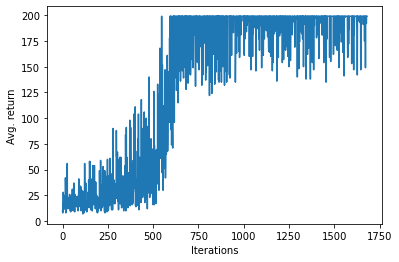

In [260]:
alpha_w, alpha_theta = 1e-6, 6e-4
REINFORCE(alpha_w, alpha_theta, 'with_baseline')